In [192]:
import pandas as pd
# Import
from pandarallel import pandarallel

# Initialization
pandarallel.initialize()
from tqdm import tqdm
tqdm.pandas()
import os
import json
# !pip install pywer
import pywer
# !pip install pyjarowinkler
from pyjarowinkler import distance as jwdistance
from tqdm import tqdm

class Const:
    OCR = 'ocr'
    GROUND = 'groundtruth'
    REGION = 'region'
    LINE = 'line'
    SENTENCE = 'sentence'
    FILE = 'filename'
    DATASET = 'dataset_name'
    PREDICTION = 'prediction'
    PROMPT = 'prompt'
    LANGUAGE = 'language'
    NONE = None


INFO: Pandarallel will run on 24 workers.
INFO: Pandarallel will use Memory file system to transfer data between the main process and workers.


In [4]:
# !pip install pandarallel
# !pip install pywer
# !pip install pyjarowinkler

### Lookup datasets

In [5]:
datasets = []

for type_document in ['ocr', 'htr', 'asr']:
    for root, dirs, files in os.walk(f'../data/datasets/{type_document}/converted'):
        for file in files:
            if file.endswith(".jsonl"):
                input_file = os.path.join(root, file)
                if 'sample' not in input_file:
                    with open(input_file) as f:
                        lines = f.read().splitlines()
                    df_inter = pd.DataFrame(lines)
                    df_inter.columns = ['json_element']
                    df_inter['json_element'].apply(json.loads)
                    df = pd.json_normalize(df_inter['json_element'].apply(json.loads))

                    dataset_name = root.split('/')[-1].replace('_', '-')
                    print(input_file, dataset_name)
                    df['dataset_name'] = [dataset_name] * len(df)
                    if 'ajmc' in dataset_name:
                        df['language'] = ['el'] * len(df)
                    if 'overproof' in dataset_name:
                        df['language'] = ['en'] * len(df)
                    if 'impresso' in dataset_name:
                        df['language'] = ['de'] * len(df)

                    datasets.append(df)
            

../data/datasets/ocr/converted/icdar-2019/icdar-2019.jsonl icdar-2019
../data/datasets/ocr/converted/ajmc-primary/ajmc_primary_text.jsonl ajmc-primary
../data/datasets/ocr/converted/overproof/overproof.jsonl overproof
../data/datasets/ocr/converted/ajmc-mixed/ajmc_mixed.jsonl ajmc-mixed
../data/datasets/ocr/converted/impresso/impresso-nzz.jsonl impresso
../data/datasets/ocr/converted/icdar-2017/icdar-2017.jsonl icdar-2017
../data/datasets/htr/converted/htrec/htrec.jsonl htrec
../data/datasets/asr/converted/ina/ina.jsonl ina


In [6]:
print('Number of unique lines/sentences/regions.\n')
for dataset in datasets:
    print('Dataset:', dataset['dataset_name'].unique()[0], len(dataset), 'with duplicates')
    print('No. lines:', dataset['ocr.line']. nunique(), '/', len(dataset['ocr.sentence']), 
          'No. sentences:', dataset['ocr.sentence']. nunique(), '/', len(dataset['ocr.sentence']), 
          'No. regions:', dataset['ocr.region']. nunique(), '/', len(dataset['ocr.region']))
    print('-'*80)

Number of unique lines/sentences/regions.

Dataset: icdar-2019 404 with duplicates
No. lines: 0 / 404 No. sentences: 404 / 404 No. regions: 41 / 404
--------------------------------------------------------------------------------
Dataset: ajmc-primary 57 with duplicates
No. lines: 40 / 57 No. sentences: 27 / 57 No. regions: 9 / 57
--------------------------------------------------------------------------------
Dataset: overproof 2669 with duplicates
No. lines: 2278 / 2669 No. sentences: 399 / 2669 No. regions: 41 / 2669
--------------------------------------------------------------------------------
Dataset: ajmc-mixed 1291 with duplicates
No. lines: 535 / 1291 No. sentences: 379 / 1291 No. regions: 33 / 1291
--------------------------------------------------------------------------------
Dataset: impresso 1563 with duplicates
No. lines: 1256 / 1563 No. sentences: 577 / 1563 No. regions: 203 / 1563
--------------------------------------------------------------------------------
Dataset

## Step 1: Loading of preliminary results


In [7]:
def read_line_by_line(filename):
    pass

def json_load(text):
    
    try:
        loaded_line = json.loads(text)
    except Exception as ex:
        print(ex)
        print(text[:30], '...')
        loaded_line = 'No text'
    return loaded_line

In [8]:
def get_icdar_2017_lang(filename):
    lang = filename.split('/')[-2].split('_')[0]
    if lang =='eng':
        lang = 'en'
    return lang

In [88]:
import gc; gc.collect()

6

In [94]:
from tqdm import tqdm
import os

results, results_backup = [], []

# First traversal to get count of .jsonl files
jsonl_count = 0
for root, dirs, files in os.walk('../data/output'):
    for file in files:
        if file.endswith(".jsonl"):
            jsonl_count += 1

# Second traversal to do the processing with tqdm progress bar
with tqdm(total=jsonl_count) as pbar:
    for root, dirs, files in os.walk('../data/output'):
        for file in files:
            if file.endswith(".jsonl"):
                input_file = os.path.join(root, file)
                is_few = False
                if 'few' in input_file:
                    prompt = root.split('/')[-2]
                    is_few = True
                else:
                    prompt = root.split('/')[-2]
                    
                if 'sample' not in input_file:
#                     if 'prompt_complex_lang' in input_file:
#                         print(input_file)
#                     prompt = root.split('/')[-2]
                    try:
                        with open(input_file) as f:
                            text = f.read()
                    
                        with open(input_file) as f:
                            lines = f.readlines()
                    except Exception as ex:
                        print('We could not load {} {}'.format(input_file, ex))
                        continue
                    # Check correct lines
                    text = text.replace('\n', '')
                    text_list = text.split('}}{"')
                    json_objects = []

                    for i, t in enumerate(text_list):
                        if i != 0:
                            t = '{"' + t
                        if i != len(text_list) - 1:
                            t = t + '}'
                        if not t.endswith('}}'):
                            json_objects.append(t + '}\n')
                        else:
                            json_objects.append(t + '\n')
                        
                    df_inter = pd.DataFrame(json_objects)
                    df_inter.columns = ['json_element']

                    dataset_name = root.split('/')[-1].replace('_', '-')
                    model_dataset_name = file[8:-6]
                    model_name = model_dataset_name.replace(root.split('/')[-1] + '-', '').strip()
                    try:
                        df_inter['json_element'].apply(lambda x: json_load(x))
                        df = pd.json_normalize(df_inter['json_element'].apply(json.loads))

                        df['model'] = [model_name] * len(df)

                        df['dataset_name'] = [dataset_name] * len(df)
                        df['prompt'] = [prompt] * len(df)
                        try:
                            with open(f'../data/prompts/{prompt}.txt', 'r') as f:
                                prompt_text = f.read()
                            prompt_text = prompt
                        except:
                            prompt_text = 'prompt_complex_03_per_lang'
                            
                        df['prompt_text'] = [prompt_text] * len(df)
                        
                        if is_few:
                            df['type'] = ['few-shot'] * len(df)
                        else:
                            df['type'] = ['zero-shot'] * len(df)

                        df['dataset_name'] = [dataset_name] * len(df)
                        
                        if 'ajmc' in dataset_name:
                            df['language'] = ['el'] * len(df)
                        if 'ina' in dataset_name:
                            df['language'] = ['fr'] * len(df)
                        if 'overproof' in dataset_name:
                            df['language'] = ['en'] * len(df)
                        if 'impresso' in dataset_name:
                            df['language'] = ['de'] * len(df)
                        if 'htrec' in dataset_name:
                            df['language'] = ['el'] * len(df)

#                         print(dataset_name, model_name, prompt)

                        if dataset_name == 'icdar-2017':
                            df['language'] = df['filename'].apply(get_icdar_2017_lang)
                        
                        df['file'] = file
                    
                        results.append(df)
                        results_backup.append(df)
#                         print(df.prompt.unique())
                    except Exception as ex:
                        print('We could not load {} {}'.format(input_file, ex))
                    pbar.update()


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1114/1114 [04:08<00:00,  4.48it/s]


In [107]:
results = results_backup.copy()

In [108]:
results[0].head()

,language,filename,dataset_name,ocr.line,ocr.sentence,ocr.region,groundtruth.line,groundtruth.sentence,groundtruth.region,prediction.prompt,prediction.sentence,prediction.region,model,prompt,prompt_text,type,file
0,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,None,"Charles, par la grace de Dieu, etc.","Charles, par la grace de Dieu, etc. Savoir fai...",None,"Charles, par la grace de Dieu, etc.","Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,/s>Veuillez nous aider à réviser et à corriger...,/s>Veuillez nous aider à réviser et à corriger...,facebook-opt-6.7b,prompt_complex_lang,prompt_complex_03_per_lang,zero-shot,results-icdar-2019-facebook-opt-6.7b.jsonl
1,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,None,"Savoir faisons à touz, presens et avenir, à no...","Charles, par la grace de Dieu, etc. Savoir fai...",None,"Savoir faisons à touz, presens et avenir, à no...","Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,/s>Veuillez nous aider à réviser et à corriger...,/s>Veuillez nous aider à réviser et à corriger...,facebook-opt-6.7b,prompt_complex_lang,prompt_complex_03_per_lang,zero-shot,results-icdar-2019-facebook-opt-6.7b.jsonl
2,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,None,Et avant que le dit Amelin peust sur ce remedi...,"Charles, par la grace de Dieu, etc. Savoir fai...",None,et avant que le dit Amelin peust sur ce remedi...,"Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,/s>Veuillez nous aider à réviser et à corriger...,/s>Veuillez nous aider à réviser et à corriger...,facebook-opt-6.7b,prompt_complex_lang,prompt_complex_03_per_lang,zero-shot,results-icdar-2019-facebook-opt-6.7b.jsonl
3,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,None,linceulz et ii.,"Charles, par la grace de Dieu, etc. Savoir fai...",None,linceulz et n,"Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,/s>Veuillez nous aider à réviser et à corriger...,/s>Veuillez nous aider à réviser et à corriger...,facebook-opt-6.7b,prompt_complex_lang,prompt_complex_03_per_lang,zero-shot,results-icdar-2019-facebook-opt-6.7b.jsonl
4,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,None,"couvertes, et d’ilecques s’en alerent là où bo...","Charles, par la grace de Dieu, etc. Savoir fai...",None,"convertes, et d'ilecques s'en alerent là où bo...","Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,/s>Veuillez nous aider à réviser et à corriger...,/s>Veuillez nous aider à réviser et à corriger...,facebook-opt-6.7b,prompt_complex_lang,prompt_complex_03_per_lang,zero-shot,results-icdar-2019-facebook-opt-6.7b.jsonl


In [109]:
results[0].head()

,language,filename,dataset_name,ocr.line,ocr.sentence,ocr.region,groundtruth.line,groundtruth.sentence,groundtruth.region,prediction.prompt,prediction.sentence,prediction.region,model,prompt,prompt_text,type,file
0,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,None,"Charles, par la grace de Dieu, etc.","Charles, par la grace de Dieu, etc. Savoir fai...",None,"Charles, par la grace de Dieu, etc.","Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,/s>Veuillez nous aider à réviser et à corriger...,/s>Veuillez nous aider à réviser et à corriger...,facebook-opt-6.7b,prompt_complex_lang,prompt_complex_03_per_lang,zero-shot,results-icdar-2019-facebook-opt-6.7b.jsonl
1,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,None,"Savoir faisons à touz, presens et avenir, à no...","Charles, par la grace de Dieu, etc. Savoir fai...",None,"Savoir faisons à touz, presens et avenir, à no...","Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,/s>Veuillez nous aider à réviser et à corriger...,/s>Veuillez nous aider à réviser et à corriger...,facebook-opt-6.7b,prompt_complex_lang,prompt_complex_03_per_lang,zero-shot,results-icdar-2019-facebook-opt-6.7b.jsonl
2,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,None,Et avant que le dit Amelin peust sur ce remedi...,"Charles, par la grace de Dieu, etc. Savoir fai...",None,et avant que le dit Amelin peust sur ce remedi...,"Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,/s>Veuillez nous aider à réviser et à corriger...,/s>Veuillez nous aider à réviser et à corriger...,facebook-opt-6.7b,prompt_complex_lang,prompt_complex_03_per_lang,zero-shot,results-icdar-2019-facebook-opt-6.7b.jsonl
3,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,None,linceulz et ii.,"Charles, par la grace de Dieu, etc. Savoir fai...",None,linceulz et n,"Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,/s>Veuillez nous aider à réviser et à corriger...,/s>Veuillez nous aider à réviser et à corriger...,facebook-opt-6.7b,prompt_complex_lang,prompt_complex_03_per_lang,zero-shot,results-icdar-2019-facebook-opt-6.7b.jsonl
4,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,None,"couvertes, et d’ilecques s’en alerent là où bo...","Charles, par la grace de Dieu, etc. Savoir fai...",None,"convertes, et d'ilecques s'en alerent là où bo...","Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,/s>Veuillez nous aider à réviser et à corriger...,/s>Veuillez nous aider à réviser et à corriger...,facebook-opt-6.7b,prompt_complex_lang,prompt_complex_03_per_lang,zero-shot,results-icdar-2019-facebook-opt-6.7b.jsonl


In [56]:
results[236]

,language,filename,dataset_name,ocr.line,ocr.sentence,ocr.region,groundtruth.line,groundtruth.sentence,groundtruth.region,prediction.prompt,prediction.sentence,prediction.region,model,prompt,prompt_text,type,file
0,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,None,"Charles, par la grace de Dieu, etc.","Charles, par la grace de Dieu, etc. Savoir fai...",None,"Charles, par la grace de Dieu, etc.","Charles, par la grace de Dieu, etc. Savoir fai...",Please assist with reviewing and correcting er...,segment. Do not write anything else than the ...,segment. Do not write anything else than the ...,gpt2,prompt_complex_02,prompt_complex_02,zero-shot,results-icdar-2019-gpt2.jsonl
1,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,None,"Savoir faisons à touz, presens et avenir, à no...","Charles, par la grace de Dieu, etc. Savoir fai...",None,"Savoir faisons à touz, presens et avenir, à no...","Charles, par la grace de Dieu, etc. Savoir fai...",Please assist with reviewing and correcting er...,segment. Do not write anything else than the ...,segment. Do not write anything else than the ...,gpt2,prompt_complex_02,prompt_complex_02,zero-shot,results-icdar-2019-gpt2.jsonl
2,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,None,Et avant que le dit Amelin peust sur ce remedi...,"Charles, par la grace de Dieu, etc. Savoir fai...",None,et avant que le dit Amelin peust sur ce remedi...,"Charles, par la grace de Dieu, etc. Savoir fai...",Please assist with reviewing and correcting er...,segment. Do not write anything else than the ...,segment. Do not write anything else than the ...,gpt2,prompt_complex_02,prompt_complex_02,zero-shot,results-icdar-2019-gpt2.jsonl
3,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,None,linceulz et ii.,"Charles, par la grace de Dieu, etc. Savoir fai...",None,linceulz et n,"Charles, par la grace de Dieu, etc. Savoir fai...",Please assist with reviewing and correcting er...,segment. Do not write anything else than the ...,segment. Do not write anything else than the ...,gpt2,prompt_complex_02,prompt_complex_02,zero-shot,results-icdar-2019-gpt2.jsonl
4,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,None,"couvertes, et d’ilecques s’en alerent là où bo...","Charles, par la grace de Dieu, etc. Savoir fai...",None,"convertes, et d'ilecques s'en alerent là où bo...","Charles, par la grace de Dieu, etc. Savoir fai...",Please assist with reviewing and correcting er...,segment. Do not write anything else than the ...,segment. Do not write anything else than the ...,gpt2,prompt_complex_02,prompt_complex_02,zero-shot,results-icdar-2019-gpt2.jsonl
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
399,de,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,None,"ganiſations- und Neuerungsſucht, Centraliſiren...","donnert und große DBinge thut, und dod nicht e...",None,"ganifationg. 1md teuernungsfuüucht, Centfralif...","donnert und große Dinge thut, und doch nicht e...",Please assist with reviewing and correcting er...,segment. Do not write anything else than the ...,segment. Do not write anything else than the ...,gpt2,prompt_complex_02,prompt_complex_02,zero-shot,results-icdar-2019-gpt2.jsonl
400,de,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,None,Soſchon die feige Zeit in Angſt und Zittern ſe...,"donnert und große DBinge thut, und dod nicht e...",None,— ©Gu fcpon die feige 3eit in Qlngfe unbd Gitt...,"donnert und große Dinge thut, und doch nicht e...",Please assist with reviewing and correcting er...,segment. Do not write anything else than the ...,segment. Do not write anything else than the ...,gpt2,prompt_complex_02,prompt_complex_02,zero-shot,results-icdar-2019-gpt2.jsonl
401,de,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,None,"Als damals der Bundestaggethan, der Jntoleranz...","donnert und große DBinge thut, und dod nicht e...",None,"18 damalg dev Bundestag getgan , bder Sutolera.

In [209]:
def count_tokens(text):
    return len(text.split(' '))

for idx, result in tqdm(enumerate(results), total=len(results)):
    try:
        results[idx] = results[idx].fillna('No text')
    except:
        print(idx)
        pass
    
    try:
        results[idx]['model'] = results[idx]['model'].apply(lambda x: MODEL_MAP[x])
    except:
        print("Models already mapped.")
        
    dataset_name = results[idx]['dataset_name'].unique()[0]
    model_name = results[idx]['model'].unique()[0]
    prompt = results[idx]['prompt'].unique()[0]
    prompt_text = results[idx]['prompt_text'].unique()[0]
    run_type = results[idx]['type'].unique()[0]
    
    print('Dataset:', dataset_name, 'Model:', model_name, 'Prompt:', prompt, 'Prompt text:', prompt_text)
    
    if 'icdar' in dataset_name:
        text_types = ['sentence', 'region']
    else:
        text_types = ['line', 'sentence', 'region']
    for segment_type in text_types:
        
        results[idx]['length2'] = results[idx][f'prediction.{segment_type}'].apply(count_tokens)
        results[idx] = results[idx][results[idx]['length2'] > 0]
#         print('prediction', len(results[idx][results[idx]['length2'] < 2]))
    
        results[idx]['length3'] = results[idx][f'ocr.{segment_type}'].apply(count_tokens)
        results[idx] = results[idx][results[idx]['length3'] > 0]
#         print('ocr', len(results[idx][results[idx]['length3'] < 2]))
        
        results[idx]['length3'] = results[idx][f'groundtruth.{segment_type}'].apply(count_tokens)
        results[idx] = results[idx][results[idx]['length3'] > 0]
#         print('ocr', len(results[idx][results[idx]['length3'] < 2]))
    
        if len(results[idx]) == 0:
            import pdb;pdb.set_trace()

  0%|▍                                                                                                                                                                                                                                                 | 2/1114 [00:00<01:19, 14.04it/s]

0
Models already mapped.
Dataset: icdar-2019 Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
1
Models already mapped.
Dataset: icdar-2019 Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
2
Models already mapped.
Dataset: icdar-2019 Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
3
Models already mapped.
Dataset: icdar-2019 Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  1%|█▋                                                                                                                                                                                                                                                | 8/1114 [00:00<00:54, 20.33it/s]

4
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
5
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
6
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
7
Models already mapped.
Dataset: icdar-2019 Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
8
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  1%|██▍                                                                                                                                                                                                                                              | 11/1114 [00:00<00:54, 20.39it/s]

9
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
10
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
11
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
12
Models already mapped.
Dataset: icdar-2019 Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
13
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  2%|████▌                                                                                                                                                                                                                                            | 21/1114 [00:00<00:32, 33.45it/s]

14
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
15
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
16
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
17
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
18
Models already mapped.
Dataset: ajmc-primary-text Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
19
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
20
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
21
Models already mapped.
Dataset:

  3%|██████                                                                                                                                                                                                                                           | 28/1114 [00:00<00:25, 42.99it/s]

Models already mapped.
Dataset: overproof Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: overproof Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: overproof Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: overproof Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: overproof Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  3%|███████▏                                                                                                                                                                                                                                         | 33/1114 [00:03<02:37,  6.86it/s]

Models already mapped.
Dataset: overproof Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: overproof Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: overproof Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: overproof Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  3%|████████                                                                                                                                                                                                                                         | 37/1114 [00:04<03:32,  5.07it/s]

Models already mapped.
Dataset: overproof Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: overproof Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: overproof Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  4%|████████▋                                                                                                                                                                                                                                        | 40/1114 [00:05<04:22,  4.10it/s]

Models already mapped.
Dataset: overproof Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: overproof Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  4%|█████████                                                                                                                                                                                                                                        | 42/1114 [00:06<05:03,  3.53it/s]

Models already mapped.
Dataset: impresso-nzz Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  4%|█████████▌                                                                                                                                                                                                                                       | 44/1114 [00:06<04:32,  3.93it/s]

Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: impresso-nzz Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  4%|██████████▏                                                                                                                                                                                                                                      | 47/1114 [00:07<03:50,  4.64it/s]

Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: impresso-nzz Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  4%|██████████▌                                                                                                                                                                                                                                      | 49/1114 [00:07<03:28,  5.10it/s]

Models already mapped.
Dataset: impresso-nzz Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: impresso-nzz Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  5%|███████████                                                                                                                                                                                                                                      | 51/1114 [00:07<03:05,  5.72it/s]

Models already mapped.
Dataset: impresso-nzz Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  5%|███████████▍                                                                                                                                                                                                                                     | 53/1114 [00:08<02:56,  6.01it/s]

Models already mapped.
Dataset: impresso-nzz Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  5%|███████████▉                                                                                                                                                                                                                                     | 55/1114 [00:08<02:35,  6.81it/s]

Models already mapped.
Dataset: impresso-nzz Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: impresso-nzz Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  5%|████████████▎                                                                                                                                                                                                                                    | 57/1114 [00:08<02:44,  6.41it/s]

Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: ajmc-mixed Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  5%|████████████▊                                                                                                                                                                                                                                    | 59/1114 [00:08<02:31,  6.97it/s]

Models already mapped.
Dataset: ajmc-mixed Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: ajmc-mixed Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  5%|█████████████▏                                                                                                                                                                                                                                   | 61/1114 [00:09<02:18,  7.62it/s]

Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  6%|█████████████▋                                                                                                                                                                                                                                   | 63/1114 [00:09<02:22,  7.38it/s]

Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  6%|██████████████                                                                                                                                                                                                                                   | 65/1114 [00:09<02:09,  8.12it/s]

Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  6%|██████████████▍                                                                                                                                                                                                                                  | 67/1114 [00:09<01:43, 10.12it/s]

Models already mapped.
Dataset: ajmc-mixed Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: ajmc-mixed Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  6%|███████████████▏                                                                                                                                                                                                                                 | 70/1114 [00:10<01:54,  9.11it/s]

Models already mapped.
Dataset: ajmc-mixed Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: ina Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  6%|███████████████▎                                                                                                                                                                                                                                 | 71/1114 [00:10<03:52,  4.48it/s]

Models already mapped.
Dataset: ina Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  6%|███████████████▌                                                                                                                                                                                                                                 | 72/1114 [00:11<05:03,  3.43it/s]

Models already mapped.
Dataset: ina Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  7%|███████████████▊                                                                                                                                                                                                                                 | 73/1114 [00:11<05:52,  2.96it/s]

Models already mapped.
Dataset: ina Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  7%|████████████████                                                                                                                                                                                                                                 | 74/1114 [00:12<06:53,  2.52it/s]

Models already mapped.
Dataset: ina Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  7%|████████████████▏                                                                                                                                                                                                                                | 75/1114 [00:12<07:19,  2.36it/s]

Models already mapped.
Dataset: ina Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  7%|████████████████▍                                                                                                                                                                                                                                | 76/1114 [00:13<07:46,  2.23it/s]

Models already mapped.
Dataset: ina Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  7%|████████████████▋                                                                                                                                                                                                                                | 77/1114 [00:13<08:01,  2.15it/s]

Models already mapped.
Dataset: ina Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  7%|████████████████▊                                                                                                                                                                                                                                | 78/1114 [00:14<08:04,  2.14it/s]

Models already mapped.
Dataset: ina Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  7%|█████████████████                                                                                                                                                                                                                                | 79/1114 [00:14<08:30,  2.03it/s]

Models already mapped.
Dataset: ina Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  7%|█████████████████▎                                                                                                                                                                                                                               | 80/1114 [00:15<08:53,  1.94it/s]

Models already mapped.
Dataset: ina Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  7%|█████████████████▌                                                                                                                                                                                                                               | 81/1114 [00:15<08:51,  1.95it/s]

Models already mapped.
Dataset: ina Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  7%|█████████████████▋                                                                                                                                                                                                                               | 82/1114 [00:16<08:42,  1.97it/s]

Models already mapped.
Dataset: ina Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  7%|█████████████████▉                                                                                                                                                                                                                               | 83/1114 [00:16<08:41,  1.98it/s]

Models already mapped.
Dataset: ina Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  8%|██████████████████▌                                                                                                                                                                                                                              | 86/1114 [00:17<05:13,  3.28it/s]

Models already mapped.
Dataset: icdar-2017 Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: icdar-2017 Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  8%|███████████████████▍                                                                                                                                                                                                                             | 90/1114 [00:17<02:36,  6.54it/s]

Models already mapped.
Dataset: icdar-2017 Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: icdar-2017 Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: icdar-2017 Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: icdar-2017 Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  8%|████████████████████▎                                                                                                                                                                                                                            | 94/1114 [00:18<01:45,  9.68it/s]

Models already mapped.
Dataset: icdar-2017 Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: icdar-2017 Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: icdar-2017 Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  9%|█████████████████████▏                                                                                                                                                                                                                           | 98/1114 [00:18<01:22, 12.27it/s]

Models already mapped.
Dataset: icdar-2017 Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: htrec Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: htrec Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: htrec Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  9%|██████████████████████▌                                                                                                                                                                                                                         | 105/1114 [00:18<00:49, 20.23it/s]

Models already mapped.
Dataset: htrec Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: htrec Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: htrec Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: htrec Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: htrec Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: htrec Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: htrec Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 10%|████████████████████████▏                                                                                                                                                                                                                       | 112/1114 [00:18<00:40, 24.86it/s]

Models already mapped.
Dataset: htrec Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: htrec Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: htrec Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: htrec Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: icdar-2019 Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2019 Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 11%|█████████████████████████▍                                                                                                                                                                                                                      | 118/1114 [00:19<00:42, 23.67it/s]

Models already mapped.
Dataset: icdar-2019 Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2019 Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2019 Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 11%|██████████████████████████                                                                                                                                                                                                                      | 121/1114 [00:19<00:44, 22.25it/s]

Models already mapped.
Dataset: icdar-2019 Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 12%|████████████████████████████▊                                                                                                                                                                                                                   | 134/1114 [00:19<00:28, 34.83it/s]

Models already mapped.
Dataset: icdar-2019 Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: ajmc-primary-text Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: ajmc-primary-text Model: BLO

 13%|██████████████████████████████▍                                                                                                                                                                                                                 | 141/1114 [00:20<00:45, 21.51it/s]

Models already mapped.
Dataset: overproof Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: overproof Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: overproof Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: overproof Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 13%|███████████████████████████████▏                                                                                                                                                                                                                | 145/1114 [00:21<02:06,  7.65it/s]

Models already mapped.
Dataset: overproof Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: overproof Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: overproof Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 13%|███████████████████████████████▉                                                                                                                                                                                                                | 148/1114 [00:22<03:02,  5.30it/s]

Models already mapped.
Dataset: overproof Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: overproof Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 13%|████████████████████████████████▎                                                                                                                                                                                                               | 150/1114 [00:23<03:28,  4.62it/s]

Models already mapped.
Dataset: overproof Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: overproof Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 14%|████████████████████████████████▋                                                                                                                                                                                                               | 152/1114 [00:24<04:06,  3.91it/s]

Models already mapped.
Dataset: overproof Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 14%|████████████████████████████████▉                                                                                                                                                                                                               | 153/1114 [00:24<04:32,  3.53it/s]

Models already mapped.
Dataset: overproof Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 14%|█████████████████████████████████▍                                                                                                                                                                                                              | 155/1114 [00:25<04:21,  3.67it/s]

Models already mapped.
Dataset: impresso-nzz Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 14%|█████████████████████████████████▌                                                                                                                                                                                                              | 156/1114 [00:25<03:52,  4.13it/s]

Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: impresso-nzz Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 14%|██████████████████████████████████▍                                                                                                                                                                                                             | 160/1114 [00:25<02:36,  6.08it/s]

Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: impresso-nzz Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 14%|██████████████████████████████████▋                                                                                                                                                                                                             | 161/1114 [00:26<02:28,  6.44it/s]

Models already mapped.
Dataset: impresso-nzz Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: impresso-nzz Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 15%|███████████████████████████████████                                                                                                                                                                                                             | 163/1114 [00:26<02:12,  7.20it/s]

Models already mapped.
Dataset: impresso-nzz Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 15%|███████████████████████████████████▌                                                                                                                                                                                                            | 165/1114 [00:26<02:02,  7.72it/s]

Models already mapped.
Dataset: impresso-nzz Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 15%|███████████████████████████████████▉                                                                                                                                                                                                            | 167/1114 [00:26<01:59,  7.93it/s]

Models already mapped.
Dataset: impresso-nzz Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: impresso-nzz Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 15%|████████████████████████████████████▌                                                                                                                                                                                                           | 170/1114 [00:27<01:50,  8.55it/s]

Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: ajmc-mixed Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 15%|█████████████████████████████████████                                                                                                                                                                                                           | 172/1114 [00:27<01:45,  8.94it/s]

Models already mapped.
Dataset: ajmc-mixed Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: ajmc-mixed Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 16%|█████████████████████████████████████▍                                                                                                                                                                                                          | 174/1114 [00:27<01:37,  9.65it/s]

Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 16%|██████████████████████████████████████▏                                                                                                                                                                                                         | 177/1114 [00:27<01:32, 10.16it/s]

Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 16%|██████████████████████████████████████▌                                                                                                                                                                                                         | 179/1114 [00:27<01:29, 10.47it/s]

Models already mapped.
Dataset: ajmc-mixed Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: ajmc-mixed Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 16%|██████████████████████████████████████▉                                                                                                                                                                                                         | 181/1114 [00:28<01:29, 10.44it/s]

Models already mapped.
Dataset: ajmc-mixed Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: ina Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 16%|███████████████████████████████████████▍                                                                                                                                                                                                        | 183/1114 [00:28<02:47,  5.55it/s]

Models already mapped.
Dataset: ina Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 17%|███████████████████████████████████████▋                                                                                                                                                                                                        | 184/1114 [00:29<03:40,  4.22it/s]

Models already mapped.
Dataset: ina Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 17%|███████████████████████████████████████▊                                                                                                                                                                                                        | 185/1114 [00:29<04:30,  3.43it/s]

Models already mapped.
Dataset: ina Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 17%|████████████████████████████████████████                                                                                                                                                                                                        | 186/1114 [00:30<05:25,  2.85it/s]

Models already mapped.
Dataset: ina Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 17%|████████████████████████████████████████▎                                                                                                                                                                                                       | 187/1114 [00:30<05:59,  2.58it/s]

Models already mapped.
Dataset: ina Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 17%|████████████████████████████████████████▌                                                                                                                                                                                                       | 188/1114 [00:31<06:29,  2.38it/s]

Models already mapped.
Dataset: ina Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 17%|████████████████████████████████████████▋                                                                                                                                                                                                       | 189/1114 [00:31<06:57,  2.22it/s]

Models already mapped.
Dataset: ina Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 17%|████████████████████████████████████████▉                                                                                                                                                                                                       | 190/1114 [00:32<07:21,  2.09it/s]

Models already mapped.
Dataset: ina Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 17%|█████████████████████████████████████████▏                                                                                                                                                                                                      | 191/1114 [00:33<07:40,  2.01it/s]

Models already mapped.
Dataset: ina Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 17%|█████████████████████████████████████████▎                                                                                                                                                                                                      | 192/1114 [00:33<07:40,  2.00it/s]

Models already mapped.
Dataset: ina Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 17%|█████████████████████████████████████████▌                                                                                                                                                                                                      | 193/1114 [00:33<07:29,  2.05it/s]

Models already mapped.
Dataset: ina Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 17%|█████████████████████████████████████████▊                                                                                                                                                                                                      | 194/1114 [00:34<07:31,  2.04it/s]

Models already mapped.
Dataset: ina Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 18%|██████████████████████████████████████████                                                                                                                                                                                                      | 195/1114 [00:34<07:21,  2.08it/s]

Models already mapped.
Dataset: ina Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 18%|██████████████████████████████████████████▋                                                                                                                                                                                                     | 198/1114 [00:35<04:22,  3.49it/s]

Models already mapped.
Dataset: icdar-2017 Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2017 Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 18%|███████████████████████████████████████████▌                                                                                                                                                                                                    | 202/1114 [00:35<02:14,  6.80it/s]

Models already mapped.
Dataset: icdar-2017 Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2017 Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2017 Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2017 Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 18%|████████████████████████████████████████████▍                                                                                                                                                                                                   | 206/1114 [00:36<01:28, 10.27it/s]

Models already mapped.
Dataset: icdar-2017 Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2017 Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2017 Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 19%|█████████████████████████████████████████████▏                                                                                                                                                                                                  | 210/1114 [00:36<01:09, 12.93it/s]

Models already mapped.
Dataset: icdar-2017 Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: htrec Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: htrec Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: htrec Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 20%|██████████████████████████████████████████████▉                                                                                                                                                                                                 | 218/1114 [00:36<00:39, 22.66it/s]

Models already mapped.
Dataset: htrec Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: htrec Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: htrec Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: htrec Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: htrec Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: htrec Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: htrec Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 20%|████████████████████████████████████████████████▍                                                                                                                                                                                               | 225/1114 [00:36<00:34, 25.80it/s]

Models already mapped.
Dataset: htrec Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: htrec Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: htrec Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: htrec Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2019 Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2019 Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 20%|█████████████████████████████████████████████████                                                                                                                                                                                               | 228/1114 [00:36<00:36, 24.00it/s]

Models already mapped.
Dataset: icdar-2019 Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2019 Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.


 21%|█████████████████████████████████████████████████▊                                                                                                                                                                                              | 231/1114 [00:37<00:39, 22.34it/s]

Dataset: icdar-2019 Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 21%|███████████████████████████████████████████████████                                                                                                                                                                                             | 237/1114 [00:37<00:43, 20.39it/s]

Models already mapped.
Dataset: icdar-2019 Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2019 Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 22%|█████████████████████████████████████████████████████▊                                                                                                                                                                                          | 250/1114 [00:37<00:22, 38.43it/s]

Models already mapped.
Dataset: ajmc-primary-text Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-primary-text Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-primary-text Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models alr

 23%|██████████████████████████████████████████████████████▉                                                                                                                                                                                         | 255/1114 [00:38<01:24, 10.11it/s]

Models already mapped.
Dataset: overproof Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: overproof Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: overproof Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: overproof Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 23%|███████████████████████████████████████████████████████▊                                                                                                                                                                                        | 259/1114 [00:40<02:38,  5.40it/s]

Models already mapped.
Dataset: overproof Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: overproof Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: overproof Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 24%|████████████████████████████████████████████████████████▍                                                                                                                                                                                       | 262/1114 [00:41<03:16,  4.34it/s]

Models already mapped.
Dataset: overproof Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: overproof Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 24%|████████████████████████████████████████████████████████▉                                                                                                                                                                                       | 264/1114 [00:42<03:39,  3.87it/s]

Models already mapped.
Dataset: overproof Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: overproof Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 24%|█████████████████████████████████████████████████████████▌                                                                                                                                                                                      | 267/1114 [00:43<03:55,  3.60it/s]

Models already mapped.
Dataset: impresso-nzz Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 24%|█████████████████████████████████████████████████████████▉                                                                                                                                                                                      | 269/1114 [00:43<03:18,  4.26it/s]

Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: impresso-nzz Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 24%|██████████████████████████████████████████████████████████▍                                                                                                                                                                                     | 271/1114 [00:44<02:41,  5.23it/s]

Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: impresso-nzz Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 25%|██████████████████████████████████████████████████████████▊                                                                                                                                                                                     | 273/1114 [00:44<02:20,  5.97it/s]

Models already mapped.
Dataset: impresso-nzz Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: impresso-nzz Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 25%|███████████████████████████████████████████████████████████▏                                                                                                                                                                                    | 275/1114 [00:44<02:00,  6.95it/s]

Models already mapped.
Dataset: impresso-nzz Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 25%|███████████████████████████████████████████████████████████▋                                                                                                                                                                                    | 277/1114 [00:44<01:54,  7.31it/s]

Models already mapped.
Dataset: impresso-nzz Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 25%|████████████████████████████████████████████████████████████                                                                                                                                                                                    | 279/1114 [00:45<01:44,  8.02it/s]

Models already mapped.
Dataset: impresso-nzz Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: impresso-nzz Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 25%|████████████████████████████████████████████████████████████▌                                                                                                                                                                                   | 281/1114 [00:45<01:40,  8.26it/s]

Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-mixed Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 25%|█████████████████████████████████████████████████████████████▏                                                                                                                                                                                  | 284/1114 [00:45<01:33,  8.88it/s]

Models already mapped.
Dataset: ajmc-mixed Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-mixed Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 26%|█████████████████████████████████████████████████████████████▌                                                                                                                                                                                  | 286/1114 [00:45<01:30,  9.15it/s]

Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 26%|█████████████████████████████████████████████████████████████▊                                                                                                                                                                                  | 287/1114 [00:46<01:30,  9.10it/s]

Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 26%|██████████████████████████████████████████████████████████████▋                                                                                                                                                                                 | 291/1114 [00:46<01:15, 10.84it/s]

Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-mixed Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 26%|███████████████████████████████████████████████████████████████                                                                                                                                                                                 | 293/1114 [00:46<01:19, 10.27it/s]

Models already mapped.
Dataset: ajmc-mixed Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-mixed Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ina Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 26%|███████████████████████████████████████████████████████████████▌                                                                                                                                                                                | 295/1114 [00:47<02:22,  5.76it/s]

Models already mapped.
Dataset: ina Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 27%|███████████████████████████████████████████████████████████████▊                                                                                                                                                                                | 296/1114 [00:47<03:08,  4.34it/s]

Models already mapped.
Dataset: ina Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 27%|███████████████████████████████████████████████████████████████▉                                                                                                                                                                                | 297/1114 [00:48<04:05,  3.32it/s]

Models already mapped.
Dataset: ina Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 27%|████████████████████████████████████████████████████████████████▏                                                                                                                                                                               | 298/1114 [00:48<04:50,  2.81it/s]

Models already mapped.
Dataset: ina Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 27%|████████████████████████████████████████████████████████████████▍                                                                                                                                                                               | 299/1114 [00:49<05:15,  2.58it/s]

Models already mapped.
Dataset: ina Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 27%|████████████████████████████████████████████████████████████████▋                                                                                                                                                                               | 300/1114 [00:49<05:37,  2.41it/s]

Models already mapped.
Dataset: ina Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 27%|████████████████████████████████████████████████████████████████▊                                                                                                                                                                               | 301/1114 [00:50<05:55,  2.29it/s]

Models already mapped.
Dataset: ina Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 27%|█████████████████████████████████████████████████████████████████                                                                                                                                                                               | 302/1114 [00:50<06:19,  2.14it/s]

Models already mapped.
Dataset: ina Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 27%|█████████████████████████████████████████████████████████████████▎                                                                                                                                                                              | 303/1114 [00:51<06:38,  2.03it/s]

Models already mapped.
Dataset: ina Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 27%|█████████████████████████████████████████████████████████████████▍                                                                                                                                                                              | 304/1114 [00:51<06:38,  2.03it/s]

Models already mapped.
Dataset: ina Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 27%|█████████████████████████████████████████████████████████████████▋                                                                                                                                                                              | 305/1114 [00:52<06:39,  2.03it/s]

Models already mapped.
Dataset: ina Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 27%|█████████████████████████████████████████████████████████████████▉                                                                                                                                                                              | 306/1114 [00:52<06:41,  2.01it/s]

Models already mapped.
Dataset: ina Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 28%|██████████████████████████████████████████████████████████████████▏                                                                                                                                                                             | 307/1114 [00:53<06:39,  2.02it/s]

Models already mapped.
Dataset: ina Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 28%|██████████████████████████████████████████████████████████████████▊                                                                                                                                                                             | 310/1114 [00:54<03:59,  3.36it/s]

Models already mapped.
Dataset: icdar-2017 Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2017 Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 28%|███████████████████████████████████████████████████████████████████▋                                                                                                                                                                            | 314/1114 [00:54<02:01,  6.57it/s]

Models already mapped.
Dataset: icdar-2017 Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2017 Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2017 Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2017 Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 29%|████████████████████████████████████████████████████████████████████▌                                                                                                                                                                           | 318/1114 [00:54<01:21,  9.71it/s]

Models already mapped.
Dataset: icdar-2017 Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2017 Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2017 Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 29%|█████████████████████████████████████████████████████████████████████▎                                                                                                                                                                          | 322/1114 [00:54<01:06, 11.84it/s]

Models already mapped.
Dataset: icdar-2017 Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: htrec Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: htrec Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 30%|███████████████████████████████████████████████████████████████████████                                                                                                                                                                         | 330/1114 [00:55<00:37, 20.96it/s]

Models already mapped.
Dataset: htrec Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: htrec Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: htrec Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: htrec Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: htrec Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: htrec Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: htrec Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 30%|████████████████████████████████████████████████████████████████████████▌                                                                                                                                                                       | 337/1114 [00:55<00:31, 24.90it/s]

Models already mapped.
Dataset: htrec Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: htrec Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: htrec Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: htrec Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: htrec Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2019 Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 31%|█████████████████████████████████████████████████████████████████████████▏                                                                                                                                                                      | 340/1114 [00:55<00:35, 21.68it/s]

Models already mapped.
Dataset: icdar-2019 Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: icdar-2019 Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 31%|█████████████████████████████████████████████████████████████████████████▉                                                                                                                                                                      | 343/1114 [00:55<00:37, 20.61it/s]

Models already mapped.
Dataset: icdar-2019 Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 31%|██████████████████████████████████████████████████████████████████████████▌                                                                                                                                                                     | 346/1114 [00:55<00:40, 18.82it/s]

Models already mapped.
Dataset: icdar-2019 Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: icdar-2019 Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 32%|████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                                   | 354/1114 [00:56<00:30, 24.84it/s]

Models already mapped.
Dataset: icdar-2019 Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: ajmc-primary-text Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-560M Prom

 32%|█████████████████████████████████████████████████████████████████████████████▊                                                                                                                                                                  | 361/1114 [00:56<00:21, 34.85it/s]

Models already mapped.
Dataset: ajmc-primary-text Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: ajmc-primary-text Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: overproof Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 33%|██████████████████████████████████████████████████████████████████████████████▋                                                                                                                                                                 | 365/1114 [00:56<00:53, 14.12it/s]

Models already mapped.
Dataset: overproof Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: overproof Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: overproof Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 33%|███████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                                | 368/1114 [00:58<02:01,  6.13it/s]

Models already mapped.
Dataset: overproof Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: overproof Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: overproof Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 33%|███████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                                | 371/1114 [01:00<04:00,  3.09it/s]

Models already mapped.
Dataset: overproof Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: overproof Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 33%|████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                               | 373/1114 [01:01<04:33,  2.71it/s]

Models already mapped.
Dataset: overproof Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: overproof Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 34%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                                               | 375/1114 [01:03<05:08,  2.40it/s]

Models already mapped.
Dataset: overproof Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 34%|█████████████████████████████████████████████████████████████████████████████████                                                                                                                                                               | 376/1114 [01:03<05:13,  2.35it/s]

Models already mapped.
Dataset: overproof Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 34%|█████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                                              | 377/1114 [01:04<05:51,  2.10it/s]

Models already mapped.
Dataset: overproof Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 34%|█████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                                              | 379/1114 [01:04<04:53,  2.50it/s]

Models already mapped.
Dataset: impresso-nzz Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: impresso-nzz Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 34%|██████████████████████████████████████████████████████████████████████████████████                                                                                                                                                              | 381/1114 [01:05<03:31,  3.47it/s]

Models already mapped.
Dataset: impresso-nzz Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 34%|██████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                                             | 383/1114 [01:05<02:40,  4.55it/s]

Models already mapped.
Dataset: impresso-nzz Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: impresso-nzz Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 35%|██████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                             | 385/1114 [01:05<02:12,  5.50it/s]

Models already mapped.
Dataset: impresso-nzz Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 35%|███████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                            | 387/1114 [01:06<01:44,  6.94it/s]

Models already mapped.
Dataset: impresso-nzz Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: impresso-nzz Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 35%|███████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                                            | 389/1114 [01:06<01:41,  7.15it/s]

Models already mapped.
Dataset: impresso-nzz Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 35%|████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                                           | 391/1114 [01:06<01:36,  7.48it/s]

Models already mapped.
Dataset: impresso-nzz Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 35%|████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                           | 392/1114 [01:06<01:29,  8.04it/s]

Models already mapped.
Dataset: ajmc-mixed Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 35%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                                                           | 395/1114 [01:07<01:31,  7.89it/s]

Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 36%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                                          | 397/1114 [01:07<01:30,  7.95it/s]

Models already mapped.
Dataset: ajmc-mixed Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 36%|██████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                                         | 400/1114 [01:07<01:17,  9.21it/s]

Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 36%|██████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                                         | 402/1114 [01:07<01:13,  9.75it/s]

Models already mapped.
Dataset: ajmc-mixed Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: ajmc-mixed Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 36%|███████████████████████████████████████████████████████████████████████████████████████                                                                                                                                                         | 404/1114 [01:08<01:21,  8.68it/s]

Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: ajmc-mixed Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 36%|███████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                        | 406/1114 [01:08<01:25,  8.31it/s]

Models already mapped.
Dataset: ajmc-mixed Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: ina Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 37%|███████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                                        | 407/1114 [01:08<02:36,  4.51it/s]

Models already mapped.
Dataset: ina Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 37%|███████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                        | 408/1114 [01:09<03:30,  3.35it/s]

Models already mapped.
Dataset: ina Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 37%|████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                                        | 409/1114 [01:09<04:21,  2.69it/s]

Models already mapped.
Dataset: ina Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 37%|████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                       | 410/1114 [01:10<04:45,  2.46it/s]

Models already mapped.
Dataset: ina Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 37%|████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                                       | 411/1114 [01:10<05:04,  2.31it/s]

Models already mapped.
Dataset: ina Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 37%|████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                                       | 412/1114 [01:11<05:15,  2.23it/s]

Models already mapped.
Dataset: ina Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 37%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                       | 413/1114 [01:11<05:43,  2.04it/s]

Models already mapped.
Dataset: ina Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 37%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                                      | 414/1114 [01:12<05:43,  2.04it/s]

Models already mapped.
Dataset: ina Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 37%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                      | 415/1114 [01:12<05:56,  1.96it/s]

Models already mapped.
Dataset: ina Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 37%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                                      | 416/1114 [01:13<05:54,  1.97it/s]

Models already mapped.
Dataset: ina Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 37%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                                      | 417/1114 [01:13<05:52,  1.98it/s]

Models already mapped.
Dataset: ina Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 38%|██████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                                      | 418/1114 [01:14<06:00,  1.93it/s]

Models already mapped.
Dataset: ina Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 38%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                     | 419/1114 [01:15<06:06,  1.90it/s]

Models already mapped.
Dataset: ina Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 38%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                     | 422/1114 [01:15<03:42,  3.11it/s]

Models already mapped.
Dataset: icdar-2017 Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 38%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                                    | 426/1114 [01:16<01:56,  5.93it/s]

Models already mapped.
Dataset: icdar-2017 Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: icdar-2017 Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: icdar-2017 Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 38%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                                   | 428/1114 [01:16<01:31,  7.49it/s]

Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: icdar-2017 Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: icdar-2017 Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: icdar-2017 Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 39%|█████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                                   | 432/1114 [01:16<01:14,  9.11it/s]

Models already mapped.
Dataset: icdar-2017 Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: icdar-2017 Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 39%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                                  | 434/1114 [01:16<01:07, 10.14it/s]

Models already mapped.
Dataset: icdar-2017 Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: htrec Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: htrec Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 40%|███████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                                 | 441/1114 [01:16<00:37, 18.18it/s]

Models already mapped.
Dataset: htrec Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: htrec Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: htrec Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: htrec Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: htrec Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: htrec Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: htrec Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 40%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                               | 449/1114 [01:17<00:27, 23.89it/s]

Models already mapped.
Dataset: htrec Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: htrec Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: htrec Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: htrec Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: htrec Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Models already mapped.
Dataset: icdar-2019 Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 41%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                              | 452/1114 [01:17<00:30, 21.51it/s]

Models already mapped.
Dataset: icdar-2019 Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2019 Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 41%|██████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                              | 455/1114 [01:17<00:31, 20.78it/s]

Models already mapped.
Dataset: icdar-2019 Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 41%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                             | 458/1114 [01:17<00:34, 19.29it/s]

Models already mapped.
Dataset: icdar-2019 Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2019 Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 42%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                           | 466/1114 [01:17<00:25, 25.49it/s]

Models already mapped.
Dataset: icdar-2019 Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: ajmc-primary-text Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: ajmc-primary-text Model:

 42%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                          | 473/1114 [01:18<00:18, 34.74it/s]

Models already mapped.
Dataset: ajmc-primary-text Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: ajmc-primary-text Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: overproof Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 43%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                         | 477/1114 [01:18<00:38, 16.48it/s]

Models already mapped.
Dataset: overproof Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: overproof Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: overproof Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 43%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                        | 480/1114 [01:19<01:34,  6.73it/s]

Models already mapped.
Dataset: overproof Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: overproof Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: overproof Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 43%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                        | 483/1114 [01:21<02:26,  4.30it/s]

Models already mapped.
Dataset: overproof Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: overproof Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 44%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                       | 485/1114 [01:22<02:59,  3.51it/s]

Models already mapped.
Dataset: overproof Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: overproof Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 44%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                       | 487/1114 [01:23<03:26,  3.04it/s]

Models already mapped.
Dataset: overproof Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 44%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                      | 488/1114 [01:23<03:33,  2.94it/s]

Models already mapped.
Dataset: overproof Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 44%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                      | 489/1114 [01:24<04:06,  2.54it/s]

Models already mapped.
Dataset: overproof Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 44%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                      | 491/1114 [01:25<03:34,  2.91it/s]

Models already mapped.
Dataset: impresso-nzz Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: impresso-nzz Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 44%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                     | 493/1114 [01:25<02:43,  3.79it/s]

Models already mapped.
Dataset: impresso-nzz Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 44%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                     | 495/1114 [01:25<02:08,  4.83it/s]

Models already mapped.
Dataset: impresso-nzz Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: impresso-nzz Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 45%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                     | 497/1114 [01:26<01:57,  5.26it/s]

Models already mapped.
Dataset: impresso-nzz Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 45%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                    | 499/1114 [01:26<01:30,  6.78it/s]

Models already mapped.
Dataset: impresso-nzz Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: impresso-nzz Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 45%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                    | 501/1114 [01:26<01:40,  6.11it/s]

Models already mapped.
Dataset: impresso-nzz Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 45%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                   | 503/1114 [01:26<01:26,  7.04it/s]

Models already mapped.
Dataset: impresso-nzz Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 45%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                   | 505/1114 [01:27<01:15,  8.12it/s]

Models already mapped.
Dataset: ajmc-mixed Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 46%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                  | 507/1114 [01:27<01:19,  7.63it/s]

Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 46%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                  | 509/1114 [01:27<01:23,  7.26it/s]

Models already mapped.
Dataset: ajmc-mixed Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 46%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                  | 511/1114 [01:27<01:25,  7.05it/s]

Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 46%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                 | 513/1114 [01:28<01:17,  7.77it/s]

Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: ajmc-mixed Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 46%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                 | 515/1114 [01:28<01:14,  8.07it/s]

Models already mapped.
Dataset: ajmc-mixed Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 46%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                | 517/1114 [01:28<01:15,  7.95it/s]

Models already mapped.
Dataset: ajmc-mixed Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: ajmc-mixed Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 46%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                | 518/1114 [01:28<01:14,  8.01it/s]

Models already mapped.
Dataset: ina Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 47%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                | 519/1114 [01:29<02:14,  4.42it/s]

Models already mapped.
Dataset: ina Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 47%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                | 520/1114 [01:29<03:03,  3.24it/s]

Models already mapped.
Dataset: ina Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 47%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                               | 521/1114 [01:30<03:43,  2.66it/s]

Models already mapped.
Dataset: ina Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 47%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                               | 522/1114 [01:30<04:02,  2.44it/s]

Models already mapped.
Dataset: ina Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 47%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                               | 523/1114 [01:31<04:21,  2.26it/s]

Models already mapped.
Dataset: ina Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 47%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                               | 524/1114 [01:31<04:30,  2.18it/s]

Models already mapped.
Dataset: ina Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 47%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                               | 525/1114 [01:32<05:00,  1.96it/s]

Models already mapped.
Dataset: ina Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 47%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                              | 526/1114 [01:32<05:00,  1.96it/s]

Models already mapped.
Dataset: ina Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 47%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                              | 527/1114 [01:33<05:09,  1.90it/s]

Models already mapped.
Dataset: ina Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 47%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                              | 528/1114 [01:34<05:07,  1.90it/s]

Models already mapped.
Dataset: ina Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 47%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                              | 529/1114 [01:34<05:02,  1.94it/s]

Models already mapped.
Dataset: ina Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 48%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                             | 530/1114 [01:35<05:10,  1.88it/s]

Models already mapped.
Dataset: ina Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 48%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                             | 531/1114 [01:35<05:05,  1.91it/s]

Models already mapped.
Dataset: ina Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 48%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                             | 534/1114 [01:36<03:05,  3.13it/s]

Models already mapped.
Dataset: icdar-2017 Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 48%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                            | 537/1114 [01:36<01:47,  5.36it/s]

Models already mapped.
Dataset: icdar-2017 Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2017 Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2017 Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 49%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 541/1114 [01:36<01:07,  8.55it/s]

Models already mapped.
Dataset: icdar-2017 Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2017 Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2017 Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 49%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                           | 543/1114 [01:37<01:00,  9.45it/s]

Models already mapped.
Dataset: icdar-2017 Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2017 Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 49%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                          | 548/1114 [01:37<00:44, 12.66it/s]

Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: htrec Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: htrec Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: htrec Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: htrec Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: htrec Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 50%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                        | 556/1114 [01:37<00:26, 21.23it/s]

Models already mapped.
Dataset: htrec Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: htrec Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: htrec Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: htrec Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: htrec Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: htrec Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: htrec Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 50%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                       | 560/1114 [01:37<00:23, 23.78it/s]

Models already mapped.
Dataset: htrec Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: htrec Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Models already mapped.
Dataset: icdar-2019 Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2019 Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2019 Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 51%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                      | 566/1114 [01:38<00:27, 19.99it/s]

Models already mapped.
Dataset: icdar-2019 Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 51%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                     | 569/1114 [01:38<00:29, 18.78it/s]

Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2019 Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 52%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                    | 574/1114 [01:38<00:28, 18.91it/s]

Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2019 Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-primary-text Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                 | 586/1114 [01:38<00:15, 34.67it/s]

Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models al

 53%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                 | 590/1114 [01:40<01:03,  8.20it/s]

Models already mapped.
Dataset: overproof Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: overproof Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: overproof Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 53%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                | 593/1114 [01:41<01:38,  5.28it/s]

Models already mapped.
Dataset: overproof Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: overproof Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 53%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                               | 595/1114 [01:43<02:36,  3.32it/s]

Models already mapped.
Dataset: overproof Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: overproof Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                               | 597/1114 [01:44<03:01,  2.85it/s]

Models already mapped.
Dataset: overproof Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: overproof Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 54%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                               | 599/1114 [01:45<03:25,  2.51it/s]

Models already mapped.
Dataset: overproof Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: overproof Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 54%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                              | 601/1114 [01:46<03:20,  2.56it/s]

Models already mapped.
Dataset: overproof Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 54%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 603/1114 [01:46<02:48,  3.04it/s]

Models already mapped.
Dataset: impresso-nzz Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: impresso-nzz Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 54%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                             | 605/1114 [01:46<02:19,  3.65it/s]

Models already mapped.
Dataset: impresso-nzz Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 54%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                             | 607/1114 [01:47<02:02,  4.14it/s]

Models already mapped.
Dataset: impresso-nzz Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: impresso-nzz Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                            | 609/1114 [01:47<01:44,  4.81it/s]

Models already mapped.
Dataset: impresso-nzz Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                            | 611/1114 [01:47<01:22,  6.10it/s]

Models already mapped.
Dataset: impresso-nzz Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: impresso-nzz Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 55%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                            | 613/1114 [01:48<01:30,  5.53it/s]

Models already mapped.
Dataset: impresso-nzz Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 55%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                           | 615/1114 [01:48<01:18,  6.34it/s]

Models already mapped.
Dataset: impresso-nzz Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 55%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                           | 616/1114 [01:48<01:14,  6.65it/s]

Models already mapped.
Dataset: ajmc-mixed Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 56%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 620/1114 [01:49<01:00,  8.14it/s]

Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 56%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                          | 621/1114 [01:49<01:02,  7.88it/s]

Models already mapped.
Dataset: ajmc-mixed Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 56%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 623/1114 [01:49<01:09,  7.11it/s]

Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 56%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                         | 625/1114 [01:49<01:02,  7.77it/s]

Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-mixed Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                         | 627/1114 [01:49<01:00,  8.04it/s]

Models already mapped.
Dataset: ajmc-mixed Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                        | 629/1114 [01:50<01:02,  7.82it/s]

Models already mapped.
Dataset: ajmc-mixed Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: ajmc-mixed Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 57%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                        | 630/1114 [01:50<01:03,  7.61it/s]

Models already mapped.
Dataset: ina Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 57%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                        | 631/1114 [01:50<01:50,  4.35it/s]

Models already mapped.
Dataset: ina Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 57%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                       | 632/1114 [01:51<02:29,  3.23it/s]

Models already mapped.
Dataset: ina Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 57%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                       | 633/1114 [01:51<03:02,  2.63it/s]

Models already mapped.
Dataset: ina Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 57%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                       | 634/1114 [01:52<03:18,  2.41it/s]

Models already mapped.
Dataset: ina Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 57%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                       | 635/1114 [01:52<03:30,  2.28it/s]

Models already mapped.
Dataset: ina Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                       | 636/1114 [01:53<03:37,  2.20it/s]

Models already mapped.
Dataset: ina Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                      | 637/1114 [01:53<03:55,  2.03it/s]

Models already mapped.
Dataset: ina Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                      | 638/1114 [01:54<03:55,  2.02it/s]

Models already mapped.
Dataset: ina Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                      | 639/1114 [01:55<04:01,  1.97it/s]

Models already mapped.
Dataset: ina Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                      | 640/1114 [01:55<04:01,  1.97it/s]

Models already mapped.
Dataset: ina Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 58%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                      | 641/1114 [01:56<03:58,  1.98it/s]

Models already mapped.
Dataset: ina Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 58%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                     | 642/1114 [01:56<04:03,  1.94it/s]

Models already mapped.
Dataset: ina Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 58%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 643/1114 [01:57<03:58,  1.98it/s]

Models already mapped.
Dataset: ina Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                    | 646/1114 [01:57<02:20,  3.32it/s]

Models already mapped.
Dataset: icdar-2017 Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2017 Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                    | 650/1114 [01:57<01:13,  6.32it/s]

Models already mapped.
Dataset: icdar-2017 Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2017 Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2017 Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 59%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                   | 654/1114 [01:58<00:50,  9.16it/s]

Models already mapped.
Dataset: icdar-2017 Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2017 Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2017 Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2017 Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                  | 658/1114 [01:58<00:42, 10.63it/s]

Models already mapped.
Dataset: icdar-2017 Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: htrec Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: htrec Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.


 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                | 666/1114 [01:58<00:22, 19.95it/s]

Dataset: htrec Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: htrec Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: htrec Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: htrec Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: htrec Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: htrec Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: htrec Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 60%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                               | 673/1114 [01:59<00:18, 24.22it/s]

Models already mapped.
Dataset: htrec Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: htrec Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: htrec Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: htrec Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: htrec Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Models already mapped.
Dataset: icdar-2019 Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                              | 676/1114 [01:59<00:20, 21.89it/s]

Models already mapped.
Dataset: icdar-2019 Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2019 Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                             | 679/1114 [01:59<00:20, 21.22it/s]

Models already mapped.
Dataset: icdar-2019 Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                             | 682/1114 [01:59<00:21, 19.92it/s]

Models already mapped.
Dataset: icdar-2019 Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2019 Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                           | 690/1114 [01:59<00:16, 25.99it/s]

Models already mapped.
Dataset: icdar-2019 Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-primary-text Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-primary-text Model:

 63%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                         | 697/1114 [01:59<00:11, 35.04it/s]

Dataset: ajmc-primary-text Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-primary-text Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: overproof Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 701/1114 [02:00<00:27, 15.27it/s]

Models already mapped.
Dataset: overproof Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: overproof Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: overproof Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                        | 704/1114 [02:01<00:59,  6.91it/s]

Models already mapped.
Dataset: overproof Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: overproof Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: overproof Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                       | 707/1114 [02:03<01:44,  3.91it/s]

Models already mapped.
Dataset: overproof Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: overproof Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                       | 709/1114 [02:04<02:02,  3.30it/s]

Models already mapped.
Dataset: overproof Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: overproof Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                      | 711/1114 [02:05<02:18,  2.90it/s]

Models already mapped.
Dataset: overproof Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                      | 712/1114 [02:06<02:23,  2.81it/s]

Models already mapped.
Dataset: overproof Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                      | 713/1114 [02:06<02:40,  2.49it/s]

Models already mapped.
Dataset: overproof Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                      | 715/1114 [02:07<02:20,  2.84it/s]

Models already mapped.
Dataset: impresso-nzz Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: impresso-nzz Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                     | 717/1114 [02:07<01:45,  3.75it/s]

Models already mapped.
Dataset: impresso-nzz Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 719/1114 [02:07<01:21,  4.85it/s]

Models already mapped.
Dataset: impresso-nzz Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: impresso-nzz Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 721/1114 [02:08<01:11,  5.47it/s]

Models already mapped.
Dataset: impresso-nzz Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                    | 723/1114 [02:08<00:55,  7.05it/s]

Models already mapped.
Dataset: impresso-nzz Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: impresso-nzz Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                   | 725/1114 [02:08<00:55,  7.01it/s]

Models already mapped.
Dataset: impresso-nzz Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                   | 727/1114 [02:08<00:49,  7.76it/s]

Models already mapped.
Dataset: impresso-nzz Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                   | 729/1114 [02:09<00:44,  8.74it/s]

Models already mapped.
Dataset: ajmc-mixed Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                  | 731/1114 [02:09<00:46,  8.21it/s]

Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                  | 733/1114 [02:09<00:48,  7.82it/s]

Models already mapped.
Dataset: ajmc-mixed Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                 | 736/1114 [02:09<00:44,  8.56it/s]

Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                 | 738/1114 [02:10<00:42,  8.90it/s]

Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-mixed Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 739/1114 [02:10<00:43,  8.63it/s]

Models already mapped.
Dataset: ajmc-mixed Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                | 741/1114 [02:10<00:45,  8.12it/s]

Models already mapped.
Dataset: ajmc-mixed Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-mixed Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                | 742/1114 [02:10<00:48,  7.68it/s]

Models already mapped.
Dataset: ina Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                | 743/1114 [02:11<01:28,  4.18it/s]

Models already mapped.
Dataset: ina Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                               | 744/1114 [02:11<01:57,  3.15it/s]

Models already mapped.
Dataset: ina Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                               | 745/1114 [02:12<02:21,  2.60it/s]

Models already mapped.
Dataset: ina Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                               | 746/1114 [02:12<02:32,  2.41it/s]

Models already mapped.
Dataset: ina Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                               | 747/1114 [02:13<02:42,  2.26it/s]

Models already mapped.
Dataset: ina Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 748/1114 [02:13<02:47,  2.19it/s]

Models already mapped.
Dataset: ina Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                              | 749/1114 [02:14<03:01,  2.01it/s]

Models already mapped.
Dataset: ina Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                              | 750/1114 [02:14<03:01,  2.01it/s]

Models already mapped.
Dataset: ina Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                              | 751/1114 [02:15<03:07,  1.94it/s]

Models already mapped.
Dataset: ina Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                              | 752/1114 [02:15<03:06,  1.95it/s]

Models already mapped.
Dataset: ina Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                             | 753/1114 [02:16<03:03,  1.97it/s]

Models already mapped.
Dataset: ina Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                             | 754/1114 [02:16<03:07,  1.92it/s]

Models already mapped.
Dataset: ina Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                             | 755/1114 [02:17<03:02,  1.97it/s]

Models already mapped.
Dataset: ina Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                            | 758/1114 [02:18<01:48,  3.29it/s]

Models already mapped.
Dataset: icdar-2017 Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                            | 761/1114 [02:18<01:02,  5.68it/s]

Models already mapped.
Dataset: icdar-2017 Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2017 Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2017 Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                           | 765/1114 [02:18<00:38,  9.05it/s]

Models already mapped.
Dataset: icdar-2017 Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2017 Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2017 Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                          | 767/1114 [02:18<00:35,  9.86it/s]

Models already mapped.
Dataset: icdar-2017 Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2017 Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                         | 772/1114 [02:19<00:26, 13.10it/s]

Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: htrec Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: htrec Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: htrec Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: htrec Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: htrec Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 780/1114 [02:19<00:15, 21.71it/s]

Models already mapped.
Dataset: htrec Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: htrec Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: htrec Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: htrec Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: htrec Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: htrec Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: htrec Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                       | 784/1114 [02:19<00:13, 24.76it/s]

Models already mapped.
Dataset: htrec Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: htrec Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2019 Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2019 Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2019 Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                     | 790/1114 [02:19<00:15, 20.96it/s]

Models already mapped.
Dataset: icdar-2019 Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                     | 793/1114 [02:19<00:16, 19.60it/s]

Models already mapped.
Dataset: icdar-2019 Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2019 Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                    | 798/1114 [02:20<00:16, 18.70it/s]

Models already mapped.
Dataset: icdar-2019 Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2019 Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2019 Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-primary-text Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                 | 812/1114 [02:20<00:07, 37.80it/s]

Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models al

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                | 817/1114 [02:22<00:46,  6.45it/s]

Models already mapped.
Dataset: overproof Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: overproof Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: overproof Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                               | 820/1114 [02:24<01:09,  4.24it/s]

Models already mapped.
Dataset: impresso-nzz Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: impresso-nzz Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                              | 823/1114 [02:24<01:03,  4.62it/s]

Models already mapped.
Dataset: impresso-nzz Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                              | 825/1114 [02:25<01:01,  4.67it/s]

Models already mapped.
Dataset: impresso-nzz Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: impresso-nzz Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: impresso-nzz Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                             | 827/1114 [02:25<00:59,  4.78it/s]

Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: impresso-nzz Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                             | 829/1114 [02:25<00:53,  5.34it/s]

Models already mapped.
Dataset: impresso-nzz Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                            | 832/1114 [02:26<00:51,  5.51it/s]

Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: impresso-nzz Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                            | 834/1114 [02:26<00:46,  6.01it/s]

Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-mixed Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                            | 836/1114 [02:26<00:39,  7.01it/s]

Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                           | 838/1114 [02:27<00:38,  7.24it/s]

Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-mixed Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                           | 840/1114 [02:27<00:37,  7.21it/s]

Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                          | 842/1114 [02:27<00:33,  8.09it/s]

Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-mixed Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                          | 845/1114 [02:27<00:29,  9.09it/s]

Models already mapped.
Dataset: ajmc-mixed Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                         | 847/1114 [02:28<00:30,  8.82it/s]

Models already mapped.
Dataset: ajmc-mixed Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-mixed Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                         | 848/1114 [02:28<00:31,  8.34it/s]

Models already mapped.
Dataset: ina Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                         | 849/1114 [02:28<00:59,  4.45it/s]

Models already mapped.
Dataset: ina Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                         | 850/1114 [02:29<01:21,  3.24it/s]

Models already mapped.
Dataset: ina Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                        | 851/1114 [02:29<01:40,  2.61it/s]

Models already mapped.
Dataset: ina Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 852/1114 [02:30<01:50,  2.37it/s]

Models already mapped.
Dataset: ina Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                        | 853/1114 [02:30<01:55,  2.26it/s]

Models already mapped.
Dataset: ina Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                        | 854/1114 [02:31<01:58,  2.19it/s]

Models already mapped.
Dataset: ina Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                       | 855/1114 [02:32<02:30,  1.72it/s]

Models already mapped.
Dataset: ina Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 856/1114 [02:32<02:43,  1.57it/s]

Models already mapped.
Dataset: ina Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 857/1114 [02:33<02:45,  1.55it/s]

Models already mapped.
Dataset: ina Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                       | 858/1114 [02:34<02:42,  1.57it/s]

Models already mapped.
Dataset: ina Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                       | 859/1114 [02:34<02:39,  1.60it/s]

Models already mapped.
Dataset: ina Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 860/1114 [02:35<02:43,  1.56it/s]

Models already mapped.
Dataset: ina Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 861/1114 [02:36<02:44,  1.54it/s]

Models already mapped.
Dataset: ina Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 864/1114 [02:36<01:35,  2.62it/s]

Models already mapped.
Dataset: icdar-2017 Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 866/1114 [02:37<01:04,  3.87it/s]

Models already mapped.
Dataset: icdar-2017 Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2017 Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2017 Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 870/1114 [02:37<00:37,  6.58it/s]

Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2017 Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2017 Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.


 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 872/1114 [02:37<00:29,  8.12it/s]

Dataset: icdar-2017 Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2017 Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 876/1114 [02:37<00:24,  9.76it/s]

Models already mapped.
Dataset: icdar-2017 Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: htrec Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: htrec Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                 | 883/1114 [02:38<00:13, 17.39it/s]

Models already mapped.
Dataset: htrec Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: htrec Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: htrec Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: htrec Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: htrec Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: htrec Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: htrec Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 890/1114 [02:38<00:09, 22.40it/s]

Models already mapped.
Dataset: htrec Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: htrec Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: htrec Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: htrec Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: htrec Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2019 Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 893/1114 [02:38<00:10, 21.66it/s]

Models already mapped.
Dataset: icdar-2019 Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2019 Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2019 Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 899/1114 [02:38<00:10, 21.18it/s]

Models already mapped.
Dataset: icdar-2019 Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 905/1114 [02:39<00:09, 22.50it/s]

Models already mapped.
Dataset: icdar-2019 Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2019 Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                           | 912/1114 [02:39<00:05, 33.67it/s]

Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-primary-text Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-primary-text Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-prima

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                          | 919/1114 [02:39<00:09, 21.38it/s]

Models already mapped.
Dataset: overproof Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: overproof Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: overproof Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                         | 922/1114 [02:40<00:22,  8.64it/s]

Models already mapped.
Dataset: overproof Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: overproof Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: overproof Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 925/1114 [02:41<00:32,  5.78it/s]

Models already mapped.
Dataset: overproof Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: overproof Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                        | 927/1114 [02:42<00:37,  4.99it/s]

Models already mapped.
Dataset: overproof Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: overproof Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 929/1114 [02:43<00:43,  4.24it/s]

Models already mapped.
Dataset: overproof Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 930/1114 [02:43<00:49,  3.72it/s]

Models already mapped.
Dataset: overproof Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 931/1114 [02:44<00:55,  3.31it/s]

Models already mapped.
Dataset: overproof Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 933/1114 [02:44<00:51,  3.53it/s]

Models already mapped.
Dataset: impresso-nzz Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 935/1114 [02:45<00:38,  4.71it/s]

Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: impresso-nzz Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 937/1114 [02:45<00:29,  5.96it/s]

Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: impresso-nzz Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 939/1114 [02:45<00:25,  6.78it/s]

Models already mapped.
Dataset: impresso-nzz Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: impresso-nzz Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 941/1114 [02:45<00:23,  7.47it/s]

Models already mapped.
Dataset: impresso-nzz Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 943/1114 [02:46<00:21,  7.81it/s]

Models already mapped.
Dataset: impresso-nzz Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 945/1114 [02:46<00:20,  8.09it/s]

Models already mapped.
Dataset: impresso-nzz Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: impresso-nzz Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 947/1114 [02:46<00:19,  8.56it/s]

Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-mixed Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 949/1114 [02:46<00:18,  8.92it/s]

Models already mapped.
Dataset: ajmc-mixed Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-mixed Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 952/1114 [02:47<00:17,  9.52it/s]

Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 955/1114 [02:47<00:16,  9.87it/s]

Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 957/1114 [02:47<00:15, 10.24it/s]

Models already mapped.
Dataset: ajmc-mixed Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ajmc-mixed Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 959/1114 [02:47<00:15, 10.13it/s]

Models already mapped.
Dataset: ajmc-mixed Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: ina Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 961/1114 [02:48<00:30,  5.06it/s]

Models already mapped.
Dataset: ina Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 962/1114 [02:49<00:41,  3.64it/s]

Models already mapped.
Dataset: ina Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 963/1114 [02:49<00:52,  2.89it/s]

Models already mapped.
Dataset: ina Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 964/1114 [02:50<01:02,  2.38it/s]

Models already mapped.
Dataset: ina Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 965/1114 [02:50<01:08,  2.17it/s]

Models already mapped.
Dataset: ina Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 966/1114 [02:51<01:13,  2.00it/s]

Models already mapped.
Dataset: ina Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 967/1114 [02:52<01:16,  1.91it/s]

Models already mapped.
Dataset: ina Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 968/1114 [02:52<01:21,  1.79it/s]

Models already mapped.
Dataset: ina Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 969/1114 [02:53<01:23,  1.74it/s]

Models already mapped.
Dataset: ina Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 970/1114 [02:53<01:22,  1.74it/s]

Models already mapped.
Dataset: ina Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 971/1114 [02:54<01:22,  1.73it/s]

Models already mapped.
Dataset: ina Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 972/1114 [02:55<01:22,  1.73it/s]

Models already mapped.
Dataset: ina Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 973/1114 [02:55<01:21,  1.74it/s]

Models already mapped.
Dataset: ina Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 976/1114 [02:56<00:46,  2.99it/s]

Models already mapped.
Dataset: icdar-2017 Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2017 Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 980/1114 [02:56<00:22,  6.03it/s]

Models already mapped.
Dataset: icdar-2017 Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2017 Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2017 Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2017 Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 984/1114 [02:56<00:13,  9.39it/s]

Models already mapped.
Dataset: icdar-2017 Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2017 Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2017 Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 988/1114 [02:57<00:10, 12.15it/s]

Models already mapped.
Dataset: icdar-2017 Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: htrec Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: htrec Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: htrec Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                         | 996/1114 [02:57<00:05, 21.42it/s]

Models already mapped.
Dataset: htrec Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: htrec Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: htrec Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: htrec Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: htrec Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: htrec Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: htrec Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 1003/1114 [02:57<00:04, 24.69it/s]

Models already mapped.
Dataset: htrec Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: htrec Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: htrec Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: htrec Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Models already mapped.
Dataset: icdar-2019 Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2019 Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 1006/1114 [02:57<00:04, 23.55it/s]

Models already mapped.
Dataset: icdar-2019 Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2019 Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2019 Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 1012/1114 [02:58<00:04, 22.27it/s]

Models already mapped.
Dataset: icdar-2019 Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 92%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 1020/1114 [02:58<00:03, 28.68it/s]

Models already mapped.
Dataset: icdar-2019 Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-primary-text Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Datas

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 1027/1114 [02:58<00:02, 38.48it/s]

Models already mapped.
Dataset: ajmc-primary-text Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: overproof Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: overproof Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 1032/1114 [02:59<00:05, 13.76it/s]

Models already mapped.
Dataset: overproof Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: overproof Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: overproof Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: overproof Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 1036/1114 [03:00<00:12,  6.43it/s]

Models already mapped.
Dataset: overproof Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: overproof Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: overproof Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 1039/1114 [03:01<00:15,  4.95it/s]

Models already mapped.
Dataset: overproof Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: overproof Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 1041/1114 [03:02<00:16,  4.36it/s]

Models already mapped.
Dataset: overproof Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: overproof Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 1043/1114 [03:03<00:18,  3.82it/s]

Models already mapped.
Dataset: overproof Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 1045/1114 [03:03<00:17,  3.92it/s]

Models already mapped.
Dataset: impresso-nzz Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 1047/1114 [03:04<00:13,  4.84it/s]

Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: impresso-nzz Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 1049/1114 [03:04<00:10,  5.92it/s]

Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: impresso-nzz Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 1051/1114 [03:04<00:09,  6.75it/s]

Models already mapped.
Dataset: impresso-nzz Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: impresso-nzz Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 1053/1114 [03:04<00:08,  7.56it/s]

Models already mapped.
Dataset: impresso-nzz Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 1055/1114 [03:05<00:07,  7.97it/s]

Models already mapped.
Dataset: impresso-nzz Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 1057/1114 [03:05<00:06,  8.48it/s]

Models already mapped.
Dataset: impresso-nzz Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: impresso-nzz Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 1059/1114 [03:05<00:05,  9.51it/s]

Models already mapped.
Dataset: ajmc-mixed Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-mixed Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 1062/1114 [03:05<00:05,  8.90it/s]

Models already mapped.
Dataset: ajmc-mixed Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 1065/1114 [03:06<00:05,  9.37it/s]

Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 1067/1114 [03:06<00:04,  9.76it/s]

Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 1069/1114 [03:06<00:04,  9.98it/s]

Models already mapped.
Dataset: ajmc-mixed Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 1071/1114 [03:06<00:04, 10.03it/s]

Models already mapped.
Dataset: ajmc-mixed Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ajmc-mixed Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: ina Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 1073/1114 [03:07<00:07,  5.25it/s]

Models already mapped.
Dataset: ina Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 1074/1114 [03:08<00:10,  3.78it/s]

Models already mapped.
Dataset: ina Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 1075/1114 [03:08<00:12,  3.07it/s]

Models already mapped.
Dataset: ina Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 1076/1114 [03:09<00:14,  2.57it/s]

Models already mapped.
Dataset: ina Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 1077/1114 [03:09<00:15,  2.33it/s]

Models already mapped.
Dataset: ina Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 1078/1114 [03:10<00:16,  2.23it/s]

Models already mapped.
Dataset: ina Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 1079/1114 [03:10<00:16,  2.15it/s]

Models already mapped.
Dataset: ina Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 1080/1114 [03:11<00:16,  2.03it/s]

Models already mapped.
Dataset: ina Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 1081/1114 [03:11<00:16,  1.97it/s]

Models already mapped.
Dataset: ina Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 1082/1114 [03:12<00:16,  1.97it/s]

Models already mapped.
Dataset: ina Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 1083/1114 [03:12<00:15,  1.97it/s]

Models already mapped.
Dataset: ina Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 1084/1114 [03:13<00:15,  1.96it/s]

Models already mapped.
Dataset: ina Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 1085/1114 [03:13<00:14,  1.98it/s]

Models already mapped.
Dataset: ina Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 1088/1114 [03:14<00:07,  3.34it/s]

Models already mapped.
Dataset: icdar-2017 Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2017 Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 1092/1114 [03:14<00:03,  6.66it/s]

Models already mapped.
Dataset: icdar-2017 Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2017 Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2017 Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2017 Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 1096/1114 [03:14<00:01, 10.14it/s]

Models already mapped.
Dataset: icdar-2017 Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2017 Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2017 Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 1100/1114 [03:15<00:01, 12.90it/s]

Models already mapped.
Dataset: icdar-2017 Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: htrec Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: htrec Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: htrec Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 1108/1114 [03:15<00:00, 21.76it/s]

Models already mapped.
Dataset: htrec Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: htrec Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: htrec Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: htrec Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: htrec Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: htrec Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1114/1114 [03:15<00:00,  5.69it/s]

Dataset: htrec Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: htrec Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: htrec Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: htrec Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Models already mapped.
Dataset: htrec Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


In [82]:
results[236]

,language,filename,dataset_name,ocr.line,ocr.sentence,ocr.region,groundtruth.line,groundtruth.sentence,groundtruth.region,prediction.prompt,prediction.sentence,prediction.region,model,prompt,prompt_text,type,file,length1,length2,length3
0,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,"Charles, par la grace de Dieu, etc.","Charles, par la grace de Dieu, etc. Savoir fai...",No text,"Charles, par la grace de Dieu, etc.","Charles, par la grace de Dieu, etc. Savoir fai...",Please assist with reviewing and correcting er...,segment. Do not write anything else than the ...,segment. Do not write anything else than the ...,GPT-2,prompt_complex_02,prompt_complex_02,zero-shot,results-icdar-2019-gpt2.jsonl,468,465,462
1,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,"Savoir faisons à touz, presens et avenir, à no...","Charles, par la grace de Dieu, etc. Savoir fai...",No text,"Savoir faisons à touz, presens et avenir, à no...","Charles, par la grace de Dieu, etc. Savoir fai...",Please assist with reviewing and correcting er...,segment. Do not write anything else than the ...,segment. Do not write anything else than the ...,GPT-2,prompt_complex_02,prompt_complex_02,zero-shot,results-icdar-2019-gpt2.jsonl,468,465,462
2,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,Et avant que le dit Amelin peust sur ce remedi...,"Charles, par la grace de Dieu, etc. Savoir fai...",No text,et avant que le dit Amelin peust sur ce remedi...,"Charles, par la grace de Dieu, etc. Savoir fai...",Please assist with reviewing and correcting er...,segment. Do not write anything else than the ...,segment. Do not write anything else than the ...,GPT-2,prompt_complex_02,prompt_complex_02,zero-shot,results-icdar-2019-gpt2.jsonl,468,465,462
3,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,linceulz et ii.,"Charles, par la grace de Dieu, etc. Savoir fai...",No text,linceulz et n,"Charles, par la grace de Dieu, etc. Savoir fai...",Please assist with reviewing and correcting er...,segment. Do not write anything else than the ...,segment. Do not write anything else than the ...,GPT-2,prompt_complex_02,prompt_complex_02,zero-shot,results-icdar-2019-gpt2.jsonl,468,465,462
4,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,"couvertes, et d’ilecques s’en alerent là où bo...","Charles, par la grace de Dieu, etc. Savoir fai...",No text,"convertes, et d'ilecques s'en alerent là où bo...","Charles, par la grace de Dieu, etc. Savoir fai...",Please assist with reviewing and correcting er...,segment. Do not write anything else than the ...,segment. Do not write anything else than the ...,GPT-2,prompt_complex_02,prompt_complex_02,zero-shot,results-icdar-2019-gpt2.jsonl,468,465,462
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
399,de,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,"ganiſations- und Neuerungsſucht, Centraliſiren...","donnert und große DBinge thut, und dod nicht e...",No text,"ganifationg. 1md teuernungsfuüucht, Centfralif...","donnert und große Dinge thut, und doch nicht e...",Please assist with reviewing and correcting er...,segment. Do not write anything else than the ...,segment. Do not write anything else than the ...,GPT-2,prompt_complex_02,prompt_complex_02,zero-shot,results-icdar-2019-gpt2.jsonl,203,544,240
400,de,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,Soſchon die feige Zeit in Angſt und Zittern ſe...,"donnert und große DBinge thut, und dod nicht e...",No text,— ©Gu fcpon die feige 3eit in Qlngfe unbd Gitt...,"donnert und große Dinge thut, und doch nicht e...",Please assist with reviewing and correcting er...,segment. Do not write anything else than the ...,segment. Do not write anything else than the ...,GPT-2,prompt_complex_02,prompt_complex_02,zero-shot,results-icdar-2019-gpt2.jsonl,203,544,240
401,de,../../data/datasets/ocr/original/icdar-2019/IC...,icda

In [83]:
results[4]

,language,filename,dataset_name,ocr.line,ocr.sentence,ocr.region,groundtruth.line,groundtruth.sentence,groundtruth.region,prediction.prompt,prediction.sentence,prediction.region,model,prompt,prompt_text,type,file,length1,length2,length3
0,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,"Charles, par la grace de Dieu, etc.","Charles, par la grace de Dieu, etc. Savoir fai...",No text,"Charles, par la grace de Dieu, etc.","Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,euillez nous aider à réviser et à corriger les...,euillez nous aider à réviser et à corriger les...,BLOOMZ-7.1B,prompt_complex_lang,prompt_complex_03_per_lang,zero-shot,results-icdar-2019-bigscience-bloomz-7b1.jsonl,468,617,462
1,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,"Savoir faisons à touz, presens et avenir, à no...","Charles, par la grace de Dieu, etc. Savoir fai...",No text,"Savoir faisons à touz, presens et avenir, à no...","Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,euillez nous aider à réviser et à corriger les...,euillez nous aider à réviser et à corriger les...,BLOOMZ-7.1B,prompt_complex_lang,prompt_complex_03_per_lang,zero-shot,results-icdar-2019-bigscience-bloomz-7b1.jsonl,468,617,462
2,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,Et avant que le dit Amelin peust sur ce remedi...,"Charles, par la grace de Dieu, etc. Savoir fai...",No text,et avant que le dit Amelin peust sur ce remedi...,"Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,euillez nous aider à réviser et à corriger les...,euillez nous aider à réviser et à corriger les...,BLOOMZ-7.1B,prompt_complex_lang,prompt_complex_03_per_lang,zero-shot,results-icdar-2019-bigscience-bloomz-7b1.jsonl,468,617,462
3,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,linceulz et ii.,"Charles, par la grace de Dieu, etc. Savoir fai...",No text,linceulz et n,"Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,euillez nous aider à réviser et à corriger les...,euillez nous aider à réviser et à corriger les...,BLOOMZ-7.1B,prompt_complex_lang,prompt_complex_03_per_lang,zero-shot,results-icdar-2019-bigscience-bloomz-7b1.jsonl,468,617,462
4,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,"couvertes, et d’ilecques s’en alerent là où bo...","Charles, par la grace de Dieu, etc. Savoir fai...",No text,"convertes, et d'ilecques s'en alerent là où bo...","Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,euillez nous aider à réviser et à corriger les...,euillez nous aider à réviser et à corriger les...,BLOOMZ-7.1B,prompt_complex_lang,prompt_complex_03_per_lang,zero-shot,results-icdar-2019-bigscience-bloomz-7b1.jsonl,468,617,462
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
399,de,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,"ganiſations- und Neuerungsſucht, Centraliſiren...","donnert und große DBinge thut, und dod nicht e...",No text,"ganifationg. 1md teuernungsfuüucht, Centfralif...","donnert und große Dinge thut, und doch nicht e...",Bitte unterstützen Sie bei der Überprüfung und...,itte unterstützen Sie bei der Überprüfung und ...,itte unterstützen Sie bei der Überprüfung und ...,BLOOMZ-7.1B,prompt_complex_lang,prompt_complex_03_per_lang,zero-shot,results-icdar-2019-bigscience-bloomz-7b1.jsonl,203,315,240
400,de,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,Soſchon die feige Zeit in Angſt und Zittern ſe...,"donnert und große DBinge thut, und dod nicht e...",No text,— ©Gu fcpon die feige 3eit in Qlngfe unbd Gitt...,"donnert und große Dinge thut, und doch nicht e...",Bitte unterstützen Sie bei der Überprüfung und...,itte unterstützen Sie bei der Überprü

In [14]:
results[0]['file'][0]

'results-icdar-2019-facebook-opt-6.7b.jsonl'

In [15]:
results[0]['prompt_text'][0]

'prompt_complex_03_per_lang'

In [16]:
results[0]['type'][0]

'zero-shot'

In [16]:
results[0].iloc[2]

language                                                               fr
filename                ../../data/datasets/ocr/original/icdar-2019/IC...
dataset_name                                                   icdar-2019
ocr.line                                                          No text
ocr.sentence            Et avant que le dit Amelin peust sur ce remedi...
ocr.region              Charles, par la grace de Dieu, etc. Savoir fai...
groundtruth.line                                                  No text
groundtruth.sentence    et avant que le dit Amelin peust sur ce remedi...
groundtruth.region      Charles, par la grace de Dieu, etc. Savoir fai...
prediction.prompt       Veuillez nous aider à réviser et à corriger le...
prediction.sentence     /s>Veuillez nous aider à réviser et à corriger...
prediction.region       /s>Veuillez nous aider à réviser et à corriger...
model                                                   facebook-opt-6.7b
prompt                                

In [17]:
results[0].iloc[0]['prediction.sentence']

'/s>Veuillez nous aider à réviser et à corriger les erreurs dans un texte OCR extrait de documents historiques. Votre tâche consiste à examiner attentivement le texte suivant et à corriger toute erreur introduite par le logiciel d\'OCR.Le texte à corriger apparaît après le segment "TEXTE À CORRIGER". Veuillez placer la version corrigée du texte après le segment "TEXTE CORRIGÉ". Ne rien écrire d\'autre que le texte corrigé.\n\nTEXTE À CORRIGER:\nCharles, par la grace de Dieu, etc.\n\nTEXTE CORRIGÉ:\n\n Charles, par la grace de Dieu, etc.\n\nL\'article a été corrigé par un ou plusieurs corrections apportées par votre corrigeur.\n\nLes corrections introduites par le logiciel d\'OCR sont en fait l\'expression de la volonté de réécriture du texte par le corrigeur. Ce dernier ne connaît pas la source du texte corrigé, donc il n\'est pas prématuré de demander l\'accès à ce texte, car nous n\'avons pas la possibilité de l\'accéder dans le cadre du texte.\n\nUn élément d\'information a été modi

In [18]:
# !pip install python-levenshtein

In [19]:
import mbleven

## Post-process

In [211]:
import Levenshtein
from Levenshtein import distance
from mbleven import compare
import distance as faster_distance

# def compute_normalized_levenshtein_similarity(ground_truth_text, ocr_text):
#     length = max(len(ocr_text), len(ground_truth_text))
#     levenshtein_distance = distance(ocr_text, ground_truth_text)
#     similarity = (length - levenshtein_distance) / length
#     return similarity

def compute_normalized_levenshtein_similarity(ground_truth_text, ocr_text):
    length = max(len(ocr_text), len(ground_truth_text))
    # Check if both strings are empty
    if length == 0:
        return 1.0
    levenshtein_distance = distance(ocr_text, ground_truth_text)
    levenshtein_distance = (length - levenshtein_distance) / length
    return levenshtein_distance

def compute_jaccard(ocr_text, ground_truth_text):
    try: 
        return jwdistance.get_jaro_distance(ocr_text, ground_truth_text)
    except:
        return 0.0

def get_improvement(original_similarity, corrected_similarity):
    
    if original_similarity == 0:
        return min(max(corrected_similarity, -1), 1)
    elif original_similarity != corrected_similarity:
        return min(max((corrected_similarity - original_similarity) / original_similarity, -1), 1)
    elif original_similarity == corrected_similarity:
        return 0
    else:
        return 0 if corrected_similarity < 1 else 1


In [21]:
gt_text = "149 Obrázek z maloměstského kukátka. Podává L. Gro 149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw"
ocr_text = "149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw"
pred_text = """Correct the text: "149 Obrázek z maloměstského kukátka. Podává L. Grwsmannová-Brodská. Místo děje: salon paní stavitelky; doba: čas věnovaný kávové „visitě"; jednající osoby: dámy přednější honorace městské, z nichž •většina je mladá a některé skutečně hezké. Na stole prostřeném krásným ubrusem damaškovým stojí talíře s koláčky, věnečky a preclíčky, kol toho pěkně se vyjímají křišťálové sklenky s vodou, stříbrné lžičky a šálky z jemného porcelánu, jejichž vonný obsah na přítomné paničky zdá se velmi blaze působiti. Ze živějšího hovoru vyznívá právě hlas paní notářky, která ve spravedlivém rozhorlení mluví: „Ano, mé dámy, již jest to takové! Samy ráčily jste býti svědky, jak svorně i jednohlasně byl přijat návrh paní sládkové, abychom si pořídily kroje národní a tak přispěly ku zvýšení lesku slavnosti, již pořádá náš statečný studentský spolek „Hvězda", a když již nás páni akademikové poctili důvěrou, že v naše ruce složili starost o buffet a jiné ještě funkce, tož měly bychom snad též jiti za příkladem slečen berních a vzdáti se činnosti jen proto, že se zdá paní berní národní kroj pro tři dcery býti nějakou zby tečnou výlohou?" Paničky projevovaly svoji nevoli, každá jiným spůsobem. Mladá paní adjunktová v duchu si umiňovala, že ve svém přátel ství k berňovům trochu ochladne; to tak! aby ten jejich pošetilý nápad, úóinkovati při slavnosti v obyčejném oděvu, přece zvítězil a dámám se bylo odříci těch půvabných krojů venkovských, co by si jen ona, paní adjunktová, počala s tou haldou brokátu, atlasu, krajek, stuh a aksamitu, za což vydala nejednu desítku, utěšujíc se tím, jak jí to bude slušeti! Hm, a škodu z toho také míti nebude, muž se bude musit po několik měsíců uskrovnit, služka se má beztoho též až příliš dobře, uhradí se to na domácnosti a bude! Nyní ujala se slova paní doktorka: „Aj, od berních to není nic divného, považte jen: tolik dětí! Vždyť my všecky víme, že kdyby sobě slečny toillety samy ne řídily, mnohého by nemohly míti; ony pak mají zásadu: nemá-li být něco pěkné, tož raději nic!" „Pravda, ale slečny Elišky, té nejmladší, jest mně líto; těšila se velice na selský kroj." „Ba ano, byla by v něm vypadala roztomile." „Nyní má po radosti." „Inu, proč má tak nepřející matinku." „To není to, má drahá, jest v tom však jiný háček." „Ah, ano; vždyť víme, že sotva tak tak vyjdou." „Ale na knihy, které jsi tvá, jinak našel byste jen krytí těch mladých mozí, jinak je vydáte." „A tak bude, ostatně jdu až na knihy; ale slyšet jsem od někoho, že o krojech něco dělat, a že to bylo bude dělat národní, a když jsi tento národní učil jak, pak by měl nalézt tuto kartu, ta by se jistě mohla vyměnit se všemi. Můžete-li to od nás odkázat?" Všem ozdravila její hlas, když řekla: „Já, já! a já ho učím. S těmi páne akademiky jsem již mohla vyprávět o světě, v němž vznítí v některé nocy a jednoho dne vyrostá vám hrozný kouzelný strom zůstane, o němž je psáno: ‚Už jen žádat!" 50 V tuto chvíli koupili mohou-li všichni pánové i paní, že když jsi to čerpala, dá se jen kupit. Přižili to, a já jim vám koupi ukáži.
„A já už jste tím vyděštila. Pánové, děkuji vám za chytré vědomí, se kterým vám projeví, že se už točí dívčí zrcadlo." – 151"""
                
get_improvement(compute_normalized_levenshtein_similarity(gt_text, ocr_text), 
                compute_normalized_levenshtein_similarity(gt_text, pred_text))


# -0.7713953488372093

-0.7713953488372093

In [22]:
compute_normalized_levenshtein_similarity(gt_text, ocr_text)

0.9245323586325521

In [23]:
gt_text = "302."
ocr_text = "302."
pred_text = "302."

get_improvement(compute_normalized_levenshtein_similarity(gt_text, ocr_text), 
                compute_normalized_levenshtein_similarity(gt_text, pred_text))



0

In [24]:
gt_text = 'testing'
ocr_text = 'reresting'
pred_text = 'testing'

compute_normalized_levenshtein_similarity(gt_text, ocr_text), distance(ocr_text, gt_text)

(0.6666666666666666, 3)

In [25]:
gt_text = 'testing'
ocr_text = 'rffesting'

compare(ocr_text, gt_text, transpose=True), distance(ocr_text, gt_text), faster_distance.levenshtein(ocr_text, gt_text)

(-1, 3, 3)

In [26]:
gt_text = 'testing'
ocr_text = 'resting'

compute_normalized_levenshtein_similarity(gt_text, ocr_text)

0.8571428571428571

In [27]:
get_improvement(compute_normalized_levenshtein_similarity(gt_text, ocr_text), 
                compute_normalized_levenshtein_similarity(gt_text, pred_text))


0.16666666666666674

In [28]:
import Levenshtein

# Example strings
s1 = "testing"
s2 = "resting"

# Calculate the Levenshtein distance
lev_distance = Levenshtein.distance(s1, s2)
print(f"Levenshtein distance: {lev_distance}")

# Calculate the Levenshtein similarity
similarity = (max(len(s1), len(s2)) - lev_distance) / max(len(s1), len(s2))
print(f"Levenshtein similarity: {similarity:.2f}")


Levenshtein distance: 1
Levenshtein similarity: 0.86


In [132]:
prompts = []

"{{TEXT}}"

file_list = glob.glob('../data/prompts/**/*.txt', recursive=True)

prompts = [open(f).read() for f in file_list]

prompts = [text[:text.index('{{TEXT}}')].strip() for text in prompts]

In [133]:
prompts[0]

'Please assist with reviewing and correcting errors in texts produced by automatic transcription (OCR) of historical documents. Your task is to carefully examine the following text and correct any mistakes introduced by the OCR software. The text to correct appears after the segment "TEXT TO CORRECT:". Please place the corrected version of the text after the "CORRECTED TEXT:" segment. Do not write anything else than the corrected text.\n\nTEXT TO CORRECT:'

In [154]:
texts_to_remove = ["ΔΙΟΡΘΩΜΈΝΟ ΚΕΊΜΕΝΟ:", "CORRECTED TEXT:", "КОРИГИРАН ТЕКСТ:", "OPRAVENÝ TEXT:", 
                   "KORRIGIERTER TEXT:",
                  "TEXTO CORREGIDO:", "TEXTE CORRIGÉ:", "GECORRIGEERDE TEKST:", "POPRAWIONY TEKST:",
                  "POPRAVLJENO BESEDILO:", 'The corrected text:', 'The corrected text is:', 
                  'Corrected text:', 'Corrected text is:', "The correct spelling and grammar are:",
                  "TEXTE CORRIGÉ"]

def get_response(pred_text, ocr_text):
    if pred_text is not None:
        if type(pred_text) == str:
            if len(pred_text.strip()) > 0:
                if pred_text.startswith('"'):
                    pred_text = pred_text[1:]
                if pred_text.endswith('"'):
                    pred_text = pred_text[:-1]

            pred_text = pred_text.strip()

            for prompt in prompts:
                prompt = prompt.strip()
                if prompt in pred_text:
                    pred_text = pred_text[pred_text.index(prompt)+len(prompt):].strip()

            for text in texts_to_remove:
                text = text.strip()
                if text in pred_text:
                    pred_text = pred_text[pred_text.index(text)+len(text):].strip()
#             if ocr_text in pred_text:
#                 return ocr_text
            if 'There is no text provided to correct' in pred_text:
                return ocr_text
            if 'No correction needed' in pred_text:
                return ocr_text
    return pred_text

def postprocess_segment_type(segment_type):
    def postprocess(row):
        pred_text = row[f'prediction.{segment_type}']
        ground_text = row[f'groundtruth.{segment_type}']
        ocr_text = row[f'ocr.{segment_type}']
        prompt_text = row['prompt_text']
        
        pred_text = get_response(pred_text, ocr_text)
        
        return pred_text
    return postprocess

In [31]:
# !pip install git+https://github.com/google-research/bleurt.git

In [32]:
results[0].keys()

Index(['language', 'filename', 'dataset_name', 'ocr.line', 'ocr.sentence',
       'ocr.region', 'groundtruth.line', 'groundtruth.sentence',
       'groundtruth.region', 'prediction.prompt', 'prediction.sentence',
       'prediction.region', 'model', 'prompt', 'prompt_text', 'type', 'file',
       'length'],
      dtype='object')

In [70]:
len(results[2])

348

In [63]:
# pip install sacrebleu

In [64]:
# !pip install datasets

In [65]:
# !pip install sacrebleu

In [66]:
from datasets import load_metric

bleurt = load_metric("sacrebleu", cache_dir='cache')

bleurt.compute(references=[["sample text"]], predictions=["sample text"])

{'score': 0.0,
 'counts': [2, 1, 0, 0],
 'totals': [2, 1, 0, 0],
 'precisions': [100.0, 100.0, 0.0, 0.0],
 'bp': 1.0,
 'sys_len': 2,
 'ref_len': 2}

In [67]:
bleurt.compute(references=[["sample text"]], predictions=["sample text hjgghj"])

{'score': 0.0,
 'counts': [2, 1, 0, 0],
 'totals': [3, 2, 1, 0],
 'precisions': [66.66666666666667, 50.0, 50.0, 0.0],
 'bp': 1.0,
 'sys_len': 3,
 'ref_len': 2}

In [71]:
#####
MODEL_MAP = {'gpt-4':'GPT-4', 
             'gpt-3.5-turbo':'GPT-3.5', 
             'facebook-opt-350m':'OPT-350M',
             'bigscience-bloom-560m':'BLOOM-560M', 
             'decapoda-research-llama-7b-hf':'LLAMA-7B',
             'davinci':'GPT-3', 'gpt2':'GPT-2', 
             'tloen-alpaca-lora-7b':'Alpaca', 
             '3few-shot-gpt-4': 'GPT-4', 
             '3few-shot-gpt-3.5-turbo': 'GPT-3.5', 
             '3few-shot-davinci': 'GPT-3',
             '3few-shot-gpt2': 'GPT-2', 
             '3few-shot-facebook-opt-350m': 'OPT-350M', 
             'ajmc_primary_text-gpt-4': 'GPT-4', 
             'ajmc_primary_text-bigscience-bloom-560m': 'BLOOM-560M', 
             'ajmc_primary_text-decapoda-research-llama-7b-hf': 'LLAMA-7B', 
             'ajmc_primary_text-davinci': 'GPT-3', 
             'ajmc_primary_text-facebook-opt-350m': "OPT-350M",
             'ajmc_primary_text-gpt2': 'GPT-2',
             'ajmc_primary_text-gpt-3.5-turbo': 'GPT-3.5', 
             'ajmc_mixed-decapoda-research-llama-7b-hf': 'LLAMA-7B',
             'ajmc_mixed-bigscience-bloom-560m': 'BLOOM-560M',
             'ajmc_mixed-gpt2': 'GPT-2',
             'ajmc_mixed-facebook-opt-350m': 'OPT-350M',
             'ajmc_mixed-gpt-4': 'GPT-4',
             'ajmc_mixed-davinci': 'GPT-3',
             'ajmc_mixed-gpt-3.5-turbo': 'GPT-3.5',
             '3few-shot-bigscience-bloom-560m': 'BLOOM-560M',
             '3few-shot-decapoda-research-llama-7b-hf': 'LLAMA-7B',
             '3few-shot-impresso-nzz-bigscience-bloom-560m': 'BLOOM-560M',
             '3few-shot-impresso-nzz-decapoda-research-llama-7b-hf': 'LLAMA-7B',
             '3few-shot-impresso-nzz-facebook-opt-350m': 'OPT-350M',
             '3few-shot-..-..-llama-v2-llama-llama-2-7b-': 'LLAMA-2-7B',
             '..-..-llama-v2-llama-llama-2-7b-': 'LLAMA-2-7B',
             'facebook-opt-6.7b': 'OPT-6.7B',
             'bigscience-bloom-3b': 'BLOOM-3B',
             'bigscience-bloom-7b1': 'BLOOM-7.1B',
             '3few-shot-bigscience-bloom-7b1': 'BLOOM-7.1B',
             'ina-facebook-opt-6.7b': 'OPT-6.7B',
             'decapoda-research-llama-13b-hf': 'LLAMA-13B',
             'bigscience-bloomz-3b': 'BLOOMZ-3B',
             'bigscience-bloomz-7b1': 'BLOOMZ-7.1B',
             'bigscience-bloomz-560m': 'BLOOMZ-560M',
             '3few-shot-bigscience-bloom-3b': 'BLOOM-3B',
             '3few-shot-facebook-opt-6.7b': 'OPT-6.7B',
             '3few-shot-bigscience-bloomz-560m': 'BLOOMZ-560M',
             '3few-shot-bigscience-bloomz-7b1': 'BLOOMZ-7.1B',
             '3few-shot-bigscience-bloomz-3b': 'BLOOMZ-3B',
             'meta-llama-Llama-2-7b-hf': 'LLAMA-2-7B',
             '3few-shot-meta-llama-Llama-2-7b-hf': 'LLAMA-2-7B',
             'decapoda-research-llama-65b-hf': 'LLAMA-65B',
             'gpt-3.5-turbo-OLD': 'GPT-3-OLD'
            }

# Define OCR noise level bins
bins = [0, 0.4, 0.6, 0.8, 0.99, 1.0]

# Assign OCR noise level labels
labels = ["0-40%", "40-60%", "60-80%", "80-99%", "99-100%"]

# Custom binning function
def bin_improvement(x):
    if x < 0:
        return "Negative Improvement"
    elif x == 0:
        return "No Improvement"
    elif x > 0:
        return "Positive Improvement"

# Apply the function



In [44]:
import os

path = 'data/processed_data'
os.makedirs(path, exist_ok=True)


In [92]:
data = pd.concat(results)

len(data)

974516

In [155]:
def count_tokens(text):
    return len(text.split(' '))

for idx, result in tqdm(enumerate(results), total=len(results)):
    print('idx', idx)
    try:
        results[idx] = results[idx].fillna('No text')
    except:
        print(idx)
        pass
    
    try:
        results[idx]['model'] = results[idx]['model'].apply(lambda x: MODEL_MAP[x])
    except:
        print("Models already mapped.")
        
    dataset_name = results[idx]['dataset_name'].unique()[0]
    model_name = results[idx]['model'].unique()[0]
    prompt = results[idx]['prompt'].unique()[0]
    prompt_text = results[idx]['prompt_text'].unique()[0]
    run_type = results[idx]['type'].unique()[0]
    
    print('Dataset:', dataset_name, 'Model:', model_name, 'Prompt:', prompt, 'Prompt text:', prompt_text)
    
    if 'icdar' in dataset_name:
        text_types = ['sentence', 'region']
    else:
        text_types = ['line', 'sentence', 'region']
    for segment_type in text_types:

        postprocess = postprocess_segment_type(segment_type)
        results[idx].loc[:, f'prediction.{segment_type}'] = results[idx].apply(postprocess, axis=1)

#         results[idx]['length4'] = results[idx][f'prediction.{segment_type}'].apply(count_tokens)
#         results[idx] = results[idx][results[idx]['length4'] > 1]
        
#         if len(results[idx]) == 0:
#             import pdb;pdb.set_trace()
        
    print(f'Saving to data/processed_data/{dataset_name}_{run_type}_{prompt_text}_{model_name}.csv')
    results[idx].to_csv(f"data/processed_data/{dataset_name}_{run_type}_{prompt_text}_{model_name}.csv") 
    
    

  0%|                                                                                                                                                                                                                                                          | 0/1114 [00:00<?, ?it/s]

idx 0
Models already mapped.
Dataset: icdar-2019 Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  0%|▏                                                                                                                                                                                                                                                 | 1/1114 [00:00<06:08,  3.02it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_OPT-6.7B.csv
idx 1
Models already mapped.
Dataset: icdar-2019 Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  0%|▍                                                                                                                                                                                                                                                 | 2/1114 [00:00<04:54,  3.77it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_GPT-4.csv
idx 2
Models already mapped.
Dataset: icdar-2019 Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_GPT-3.5.csv


  0%|▊                                                                                                                                                                                                                                                 | 4/1114 [00:00<04:13,  4.38it/s]

idx 3
Models already mapped.
Dataset: icdar-2019 Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_GPT-3.csv
idx 4
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_BLOOMZ-7.1B.csv


  1%|█▎                                                                                                                                                                                                                                                | 6/1114 [00:01<03:46,  4.89it/s]

idx 5
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_LLAMA-2-7B.csv
idx 6
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  1%|█▌                                                                                                                                                                                                                                                | 7/1114 [00:01<03:59,  4.61it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_BLOOMZ-560M.csv
idx 7
Models already mapped.
Dataset: icdar-2019 Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  1%|█▋                                                                                                                                                                                                                                                | 8/1114 [00:01<04:24,  4.18it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_OPT-350M.csv
idx 8
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  1%|█▉                                                                                                                                                                                                                                                | 9/1114 [00:02<05:01,  3.67it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_BLOOM-560M.csv
idx 9
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  1%|██▏                                                                                                                                                                                                                                              | 10/1114 [00:02<05:36,  3.28it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_BLOOM-7.1B.csv
idx 10
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  1%|██▍                                                                                                                                                                                                                                              | 11/1114 [00:02<05:57,  3.09it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_BLOOM-3B.csv
idx 11
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  1%|██▌                                                                                                                                                                                                                                              | 12/1114 [00:03<05:55,  3.10it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_LLAMA-7B.csv
idx 12
Models already mapped.
Dataset: icdar-2019 Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  1%|██▊                                                                                                                                                                                                                                              | 13/1114 [00:03<05:41,  3.22it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_GPT-2.csv
idx 13
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  2%|███▋                                                                                                                                                                                                                                             | 17/1114 [00:03<02:44,  6.65it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_BLOOMZ-3B.csv
idx 14
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_BLOOMZ-560M.csv
idx 15
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_GPT-2.csv
idx 16
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_LLAMA-7B.csv
idx 17
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_

  2%|████▉                                                                                                                                                                                                                                            | 23/1114 [00:04<01:24, 12.87it/s]

idx 18
Models already mapped.
Dataset: ajmc-primary-text Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_OPT-6.7B.csv
idx 19
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_LLAMA-2-7B.csv
idx 20
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_BLOOMZ-7.1B.csv
idx 21
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_BLOOM-560M.csv
idx 22
Models already mapped.


  2%|█████▊                                                                                                                                                                                                                                           | 27/1114 [00:04<01:04, 16.88it/s]

idx 24
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_GPT-3.5.csv
idx 25
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_BLOOMZ-3B.csv
idx 26
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_BLOOM-3B.csv
idx 27
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_GPT-3.csv
idx 28
Models already mapped.
Dataset: overproof M

  3%|██████▍                                                                                                                                                                                                                                          | 30/1114 [00:09<10:14,  1.77it/s]

idx 30
Models already mapped.
Dataset: overproof Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/overproof_zero-shot_prompt_complex_03_per_lang_LLAMA-2-7B.csv
idx 31
Models already mapped.
Dataset: overproof Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/overproof_zero-shot_prompt_complex_03_per_lang_GPT-4.csv


  3%|██████▉                                                                                                                                                                                                                                          | 32/1114 [00:13<16:53,  1.07it/s]

idx 32
Models already mapped.
Dataset: overproof Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/overproof_zero-shot_prompt_complex_03_per_lang_BLOOMZ-560M.csv
idx 33
Models already mapped.
Dataset: overproof Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/overproof_zero-shot_prompt_complex_03_per_lang_LLAMA-7B.csv


  3%|███████▎                                                                                                                                                                                                                                         | 34/1114 [00:16<19:07,  1.06s/it]

idx 34
Models already mapped.
Dataset: overproof Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/overproof_zero-shot_prompt_complex_03_per_lang_BLOOM-560M.csv


  3%|███████▌                                                                                                                                                                                                                                         | 35/1114 [00:19<23:20,  1.30s/it]

idx 35
Models already mapped.
Dataset: overproof Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/overproof_zero-shot_prompt_complex_03_per_lang_BLOOMZ-3B.csv


  3%|███████▊                                                                                                                                                                                                                                         | 36/1114 [00:20<24:35,  1.37s/it]

idx 36
Models already mapped.
Dataset: overproof Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/overproof_zero-shot_prompt_complex_03_per_lang_BLOOMZ-7.1B.csv


  3%|████████                                                                                                                                                                                                                                         | 37/1114 [00:22<26:31,  1.48s/it]

idx 37
Models already mapped.
Dataset: overproof Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/overproof_zero-shot_prompt_complex_03_per_lang_GPT-3.csv


  3%|████████▏                                                                                                                                                                                                                                        | 38/1114 [00:24<27:21,  1.53s/it]

idx 38
Models already mapped.
Dataset: overproof Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/overproof_zero-shot_prompt_complex_03_per_lang_GPT-3.5.csv


  4%|████████▍                                                                                                                                                                                                                                        | 39/1114 [00:26<28:24,  1.59s/it]

idx 39
Models already mapped.
Dataset: overproof Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/overproof_zero-shot_prompt_complex_03_per_lang_OPT-350M.csv


  4%|████████▋                                                                                                                                                                                                                                        | 40/1114 [00:28<33:08,  1.85s/it]

idx 40
Models already mapped.
Dataset: overproof Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/overproof_zero-shot_prompt_complex_03_per_lang_OPT-6.7B.csv


  4%|████████▊                                                                                                                                                                                                                                        | 41/1114 [00:31<37:08,  2.08s/it]

idx 41
Models already mapped.
Dataset: overproof Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/overproof_zero-shot_prompt_complex_03_per_lang_BLOOM-7.1B.csv


  4%|█████████                                                                                                                                                                                                                                        | 42/1114 [00:34<39:36,  2.22s/it]

idx 42
Models already mapped.
Dataset: impresso-nzz Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  4%|█████████▎                                                                                                                                                                                                                                       | 43/1114 [00:34<31:43,  1.78s/it]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_03_per_lang_GPT-3.csv
idx 43
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_03_per_lang_BLOOM-3B.csv


  4%|█████████▌                                                                                                                                                                                                                                       | 44/1114 [00:36<28:20,  1.59s/it]

idx 44
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  4%|█████████▋                                                                                                                                                                                                                                       | 45/1114 [00:36<24:22,  1.37s/it]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_03_per_lang_BLOOMZ-7.1B.csv
idx 45
Models already mapped.
Dataset: impresso-nzz Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_03_per_lang_GPT-2.csv


  4%|█████████▉                                                                                                                                                                                                                                       | 46/1114 [00:37<22:44,  1.28s/it]

idx 46
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  4%|██████████▏                                                                                                                                                                                                                                      | 47/1114 [00:38<20:07,  1.13s/it]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_03_per_lang_BLOOMZ-560M.csv
idx 47
Models already mapped.
Dataset: impresso-nzz Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_03_per_lang_OPT-350M.csv


  4%|██████████▍                                                                                                                                                                                                                                      | 48/1114 [00:39<19:05,  1.07s/it]

idx 48
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_03_per_lang_BLOOM-7.1B.csv


  4%|██████████▌                                                                                                                                                                                                                                      | 49/1114 [00:40<19:24,  1.09s/it]

idx 49
Models already mapped.
Dataset: impresso-nzz Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  4%|██████████▊                                                                                                                                                                                                                                      | 50/1114 [00:41<16:12,  1.09it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_03_per_lang_GPT-3.5.csv
idx 50
Models already mapped.
Dataset: impresso-nzz Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_03_per_lang_OPT-6.7B.csv


  5%|███████████                                                                                                                                                                                                                                      | 51/1114 [00:42<16:23,  1.08it/s]

idx 51
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_03_per_lang_BLOOM-560M.csv


  5%|███████████▏                                                                                                                                                                                                                                     | 52/1114 [00:43<17:41,  1.00it/s]

idx 52
Models already mapped.
Dataset: impresso-nzz Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_03_per_lang_LLAMA-2-7B.csv


  5%|███████████▍                                                                                                                                                                                                                                     | 53/1114 [00:44<17:28,  1.01it/s]

idx 53
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  5%|███████████▋                                                                                                                                                                                                                                     | 54/1114 [00:45<16:19,  1.08it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_03_per_lang_BLOOMZ-3B.csv
idx 54
Models already mapped.
Dataset: impresso-nzz Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  5%|███████████▉                                                                                                                                                                                                                                     | 55/1114 [00:45<14:14,  1.24it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_03_per_lang_GPT-4.csv
idx 55
Models already mapped.
Dataset: impresso-nzz Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_03_per_lang_LLAMA-7B.csv


  5%|████████████                                                                                                                                                                                                                                     | 56/1114 [00:46<15:19,  1.15it/s]

idx 56
Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_03_per_lang_LLAMA-7B.csv


  5%|████████████▎                                                                                                                                                                                                                                    | 57/1114 [00:47<15:53,  1.11it/s]

idx 57
Models already mapped.
Dataset: ajmc-mixed Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  5%|████████████▌                                                                                                                                                                                                                                    | 58/1114 [00:48<15:25,  1.14it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_03_per_lang_OPT-6.7B.csv
idx 58
Models already mapped.
Dataset: ajmc-mixed Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  5%|████████████▊                                                                                                                                                                                                                                    | 59/1114 [00:48<13:25,  1.31it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_03_per_lang_GPT-4.csv
idx 59
Models already mapped.
Dataset: ajmc-mixed Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_03_per_lang_GPT-2.csv


  5%|████████████▉                                                                                                                                                                                                                                    | 60/1114 [00:49<13:36,  1.29it/s]

idx 60
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  5%|█████████████▏                                                                                                                                                                                                                                   | 61/1114 [00:50<11:27,  1.53it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_03_per_lang_BLOOMZ-7.1B.csv
idx 61
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_03_per_lang_BLOOM-7.1B.csv


  6%|█████████████▍                                                                                                                                                                                                                                   | 62/1114 [00:51<12:51,  1.36it/s]

idx 62
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_03_per_lang_BLOOM-3B.csv


  6%|█████████████▋                                                                                                                                                                                                                                   | 63/1114 [00:52<14:08,  1.24it/s]

idx 63
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  6%|█████████████▊                                                                                                                                                                                                                                   | 64/1114 [00:52<11:45,  1.49it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_03_per_lang_BLOOMZ-560M.csv
idx 64
Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  6%|██████████████                                                                                                                                                                                                                                   | 65/1114 [00:53<12:08,  1.44it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_03_per_lang_LLAMA-2-7B.csv
idx 65
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  6%|██████████████▎                                                                                                                                                                                                                                  | 66/1114 [00:53<10:22,  1.68it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_03_per_lang_BLOOMZ-3B.csv
idx 66
Models already mapped.
Dataset: ajmc-mixed Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  6%|██████████████▍                                                                                                                                                                                                                                  | 67/1114 [00:53<07:54,  2.21it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_03_per_lang_GPT-3.csv
idx 67
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_03_per_lang_BLOOM-560M.csv


  6%|██████████████▋                                                                                                                                                                                                                                  | 68/1114 [00:54<10:09,  1.72it/s]

idx 68
Models already mapped.
Dataset: ajmc-mixed Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  6%|██████████████▉                                                                                                                                                                                                                                  | 69/1114 [00:54<09:37,  1.81it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_03_per_lang_GPT-3.5.csv
idx 69
Models already mapped.
Dataset: ajmc-mixed Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  6%|███████████████▏                                                                                                                                                                                                                                 | 70/1114 [00:55<10:27,  1.66it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_03_per_lang_OPT-350M.csv
idx 70
Models already mapped.
Dataset: ina Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ina_zero-shot_prompt_complex_03_per_lang_LLAMA-2-7B.csv


  6%|███████████████▎                                                                                                                                                                                                                                 | 71/1114 [00:57<14:06,  1.23it/s]

idx 71
Models already mapped.
Dataset: ina Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ina_zero-shot_prompt_complex_03_per_lang_GPT-3.csv


  6%|███████████████▌                                                                                                                                                                                                                                 | 72/1114 [00:57<13:20,  1.30it/s]

idx 72
Models already mapped.
Dataset: ina Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ina_zero-shot_prompt_complex_03_per_lang_OPT-350M.csv


  7%|███████████████▊                                                                                                                                                                                                                                 | 73/1114 [00:58<12:23,  1.40it/s]

idx 73
Models already mapped.
Dataset: ina Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ina_zero-shot_prompt_complex_03_per_lang_BLOOM-3B.csv


  7%|████████████████                                                                                                                                                                                                                                 | 74/1114 [00:59<14:00,  1.24it/s]

idx 74
Models already mapped.
Dataset: ina Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ina_zero-shot_prompt_complex_03_per_lang_GPT-2.csv


  7%|████████████████▏                                                                                                                                                                                                                                | 75/1114 [01:00<13:55,  1.24it/s]

idx 75
Models already mapped.
Dataset: ina Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ina_zero-shot_prompt_complex_03_per_lang_BLOOMZ-7.1B.csv


  7%|████████████████▍                                                                                                                                                                                                                                | 76/1114 [01:00<13:53,  1.25it/s]

idx 76
Models already mapped.
Dataset: ina Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ina_zero-shot_prompt_complex_03_per_lang_BLOOMZ-560M.csv


  7%|████████████████▋                                                                                                                                                                                                                                | 77/1114 [01:01<13:57,  1.24it/s]

idx 77
Models already mapped.
Dataset: ina Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ina_zero-shot_prompt_complex_03_per_lang_BLOOM-560M.csv


  7%|████████████████▊                                                                                                                                                                                                                                | 78/1114 [01:02<12:57,  1.33it/s]

idx 78
Models already mapped.
Dataset: ina Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ina_zero-shot_prompt_complex_03_per_lang_BLOOM-7.1B.csv


  7%|█████████████████                                                                                                                                                                                                                                | 79/1114 [01:03<14:21,  1.20it/s]

idx 79
Models already mapped.
Dataset: ina Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ina_zero-shot_prompt_complex_03_per_lang_BLOOMZ-3B.csv


  7%|█████████████████▎                                                                                                                                                                                                                               | 80/1114 [01:04<14:30,  1.19it/s]

idx 80
Models already mapped.
Dataset: ina Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ina_zero-shot_prompt_complex_03_per_lang_GPT-4.csv


  7%|█████████████████▌                                                                                                                                                                                                                               | 81/1114 [01:04<13:46,  1.25it/s]

idx 81
Models already mapped.
Dataset: ina Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ina_zero-shot_prompt_complex_03_per_lang_LLAMA-7B.csv


  7%|█████████████████▋                                                                                                                                                                                                                               | 82/1114 [01:05<12:56,  1.33it/s]

idx 82
Models already mapped.
Dataset: ina Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ina_zero-shot_prompt_complex_03_per_lang_GPT-3.5.csv


  7%|█████████████████▉                                                                                                                                                                                                                               | 83/1114 [01:06<12:29,  1.38it/s]

idx 83
Models already mapped.
Dataset: ina Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ina_zero-shot_prompt_complex_03_per_lang_OPT-6.7B.csv


  8%|██████████████████▍                                                                                                                                                                                                                              | 85/1114 [01:07<10:18,  1.66it/s]

idx 84
Models already mapped.
Dataset: icdar-2017 Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_03_per_lang_GPT-3.csv
idx 85
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  8%|██████████████████▌                                                                                                                                                                                                                              | 86/1114 [01:07<08:31,  2.01it/s]

Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_03_per_lang_BLOOMZ-3B.csv
idx 86
Models already mapped.
Dataset: icdar-2017 Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  8%|██████████████████▊                                                                                                                                                                                                                              | 87/1114 [01:07<07:27,  2.29it/s]

Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_03_per_lang_GPT-2.csv
idx 87
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  8%|███████████████████                                                                                                                                                                                                                              | 88/1114 [01:08<06:24,  2.67it/s]

Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_03_per_lang_BLOOMZ-7.1B.csv
idx 88
Models already mapped.
Dataset: icdar-2017 Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  8%|███████████████████▎                                                                                                                                                                                                                             | 89/1114 [01:08<05:51,  2.91it/s]

Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_03_per_lang_LLAMA-2-7B.csv
idx 89
Models already mapped.
Dataset: icdar-2017 Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_03_per_lang_OPT-350M.csv


  8%|███████████████████▍                                                                                                                                                                                                                             | 90/1114 [01:08<04:57,  3.44it/s]

idx 90
Models already mapped.
Dataset: icdar-2017 Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_03_per_lang_GPT-4.csv


  8%|███████████████████▋                                                                                                                                                                                                                             | 91/1114 [01:08<04:39,  3.65it/s]

idx 91
Models already mapped.
Dataset: icdar-2017 Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_03_per_lang_GPT-3.5.csv


  8%|███████████████████▉                                                                                                                                                                                                                             | 92/1114 [01:08<04:27,  3.82it/s]

idx 92
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  8%|████████████████████                                                                                                                                                                                                                             | 93/1114 [01:09<04:52,  3.49it/s]

Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_03_per_lang_BLOOM-3B.csv
idx 93
Models already mapped.
Dataset: icdar-2017 Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  8%|████████████████████▎                                                                                                                                                                                                                            | 94/1114 [01:09<04:17,  3.96it/s]

Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_03_per_lang_LLAMA-7B.csv
idx 94
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  9%|████████████████████▌                                                                                                                                                                                                                            | 95/1114 [01:09<04:18,  3.95it/s]

Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_03_per_lang_BLOOMZ-560M.csv
idx 95
Models already mapped.
Dataset: icdar-2017 Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  9%|████████████████████▊                                                                                                                                                                                                                            | 96/1114 [01:10<04:30,  3.77it/s]

Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_03_per_lang_OPT-6.7B.csv
idx 96
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  9%|████████████████████▉                                                                                                                                                                                                                            | 97/1114 [01:10<04:45,  3.57it/s]

Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_03_per_lang_BLOOM-7.1B.csv
idx 97
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_03_per_lang_BLOOM-560M.csv


  9%|█████████████████████▏                                                                                                                                                                                                                           | 98/1114 [01:10<04:16,  3.97it/s]

idx 98
Models already mapped.
Dataset: htrec Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/htrec_zero-shot_prompt_complex_03_per_lang_GPT-3.5.csv
idx 99
Models already mapped.
Dataset: htrec Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  9%|█████████████████████▊                                                                                                                                                                                                                          | 101/1114 [01:10<03:04,  5.49it/s]

Saving to data/processed_data/htrec_zero-shot_prompt_complex_03_per_lang_BLOOM-3B.csv
idx 100
Models already mapped.
Dataset: htrec Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/htrec_zero-shot_prompt_complex_03_per_lang_GPT-2.csv
idx 101
Models already mapped.
Dataset: htrec Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  9%|██████████████████████▏                                                                                                                                                                                                                         | 103/1114 [01:11<02:46,  6.07it/s]

Saving to data/processed_data/htrec_zero-shot_prompt_complex_03_per_lang_BLOOM-7.1B.csv
idx 102
Models already mapped.
Dataset: htrec Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/htrec_zero-shot_prompt_complex_03_per_lang_BLOOMZ-3B.csv
idx 103
Models already mapped.
Dataset: htrec Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  9%|██████████████████████▌                                                                                                                                                                                                                         | 105/1114 [01:11<02:28,  6.79it/s]

Saving to data/processed_data/htrec_zero-shot_prompt_complex_03_per_lang_GPT-3.csv
idx 104
Models already mapped.
Dataset: htrec Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/htrec_zero-shot_prompt_complex_03_per_lang_BLOOMZ-560M.csv
idx 105
Models already mapped.
Dataset: htrec Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 10%|███████████████████████                                                                                                                                                                                                                         | 107/1114 [01:11<02:28,  6.79it/s]

Saving to data/processed_data/htrec_zero-shot_prompt_complex_03_per_lang_OPT-6.7B.csv
idx 106
Models already mapped.
Dataset: htrec Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/htrec_zero-shot_prompt_complex_03_per_lang_LLAMA-7B.csv
idx 107
Models already mapped.
Dataset: htrec Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 10%|███████████████████████▍                                                                                                                                                                                                                        | 109/1114 [01:12<02:14,  7.50it/s]

Saving to data/processed_data/htrec_zero-shot_prompt_complex_03_per_lang_OPT-350M.csv
idx 108
Models already mapped.
Dataset: htrec Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/htrec_zero-shot_prompt_complex_03_per_lang_GPT-4.csv
idx 109
Models already mapped.
Dataset: htrec Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 10%|███████████████████████▋                                                                                                                                                                                                                        | 110/1114 [01:12<02:04,  8.09it/s]

Saving to data/processed_data/htrec_zero-shot_prompt_complex_03_per_lang_BLOOMZ-7.1B.csv
idx 110
Models already mapped.
Dataset: htrec Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/htrec_zero-shot_prompt_complex_03_per_lang_BLOOM-560M.csv


 10%|████████████████████████▏                                                                                                                                                                                                                       | 112/1114 [01:12<02:31,  6.61it/s]

idx 111
Models already mapped.
Dataset: htrec Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/htrec_zero-shot_prompt_complex_03_per_lang_LLAMA-2-7B.csv
idx 112
Models already mapped.
Dataset: icdar-2019 Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 10%|████████████████████████▎                                                                                                                                                                                                                       | 113/1114 [01:12<02:57,  5.64it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_basic_01_OPT-6.7B.csv
idx 113
Models already mapped.
Dataset: icdar-2019 Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/icdar-2019_zero-shot_prompt_basic_01_GPT-4.csv


 10%|████████████████████████▊                                                                                                                                                                                                                       | 115/1114 [01:13<02:37,  6.35it/s]

idx 114
Models already mapped.
Dataset: icdar-2019 Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/icdar-2019_zero-shot_prompt_basic_01_GPT-3.5.csv
idx 115
Models already mapped.
Dataset: icdar-2019 Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 11%|█████████████████████████▏                                                                                                                                                                                                                      | 117/1114 [01:13<02:26,  6.80it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_basic_01_GPT-3.csv
idx 116
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/icdar-2019_zero-shot_prompt_basic_01_BLOOMZ-7.1B.csv
idx 117
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 11%|█████████████████████████▍                                                                                                                                                                                                                      | 118/1114 [01:13<02:15,  7.35it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_basic_01_BLOOMZ-560M.csv
idx 118
Models already mapped.
Dataset: icdar-2019 Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 11%|█████████████████████████▋                                                                                                                                                                                                                      | 119/1114 [01:13<02:43,  6.09it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_basic_01_OPT-350M.csv
idx 119
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/icdar-2019_zero-shot_prompt_basic_01_BLOOM-560M.csv


 11%|██████████████████████████                                                                                                                                                                                                                      | 121/1114 [01:14<02:55,  5.66it/s]

idx 120
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/icdar-2019_zero-shot_prompt_basic_01_BLOOM-7.1B.csv
idx 121
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 11%|██████████████████████████▎                                                                                                                                                                                                                     | 122/1114 [01:14<02:56,  5.61it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_basic_01_BLOOM-3B.csv
idx 122
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/icdar-2019_zero-shot_prompt_basic_01_LLAMA-2-7B.csv


 11%|██████████████████████████▋                                                                                                                                                                                                                     | 124/1114 [01:14<02:55,  5.63it/s]

idx 123
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/icdar-2019_zero-shot_prompt_basic_01_LLAMA-7B.csv
idx 124
Models already mapped.
Dataset: icdar-2019 Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 11%|███████████████████████████▏                                                                                                                                                                                                                    | 126/1114 [01:14<02:39,  6.19it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_basic_01_GPT-2.csv
idx 125
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/icdar-2019_zero-shot_prompt_basic_01_BLOOMZ-3B.csv
idx 126
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_01_BLOOMZ-560M.csv
idx 127
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 12%|████████████████████████████▊                                                                                                                                                                                                                   | 134/1114 [01:15<00:51, 19.11it/s]

Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_01_GPT-2.csv
idx 128
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_01_LLAMA-7B.csv
idx 129
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_01_BLOOM-7.1B.csv
idx 130
Models already mapped.
Dataset: ajmc-primary-text Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_01_OPT-6.7B.csv
idx 131
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_01_LLAMA-2-7B.csv
idx 132
Models already mapped.
Dataset: ajmc-primary

 12%|█████████████████████████████▉                                                                                                                                                                                                                  | 139/1114 [01:15<00:38, 25.42it/s]

idx 136
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_01_GPT-3.5.csv
idx 137
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_01_BLOOMZ-3B.csv
idx 138
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_01_BLOOM-3B.csv
idx 139
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_01_GPT-3.csv
idx 140
Models already mapped.
Dataset: overproof Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/o

 13%|██████████████████████████████▌                                                                                                                                                                                                                 | 142/1114 [01:18<06:04,  2.66it/s]

idx 142
Models already mapped.
Dataset: overproof Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/overproof_zero-shot_prompt_basic_01_LLAMA-2-7B.csv
idx 143
Models already mapped.
Dataset: overproof Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/overproof_zero-shot_prompt_basic_01_GPT-4.csv
idx 144
Models already mapped.
Dataset: overproof Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/overproof_zero-shot_prompt_basic_01_BLOOMZ-560M.csv


 13%|███████████████████████████████▏                                                                                                                                                                                                                | 145/1114 [01:23<10:48,  1.49it/s]

idx 145
Models already mapped.
Dataset: overproof Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/overproof_zero-shot_prompt_basic_01_LLAMA-7B.csv
idx 146
Models already mapped.
Dataset: overproof Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/overproof_zero-shot_prompt_basic_01_BLOOM-560M.csv


 13%|███████████████████████████████▋                                                                                                                                                                                                                | 147/1114 [01:27<15:27,  1.04it/s]

idx 147
Models already mapped.
Dataset: overproof Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/overproof_zero-shot_prompt_basic_01_BLOOMZ-3B.csv
idx 148
Models already mapped.
Dataset: overproof Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/overproof_zero-shot_prompt_basic_01_BLOOMZ-7.1B.csv


 13%|████████████████████████████████                                                                                                                                                                                                                | 149/1114 [01:29<15:58,  1.01it/s]

idx 149
Models already mapped.
Dataset: overproof Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/overproof_zero-shot_prompt_basic_01_GPT-3.csv


 13%|████████████████████████████████▎                                                                                                                                                                                                               | 150/1114 [01:31<17:27,  1.09s/it]

idx 150
Models already mapped.
Dataset: overproof Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/overproof_zero-shot_prompt_basic_01_GPT-3.5.csv


 14%|████████████████████████████████▌                                                                                                                                                                                                               | 151/1114 [01:32<18:23,  1.15s/it]

idx 151
Models already mapped.
Dataset: overproof Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/overproof_zero-shot_prompt_basic_01_OPT-350M.csv


 14%|████████████████████████████████▋                                                                                                                                                                                                               | 152/1114 [01:34<21:23,  1.33s/it]

idx 152
Models already mapped.
Dataset: overproof Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/overproof_zero-shot_prompt_basic_01_OPT-6.7B.csv


 14%|████████████████████████████████▉                                                                                                                                                                                                               | 153/1114 [01:36<23:51,  1.49s/it]

idx 153
Models already mapped.
Dataset: overproof Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/overproof_zero-shot_prompt_basic_01_BLOOM-7.1B.csv


 14%|█████████████████████████████████▏                                                                                                                                                                                                              | 154/1114 [01:38<25:34,  1.60s/it]

idx 154
Models already mapped.
Dataset: impresso-nzz Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 14%|█████████████████████████████████▍                                                                                                                                                                                                              | 155/1114 [01:39<21:11,  1.33s/it]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_basic_01_GPT-3.csv
idx 155
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 14%|█████████████████████████████████▌                                                                                                                                                                                                              | 156/1114 [01:39<17:43,  1.11s/it]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_basic_01_BLOOM-3B.csv
idx 156
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 14%|█████████████████████████████████▊                                                                                                                                                                                                              | 157/1114 [01:39<14:35,  1.09it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_basic_01_BLOOMZ-7.1B.csv
idx 157
Models already mapped.
Dataset: impresso-nzz Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 14%|██████████████████████████████████                                                                                                                                                                                                              | 158/1114 [01:40<13:06,  1.21it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_basic_01_GPT-2.csv
idx 158
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 14%|██████████████████████████████████▎                                                                                                                                                                                                             | 159/1114 [01:40<11:05,  1.43it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_basic_01_BLOOMZ-560M.csv
idx 159
Models already mapped.
Dataset: impresso-nzz Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 14%|██████████████████████████████████▍                                                                                                                                                                                                             | 160/1114 [01:41<10:27,  1.52it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_basic_01_OPT-350M.csv
idx 160
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 14%|██████████████████████████████████▋                                                                                                                                                                                                             | 161/1114 [01:42<09:48,  1.62it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_basic_01_BLOOM-7.1B.csv
idx 161
Models already mapped.
Dataset: impresso-nzz Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 15%|██████████████████████████████████▉                                                                                                                                                                                                             | 162/1114 [01:42<08:57,  1.77it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_basic_01_GPT-3.5.csv
idx 162
Models already mapped.
Dataset: impresso-nzz Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 15%|███████████████████████████████████                                                                                                                                                                                                             | 163/1114 [01:43<08:54,  1.78it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_basic_01_OPT-6.7B.csv
idx 163
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 15%|███████████████████████████████████▎                                                                                                                                                                                                            | 164/1114 [01:43<08:46,  1.80it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_basic_01_BLOOM-560M.csv
idx 164
Models already mapped.
Dataset: impresso-nzz Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 15%|███████████████████████████████████▌                                                                                                                                                                                                            | 165/1114 [01:44<08:28,  1.87it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_basic_01_LLAMA-2-7B.csv
idx 165
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 15%|███████████████████████████████████▊                                                                                                                                                                                                            | 166/1114 [01:44<07:40,  2.06it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_basic_01_BLOOMZ-3B.csv
idx 166
Models already mapped.
Dataset: impresso-nzz Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 15%|███████████████████████████████████▉                                                                                                                                                                                                            | 167/1114 [01:44<07:33,  2.09it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_basic_01_GPT-4.csv
idx 167
Models already mapped.
Dataset: impresso-nzz Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 15%|████████████████████████████████████▏                                                                                                                                                                                                           | 168/1114 [01:45<07:45,  2.03it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_basic_01_LLAMA-7B.csv
idx 168
Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 15%|████████████████████████████████████▍                                                                                                                                                                                                           | 169/1114 [01:45<07:40,  2.05it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_basic_01_LLAMA-7B.csv
idx 169
Models already mapped.
Dataset: ajmc-mixed Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 15%|████████████████████████████████████▌                                                                                                                                                                                                           | 170/1114 [01:46<07:59,  1.97it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_basic_01_OPT-6.7B.csv
idx 170
Models already mapped.
Dataset: ajmc-mixed Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 15%|████████████████████████████████████▊                                                                                                                                                                                                           | 171/1114 [01:46<07:36,  2.06it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_basic_01_GPT-4.csv
idx 171
Models already mapped.
Dataset: ajmc-mixed Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 15%|█████████████████████████████████████                                                                                                                                                                                                           | 172/1114 [01:47<07:56,  1.98it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_basic_01_GPT-2.csv
idx 172
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 16%|█████████████████████████████████████▎                                                                                                                                                                                                          | 173/1114 [01:47<06:52,  2.28it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_basic_01_BLOOMZ-7.1B.csv
idx 173
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 16%|█████████████████████████████████████▍                                                                                                                                                                                                          | 174/1114 [01:48<06:53,  2.27it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_basic_01_BLOOM-7.1B.csv
idx 174
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 16%|█████████████████████████████████████▋                                                                                                                                                                                                          | 175/1114 [01:48<06:55,  2.26it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_basic_01_BLOOM-3B.csv
idx 175
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 16%|█████████████████████████████████████▉                                                                                                                                                                                                          | 176/1114 [01:48<06:08,  2.55it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_basic_01_BLOOMZ-560M.csv
idx 176
Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 16%|██████████████████████████████████████▏                                                                                                                                                                                                         | 177/1114 [01:49<06:19,  2.47it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_basic_01_LLAMA-2-7B.csv
idx 177
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 16%|██████████████████████████████████████▎                                                                                                                                                                                                         | 178/1114 [01:49<05:43,  2.73it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_basic_01_BLOOMZ-3B.csv
idx 178
Models already mapped.
Dataset: ajmc-mixed Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 16%|██████████████████████████████████████▌                                                                                                                                                                                                         | 179/1114 [01:50<06:10,  2.52it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_basic_01_GPT-3.csv
idx 179
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 16%|██████████████████████████████████████▊                                                                                                                                                                                                         | 180/1114 [01:50<06:15,  2.48it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_basic_01_BLOOM-560M.csv
idx 180
Models already mapped.
Dataset: ajmc-mixed Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 16%|██████████████████████████████████████▉                                                                                                                                                                                                         | 181/1114 [01:50<06:20,  2.45it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_basic_01_GPT-3.5.csv
idx 181
Models already mapped.
Dataset: ajmc-mixed Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 16%|███████████████████████████████████████▏                                                                                                                                                                                                        | 182/1114 [01:51<07:06,  2.19it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_basic_01_OPT-350M.csv
idx 182
Models already mapped.
Dataset: ina Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ina_zero-shot_prompt_basic_01_LLAMA-2-7B.csv


 16%|███████████████████████████████████████▍                                                                                                                                                                                                        | 183/1114 [01:52<11:56,  1.30it/s]

idx 183
Models already mapped.
Dataset: ina Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ina_zero-shot_prompt_basic_01_GPT-3.csv


 17%|███████████████████████████████████████▋                                                                                                                                                                                                        | 184/1114 [01:53<11:28,  1.35it/s]

idx 184
Models already mapped.
Dataset: ina Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ina_zero-shot_prompt_basic_01_OPT-350M.csv


 17%|███████████████████████████████████████▊                                                                                                                                                                                                        | 185/1114 [01:54<11:27,  1.35it/s]

idx 185
Models already mapped.
Dataset: ina Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ina_zero-shot_prompt_basic_01_BLOOM-3B.csv


 17%|████████████████████████████████████████                                                                                                                                                                                                        | 186/1114 [01:55<12:26,  1.24it/s]

idx 186
Models already mapped.
Dataset: ina Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ina_zero-shot_prompt_basic_01_GPT-2.csv


 17%|████████████████████████████████████████▎                                                                                                                                                                                                       | 187/1114 [01:56<12:08,  1.27it/s]

idx 187
Models already mapped.
Dataset: ina Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ina_zero-shot_prompt_basic_01_BLOOMZ-7.1B.csv


 17%|████████████████████████████████████████▌                                                                                                                                                                                                       | 188/1114 [01:56<11:53,  1.30it/s]

idx 188
Models already mapped.
Dataset: ina Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ina_zero-shot_prompt_basic_01_BLOOMZ-560M.csv


 17%|████████████████████████████████████████▋                                                                                                                                                                                                       | 189/1114 [01:57<11:55,  1.29it/s]

idx 189
Models already mapped.
Dataset: ina Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ina_zero-shot_prompt_basic_01_BLOOM-560M.csv


 17%|████████████████████████████████████████▉                                                                                                                                                                                                       | 190/1114 [01:58<12:56,  1.19it/s]

idx 190
Models already mapped.
Dataset: ina Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ina_zero-shot_prompt_basic_01_BLOOM-7.1B.csv


 17%|█████████████████████████████████████████▏                                                                                                                                                                                                      | 191/1114 [01:59<13:42,  1.12it/s]

idx 191
Models already mapped.
Dataset: ina Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ina_zero-shot_prompt_basic_01_BLOOMZ-3B.csv


 17%|█████████████████████████████████████████▎                                                                                                                                                                                                      | 192/1114 [02:00<13:07,  1.17it/s]

idx 192
Models already mapped.
Dataset: ina Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ina_zero-shot_prompt_basic_01_GPT-4.csv


 17%|█████████████████████████████████████████▌                                                                                                                                                                                                      | 193/1114 [02:00<11:55,  1.29it/s]

idx 193
Models already mapped.
Dataset: ina Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ina_zero-shot_prompt_basic_01_LLAMA-7B.csv


 17%|█████████████████████████████████████████▊                                                                                                                                                                                                      | 194/1114 [02:01<12:39,  1.21it/s]

idx 194
Models already mapped.
Dataset: ina Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ina_zero-shot_prompt_basic_01_GPT-3.5.csv


 18%|██████████████████████████████████████████                                                                                                                                                                                                      | 195/1114 [02:02<11:30,  1.33it/s]

idx 195
Models already mapped.
Dataset: ina Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ina_zero-shot_prompt_basic_01_OPT-6.7B.csv


 18%|██████████████████████████████████████████▏                                                                                                                                                                                                     | 196/1114 [02:03<11:56,  1.28it/s]

idx 196
Models already mapped.
Dataset: icdar-2017 Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/icdar-2017_zero-shot_prompt_basic_01_GPT-3.csv


 18%|██████████████████████████████████████████▋                                                                                                                                                                                                     | 198/1114 [02:03<07:09,  2.13it/s]

idx 197
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/icdar-2017_zero-shot_prompt_basic_01_BLOOMZ-3B.csv
idx 198
Models already mapped.
Dataset: icdar-2017 Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 18%|██████████████████████████████████████████▊                                                                                                                                                                                                     | 199/1114 [02:03<05:58,  2.55it/s]

Saving to data/processed_data/icdar-2017_zero-shot_prompt_basic_01_GPT-2.csv
idx 199
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/icdar-2017_zero-shot_prompt_basic_01_BLOOMZ-7.1B.csv


 18%|███████████████████████████████████████████                                                                                                                                                                                                     | 200/1114 [02:04<04:49,  3.16it/s]

idx 200
Models already mapped.
Dataset: icdar-2017 Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/icdar-2017_zero-shot_prompt_basic_01_LLAMA-2-7B.csv


 18%|███████████████████████████████████████████▎                                                                                                                                                                                                    | 201/1114 [02:04<04:30,  3.37it/s]

idx 201
Models already mapped.
Dataset: icdar-2017 Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/icdar-2017_zero-shot_prompt_basic_01_OPT-350M.csv


 18%|███████████████████████████████████████████▋                                                                                                                                                                                                    | 203/1114 [02:04<03:53,  3.91it/s]

idx 202
Models already mapped.
Dataset: icdar-2017 Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/icdar-2017_zero-shot_prompt_basic_01_GPT-4.csv
idx 203
Models already mapped.
Dataset: icdar-2017 Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 18%|███████████████████████████████████████████▉                                                                                                                                                                                                    | 204/1114 [02:04<03:29,  4.35it/s]

Saving to data/processed_data/icdar-2017_zero-shot_prompt_basic_01_GPT-3.5.csv
idx 204
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/icdar-2017_zero-shot_prompt_basic_01_BLOOM-3B.csv


 18%|████████████████████████████████████████████▏                                                                                                                                                                                                   | 205/1114 [02:05<03:25,  4.42it/s]

idx 205
Models already mapped.
Dataset: icdar-2017 Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/icdar-2017_zero-shot_prompt_basic_01_LLAMA-7B.csv


 19%|████████████████████████████████████████████▌                                                                                                                                                                                                   | 207/1114 [02:05<02:57,  5.11it/s]

idx 206
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/icdar-2017_zero-shot_prompt_basic_01_BLOOMZ-560M.csv
idx 207
Models already mapped.
Dataset: icdar-2017 Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 19%|████████████████████████████████████████████▊                                                                                                                                                                                                   | 208/1114 [02:05<03:16,  4.62it/s]

Saving to data/processed_data/icdar-2017_zero-shot_prompt_basic_01_OPT-6.7B.csv
idx 208
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 19%|█████████████████████████████████████████████                                                                                                                                                                                                   | 209/1114 [02:05<03:13,  4.67it/s]

Saving to data/processed_data/icdar-2017_zero-shot_prompt_basic_01_BLOOM-7.1B.csv
idx 209
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 19%|█████████████████████████████████████████████▏                                                                                                                                                                                                  | 210/1114 [02:06<03:13,  4.68it/s]

Saving to data/processed_data/icdar-2017_zero-shot_prompt_basic_01_BLOOM-560M.csv
idx 210
Models already mapped.
Dataset: htrec Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/htrec_zero-shot_prompt_basic_01_GPT-3.5.csv
idx 211
Models already mapped.
Dataset: htrec Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 19%|█████████████████████████████████████████████▉                                                                                                                                                                                                  | 213/1114 [02:06<02:07,  7.06it/s]

Saving to data/processed_data/htrec_zero-shot_prompt_basic_01_BLOOM-3B.csv
idx 212
Models already mapped.
Dataset: htrec Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/htrec_zero-shot_prompt_basic_01_GPT-2.csv
idx 213
Models already mapped.
Dataset: htrec Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 19%|██████████████████████████████████████████████▌                                                                                                                                                                                                 | 216/1114 [02:06<01:39,  9.00it/s]

Saving to data/processed_data/htrec_zero-shot_prompt_basic_01_BLOOM-7.1B.csv
idx 214
Models already mapped.
Dataset: htrec Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/htrec_zero-shot_prompt_basic_01_BLOOMZ-3B.csv
idx 215
Models already mapped.
Dataset: htrec Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/htrec_zero-shot_prompt_basic_01_GPT-3.csv
idx 216
Models already mapped.
Dataset: htrec Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 20%|██████████████████████████████████████████████▉                                                                                                                                                                                                 | 218/1114 [02:06<01:35,  9.39it/s]

Saving to data/processed_data/htrec_zero-shot_prompt_basic_01_BLOOMZ-560M.csv
idx 217
Models already mapped.
Dataset: htrec Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/htrec_zero-shot_prompt_basic_01_OPT-6.7B.csv
idx 218
Models already mapped.
Dataset: htrec Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 20%|███████████████████████████████████████████████▍                                                                                                                                                                                                | 220/1114 [02:07<01:39,  9.00it/s]

Saving to data/processed_data/htrec_zero-shot_prompt_basic_01_LLAMA-7B.csv
idx 219
Models already mapped.
Dataset: htrec Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/htrec_zero-shot_prompt_basic_01_OPT-350M.csv
idx 220
Models already mapped.
Dataset: htrec Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/htrec_zero-shot_prompt_basic_01_GPT-4.csv


 20%|███████████████████████████████████████████████▊                                                                                                                                                                                                | 222/1114 [02:07<01:24, 10.55it/s]

idx 221
Models already mapped.
Dataset: htrec Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/htrec_zero-shot_prompt_basic_01_BLOOMZ-7.1B.csv
idx 222
Models already mapped.
Dataset: htrec Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/htrec_zero-shot_prompt_basic_01_BLOOM-560M.csv
idx 223
Models already mapped.
Dataset: htrec Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 20%|████████████████████████████████████████████████▎                                                                                                                                                                                               | 224/1114 [02:07<01:34,  9.46it/s]

Saving to data/processed_data/htrec_zero-shot_prompt_basic_01_LLAMA-2-7B.csv
idx 224
Models already mapped.
Dataset: icdar-2019 Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 20%|████████████████████████████████████████████████▍                                                                                                                                                                                               | 225/1114 [02:07<02:14,  6.63it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_02_OPT-6.7B.csv
idx 225
Models already mapped.
Dataset: icdar-2019 Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 20%|████████████████████████████████████████████████▋                                                                                                                                                                                               | 226/1114 [02:08<02:21,  6.27it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_02_GPT-4.csv
idx 226
Models already mapped.
Dataset: icdar-2019 Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_02_GPT-3.5.csv


 20%|████████████████████████████████████████████████▉                                                                                                                                                                                               | 227/1114 [02:08<02:25,  6.09it/s]

idx 227
Models already mapped.
Dataset: icdar-2019 Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_02_GPT-3.csv


 20%|█████████████████████████████████████████████████                                                                                                                                                                                               | 228/1114 [02:08<02:38,  5.59it/s]

idx 228
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 21%|█████████████████████████████████████████████████▎                                                                                                                                                                                              | 229/1114 [02:08<03:07,  4.72it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_02_BLOOMZ-7.1B.csv
idx 229
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 21%|█████████████████████████████████████████████████▌                                                                                                                                                                                              | 230/1114 [02:09<03:21,  4.38it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_02_BLOOMZ-560M.csv
idx 230
Models already mapped.
Dataset: icdar-2019 Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 21%|█████████████████████████████████████████████████▊                                                                                                                                                                                              | 231/1114 [02:09<03:37,  4.06it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_02_OPT-350M.csv
idx 231
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 21%|█████████████████████████████████████████████████▉                                                                                                                                                                                              | 232/1114 [02:09<04:11,  3.50it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_02_BLOOM-560M.csv
idx 232
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 21%|██████████████████████████████████████████████████▏                                                                                                                                                                                             | 233/1114 [02:10<04:35,  3.20it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_02_BLOOM-7.1B.csv
idx 233
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 21%|██████████████████████████████████████████████████▍                                                                                                                                                                                             | 234/1114 [02:10<04:48,  3.06it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_02_BLOOM-3B.csv
idx 234
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 21%|██████████████████████████████████████████████████▋                                                                                                                                                                                             | 235/1114 [02:10<04:39,  3.15it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_02_LLAMA-2-7B.csv
idx 235
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 21%|██████████████████████████████████████████████████▊                                                                                                                                                                                             | 236/1114 [02:11<04:41,  3.12it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_02_LLAMA-7B.csv
idx 236
Models already mapped.
Dataset: icdar-2019 Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 21%|███████████████████████████████████████████████████                                                                                                                                                                                             | 237/1114 [02:11<04:16,  3.41it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_02_GPT-2.csv
idx 237
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 21%|███████████████████████████████████████████████████▎                                                                                                                                                                                            | 238/1114 [02:11<04:12,  3.47it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_02_BLOOMZ-3B.csv
idx 238
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_02_BLOOMZ-560M.csv
idx 239
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_02_GPT-2.csv
idx 240
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_02_LLAMA-7B.csv
idx 241
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 22%|████████████████████████████████████████████████████▊                                                                                                                                                                                           | 245/1114 [02:11<01:19, 10.95it/s]

Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_02_BLOOM-7.1B.csv
idx 242
Models already mapped.
Dataset: ajmc-primary-text Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_02_OPT-6.7B.csv
idx 243
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_02_LLAMA-2-7B.csv
idx 244
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_02_BLOOMZ-7.1B.csv
idx 245
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_02_BLOOM-560M.csv
idx 246
Models 

 23%|██████████████████████████████████████████████████████▎                                                                                                                                                                                         | 252/1114 [02:12<00:47, 17.96it/s]

Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_02_GPT-4.csv
idx 248
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_02_GPT-3.5.csv
idx 249
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_02_BLOOMZ-3B.csv
idx 250
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_02_BLOOM-3B.csv
idx 251
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_02_GPT-3.csv
idx 252
Models already mapped.
Dataset: 

 23%|██████████████████████████████████████████████████████▉                                                                                                                                                                                         | 255/1114 [02:19<11:46,  1.22it/s]

idx 255
Models already mapped.
Dataset: overproof Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/overproof_zero-shot_prompt_complex_02_GPT-4.csv
idx 256
Models already mapped.
Dataset: overproof Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/overproof_zero-shot_prompt_complex_02_BLOOMZ-560M.csv


 23%|███████████████████████████████████████████████████████▎                                                                                                                                                                                        | 257/1114 [02:25<18:47,  1.32s/it]

idx 257
Models already mapped.
Dataset: overproof Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/overproof_zero-shot_prompt_complex_02_LLAMA-7B.csv
idx 258
Models already mapped.
Dataset: overproof Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/overproof_zero-shot_prompt_complex_02_BLOOM-560M.csv


 23%|███████████████████████████████████████████████████████▊                                                                                                                                                                                        | 259/1114 [02:43<45:06,  3.17s/it]

idx 259
Models already mapped.
Dataset: overproof Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/overproof_zero-shot_prompt_complex_02_BLOOMZ-3B.csv


 23%|████████████████████████████████████████████████████████                                                                                                                                                                                        | 260/1114 [02:47<46:29,  3.27s/it]

idx 260
Models already mapped.
Dataset: overproof Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/overproof_zero-shot_prompt_complex_02_BLOOMZ-7.1B.csv


 23%|████████████████████████████████████████████████████████▏                                                                                                                                                                                       | 261/1114 [02:49<43:58,  3.09s/it]

idx 261
Models already mapped.
Dataset: overproof Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/overproof_zero-shot_prompt_complex_02_GPT-3.csv


 24%|████████████████████████████████████████████████████████▍                                                                                                                                                                                       | 262/1114 [02:51<39:48,  2.80s/it]

idx 262
Models already mapped.
Dataset: overproof Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/overproof_zero-shot_prompt_complex_02_GPT-3.5.csv


 24%|████████████████████████████████████████████████████████▋                                                                                                                                                                                       | 263/1114 [02:53<36:15,  2.56s/it]

idx 263
Models already mapped.
Dataset: overproof Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/overproof_zero-shot_prompt_complex_02_OPT-350M.csv


 24%|████████████████████████████████████████████████████████▉                                                                                                                                                                                       | 264/1114 [02:55<35:56,  2.54s/it]

idx 264
Models already mapped.
Dataset: overproof Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/overproof_zero-shot_prompt_complex_02_OPT-6.7B.csv


 24%|█████████████████████████████████████████████████████████                                                                                                                                                                                       | 265/1114 [02:57<35:28,  2.51s/it]

idx 265
Models already mapped.
Dataset: overproof Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/overproof_zero-shot_prompt_complex_02_BLOOM-7.1B.csv


 24%|█████████████████████████████████████████████████████████▎                                                                                                                                                                                      | 266/1114 [03:00<36:56,  2.61s/it]

idx 266
Models already mapped.
Dataset: impresso-nzz Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 24%|█████████████████████████████████████████████████████████▌                                                                                                                                                                                      | 267/1114 [03:01<29:18,  2.08s/it]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_02_GPT-3.csv
idx 267
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_02_BLOOM-3B.csv


 24%|█████████████████████████████████████████████████████████▋                                                                                                                                                                                      | 268/1114 [03:02<25:14,  1.79s/it]

idx 268
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_02_BLOOMZ-7.1B.csv


 24%|█████████████████████████████████████████████████████████▉                                                                                                                                                                                      | 269/1114 [03:03<21:27,  1.52s/it]

idx 269
Models already mapped.
Dataset: impresso-nzz Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 24%|██████████████████████████████████████████████████████████▏                                                                                                                                                                                     | 270/1114 [03:04<18:22,  1.31s/it]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_02_GPT-2.csv
idx 270
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 24%|██████████████████████████████████████████████████████████▍                                                                                                                                                                                     | 271/1114 [03:05<16:17,  1.16s/it]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_02_BLOOMZ-560M.csv
idx 271
Models already mapped.
Dataset: impresso-nzz Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 24%|██████████████████████████████████████████████████████████▌                                                                                                                                                                                     | 272/1114 [03:05<14:43,  1.05s/it]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_02_OPT-350M.csv
idx 272
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_02_BLOOM-7.1B.csv


 25%|██████████████████████████████████████████████████████████▊                                                                                                                                                                                     | 273/1114 [03:06<14:57,  1.07s/it]

idx 273
Models already mapped.
Dataset: impresso-nzz Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 25%|███████████████████████████████████████████████████████████                                                                                                                                                                                     | 274/1114 [03:07<12:29,  1.12it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_02_GPT-3.5.csv
idx 274
Models already mapped.
Dataset: impresso-nzz Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 25%|███████████████████████████████████████████████████████████▏                                                                                                                                                                                    | 275/1114 [03:08<12:10,  1.15it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_02_OPT-6.7B.csv
idx 275
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_02_BLOOM-560M.csv


 25%|███████████████████████████████████████████████████████████▍                                                                                                                                                                                    | 276/1114 [03:09<13:06,  1.07it/s]

idx 276
Models already mapped.
Dataset: impresso-nzz Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 25%|███████████████████████████████████████████████████████████▋                                                                                                                                                                                    | 277/1114 [03:10<12:22,  1.13it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_02_LLAMA-2-7B.csv
idx 277
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 25%|███████████████████████████████████████████████████████████▉                                                                                                                                                                                    | 278/1114 [03:10<12:01,  1.16it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_02_BLOOMZ-3B.csv
idx 278
Models already mapped.
Dataset: impresso-nzz Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 25%|████████████████████████████████████████████████████████████                                                                                                                                                                                    | 279/1114 [03:11<10:35,  1.31it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_02_GPT-4.csv
idx 279
Models already mapped.
Dataset: impresso-nzz Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 25%|████████████████████████████████████████████████████████████▎                                                                                                                                                                                   | 280/1114 [03:12<11:00,  1.26it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_02_LLAMA-7B.csv
idx 280
Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 25%|████████████████████████████████████████████████████████████▌                                                                                                                                                                                   | 281/1114 [03:13<11:11,  1.24it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_02_LLAMA-7B.csv
idx 281
Models already mapped.
Dataset: ajmc-mixed Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 25%|████████████████████████████████████████████████████████████▊                                                                                                                                                                                   | 282/1114 [03:13<11:16,  1.23it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_02_OPT-6.7B.csv
idx 282
Models already mapped.
Dataset: ajmc-mixed Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 25%|████████████████████████████████████████████████████████████▉                                                                                                                                                                                   | 283/1114 [03:14<09:56,  1.39it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_02_GPT-4.csv
idx 283
Models already mapped.
Dataset: ajmc-mixed Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 25%|█████████████████████████████████████████████████████████████▏                                                                                                                                                                                  | 284/1114 [03:15<09:52,  1.40it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_02_GPT-2.csv
idx 284
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 26%|█████████████████████████████████████████████████████████████▍                                                                                                                                                                                  | 285/1114 [03:15<09:05,  1.52it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_02_BLOOMZ-7.1B.csv
idx 285
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 26%|█████████████████████████████████████████████████████████████▌                                                                                                                                                                                  | 286/1114 [03:16<09:50,  1.40it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_02_BLOOM-7.1B.csv
idx 286
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 26%|█████████████████████████████████████████████████████████████▊                                                                                                                                                                                  | 287/1114 [03:17<10:17,  1.34it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_02_BLOOM-3B.csv
idx 287
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 26%|██████████████████████████████████████████████████████████████                                                                                                                                                                                  | 288/1114 [03:17<09:06,  1.51it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_02_BLOOMZ-560M.csv
idx 288
Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 26%|██████████████████████████████████████████████████████████████▎                                                                                                                                                                                 | 289/1114 [03:18<09:09,  1.50it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_02_LLAMA-2-7B.csv
idx 289
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 26%|██████████████████████████████████████████████████████████████▍                                                                                                                                                                                 | 290/1114 [03:18<08:17,  1.66it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_02_BLOOMZ-3B.csv
idx 290
Models already mapped.
Dataset: ajmc-mixed Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 26%|██████████████████████████████████████████████████████████████▋                                                                                                                                                                                 | 291/1114 [03:19<06:58,  1.97it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_02_GPT-3.csv
idx 291
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 26%|██████████████████████████████████████████████████████████████▉                                                                                                                                                                                 | 292/1114 [03:20<08:11,  1.67it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_02_BLOOM-560M.csv
idx 292
Models already mapped.
Dataset: ajmc-mixed Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 26%|███████████████████████████████████████████████████████████████                                                                                                                                                                                 | 293/1114 [03:20<07:37,  1.79it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_02_GPT-3.5.csv
idx 293
Models already mapped.
Dataset: ajmc-mixed Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 26%|███████████████████████████████████████████████████████████████▎                                                                                                                                                                                | 294/1114 [03:21<08:27,  1.62it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_02_OPT-350M.csv
idx 294
Models already mapped.
Dataset: ina Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ina_zero-shot_prompt_complex_02_LLAMA-2-7B.csv


 26%|███████████████████████████████████████████████████████████████▌                                                                                                                                                                                | 295/1114 [03:22<10:18,  1.32it/s]

idx 295
Models already mapped.
Dataset: ina Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ina_zero-shot_prompt_complex_02_GPT-3.csv


 27%|███████████████████████████████████████████████████████████████▊                                                                                                                                                                                | 296/1114 [03:23<10:10,  1.34it/s]

idx 296
Models already mapped.
Dataset: ina Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ina_zero-shot_prompt_complex_02_OPT-350M.csv


 27%|███████████████████████████████████████████████████████████████▉                                                                                                                                                                                | 297/1114 [03:23<10:13,  1.33it/s]

idx 297
Models already mapped.
Dataset: ina Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ina_zero-shot_prompt_complex_02_BLOOM-3B.csv


 27%|████████████████████████████████████████████████████████████████▏                                                                                                                                                                               | 298/1114 [03:24<11:03,  1.23it/s]

idx 298
Models already mapped.
Dataset: ina Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ina_zero-shot_prompt_complex_02_GPT-2.csv


 27%|████████████████████████████████████████████████████████████████▍                                                                                                                                                                               | 299/1114 [03:25<10:27,  1.30it/s]

idx 299
Models already mapped.
Dataset: ina Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ina_zero-shot_prompt_complex_02_BLOOMZ-7.1B.csv


 27%|████████████████████████████████████████████████████████████████▋                                                                                                                                                                               | 300/1114 [03:26<10:31,  1.29it/s]

idx 300
Models already mapped.
Dataset: ina Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ina_zero-shot_prompt_complex_02_BLOOMZ-560M.csv


 27%|████████████████████████████████████████████████████████████████▊                                                                                                                                                                               | 301/1114 [03:27<10:30,  1.29it/s]

idx 301
Models already mapped.
Dataset: ina Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ina_zero-shot_prompt_complex_02_BLOOM-560M.csv


 27%|█████████████████████████████████████████████████████████████████                                                                                                                                                                               | 302/1114 [03:27<11:13,  1.20it/s]

idx 302
Models already mapped.
Dataset: ina Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ina_zero-shot_prompt_complex_02_BLOOM-7.1B.csv


 27%|█████████████████████████████████████████████████████████████████▎                                                                                                                                                                              | 303/1114 [03:28<11:57,  1.13it/s]

idx 303
Models already mapped.
Dataset: ina Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ina_zero-shot_prompt_complex_02_BLOOMZ-3B.csv


 27%|█████████████████████████████████████████████████████████████████▍                                                                                                                                                                              | 304/1114 [03:29<11:26,  1.18it/s]

idx 304
Models already mapped.
Dataset: ina Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ina_zero-shot_prompt_complex_02_GPT-4.csv


 27%|█████████████████████████████████████████████████████████████████▋                                                                                                                                                                              | 305/1114 [03:30<11:17,  1.19it/s]

idx 305
Models already mapped.
Dataset: ina Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ina_zero-shot_prompt_complex_02_LLAMA-7B.csv


 27%|█████████████████████████████████████████████████████████████████▉                                                                                                                                                                              | 306/1114 [03:31<11:27,  1.17it/s]

idx 306
Models already mapped.
Dataset: ina Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ina_zero-shot_prompt_complex_02_GPT-3.5.csv


 28%|██████████████████████████████████████████████████████████████████▏                                                                                                                                                                             | 307/1114 [03:32<11:00,  1.22it/s]

idx 307
Models already mapped.
Dataset: ina Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ina_zero-shot_prompt_complex_02_OPT-6.7B.csv


 28%|██████████████████████████████████████████████████████████████████▎                                                                                                                                                                             | 308/1114 [03:33<11:29,  1.17it/s]

idx 308
Models already mapped.
Dataset: icdar-2017 Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_02_GPT-3.csv


 28%|██████████████████████████████████████████████████████████████████▌                                                                                                                                                                             | 309/1114 [03:33<09:04,  1.48it/s]

idx 309
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_02_BLOOMZ-3B.csv


 28%|██████████████████████████████████████████████████████████████████▊                                                                                                                                                                             | 310/1114 [03:33<07:22,  1.82it/s]

idx 310
Models already mapped.
Dataset: icdar-2017 Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_02_GPT-2.csv


 28%|███████████████████████████████████████████████████████████████████                                                                                                                                                                             | 311/1114 [03:33<06:06,  2.19it/s]

idx 311
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_02_BLOOMZ-7.1B.csv


 28%|███████████████████████████████████████████████████████████████████▏                                                                                                                                                                            | 312/1114 [03:34<05:22,  2.48it/s]

idx 312
Models already mapped.
Dataset: icdar-2017 Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_02_LLAMA-2-7B.csv


 28%|███████████████████████████████████████████████████████████████████▍                                                                                                                                                                            | 313/1114 [03:34<04:56,  2.70it/s]

idx 313
Models already mapped.
Dataset: icdar-2017 Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_02_OPT-350M.csv


 28%|███████████████████████████████████████████████████████████████████▊                                                                                                                                                                            | 315/1114 [03:34<04:00,  3.32it/s]

idx 314
Models already mapped.
Dataset: icdar-2017 Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_02_GPT-4.csv
idx 315
Models already mapped.


 28%|████████████████████████████████████████████████████████████████████                                                                                                                                                                            | 316/1114 [03:35<03:36,  3.68it/s]

Dataset: icdar-2017 Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_02_GPT-3.5.csv
idx 316
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 28%|████████████████████████████████████████████████████████████████████▎                                                                                                                                                                           | 317/1114 [03:35<03:53,  3.41it/s]

Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_02_BLOOM-3B.csv
idx 317
Models already mapped.
Dataset: icdar-2017 Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 29%|████████████████████████████████████████████████████████████████████▌                                                                                                                                                                           | 318/1114 [03:35<03:53,  3.42it/s]

Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_02_LLAMA-7B.csv
idx 318
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 29%|████████████████████████████████████████████████████████████████████▋                                                                                                                                                                           | 319/1114 [03:36<03:39,  3.63it/s]

Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_02_BLOOMZ-560M.csv
idx 319
Models already mapped.
Dataset: icdar-2017 Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 29%|████████████████████████████████████████████████████████████████████▉                                                                                                                                                                           | 320/1114 [03:36<03:48,  3.47it/s]

Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_02_OPT-6.7B.csv
idx 320
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 29%|█████████████████████████████████████████████████████████████████████▏                                                                                                                                                                          | 321/1114 [03:36<04:13,  3.13it/s]

Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_02_BLOOM-7.1B.csv
idx 321
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 29%|█████████████████████████████████████████████████████████████████████▎                                                                                                                                                                          | 322/1114 [03:37<04:15,  3.10it/s]

Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_02_BLOOM-560M.csv
idx 322
Models already mapped.
Dataset: htrec Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/htrec_zero-shot_prompt_complex_02_GPT-3.5.csv
idx 323
Models already mapped.
Dataset: htrec Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 29%|██████████████████████████████████████████████████████████████████████                                                                                                                                                                          | 325/1114 [03:37<02:40,  4.93it/s]

Saving to data/processed_data/htrec_zero-shot_prompt_complex_02_BLOOM-3B.csv
idx 324
Models already mapped.
Dataset: htrec Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/htrec_zero-shot_prompt_complex_02_GPT-2.csv
idx 325
Models already mapped.
Dataset: htrec Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 29%|██████████████████████████████████████████████████████████████████████▍                                                                                                                                                                         | 327/1114 [03:37<02:16,  5.77it/s]

Saving to data/processed_data/htrec_zero-shot_prompt_complex_02_BLOOM-7.1B.csv
idx 326
Models already mapped.
Dataset: htrec Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/htrec_zero-shot_prompt_complex_02_BLOOMZ-3B.csv
idx 327
Models already mapped.
Dataset: htrec Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 30%|██████████████████████████████████████████████████████████████████████▉                                                                                                                                                                         | 329/1114 [03:37<02:00,  6.50it/s]

Saving to data/processed_data/htrec_zero-shot_prompt_complex_02_GPT-3.csv
idx 328
Models already mapped.
Dataset: htrec Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/htrec_zero-shot_prompt_complex_02_BLOOMZ-560M.csv
idx 329
Models already mapped.
Dataset: htrec Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 30%|███████████████████████████████████████████████████████████████████████▎                                                                                                                                                                        | 331/1114 [03:38<01:55,  6.75it/s]

Saving to data/processed_data/htrec_zero-shot_prompt_complex_02_OPT-6.7B.csv
idx 330
Models already mapped.
Dataset: htrec Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/htrec_zero-shot_prompt_complex_02_LLAMA-7B.csv
idx 331
Models already mapped.
Dataset: htrec Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 30%|███████████████████████████████████████████████████████████████████████▋                                                                                                                                                                        | 333/1114 [03:38<01:46,  7.34it/s]

Saving to data/processed_data/htrec_zero-shot_prompt_complex_02_OPT-350M.csv
idx 332
Models already mapped.
Dataset: htrec Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/htrec_zero-shot_prompt_complex_02_GPT-4.csv
idx 333
Models already mapped.
Dataset: htrec Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 30%|███████████████████████████████████████████████████████████████████████▉                                                                                                                                                                        | 334/1114 [03:38<01:41,  7.71it/s]

Saving to data/processed_data/htrec_zero-shot_prompt_complex_02_BLOOMZ-7.1B.csv
idx 334
Models already mapped.
Dataset: htrec Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/htrec_zero-shot_prompt_complex_02_BLOOM-560M.csv


 30%|████████████████████████████████████████████████████████████████████████▍                                                                                                                                                                       | 336/1114 [03:38<01:55,  6.76it/s]

idx 335
Models already mapped.
Dataset: htrec Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/htrec_zero-shot_prompt_complex_02_LLAMA-2-7B.csv
idx 336
Models already mapped.
Dataset: icdar-2019 Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 30%|████████████████████████████████████████████████████████████████████████▌                                                                                                                                                                       | 337/1114 [03:39<02:08,  6.03it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_03_per_lang_GPT-4.csv
idx 337
Models already mapped.
Dataset: icdar-2019 Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 30%|████████████████████████████████████████████████████████████████████████▊                                                                                                                                                                       | 338/1114 [03:39<03:14,  4.00it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_03_per_lang_OPT-6.7B.csv
idx 338
Models already mapped.
Dataset: icdar-2019 Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 30%|█████████████████████████████████████████████████████████████████████████                                                                                                                                                                       | 339/1114 [03:39<03:21,  3.85it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_03_per_lang_GPT-3.csv
idx 339
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 31%|█████████████████████████████████████████████████████████████████████████▏                                                                                                                                                                      | 340/1114 [03:40<05:19,  2.42it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_03_per_lang_LLAMA-2-7B.csv
idx 340
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 31%|█████████████████████████████████████████████████████████████████████████▍                                                                                                                                                                      | 341/1114 [03:40<04:45,  2.71it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_03_per_lang_BLOOMZ-3B.csv
idx 341
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 31%|█████████████████████████████████████████████████████████████████████████▋                                                                                                                                                                      | 342/1114 [03:41<05:24,  2.38it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_03_per_lang_BLOOM-7.1B.csv
idx 342
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 31%|█████████████████████████████████████████████████████████████████████████▉                                                                                                                                                                      | 343/1114 [03:41<04:50,  2.65it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_03_per_lang_BLOOMZ-560M.csv
idx 343
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 31%|██████████████████████████████████████████████████████████████████████████                                                                                                                                                                      | 344/1114 [03:42<05:31,  2.33it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_03_per_lang_BLOOM-3B.csv
idx 344
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 31%|██████████████████████████████████████████████████████████████████████████▎                                                                                                                                                                     | 345/1114 [03:42<05:55,  2.16it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_03_per_lang_BLOOM-560M.csv
idx 345
Models already mapped.
Dataset: icdar-2019 Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 31%|██████████████████████████████████████████████████████████████████████████▌                                                                                                                                                                     | 346/1114 [03:43<05:54,  2.17it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_03_per_lang_OPT-350M.csv
idx 346
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 31%|██████████████████████████████████████████████████████████████████████████▊                                                                                                                                                                     | 347/1114 [03:43<05:14,  2.44it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_03_per_lang_BLOOMZ-7.1B.csv
idx 347
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 31%|██████████████████████████████████████████████████████████████████████████▉                                                                                                                                                                     | 348/1114 [03:44<05:38,  2.26it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_03_per_lang_LLAMA-7B.csv
idx 348
Models already mapped.
Dataset: icdar-2019 Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 31%|███████████████████████████████████████████████████████████████████████████▏                                                                                                                                                                    | 349/1114 [03:44<05:11,  2.46it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_03_per_lang_GPT-2.csv
idx 349
Models already mapped.
Dataset: icdar-2019 Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 32%|████████████████████████████████████████████████████████████████████████████                                                                                                                                                                    | 353/1114 [03:44<02:07,  5.95it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_03_per_lang_GPT-3.5.csv
idx 350
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_03_per_lang_GPT-4.csv
idx 351
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_03_per_lang_GPT-3.5.csv
idx 352
Models already mapped.
Dataset: ajmc-primary-text Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_03_per_lang_OPT-6.7B.csv
idx 353
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_few-shot_pro

 32%|█████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                                  | 359/1114 [03:44<01:02, 12.09it/s]

idx 354
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_03_per_lang_LLAMA-7B.csv
idx 355
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_03_per_lang_LLAMA-2-7B.csv
idx 356
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_03_per_lang_BLOOM-560M.csv
idx 357
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_03_per_lang_BLOOMZ-3B.csv
idx 358
Models already mapped.
Dat

 32%|█████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                                  | 362/1114 [03:45<00:50, 14.76it/s]

idx 360
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_03_per_lang_GPT-2.csv
idx 361
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_03_per_lang_GPT-3.csv
idx 362
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_03_per_lang_BLOOMZ-560M.csv
idx 363
Models already mapped.
Dataset: ajmc-primary-text Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_03_per_lang_OPT-350M.csv
idx 364
Models already mapped.
Dataset: overproof 

 33%|██████████████████████████████████████████████████████████████████████████████▋                                                                                                                                                                 | 365/1114 [03:49<06:28,  1.93it/s]

idx 365
Models already mapped.
Dataset: overproof Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/overproof_few-shot_prompt_complex_03_per_lang_BLOOM-7.1B.csv
idx 366
Models already mapped.
Dataset: overproof Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/overproof_few-shot_prompt_complex_03_per_lang_GPT-4.csv


 33%|███████████████████████████████████████████████████████████████████████████████                                                                                                                                                                 | 367/1114 [03:55<13:36,  1.09s/it]

idx 367
Models already mapped.
Dataset: overproof Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/overproof_few-shot_prompt_complex_03_per_lang_GPT-3.5.csv
idx 368
Models already mapped.
Dataset: overproof Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/overproof_few-shot_prompt_complex_03_per_lang_BLOOM-3B.csv


 33%|███████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                                | 369/1114 [04:00<19:11,  1.55s/it]

idx 369
Models already mapped.
Dataset: overproof Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/overproof_few-shot_prompt_complex_03_per_lang_GPT-3.csv


 33%|███████████████████████████████████████████████████████████████████████████████▋                                                                                                                                                                | 370/1114 [04:03<21:44,  1.75s/it]

idx 370
Models already mapped.
Dataset: overproof Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/overproof_few-shot_prompt_complex_03_per_lang_LLAMA-2-7B.csv


 33%|███████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                                | 371/1114 [04:10<32:41,  2.64s/it]

idx 371
Models already mapped.
Dataset: overproof Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/overproof_few-shot_prompt_complex_03_per_lang_BLOOMZ-3B.csv


 33%|████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                                               | 372/1114 [04:13<33:00,  2.67s/it]

idx 372
Models already mapped.
Dataset: overproof Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/overproof_few-shot_prompt_complex_03_per_lang_LLAMA-7B.csv


 33%|████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                               | 373/1114 [04:16<36:24,  2.95s/it]

idx 373
Models already mapped.
Dataset: overproof Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/overproof_few-shot_prompt_complex_03_per_lang_OPT-6.7B.csv


 34%|████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                                               | 374/1114 [04:21<40:20,  3.27s/it]

idx 374
Models already mapped.
Dataset: overproof Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/overproof_few-shot_prompt_complex_03_per_lang_BLOOMZ-560M.csv


 34%|████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                                               | 375/1114 [04:24<38:50,  3.15s/it]

idx 375
Models already mapped.
Dataset: overproof Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/overproof_few-shot_prompt_complex_03_per_lang_BLOOMZ-7.1B.csv


 34%|█████████████████████████████████████████████████████████████████████████████████                                                                                                                                                               | 376/1114 [04:26<37:57,  3.09s/it]

idx 376
Models already mapped.
Dataset: overproof Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/overproof_few-shot_prompt_complex_03_per_lang_OPT-350M.csv


 34%|█████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                                              | 377/1114 [04:31<42:31,  3.46s/it]

idx 377
Models already mapped.
Dataset: overproof Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/overproof_few-shot_prompt_complex_03_per_lang_GPT-2.csv


 34%|█████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                              | 378/1114 [04:34<40:11,  3.28s/it]

idx 378
Models already mapped.
Dataset: impresso-nzz Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 34%|█████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                                              | 379/1114 [04:34<30:28,  2.49s/it]

Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_03_per_lang_GPT-4.csv
idx 379
Models already mapped.
Dataset: impresso-nzz Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 34%|█████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                                              | 380/1114 [04:35<24:35,  2.01s/it]

Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_03_per_lang_OPT-6.7B.csv
idx 380
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 34%|██████████████████████████████████████████████████████████████████████████████████                                                                                                                                                              | 381/1114 [04:36<21:16,  1.74s/it]

Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_03_per_lang_BLOOM-3B.csv
idx 381
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_03_per_lang_BLOOM-7.1B.csv


 34%|██████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                             | 382/1114 [04:37<18:59,  1.56s/it]

idx 382
Models already mapped.
Dataset: impresso-nzz Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_03_per_lang_LLAMA-7B.csv


 34%|██████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                                             | 383/1114 [04:38<16:46,  1.38s/it]

idx 383
Models already mapped.
Dataset: impresso-nzz Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_03_per_lang_GPT-2.csv


 34%|██████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                                             | 384/1114 [04:39<15:44,  1.29s/it]

idx 384
Models already mapped.
Dataset: impresso-nzz Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 35%|██████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                             | 385/1114 [04:40<14:20,  1.18s/it]

Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_03_per_lang_OPT-350M.csv
idx 385
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 35%|███████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                                            | 386/1114 [04:41<12:43,  1.05s/it]

Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_03_per_lang_BLOOMZ-3B.csv
idx 386
Models already mapped.
Dataset: impresso-nzz Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 35%|███████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                            | 387/1114 [04:41<10:41,  1.13it/s]

Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_03_per_lang_GPT-3.5.csv
idx 387
Models already mapped.
Dataset: impresso-nzz Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 35%|███████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                                            | 388/1114 [04:42<10:28,  1.15it/s]

Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_03_per_lang_LLAMA-2-7B.csv
idx 388
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_03_per_lang_BLOOM-560M.csv


 35%|███████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                                            | 389/1114 [04:43<11:25,  1.06it/s]

idx 389
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 35%|████████████████████████████████████████████████████████████████████████████████████                                                                                                                                                            | 390/1114 [04:44<10:43,  1.13it/s]

Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_03_per_lang_BLOOMZ-560M.csv
idx 390
Models already mapped.
Dataset: impresso-nzz Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_03_per_lang_GPT-3.csv


 35%|████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                                           | 391/1114 [04:45<11:27,  1.05it/s]

idx 391
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 35%|████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                           | 392/1114 [04:46<10:51,  1.11it/s]

Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_03_per_lang_BLOOMZ-7.1B.csv
idx 392
Models already mapped.
Dataset: ajmc-mixed Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 35%|████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                                           | 393/1114 [04:47<09:17,  1.29it/s]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_03_per_lang_GPT-3.5.csv
idx 393
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_03_per_lang_BLOOM-3B.csv


 35%|████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                           | 394/1114 [04:47<09:45,  1.23it/s]

idx 394
Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_03_per_lang_LLAMA-7B.csv


 35%|█████████████████████████████████████████████████████████████████████████████████████                                                                                                                                                           | 395/1114 [04:48<10:16,  1.17it/s]

idx 395
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_03_per_lang_BLOOM-560M.csv


 36%|█████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                          | 396/1114 [04:49<10:22,  1.15it/s]

idx 396
Models already mapped.
Dataset: ajmc-mixed Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 36%|█████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                                          | 397/1114 [04:50<09:51,  1.21it/s]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_03_per_lang_OPT-350M.csv
idx 397
Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 36%|█████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                                          | 398/1114 [04:51<09:32,  1.25it/s]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_03_per_lang_LLAMA-2-7B.csv
idx 398
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 36%|█████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                          | 399/1114 [04:51<08:12,  1.45it/s]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_03_per_lang_BLOOMZ-560M.csv
idx 399
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 36%|██████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                                         | 400/1114 [04:52<07:00,  1.70it/s]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_03_per_lang_BLOOMZ-3B.csv
idx 400
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 36%|██████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                         | 401/1114 [04:52<06:13,  1.91it/s]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_03_per_lang_BLOOMZ-7.1B.csv
idx 401
Models already mapped.
Dataset: ajmc-mixed Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 36%|██████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                                         | 402/1114 [04:52<05:58,  1.99it/s]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_03_per_lang_GPT-4.csv
idx 402
Models already mapped.
Dataset: ajmc-mixed Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 36%|██████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                                         | 403/1114 [04:53<07:04,  1.67it/s]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_03_per_lang_OPT-6.7B.csv
idx 403
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_03_per_lang_BLOOM-7.1B.csv


 36%|███████████████████████████████████████████████████████████████████████████████████████                                                                                                                                                         | 404/1114 [04:54<08:17,  1.43it/s]

idx 404
Models already mapped.
Dataset: ajmc-mixed Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_03_per_lang_GPT-3.csv


 36%|███████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                        | 405/1114 [04:55<08:51,  1.33it/s]

idx 405
Models already mapped.
Dataset: ajmc-mixed Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 36%|███████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                        | 406/1114 [04:56<09:02,  1.30it/s]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_03_per_lang_GPT-2.csv
idx 406
Models already mapped.
Dataset: ina Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ina_few-shot_prompt_complex_03_per_lang_GPT-3.5.csv


 37%|███████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                                        | 407/1114 [04:57<08:43,  1.35it/s]

idx 407
Models already mapped.
Dataset: ina Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ina_few-shot_prompt_complex_03_per_lang_OPT-350M.csv


 37%|███████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                        | 408/1114 [04:57<08:46,  1.34it/s]

idx 408
Models already mapped.
Dataset: ina Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ina_few-shot_prompt_complex_03_per_lang_BLOOM-560M.csv


 37%|████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                                        | 409/1114 [04:58<09:49,  1.20it/s]

idx 409
Models already mapped.
Dataset: ina Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ina_few-shot_prompt_complex_03_per_lang_GPT-2.csv


 37%|████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                       | 410/1114 [04:59<09:49,  1.19it/s]

idx 410
Models already mapped.
Dataset: ina Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ina_few-shot_prompt_complex_03_per_lang_BLOOMZ-7.1B.csv


 37%|████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                                       | 411/1114 [05:00<09:36,  1.22it/s]

idx 411
Models already mapped.
Dataset: ina Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ina_few-shot_prompt_complex_03_per_lang_GPT-4.csv


 37%|████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                                       | 412/1114 [05:01<09:19,  1.25it/s]

idx 412
Models already mapped.
Dataset: ina Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ina_few-shot_prompt_complex_03_per_lang_LLAMA-2-7B.csv


 37%|████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                       | 413/1114 [05:02<10:27,  1.12it/s]

idx 413
Models already mapped.
Dataset: ina Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ina_few-shot_prompt_complex_03_per_lang_BLOOMZ-560M.csv


 37%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                                      | 414/1114 [05:03<10:15,  1.14it/s]

idx 414
Models already mapped.
Dataset: ina Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ina_few-shot_prompt_complex_03_per_lang_BLOOM-3B.csv


 37%|█████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                      | 415/1114 [05:04<10:50,  1.07it/s]

idx 415
Models already mapped.
Dataset: ina Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ina_few-shot_prompt_complex_03_per_lang_OPT-6.7B.csv


 37%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                                      | 416/1114 [05:04<10:25,  1.12it/s]

idx 416
Models already mapped.
Dataset: ina Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ina_few-shot_prompt_complex_03_per_lang_BLOOMZ-3B.csv


 37%|█████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                                      | 417/1114 [05:05<10:06,  1.15it/s]

idx 417
Models already mapped.
Dataset: ina Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ina_few-shot_prompt_complex_03_per_lang_BLOOM-7.1B.csv


 38%|██████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                                      | 418/1114 [05:06<10:59,  1.05it/s]

idx 418
Models already mapped.
Dataset: ina Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ina_few-shot_prompt_complex_03_per_lang_GPT-3.csv


 38%|██████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                     | 419/1114 [05:07<10:45,  1.08it/s]

idx 419
Models already mapped.
Dataset: ina Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ina_few-shot_prompt_complex_03_per_lang_LLAMA-7B.csv


 38%|██████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                     | 420/1114 [05:08<10:20,  1.12it/s]

idx 420
Models already mapped.
Dataset: icdar-2017 Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_03_per_lang_GPT-2.csv


 38%|██████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                                     | 421/1114 [05:08<08:18,  1.39it/s]

idx 421
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_03_per_lang_BLOOMZ-7.1B.csv


 38%|██████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                     | 422/1114 [05:09<06:42,  1.72it/s]

idx 422
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 38%|███████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                                    | 423/1114 [05:09<06:11,  1.86it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_03_per_lang_BLOOM-560M.csv
idx 423
Models already mapped.
Dataset: icdar-2017 Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 38%|███████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                    | 424/1114 [05:09<05:10,  2.23it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_03_per_lang_GPT-4.csv
idx 424
Models already mapped.
Dataset: icdar-2017 Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 38%|███████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                                    | 425/1114 [05:10<05:03,  2.27it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_03_per_lang_OPT-350M.csv
idx 425
Models already mapped.
Dataset: icdar-2017 Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 38%|███████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                                    | 426/1114 [05:10<04:29,  2.55it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_03_per_lang_GPT-3.csv
idx 426
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 38%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                    | 427/1114 [05:10<04:00,  2.85it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_03_per_lang_BLOOMZ-560M.csv
idx 427
Models already mapped.
Dataset: icdar-2017 Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 38%|████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                                   | 428/1114 [05:11<04:14,  2.69it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_03_per_lang_LLAMA-7B.csv
idx 428
Models already mapped.
Dataset: icdar-2017 Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 39%|████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                   | 429/1114 [05:11<03:43,  3.06it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_03_per_lang_GPT-3.5.csv
idx 429
Models already mapped.
Dataset: icdar-2017 Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 39%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                                   | 430/1114 [05:11<04:09,  2.74it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_03_per_lang_OPT-6.7B.csv
idx 430
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 39%|████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                                   | 431/1114 [05:12<04:21,  2.61it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_03_per_lang_BLOOM-3B.csv
idx 431
Models already mapped.
Dataset: icdar-2017 Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 39%|█████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                                   | 432/1114 [05:12<05:05,  2.23it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_03_per_lang_LLAMA-2-7B.csv
idx 432
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 39%|█████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                  | 433/1114 [05:13<05:00,  2.27it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_03_per_lang_BLOOM-7.1B.csv
idx 433
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 39%|█████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                                  | 434/1114 [05:13<04:21,  2.60it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_03_per_lang_BLOOMZ-3B.csv
idx 434
Models already mapped.
Dataset: htrec Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/htrec_few-shot_prompt_complex_03_per_lang_GPT-2.csv


 39%|█████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                  | 436/1114 [05:13<03:00,  3.75it/s]

idx 435
Models already mapped.
Dataset: htrec Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/htrec_few-shot_prompt_complex_03_per_lang_LLAMA-2-7B.csv
idx 436
Models already mapped.
Dataset: htrec Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 39%|██████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                 | 438/1114 [05:14<02:16,  4.97it/s]

Saving to data/processed_data/htrec_few-shot_prompt_complex_03_per_lang_BLOOM-7.1B.csv
idx 437
Models already mapped.
Dataset: htrec Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/htrec_few-shot_prompt_complex_03_per_lang_GPT-4.csv
idx 438
Models already mapped.
Dataset: htrec Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 39%|██████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                                 | 439/1114 [05:14<02:02,  5.49it/s]

Saving to data/processed_data/htrec_few-shot_prompt_complex_03_per_lang_OPT-6.7B.csv
idx 439
Models already mapped.
Dataset: htrec Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/htrec_few-shot_prompt_complex_03_per_lang_BLOOMZ-7.1B.csv
idx 440
Models already mapped.
Dataset: htrec Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 40%|███████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                                | 442/1114 [05:14<01:33,  7.15it/s]

Saving to data/processed_data/htrec_few-shot_prompt_complex_03_per_lang_GPT-3.csv
idx 441
Models already mapped.
Dataset: htrec Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/htrec_few-shot_prompt_complex_03_per_lang_BLOOMZ-3B.csv
idx 442
Models already mapped.
Dataset: htrec Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 40%|███████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                | 443/1114 [05:14<01:40,  6.71it/s]

Saving to data/processed_data/htrec_few-shot_prompt_complex_03_per_lang_BLOOM-560M.csv
idx 443
Models already mapped.
Dataset: htrec Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/htrec_few-shot_prompt_complex_03_per_lang_BLOOMZ-560M.csv
idx 444
Models already mapped.
Dataset: htrec Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 40%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                                | 445/1114 [05:15<01:35,  7.03it/s]

Saving to data/processed_data/htrec_few-shot_prompt_complex_03_per_lang_BLOOM-3B.csv
idx 445
Models already mapped.
Dataset: htrec Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/htrec_few-shot_prompt_complex_03_per_lang_GPT-3.5.csv
idx 446
Models already mapped.
Dataset: htrec Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


 40%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                               | 448/1114 [05:15<01:29,  7.46it/s]

Saving to data/processed_data/htrec_few-shot_prompt_complex_03_per_lang_OPT-350M.csv
idx 447
Models already mapped.
Dataset: htrec Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/htrec_few-shot_prompt_complex_03_per_lang_LLAMA-7B.csv
idx 448
Models already mapped.
Dataset: icdar-2019 Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 40%|████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                               | 449/1114 [05:15<01:31,  7.25it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_basic_01_GPT-4.csv
idx 449
Models already mapped.
Dataset: icdar-2019 Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 40%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                               | 450/1114 [05:16<02:06,  5.24it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_basic_01_OPT-6.7B.csv
idx 450
Models already mapped.
Dataset: icdar-2019 Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 40%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                              | 451/1114 [05:16<02:13,  4.95it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_basic_01_GPT-3.csv
idx 451
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 41%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                              | 452/1114 [05:16<02:54,  3.80it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_basic_01_LLAMA-2-7B.csv
idx 452
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 41%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                              | 453/1114 [05:16<02:49,  3.91it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_basic_01_BLOOMZ-3B.csv
idx 453
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 41%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                              | 454/1114 [05:17<03:13,  3.41it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_basic_01_BLOOM-7.1B.csv
idx 454
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 41%|██████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                              | 455/1114 [05:17<03:02,  3.60it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_basic_01_BLOOMZ-560M.csv
idx 455
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 41%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                             | 456/1114 [05:17<03:27,  3.17it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_basic_01_BLOOM-3B.csv
idx 456
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 41%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                             | 457/1114 [05:18<03:47,  2.89it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_basic_01_BLOOM-560M.csv
idx 457
Models already mapped.
Dataset: icdar-2019 Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 41%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                             | 458/1114 [05:18<03:48,  2.88it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_basic_01_OPT-350M.csv
idx 458
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 41%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                             | 459/1114 [05:18<03:26,  3.17it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_basic_01_BLOOMZ-7.1B.csv
idx 459
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 41%|███████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                             | 460/1114 [05:19<03:42,  2.94it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_basic_01_LLAMA-7B.csv
idx 460
Models already mapped.
Dataset: icdar-2019 Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 41%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                            | 461/1114 [05:19<03:26,  3.17it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_basic_01_GPT-2.csv
idx 461
Models already mapped.
Dataset: icdar-2019 Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/icdar-2019_few-shot_prompt_basic_01_GPT-3.5.csv


 42%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                           | 467/1114 [05:19<01:08,  9.39it/s]

idx 462
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_basic_01_GPT-4.csv
idx 463
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_basic_01_GPT-3.5.csv
idx 464
Models already mapped.
Dataset: ajmc-primary-text Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_basic_01_OPT-6.7B.csv
idx 465
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_basic_01_BLOOM-3B.csv
idx 466
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data

 42%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                          | 471/1114 [05:20<00:50, 12.79it/s]

idx 468
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_basic_01_BLOOM-560M.csv
idx 469
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_basic_01_BLOOMZ-3B.csv
idx 470
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_basic_01_BLOOM-7.1B.csv
idx 471
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_basic_01_BLOOMZ-7.1B.csv
idx 472
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 43%|██████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                          | 474/1114 [05:20<00:39, 16.06it/s]

Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_basic_01_GPT-2.csv
idx 473
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_basic_01_GPT-3.csv
idx 474
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_basic_01_BLOOMZ-560M.csv
idx 475
Models already mapped.
Dataset: ajmc-primary-text Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_basic_01_OPT-350M.csv
idx 476
Models already mapped.
Dataset: overproof Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/overproof_few-shot_prompt_basic_01_BLOOM-560M.csv


 43%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                         | 477/1114 [05:23<03:58,  2.67it/s]

idx 477
Models already mapped.
Dataset: overproof Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/overproof_few-shot_prompt_basic_01_BLOOM-7.1B.csv
idx 478
Models already mapped.
Dataset: overproof Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/overproof_few-shot_prompt_basic_01_GPT-4.csv


 43%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                        | 479/1114 [05:27<09:05,  1.16it/s]

idx 479
Models already mapped.
Dataset: overproof Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/overproof_few-shot_prompt_basic_01_GPT-3.5.csv


 43%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                        | 480/1114 [05:29<10:16,  1.03it/s]

idx 480
Models already mapped.
Dataset: overproof Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/overproof_few-shot_prompt_basic_01_BLOOM-3B.csv


 43%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                        | 481/1114 [05:31<13:47,  1.31s/it]

idx 481
Models already mapped.
Dataset: overproof Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/overproof_few-shot_prompt_basic_01_GPT-3.csv


 43%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                        | 482/1114 [05:33<15:07,  1.44s/it]

idx 482
Models already mapped.
Dataset: overproof Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/overproof_few-shot_prompt_basic_01_LLAMA-2-7B.csv


 43%|████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                        | 483/1114 [05:36<16:58,  1.61s/it]

idx 483
Models already mapped.
Dataset: overproof Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/overproof_few-shot_prompt_basic_01_BLOOMZ-3B.csv


 43%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                       | 484/1114 [05:37<17:25,  1.66s/it]

idx 484
Models already mapped.
Dataset: overproof Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/overproof_few-shot_prompt_basic_01_LLAMA-7B.csv


 44%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                       | 485/1114 [05:40<20:04,  1.92s/it]

idx 485
Models already mapped.
Dataset: overproof Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/overproof_few-shot_prompt_basic_01_OPT-6.7B.csv


 44%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                       | 486/1114 [05:43<22:23,  2.14s/it]

idx 486
Models already mapped.
Dataset: overproof Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/overproof_few-shot_prompt_basic_01_BLOOMZ-560M.csv


 44%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                       | 487/1114 [05:45<21:46,  2.08s/it]

idx 487
Models already mapped.
Dataset: overproof Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/overproof_few-shot_prompt_basic_01_BLOOMZ-7.1B.csv


 44%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                      | 488/1114 [05:47<21:14,  2.04s/it]

idx 488
Models already mapped.
Dataset: overproof Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/overproof_few-shot_prompt_basic_01_OPT-350M.csv


 44%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                      | 489/1114 [05:50<23:58,  2.30s/it]

idx 489
Models already mapped.
Dataset: overproof Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/overproof_few-shot_prompt_basic_01_GPT-2.csv


 44%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                      | 490/1114 [05:52<24:17,  2.34s/it]

idx 490
Models already mapped.
Dataset: impresso-nzz Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 44%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                      | 491/1114 [05:52<18:32,  1.78s/it]

Saving to data/processed_data/impresso-nzz_few-shot_prompt_basic_01_GPT-4.csv
idx 491
Models already mapped.
Dataset: impresso-nzz Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/impresso-nzz_few-shot_prompt_basic_01_OPT-6.7B.csv


 44%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                      | 492/1114 [05:53<16:16,  1.57s/it]

idx 492
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/impresso-nzz_few-shot_prompt_basic_01_BLOOM-3B.csv


 44%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                     | 493/1114 [05:54<13:33,  1.31s/it]

idx 493
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/impresso-nzz_few-shot_prompt_basic_01_BLOOM-7.1B.csv


 44%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                     | 494/1114 [05:55<11:39,  1.13s/it]

idx 494
Models already mapped.
Dataset: impresso-nzz Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/impresso-nzz_few-shot_prompt_basic_01_LLAMA-7B.csv


 44%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                     | 495/1114 [05:56<10:28,  1.01s/it]

idx 495
Models already mapped.
Dataset: impresso-nzz Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/impresso-nzz_few-shot_prompt_basic_01_GPT-2.csv


 45%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                     | 496/1114 [05:57<10:07,  1.02it/s]

idx 496
Models already mapped.
Dataset: impresso-nzz Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/impresso-nzz_few-shot_prompt_basic_01_OPT-350M.csv


 45%|███████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                     | 497/1114 [05:58<10:24,  1.01s/it]

idx 497
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 45%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                    | 498/1114 [05:58<08:25,  1.22it/s]

Saving to data/processed_data/impresso-nzz_few-shot_prompt_basic_01_BLOOMZ-3B.csv
idx 498
Models already mapped.
Dataset: impresso-nzz Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 45%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                    | 499/1114 [05:58<07:03,  1.45it/s]

Saving to data/processed_data/impresso-nzz_few-shot_prompt_basic_01_GPT-3.5.csv
idx 499
Models already mapped.
Dataset: impresso-nzz Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/impresso-nzz_few-shot_prompt_basic_01_LLAMA-2-7B.csv


 45%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                    | 500/1114 [06:00<10:59,  1.07s/it]

idx 500
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/impresso-nzz_few-shot_prompt_basic_01_BLOOM-560M.csv


 45%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                    | 501/1114 [06:01<10:21,  1.01s/it]

idx 501
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 45%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                   | 502/1114 [06:02<08:25,  1.21it/s]

Saving to data/processed_data/impresso-nzz_few-shot_prompt_basic_01_BLOOMZ-560M.csv
idx 502
Models already mapped.
Dataset: impresso-nzz Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/impresso-nzz_few-shot_prompt_basic_01_GPT-3.csv


 45%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                   | 503/1114 [06:02<08:09,  1.25it/s]

idx 503
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 45%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                   | 504/1114 [06:03<06:52,  1.48it/s]

Saving to data/processed_data/impresso-nzz_few-shot_prompt_basic_01_BLOOMZ-7.1B.csv
idx 504
Models already mapped.
Dataset: ajmc-mixed Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_basic_01_GPT-3.5.csv


 45%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                   | 505/1114 [06:03<07:05,  1.43it/s]

idx 505
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_basic_01_BLOOM-3B.csv


 45%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                   | 506/1114 [06:05<08:23,  1.21it/s]

idx 506
Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_basic_01_LLAMA-7B.csv


 46%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                  | 507/1114 [06:05<08:30,  1.19it/s]

idx 507
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_basic_01_BLOOM-560M.csv


 46%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                  | 508/1114 [06:07<09:33,  1.06it/s]

idx 508
Models already mapped.
Dataset: ajmc-mixed Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_basic_01_OPT-350M.csv


 46%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                  | 509/1114 [06:08<09:40,  1.04it/s]

idx 509
Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_basic_01_LLAMA-2-7B.csv


 46%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                  | 510/1114 [06:09<10:48,  1.07s/it]

idx 510
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 46%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                  | 511/1114 [06:10<09:58,  1.01it/s]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_basic_01_BLOOMZ-560M.csv
idx 511
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 46%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                 | 512/1114 [06:11<09:04,  1.11it/s]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_basic_01_BLOOMZ-3B.csv
idx 512
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 46%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                 | 513/1114 [06:11<08:27,  1.18it/s]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_basic_01_BLOOMZ-7.1B.csv
idx 513
Models already mapped.
Dataset: ajmc-mixed Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 46%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                 | 514/1114 [06:12<07:14,  1.38it/s]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_basic_01_GPT-4.csv
idx 514
Models already mapped.
Dataset: ajmc-mixed Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_basic_01_OPT-6.7B.csv


 46%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                 | 515/1114 [06:13<07:56,  1.26it/s]

idx 515
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_basic_01_BLOOM-7.1B.csv


 46%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                | 516/1114 [06:14<08:53,  1.12it/s]

idx 516
Models already mapped.
Dataset: ajmc-mixed Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 46%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                | 517/1114 [06:14<08:02,  1.24it/s]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_basic_01_GPT-3.csv
idx 517
Models already mapped.
Dataset: ajmc-mixed Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 46%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                | 518/1114 [06:15<07:46,  1.28it/s]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_basic_01_GPT-2.csv
idx 518
Models already mapped.
Dataset: ina Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ina_few-shot_prompt_basic_01_GPT-3.5.csv


 47%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                | 519/1114 [06:16<07:18,  1.36it/s]

idx 519
Models already mapped.
Dataset: ina Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ina_few-shot_prompt_basic_01_OPT-350M.csv


 47%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                | 520/1114 [06:17<07:32,  1.31it/s]

idx 520
Models already mapped.
Dataset: ina Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ina_few-shot_prompt_basic_01_BLOOM-560M.csv


 47%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                               | 521/1114 [06:17<08:04,  1.22it/s]

idx 521
Models already mapped.
Dataset: ina Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ina_few-shot_prompt_basic_01_GPT-2.csv


 47%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                               | 522/1114 [06:18<07:46,  1.27it/s]

idx 522
Models already mapped.
Dataset: ina Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ina_few-shot_prompt_basic_01_BLOOMZ-7.1B.csv


 47%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                               | 523/1114 [06:19<07:54,  1.25it/s]

idx 523
Models already mapped.
Dataset: ina Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ina_few-shot_prompt_basic_01_GPT-4.csv


 47%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                               | 524/1114 [06:20<08:03,  1.22it/s]

idx 524
Models already mapped.
Dataset: ina Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ina_few-shot_prompt_basic_01_LLAMA-2-7B.csv


 47%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                               | 525/1114 [06:21<09:28,  1.04it/s]

idx 525
Models already mapped.
Dataset: ina Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ina_few-shot_prompt_basic_01_BLOOMZ-560M.csv


 47%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                              | 526/1114 [06:22<08:57,  1.09it/s]

idx 526
Models already mapped.
Dataset: ina Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ina_few-shot_prompt_basic_01_BLOOM-3B.csv


 47%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                              | 527/1114 [06:23<09:17,  1.05it/s]

idx 527
Models already mapped.
Dataset: ina Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ina_few-shot_prompt_basic_01_OPT-6.7B.csv


 47%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                              | 528/1114 [06:24<08:58,  1.09it/s]

idx 528
Models already mapped.
Dataset: ina Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ina_few-shot_prompt_basic_01_BLOOMZ-3B.csv


 47%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                              | 529/1114 [06:25<08:32,  1.14it/s]

idx 529
Models already mapped.
Dataset: ina Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ina_few-shot_prompt_basic_01_BLOOM-7.1B.csv


 48%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                             | 530/1114 [06:26<09:01,  1.08it/s]

idx 530
Models already mapped.
Dataset: ina Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ina_few-shot_prompt_basic_01_GPT-3.csv


 48%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                             | 531/1114 [06:26<08:32,  1.14it/s]

idx 531
Models already mapped.
Dataset: ina Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/ina_few-shot_prompt_basic_01_LLAMA-7B.csv


 48%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                             | 532/1114 [06:27<08:43,  1.11it/s]

idx 532
Models already mapped.
Dataset: icdar-2017 Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/icdar-2017_few-shot_prompt_basic_01_GPT-2.csv


 48%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                             | 533/1114 [06:28<06:52,  1.41it/s]

idx 533
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/icdar-2017_few-shot_prompt_basic_01_BLOOMZ-7.1B.csv


 48%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                             | 534/1114 [06:28<05:35,  1.73it/s]

idx 534
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 48%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                            | 535/1114 [06:28<05:16,  1.83it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_basic_01_BLOOM-560M.csv
idx 535
Models already mapped.
Dataset: icdar-2017 Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 48%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                            | 536/1114 [06:29<04:15,  2.26it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_basic_01_GPT-4.csv
idx 536
Models already mapped.
Dataset: icdar-2017 Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 48%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                            | 537/1114 [06:29<03:57,  2.43it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_basic_01_OPT-350M.csv
idx 537
Models already mapped.
Dataset: icdar-2017 Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 48%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                            | 538/1114 [06:29<03:25,  2.80it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_basic_01_GPT-3.csv
idx 538
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 48%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                            | 539/1114 [06:29<03:10,  3.02it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_basic_01_BLOOMZ-560M.csv
idx 539
Models already mapped.
Dataset: icdar-2017 Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 48%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                           | 540/1114 [06:30<03:16,  2.93it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_basic_01_LLAMA-7B.csv
idx 540
Models already mapped.
Dataset: icdar-2017 Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 49%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                           | 541/1114 [06:30<02:44,  3.47it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_basic_01_GPT-3.5.csv
idx 541
Models already mapped.
Dataset: icdar-2017 Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 49%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                           | 542/1114 [06:30<02:51,  3.34it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_basic_01_OPT-6.7B.csv
idx 542
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 49%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                           | 543/1114 [06:31<03:08,  3.02it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_basic_01_BLOOM-3B.csv
idx 543
Models already mapped.
Dataset: icdar-2017 Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 49%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                          | 544/1114 [06:31<03:04,  3.09it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_basic_01_LLAMA-2-7B.csv
idx 544
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 49%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                          | 545/1114 [06:31<03:19,  2.86it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_basic_01_BLOOM-7.1B.csv
idx 545
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 49%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                          | 546/1114 [06:32<03:11,  2.96it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_basic_01_BLOOMZ-3B.csv
idx 546
Models already mapped.
Dataset: htrec Model: GPT-2 Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 49%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                          | 547/1114 [06:32<02:32,  3.72it/s]

Saving to data/processed_data/htrec_few-shot_prompt_basic_01_GPT-2.csv
idx 547
Models already mapped.
Dataset: htrec Model: LLAMA-2-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 49%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                          | 548/1114 [06:32<02:27,  3.83it/s]

Saving to data/processed_data/htrec_few-shot_prompt_basic_01_LLAMA-2-7B.csv
idx 548
Models already mapped.
Dataset: htrec Model: BLOOM-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/htrec_few-shot_prompt_basic_01_BLOOM-7.1B.csv


 49%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                         | 551/1114 [06:32<01:31,  6.18it/s]

idx 549
Models already mapped.
Dataset: htrec Model: GPT-4 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/htrec_few-shot_prompt_basic_01_GPT-4.csv
idx 550
Models already mapped.
Dataset: htrec Model: OPT-6.7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/htrec_few-shot_prompt_basic_01_OPT-6.7B.csv
idx 551
Models already mapped.
Dataset: htrec Model: BLOOMZ-7.1B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 50%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                         | 552/1114 [06:33<01:22,  6.82it/s]

Saving to data/processed_data/htrec_few-shot_prompt_basic_01_BLOOMZ-7.1B.csv
idx 552
Models already mapped.
Dataset: htrec Model: GPT-3 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/htrec_few-shot_prompt_basic_01_GPT-3.csv
idx 553
Models already mapped.
Dataset: htrec Model: BLOOMZ-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/htrec_few-shot_prompt_basic_01_BLOOMZ-3B.csv


 50%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                        | 555/1114 [06:33<01:14,  7.52it/s]

idx 554
Models already mapped.
Dataset: htrec Model: BLOOM-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/htrec_few-shot_prompt_basic_01_BLOOM-560M.csv
idx 555
Models already mapped.
Dataset: htrec Model: BLOOMZ-560M Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 50%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                        | 556/1114 [06:33<01:12,  7.69it/s]

Saving to data/processed_data/htrec_few-shot_prompt_basic_01_BLOOMZ-560M.csv
idx 556
Models already mapped.
Dataset: htrec Model: BLOOM-3B Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/htrec_few-shot_prompt_basic_01_BLOOM-3B.csv


 50%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                       | 559/1114 [06:33<01:05,  8.44it/s]

idx 557
Models already mapped.
Dataset: htrec Model: GPT-3.5 Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/htrec_few-shot_prompt_basic_01_GPT-3.5.csv
idx 558
Models already mapped.
Dataset: htrec Model: OPT-350M Prompt: prompt_basic_01 Prompt text: prompt_basic_01
Saving to data/processed_data/htrec_few-shot_prompt_basic_01_OPT-350M.csv
idx 559
Models already mapped.
Dataset: htrec Model: LLAMA-7B Prompt: prompt_basic_01 Prompt text: prompt_basic_01


 50%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                       | 560/1114 [06:33<01:07,  8.21it/s]

Saving to data/processed_data/htrec_few-shot_prompt_basic_01_LLAMA-7B.csv
idx 560
Models already mapped.
Dataset: icdar-2019 Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 50%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                       | 561/1114 [06:34<02:05,  4.41it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_02_OPT-6.7B.csv
idx 561
Models already mapped.
Dataset: icdar-2019 Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 50%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                       | 562/1114 [06:34<02:01,  4.55it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_02_GPT-4.csv
idx 562
Models already mapped.
Dataset: icdar-2019 Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_02_GPT-3.5.csv


 51%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                      | 563/1114 [06:34<01:55,  4.76it/s]

idx 563
Models already mapped.
Dataset: icdar-2019 Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_02_GPT-3.csv


 51%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                      | 564/1114 [06:35<02:07,  4.33it/s]

idx 564
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 51%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                      | 565/1114 [06:35<03:40,  2.49it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_02_LLAMA-2-7B.csv
idx 565
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 51%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                      | 566/1114 [06:36<03:31,  2.59it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_02_BLOOMZ-3B.csv
idx 566
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 51%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                     | 567/1114 [06:36<04:04,  2.23it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_02_BLOOM-7.1B.csv
idx 567
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 51%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                     | 568/1114 [06:37<03:49,  2.38it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_02_BLOOMZ-560M.csv
idx 568
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 51%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                     | 569/1114 [06:37<04:13,  2.15it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_02_BLOOM-3B.csv
idx 569
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 51%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                     | 570/1114 [06:38<04:34,  1.98it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_02_BLOOM-560M.csv
idx 570
Models already mapped.
Dataset: icdar-2019 Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 51%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                     | 571/1114 [06:39<04:39,  1.94it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_02_OPT-350M.csv
idx 571
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 51%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                    | 572/1114 [06:39<04:15,  2.12it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_02_BLOOMZ-7.1B.csv
idx 572
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 51%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                    | 573/1114 [06:39<03:41,  2.45it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_02_LLAMA-7B.csv
idx 573
Models already mapped.
Dataset: icdar-2019 Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 52%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                    | 574/1114 [06:39<03:27,  2.60it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_02_GPT-2.csv
idx 574
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_02_GPT-4.csv
idx 575
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_02_GPT-3.5.csv
idx 576
Models already mapped.
Dataset: ajmc-primary-text Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 52%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                   | 579/1114 [06:40<01:17,  6.89it/s]

Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_02_OPT-6.7B.csv
idx 577
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_02_BLOOM-3B.csv
idx 578
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_02_LLAMA-7B.csv
idx 579
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 52%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                  | 581/1114 [06:40<01:05,  8.14it/s]

Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_02_LLAMA-2-7B.csv
idx 580
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_02_BLOOM-560M.csv
idx 581
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_02_BLOOMZ-3B.csv
idx 582
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_02_BLOOM-7.1B.csv


 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                 | 586/1114 [06:40<00:42, 12.57it/s]

idx 583
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_02_BLOOMZ-7.1B.csv
idx 584
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_02_GPT-2.csv
idx 585
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_02_GPT-3.csv
idx 586
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_02_BLOOMZ-560M.csv
idx 587
Models already mapped.
Dataset: ajmc-primary-text Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_comp

 53%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                 | 588/1114 [06:40<00:37, 13.91it/s]

idx 588
Models already mapped.
Dataset: overproof Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/overproof_few-shot_prompt_complex_02_BLOOM-560M.csv
idx 589
Models already mapped.
Dataset: overproof Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/overproof_few-shot_prompt_complex_02_BLOOM-7.1B.csv


 53%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                 | 590/1114 [06:48<10:38,  1.22s/it]

idx 590
Models already mapped.
Dataset: overproof Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/overproof_few-shot_prompt_complex_02_GPT-4.csv
idx 591
Models already mapped.
Dataset: overproof Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/overproof_few-shot_prompt_complex_02_GPT-3.5.csv


 53%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                | 592/1114 [06:50<10:03,  1.16s/it]

idx 592
Models already mapped.
Dataset: overproof Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/overproof_few-shot_prompt_complex_02_BLOOM-3B.csv


 53%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                | 593/1114 [06:54<14:01,  1.62s/it]

idx 593
Models already mapped.
Dataset: overproof Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/overproof_few-shot_prompt_complex_02_GPT-3.csv


 53%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                | 594/1114 [06:55<12:44,  1.47s/it]

idx 594
Models already mapped.
Dataset: overproof Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/overproof_few-shot_prompt_complex_02_LLAMA-2-7B.csv


 53%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                               | 595/1114 [07:02<22:46,  2.63s/it]

idx 595
Models already mapped.
Dataset: overproof Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/overproof_few-shot_prompt_complex_02_BLOOMZ-3B.csv


 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                               | 596/1114 [07:05<22:58,  2.66s/it]

idx 596
Models already mapped.
Dataset: overproof Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/overproof_few-shot_prompt_complex_02_LLAMA-7B.csv


 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                               | 597/1114 [07:09<25:52,  3.00s/it]

idx 597
Models already mapped.
Dataset: overproof Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/overproof_few-shot_prompt_complex_02_OPT-6.7B.csv


 54%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                               | 598/1114 [07:13<28:14,  3.28s/it]

idx 598
Models already mapped.
Dataset: overproof Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/overproof_few-shot_prompt_complex_02_BLOOMZ-560M.csv


 54%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                               | 599/1114 [07:15<27:02,  3.15s/it]

idx 599
Models already mapped.
Dataset: overproof Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/overproof_few-shot_prompt_complex_02_BLOOMZ-7.1B.csv
idx 600
Models already mapped.
Dataset: overproof Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/overproof_few-shot_prompt_complex_02_OPT-350M.csv


 54%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                              | 601/1114 [07:20<23:29,  2.75s/it]

idx 601
Models already mapped.
Dataset: overproof Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/overproof_few-shot_prompt_complex_02_GPT-2.csv


 54%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                              | 602/1114 [07:21<19:44,  2.31s/it]

idx 602
Models already mapped.
Dataset: impresso-nzz Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 54%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                              | 603/1114 [07:21<15:50,  1.86s/it]

Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_02_GPT-4.csv
idx 603
Models already mapped.
Dataset: impresso-nzz Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_02_OPT-6.7B.csv


 54%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                             | 604/1114 [07:23<15:52,  1.87s/it]

idx 604
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_02_BLOOM-3B.csv


 54%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                             | 605/1114 [07:25<16:01,  1.89s/it]

idx 605
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_02_BLOOM-7.1B.csv


 54%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                             | 606/1114 [07:27<16:42,  1.97s/it]

idx 606
Models already mapped.
Dataset: impresso-nzz Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_02_LLAMA-7B.csv


 54%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                             | 607/1114 [07:30<16:56,  2.01s/it]

idx 607
Models already mapped.
Dataset: impresso-nzz Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_02_GPT-2.csv


 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                             | 608/1114 [07:31<15:10,  1.80s/it]

idx 608
Models already mapped.
Dataset: impresso-nzz Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_02_OPT-350M.csv


 55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                            | 609/1114 [07:33<15:23,  1.83s/it]

idx 609
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_02_BLOOMZ-3B.csv


 55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                            | 610/1114 [07:34<13:46,  1.64s/it]

idx 610
Models already mapped.
Dataset: impresso-nzz Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                            | 611/1114 [07:34<10:52,  1.30s/it]

Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_02_GPT-3.5.csv
idx 611
Models already mapped.
Dataset: impresso-nzz Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_02_LLAMA-2-7B.csv


 55%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                            | 612/1114 [07:37<13:05,  1.56s/it]

idx 612
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_02_BLOOM-560M.csv


 55%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                            | 613/1114 [07:39<14:31,  1.74s/it]

idx 613
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_02_BLOOMZ-560M.csv


 55%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                           | 614/1114 [07:40<13:05,  1.57s/it]

idx 614
Models already mapped.
Dataset: impresso-nzz Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_02_GPT-3.csv


 55%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                           | 615/1114 [07:41<11:37,  1.40s/it]

idx 615
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_02_BLOOMZ-7.1B.csv


 55%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                           | 616/1114 [07:42<11:07,  1.34s/it]

idx 616
Models already mapped.
Dataset: ajmc-mixed Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 55%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                           | 617/1114 [07:43<08:56,  1.08s/it]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_02_GPT-3.5.csv
idx 617
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_02_BLOOM-3B.csv


 55%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                          | 618/1114 [07:44<10:12,  1.24s/it]

idx 618
Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_02_LLAMA-7B.csv


 56%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                          | 619/1114 [07:44<07:39,  1.08it/s]

idx 619
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_02_BLOOM-560M.csv


 56%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 620/1114 [07:46<09:13,  1.12s/it]

idx 620
Models already mapped.
Dataset: ajmc-mixed Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_02_OPT-350M.csv


 56%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                          | 621/1114 [07:48<11:44,  1.43s/it]

idx 621
Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_02_LLAMA-2-7B.csv


 56%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                          | 622/1114 [07:51<14:56,  1.82s/it]

idx 622
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_02_BLOOMZ-560M.csv


 56%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                         | 623/1114 [07:53<16:09,  1.98s/it]

idx 623
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 56%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                         | 624/1114 [07:54<13:41,  1.68s/it]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_02_BLOOMZ-3B.csv
idx 624
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_02_BLOOMZ-7.1B.csv


 56%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                         | 625/1114 [07:58<19:44,  2.42s/it]

idx 625
Models already mapped.
Dataset: ajmc-mixed Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 56%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                         | 626/1114 [07:59<14:59,  1.84s/it]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_02_GPT-4.csv
idx 626
Models already mapped.
Dataset: ajmc-mixed Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_02_OPT-6.7B.csv


 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                         | 627/1114 [08:00<13:47,  1.70s/it]

idx 627
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_02_BLOOM-7.1B.csv


 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                        | 628/1114 [08:03<17:26,  2.15s/it]

idx 628
Models already mapped.
Dataset: ajmc-mixed Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 56%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                        | 629/1114 [08:04<13:47,  1.71s/it]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_02_GPT-3.csv
idx 629
Models already mapped.
Dataset: ajmc-mixed Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_02_GPT-2.csv


 57%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                        | 630/1114 [08:09<20:22,  2.53s/it]

idx 630
Models already mapped.
Dataset: ina Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ina_few-shot_prompt_complex_02_GPT-3.5.csv


 57%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                        | 631/1114 [08:10<17:02,  2.12s/it]

idx 631
Models already mapped.
Dataset: ina Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ina_few-shot_prompt_complex_02_OPT-350M.csv


 57%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                       | 632/1114 [08:11<14:08,  1.76s/it]

idx 632
Models already mapped.
Dataset: ina Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ina_few-shot_prompt_complex_02_BLOOM-560M.csv


 57%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                       | 633/1114 [08:12<12:45,  1.59s/it]

idx 633
Models already mapped.
Dataset: ina Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ina_few-shot_prompt_complex_02_GPT-2.csv


 57%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                       | 634/1114 [08:13<10:56,  1.37s/it]

idx 634
Models already mapped.
Dataset: ina Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ina_few-shot_prompt_complex_02_BLOOMZ-7.1B.csv


 57%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                       | 635/1114 [08:14<09:42,  1.22s/it]

idx 635
Models already mapped.
Dataset: ina Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ina_few-shot_prompt_complex_02_GPT-4.csv


 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                       | 636/1114 [08:14<08:40,  1.09s/it]

idx 636
Models already mapped.
Dataset: ina Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ina_few-shot_prompt_complex_02_LLAMA-2-7B.csv


 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                      | 637/1114 [08:16<09:18,  1.17s/it]

idx 637
Models already mapped.
Dataset: ina Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ina_few-shot_prompt_complex_02_BLOOMZ-560M.csv


 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                      | 638/1114 [08:17<08:29,  1.07s/it]

idx 638
Models already mapped.
Dataset: ina Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ina_few-shot_prompt_complex_02_BLOOM-3B.csv


 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                      | 639/1114 [08:18<08:28,  1.07s/it]

idx 639
Models already mapped.
Dataset: ina Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ina_few-shot_prompt_complex_02_OPT-6.7B.csv


 57%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                      | 640/1114 [08:19<08:15,  1.05s/it]

idx 640
Models already mapped.
Dataset: ina Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ina_few-shot_prompt_complex_02_BLOOMZ-3B.csv


 58%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                      | 641/1114 [08:19<07:45,  1.02it/s]

idx 641
Models already mapped.
Dataset: ina Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ina_few-shot_prompt_complex_02_BLOOM-7.1B.csv


 58%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                     | 642/1114 [08:20<07:53,  1.00s/it]

idx 642
Models already mapped.
Dataset: ina Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ina_few-shot_prompt_complex_02_GPT-3.csv


 58%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                     | 643/1114 [08:21<07:21,  1.07it/s]

idx 643
Models already mapped.
Dataset: ina Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/ina_few-shot_prompt_complex_02_LLAMA-7B.csv


 58%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                     | 644/1114 [08:22<07:35,  1.03it/s]

idx 644
Models already mapped.
Dataset: icdar-2017 Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_02_GPT-3.csv


 58%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                     | 645/1114 [08:23<05:57,  1.31it/s]

idx 645
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_02_BLOOMZ-7.1B.csv


 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                    | 646/1114 [08:23<04:51,  1.61it/s]

idx 646
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                    | 647/1114 [08:23<04:36,  1.69it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_02_BLOOM-560M.csv
idx 647
Models already mapped.
Dataset: icdar-2017 Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                    | 648/1114 [08:24<03:56,  1.97it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_02_GPT-2.csv
idx 648
Models already mapped.
Dataset: icdar-2017 Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 58%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                    | 649/1114 [08:24<03:38,  2.13it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_02_OPT-350M.csv
idx 649
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                    | 650/1114 [08:24<03:16,  2.36it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_02_BLOOMZ-560M.csv
idx 650
Models already mapped.
Dataset: icdar-2017 Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                   | 651/1114 [08:25<03:07,  2.47it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_02_LLAMA-7B.csv
idx 651
Models already mapped.
Dataset: icdar-2017 Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 59%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                   | 652/1114 [08:25<03:03,  2.51it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_02_OPT-6.7B.csv
idx 652
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 59%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                   | 653/1114 [08:26<03:07,  2.46it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_02_BLOOM-3B.csv
idx 653
Models already mapped.
Dataset: icdar-2017 Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 59%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                   | 654/1114 [08:26<02:41,  2.84it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_02_GPT-4.csv
idx 654
Models already mapped.
Dataset: icdar-2017 Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                   | 655/1114 [08:26<02:23,  3.20it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_02_GPT-3.5.csv
idx 655
Models already mapped.
Dataset: icdar-2017 Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                  | 656/1114 [08:27<03:06,  2.45it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_02_LLAMA-2-7B.csv
idx 656
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                  | 657/1114 [08:27<03:12,  2.37it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_02_BLOOM-7.1B.csv
idx 657
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 59%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                  | 658/1114 [08:27<02:54,  2.61it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_02_BLOOMZ-3B.csv
idx 658
Models already mapped.
Dataset: htrec Model: GPT-3.5 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/htrec_few-shot_prompt_complex_02_GPT-3.5.csv
idx 659
Models already mapped.
Dataset: htrec Model: LLAMA-2-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                 | 660/1114 [08:28<02:00,  3.78it/s]

Saving to data/processed_data/htrec_few-shot_prompt_complex_02_LLAMA-2-7B.csv
idx 660
Models already mapped.
Dataset: htrec Model: BLOOM-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/htrec_few-shot_prompt_complex_02_BLOOM-7.1B.csv


 59%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                 | 662/1114 [08:28<01:36,  4.70it/s]

idx 661
Models already mapped.
Dataset: htrec Model: GPT-2 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/htrec_few-shot_prompt_complex_02_GPT-2.csv
idx 662
Models already mapped.
Dataset: htrec Model: OPT-6.7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                 | 664/1114 [08:28<01:15,  5.95it/s]

Saving to data/processed_data/htrec_few-shot_prompt_complex_02_OPT-6.7B.csv
idx 663
Models already mapped.
Dataset: htrec Model: BLOOMZ-7.1B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/htrec_few-shot_prompt_complex_02_BLOOMZ-7.1B.csv
idx 664
Models already mapped.
Dataset: htrec Model: GPT-3 Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                | 666/1114 [08:28<01:06,  6.71it/s]

Saving to data/processed_data/htrec_few-shot_prompt_complex_02_GPT-3.csv
idx 665
Models already mapped.
Dataset: htrec Model: BLOOMZ-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/htrec_few-shot_prompt_complex_02_BLOOMZ-3B.csv
idx 666
Models already mapped.
Dataset: htrec Model: GPT-4 Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/htrec_few-shot_prompt_complex_02_GPT-4.csv


 60%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                | 668/1114 [08:29<01:02,  7.16it/s]

idx 667
Models already mapped.
Dataset: htrec Model: BLOOM-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/htrec_few-shot_prompt_complex_02_BLOOM-560M.csv
idx 668
Models already mapped.
Dataset: htrec Model: BLOOMZ-560M Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 60%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                               | 669/1114 [08:29<00:58,  7.61it/s]

Saving to data/processed_data/htrec_few-shot_prompt_complex_02_BLOOMZ-560M.csv
idx 669
Models already mapped.
Dataset: htrec Model: BLOOM-3B Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/htrec_few-shot_prompt_complex_02_BLOOM-3B.csv


 60%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                               | 671/1114 [08:29<01:08,  6.51it/s]

idx 670
Models already mapped.
Dataset: htrec Model: OPT-350M Prompt: prompt_complex_02 Prompt text: prompt_complex_02
Saving to data/processed_data/htrec_few-shot_prompt_complex_02_OPT-350M.csv
idx 671
Models already mapped.
Dataset: htrec Model: LLAMA-7B Prompt: prompt_complex_02 Prompt text: prompt_complex_02


 60%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                               | 672/1114 [08:29<01:07,  6.56it/s]

Saving to data/processed_data/htrec_few-shot_prompt_complex_02_LLAMA-7B.csv
idx 672
Models already mapped.
Dataset: icdar-2019 Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/icdar-2019_few-shot_prompt_basic_02_GPT-4.csv


 60%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                               | 673/1114 [08:30<01:11,  6.16it/s]

idx 673
Models already mapped.
Dataset: icdar-2019 Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                              | 674/1114 [08:30<01:33,  4.71it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_basic_02_OPT-6.7B.csv
idx 674
Models already mapped.
Dataset: icdar-2019 Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                              | 675/1114 [08:30<01:37,  4.51it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_basic_02_GPT-3.csv
idx 675
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                              | 676/1114 [08:31<02:03,  3.54it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_basic_02_LLAMA-2-7B.csv
idx 676
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                              | 677/1114 [08:31<01:55,  3.79it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_basic_02_BLOOMZ-3B.csv
idx 677
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                              | 678/1114 [08:31<02:05,  3.46it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_basic_02_BLOOM-7.1B.csv
idx 678
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                             | 679/1114 [08:31<01:57,  3.69it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_basic_02_BLOOMZ-560M.csv
idx 679
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                             | 680/1114 [08:32<02:07,  3.41it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_basic_02_BLOOM-3B.csv
idx 680
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                             | 681/1114 [08:32<02:16,  3.18it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_basic_02_BLOOM-560M.csv
idx 681
Models already mapped.
Dataset: icdar-2019 Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                             | 682/1114 [08:32<02:20,  3.06it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_basic_02_OPT-350M.csv
idx 682
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 61%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                            | 683/1114 [08:33<02:08,  3.37it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_basic_02_BLOOMZ-7.1B.csv
idx 683
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 61%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                            | 684/1114 [08:33<02:16,  3.15it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_basic_02_LLAMA-7B.csv
idx 684
Models already mapped.
Dataset: icdar-2019 Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 61%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                            | 685/1114 [08:33<02:09,  3.31it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_basic_02_GPT-2.csv
idx 685
Models already mapped.
Dataset: icdar-2019 Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/icdar-2019_few-shot_prompt_basic_02_GPT-3.5.csv


 62%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                           | 689/1114 [08:34<00:57,  7.33it/s]

idx 686
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_basic_02_GPT-4.csv
idx 687
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_basic_02_GPT-3.5.csv
idx 688
Models already mapped.
Dataset: ajmc-primary-text Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_basic_02_OPT-6.7B.csv
idx 689
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_basic_02_BLOOM-3B.csv
idx 690
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                          | 693/1114 [08:34<00:39, 10.59it/s]

idx 691
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_basic_02_LLAMA-2-7B.csv
idx 692
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_basic_02_BLOOM-560M.csv
idx 693
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_basic_02_BLOOMZ-3B.csv
idx 694
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_basic_02_BLOOM-7.1B.csv
idx 695
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 63%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                         | 699/1114 [08:34<00:24, 16.66it/s]

Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_basic_02_BLOOMZ-7.1B.csv
idx 696
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_basic_02_GPT-2.csv
idx 697
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_basic_02_GPT-3.csv
idx 698
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_basic_02_BLOOMZ-560M.csv
idx 699
Models already mapped.
Dataset: ajmc-primary-text Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_basic_02_OPT-350M.csv
idx 700
Models already mapped.
Dataset: overproof Model: BLOOM-56

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                         | 701/1114 [08:37<03:10,  2.17it/s]

idx 701
Models already mapped.
Dataset: overproof Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/overproof_few-shot_prompt_basic_02_BLOOM-7.1B.csv
idx 702
Models already mapped.
Dataset: overproof Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/overproof_few-shot_prompt_basic_02_GPT-4.csv


 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                        | 703/1114 [08:42<06:21,  1.08it/s]

idx 703
Models already mapped.
Dataset: overproof Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/overproof_few-shot_prompt_basic_02_GPT-3.5.csv


 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                        | 704/1114 [08:43<06:45,  1.01it/s]

idx 704
Models already mapped.
Dataset: overproof Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/overproof_few-shot_prompt_basic_02_BLOOM-3B.csv


 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                        | 705/1114 [08:46<09:25,  1.38s/it]

idx 705
Models already mapped.
Dataset: overproof Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/overproof_few-shot_prompt_basic_02_GPT-3.csv


 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                        | 706/1114 [08:48<10:32,  1.55s/it]

idx 706
Models already mapped.
Dataset: overproof Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/overproof_few-shot_prompt_basic_02_LLAMA-2-7B.csv


 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                       | 707/1114 [08:52<13:58,  2.06s/it]

idx 707
Models already mapped.
Dataset: overproof Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/overproof_few-shot_prompt_basic_02_BLOOMZ-3B.csv


 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                       | 708/1114 [08:54<13:41,  2.02s/it]

idx 708
Models already mapped.
Dataset: overproof Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/overproof_few-shot_prompt_basic_02_LLAMA-7B.csv


 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                       | 709/1114 [08:57<16:11,  2.40s/it]

idx 709
Models already mapped.
Dataset: overproof Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/overproof_few-shot_prompt_basic_02_OPT-6.7B.csv


 64%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                       | 710/1114 [09:00<17:31,  2.60s/it]

idx 710
Models already mapped.
Dataset: overproof Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/overproof_few-shot_prompt_basic_02_BLOOMZ-560M.csv


 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                      | 711/1114 [09:02<16:11,  2.41s/it]

idx 711
Models already mapped.
Dataset: overproof Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/overproof_few-shot_prompt_basic_02_BLOOMZ-7.1B.csv


 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                      | 712/1114 [09:04<15:28,  2.31s/it]

idx 712
Models already mapped.
Dataset: overproof Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/overproof_few-shot_prompt_basic_02_OPT-350M.csv


 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                      | 713/1114 [09:08<17:57,  2.69s/it]

idx 713
Models already mapped.
Dataset: overproof Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/overproof_few-shot_prompt_basic_02_GPT-2.csv


 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                      | 714/1114 [09:10<17:21,  2.60s/it]

idx 714
Models already mapped.
Dataset: impresso-nzz Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                      | 715/1114 [09:11<13:25,  2.02s/it]

Saving to data/processed_data/impresso-nzz_few-shot_prompt_basic_02_GPT-4.csv
idx 715
Models already mapped.
Dataset: impresso-nzz Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/impresso-nzz_few-shot_prompt_basic_02_OPT-6.7B.csv


 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                     | 716/1114 [09:12<11:16,  1.70s/it]

idx 716
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                     | 717/1114 [09:13<09:12,  1.39s/it]

Saving to data/processed_data/impresso-nzz_few-shot_prompt_basic_02_BLOOM-3B.csv
idx 717
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/impresso-nzz_few-shot_prompt_basic_02_BLOOM-7.1B.csv


 64%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                     | 718/1114 [09:13<07:50,  1.19s/it]

idx 718
Models already mapped.
Dataset: impresso-nzz Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/impresso-nzz_few-shot_prompt_basic_02_LLAMA-7B.csv


 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                     | 719/1114 [09:14<06:52,  1.04s/it]

idx 719
Models already mapped.
Dataset: impresso-nzz Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/impresso-nzz_few-shot_prompt_basic_02_GPT-2.csv


 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                     | 720/1114 [09:15<06:18,  1.04it/s]

idx 720
Models already mapped.
Dataset: impresso-nzz Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/impresso-nzz_few-shot_prompt_basic_02_OPT-350M.csv


 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                    | 721/1114 [09:16<06:24,  1.02it/s]

idx 721
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                    | 722/1114 [09:16<05:11,  1.26it/s]

Saving to data/processed_data/impresso-nzz_few-shot_prompt_basic_02_BLOOMZ-3B.csv
idx 722
Models already mapped.
Dataset: impresso-nzz Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                    | 723/1114 [09:17<04:23,  1.48it/s]

Saving to data/processed_data/impresso-nzz_few-shot_prompt_basic_02_GPT-3.5.csv
idx 723
Models already mapped.
Dataset: impresso-nzz Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/impresso-nzz_few-shot_prompt_basic_02_LLAMA-2-7B.csv


 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                    | 724/1114 [09:17<04:47,  1.36it/s]

idx 724
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/impresso-nzz_few-shot_prompt_basic_02_BLOOM-560M.csv


 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                   | 725/1114 [09:18<04:49,  1.34it/s]

idx 725
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                   | 726/1114 [09:19<04:08,  1.56it/s]

Saving to data/processed_data/impresso-nzz_few-shot_prompt_basic_02_BLOOMZ-560M.csv
idx 726
Models already mapped.
Dataset: impresso-nzz Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                   | 727/1114 [09:19<04:10,  1.55it/s]

Saving to data/processed_data/impresso-nzz_few-shot_prompt_basic_02_GPT-3.csv
idx 727
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                   | 728/1114 [09:20<03:37,  1.78it/s]

Saving to data/processed_data/impresso-nzz_few-shot_prompt_basic_02_BLOOMZ-7.1B.csv
idx 728
Models already mapped.
Dataset: ajmc-mixed Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 65%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                   | 729/1114 [09:20<03:30,  1.83it/s]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_basic_02_GPT-3.5.csv
idx 729
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_basic_02_BLOOM-3B.csv


 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                  | 730/1114 [09:21<04:21,  1.47it/s]

idx 730
Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                  | 731/1114 [09:22<04:24,  1.45it/s]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_basic_02_LLAMA-7B.csv
idx 731
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_basic_02_BLOOM-560M.csv


 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                  | 732/1114 [09:23<04:50,  1.31it/s]

idx 732
Models already mapped.
Dataset: ajmc-mixed Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_basic_02_OPT-350M.csv


 66%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                  | 733/1114 [09:24<05:04,  1.25it/s]

idx 733
Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_basic_02_LLAMA-2-7B.csv


 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                 | 734/1114 [09:25<05:16,  1.20it/s]

idx 734
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                 | 735/1114 [09:25<04:28,  1.41it/s]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_basic_02_BLOOMZ-560M.csv
idx 735
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                 | 736/1114 [09:25<04:00,  1.57it/s]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_basic_02_BLOOMZ-3B.csv
idx 736
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                 | 737/1114 [09:26<03:34,  1.76it/s]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_basic_02_BLOOMZ-7.1B.csv
idx 737
Models already mapped.
Dataset: ajmc-mixed Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 66%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                 | 738/1114 [09:26<03:24,  1.84it/s]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_basic_02_GPT-4.csv
idx 738
Models already mapped.
Dataset: ajmc-mixed Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_basic_02_OPT-6.7B.csv


 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                | 739/1114 [09:27<03:50,  1.63it/s]

idx 739
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_basic_02_BLOOM-7.1B.csv


 66%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                | 740/1114 [09:28<04:25,  1.41it/s]

idx 740
Models already mapped.
Dataset: ajmc-mixed Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                | 741/1114 [09:29<04:10,  1.49it/s]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_basic_02_GPT-3.csv
idx 741
Models already mapped.
Dataset: ajmc-mixed Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_basic_02_GPT-2.csv


 67%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                | 742/1114 [09:30<04:39,  1.33it/s]

idx 742
Models already mapped.
Dataset: ina Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ina_few-shot_prompt_basic_02_GPT-3.5.csv


 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                | 743/1114 [09:31<05:05,  1.21it/s]

idx 743
Models already mapped.
Dataset: ina Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ina_few-shot_prompt_basic_02_OPT-350M.csv


 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                               | 744/1114 [09:31<05:08,  1.20it/s]

idx 744
Models already mapped.
Dataset: ina Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ina_few-shot_prompt_basic_02_BLOOM-560M.csv


 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                               | 745/1114 [09:32<05:33,  1.11it/s]

idx 745
Models already mapped.
Dataset: ina Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ina_few-shot_prompt_basic_02_GPT-2.csv


 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                               | 746/1114 [09:33<05:09,  1.19it/s]

idx 746
Models already mapped.
Dataset: ina Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ina_few-shot_prompt_basic_02_BLOOMZ-7.1B.csv


 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                               | 747/1114 [09:34<05:01,  1.22it/s]

idx 747
Models already mapped.
Dataset: ina Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ina_few-shot_prompt_basic_02_GPT-4.csv


 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                              | 748/1114 [09:35<05:15,  1.16it/s]

idx 748
Models already mapped.
Dataset: ina Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ina_few-shot_prompt_basic_02_LLAMA-2-7B.csv


 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                              | 749/1114 [09:36<06:07,  1.01s/it]

idx 749
Models already mapped.
Dataset: ina Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ina_few-shot_prompt_basic_02_BLOOMZ-560M.csv


 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                              | 750/1114 [09:37<05:39,  1.07it/s]

idx 750
Models already mapped.
Dataset: ina Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ina_few-shot_prompt_basic_02_BLOOM-3B.csv


 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                              | 751/1114 [09:38<05:51,  1.03it/s]

idx 751
Models already mapped.
Dataset: ina Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ina_few-shot_prompt_basic_02_OPT-6.7B.csv


 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                              | 752/1114 [09:39<05:40,  1.06it/s]

idx 752
Models already mapped.
Dataset: ina Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ina_few-shot_prompt_basic_02_BLOOMZ-3B.csv


 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                             | 753/1114 [09:40<05:24,  1.11it/s]

idx 753
Models already mapped.
Dataset: ina Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ina_few-shot_prompt_basic_02_BLOOM-7.1B.csv


 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                             | 754/1114 [09:41<05:33,  1.08it/s]

idx 754
Models already mapped.
Dataset: ina Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ina_few-shot_prompt_basic_02_GPT-3.csv


 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                             | 755/1114 [09:41<05:05,  1.18it/s]

idx 755
Models already mapped.
Dataset: ina Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ina_few-shot_prompt_basic_02_LLAMA-7B.csv


 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                             | 756/1114 [09:42<05:07,  1.17it/s]

idx 756
Models already mapped.
Dataset: icdar-2017 Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/icdar-2017_few-shot_prompt_basic_02_GPT-2.csv


 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                             | 757/1114 [09:43<04:04,  1.46it/s]

idx 757
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/icdar-2017_few-shot_prompt_basic_02_BLOOMZ-7.1B.csv


 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                            | 758/1114 [09:43<03:20,  1.78it/s]

idx 758
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                            | 759/1114 [09:43<03:10,  1.86it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_basic_02_BLOOM-560M.csv
idx 759
Models already mapped.
Dataset: icdar-2017 Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                            | 760/1114 [09:43<02:30,  2.34it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_basic_02_GPT-4.csv
idx 760
Models already mapped.
Dataset: icdar-2017 Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 68%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                            | 761/1114 [09:44<02:22,  2.48it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_basic_02_OPT-350M.csv
idx 761
Models already mapped.
Dataset: icdar-2017 Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                           | 762/1114 [09:44<02:08,  2.74it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_basic_02_GPT-3.csv
idx 762
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 68%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                           | 763/1114 [09:44<01:58,  2.96it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_basic_02_BLOOMZ-560M.csv
idx 763
Models already mapped.
Dataset: icdar-2017 Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                           | 764/1114 [09:45<01:59,  2.92it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_basic_02_LLAMA-7B.csv
idx 764
Models already mapped.
Dataset: icdar-2017 Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                           | 765/1114 [09:45<01:43,  3.37it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_basic_02_GPT-3.5.csv
idx 765
Models already mapped.
Dataset: icdar-2017 Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                           | 766/1114 [09:45<01:47,  3.23it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_basic_02_OPT-6.7B.csv
idx 766
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                          | 767/1114 [09:46<01:53,  3.05it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_basic_02_BLOOM-3B.csv
idx 767
Models already mapped.
Dataset: icdar-2017 Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                          | 768/1114 [09:46<01:56,  2.96it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_basic_02_LLAMA-2-7B.csv
idx 768
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                          | 769/1114 [09:46<02:04,  2.77it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_basic_02_BLOOM-7.1B.csv
idx 769
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                          | 770/1114 [09:47<01:55,  2.99it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_basic_02_BLOOMZ-3B.csv
idx 770
Models already mapped.
Dataset: htrec Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/htrec_few-shot_prompt_basic_02_GPT-2.csv


 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                         | 772/1114 [09:47<01:19,  4.31it/s]

idx 771
Models already mapped.
Dataset: htrec Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/htrec_few-shot_prompt_basic_02_LLAMA-2-7B.csv
idx 772
Models already mapped.
Dataset: htrec Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 69%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                         | 773/1114 [09:47<01:11,  4.79it/s]

Saving to data/processed_data/htrec_few-shot_prompt_basic_02_BLOOM-7.1B.csv
idx 773
Models already mapped.
Dataset: htrec Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/htrec_few-shot_prompt_basic_02_GPT-4.csv
idx 774
Models already mapped.
Dataset: htrec Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/htrec_few-shot_prompt_basic_02_OPT-6.7B.csv


 70%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                         | 775/1114 [09:47<00:52,  6.43it/s]

idx 775
Models already mapped.
Dataset: htrec Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/htrec_few-shot_prompt_basic_02_BLOOMZ-7.1B.csv
idx 776
Models already mapped.
Dataset: htrec Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/htrec_few-shot_prompt_basic_02_GPT-3.csv


 70%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                        | 777/1114 [09:47<00:46,  7.28it/s]

idx 777
Models already mapped.
Dataset: htrec Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/htrec_few-shot_prompt_basic_02_BLOOMZ-3B.csv
idx 778
Models already mapped.
Dataset: htrec Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/htrec_few-shot_prompt_basic_02_BLOOM-560M.csv


 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                        | 780/1114 [09:48<00:42,  7.79it/s]

idx 779
Models already mapped.
Dataset: htrec Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/htrec_few-shot_prompt_basic_02_BLOOMZ-560M.csv
idx 780
Models already mapped.
Dataset: htrec Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                       | 781/1114 [09:48<00:44,  7.55it/s]

Saving to data/processed_data/htrec_few-shot_prompt_basic_02_BLOOM-3B.csv
idx 781
Models already mapped.
Dataset: htrec Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/htrec_few-shot_prompt_basic_02_GPT-3.5.csv
idx 782
Models already mapped.
Dataset: htrec Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/htrec_few-shot_prompt_basic_02_OPT-350M.csv


 70%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                       | 784/1114 [09:48<00:38,  8.67it/s]

idx 783
Models already mapped.
Dataset: htrec Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/htrec_few-shot_prompt_basic_02_LLAMA-7B.csv
idx 784
Models already mapped.
Dataset: icdar-2019 Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                       | 785/1114 [09:48<00:42,  7.67it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_01_GPT-4.csv
idx 785
Models already mapped.
Dataset: icdar-2019 Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                      | 786/1114 [09:49<01:10,  4.64it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_01_OPT-6.7B.csv
idx 786
Models already mapped.
Dataset: icdar-2019 Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                      | 787/1114 [09:49<01:19,  4.14it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_01_GPT-3.csv
idx 787
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                      | 788/1114 [09:50<02:01,  2.69it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_01_LLAMA-2-7B.csv
idx 788
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                      | 789/1114 [09:50<01:50,  2.93it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_01_BLOOMZ-3B.csv
idx 789
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                     | 790/1114 [09:51<02:02,  2.64it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_01_BLOOM-7.1B.csv
idx 790
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                     | 791/1114 [09:51<01:52,  2.87it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_01_BLOOMZ-560M.csv
idx 791
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                     | 792/1114 [09:51<02:01,  2.64it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_01_BLOOM-3B.csv
idx 792
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                     | 793/1114 [09:52<02:19,  2.30it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_01_BLOOM-560M.csv
idx 793
Models already mapped.
Dataset: icdar-2019 Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                     | 794/1114 [09:53<02:27,  2.17it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_01_OPT-350M.csv
idx 794
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                    | 795/1114 [09:53<02:09,  2.47it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_01_BLOOMZ-7.1B.csv
idx 795
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                    | 796/1114 [09:53<02:23,  2.22it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_01_LLAMA-7B.csv
idx 796
Models already mapped.
Dataset: icdar-2019 Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                    | 797/1114 [09:54<02:13,  2.38it/s]

Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_01_GPT-2.csv
idx 797
Models already mapped.
Dataset: icdar-2019 Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/icdar-2019_few-shot_prompt_complex_01_GPT-3.5.csv


 72%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                   | 803/1114 [09:54<00:40,  7.60it/s]

idx 798
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_01_GPT-4.csv
idx 799
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_01_GPT-3.5.csv
idx 800
Models already mapped.
Dataset: ajmc-primary-text Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_01_OPT-6.7B.csv
idx 801
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_01_BLOOM-3B.csv
idx 802
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
S

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                  | 808/1114 [09:54<00:25, 12.15it/s]

Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_01_LLAMA-2-7B.csv
idx 804
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_01_BLOOM-560M.csv
idx 805
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_01_BLOOMZ-3B.csv
idx 806
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_01_BLOOM-7.1B.csv
idx 807
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_01_BLOOMZ-7.1B.csv


 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                 | 811/1114 [09:54<00:20, 14.76it/s]

idx 808
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_01_GPT-2.csv
idx 809
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_01_GPT-3.csv
idx 810
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_01_BLOOMZ-560M.csv
idx 811
Models already mapped.
Dataset: ajmc-primary-text Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ajmc-primary-text_few-shot_prompt_complex_01_OPT-350M.csv
idx 812
Models already mapped.
Dataset: overproof Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Savin

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                | 813/1114 [09:59<02:54,  1.72it/s]

idx 813
Models already mapped.
Dataset: overproof Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/overproof_few-shot_prompt_complex_01_GPT-4.csv
idx 814
Models already mapped.
Dataset: overproof Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/overproof_few-shot_prompt_complex_01_GPT-3.5.csv


 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                | 815/1114 [10:02<04:41,  1.06it/s]

idx 815
Models already mapped.
Dataset: overproof Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/overproof_few-shot_prompt_complex_01_GPT-3.csv


 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                | 816/1114 [10:05<06:24,  1.29s/it]

idx 816
Models already mapped.
Dataset: overproof Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/overproof_few-shot_prompt_complex_01_LLAMA-7B.csv


 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                | 817/1114 [10:09<08:45,  1.77s/it]

idx 817
Models already mapped.
Dataset: overproof Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/overproof_few-shot_prompt_complex_01_OPT-6.7B.csv


 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                               | 818/1114 [10:14<11:21,  2.30s/it]

idx 818
Models already mapped.
Dataset: overproof Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/overproof_few-shot_prompt_complex_01_OPT-350M.csv


 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                               | 819/1114 [10:18<13:37,  2.77s/it]

idx 819
Models already mapped.
Dataset: overproof Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/overproof_few-shot_prompt_complex_01_GPT-2.csv


 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                               | 820/1114 [10:20<13:23,  2.73s/it]

idx 820
Models already mapped.
Dataset: impresso-nzz Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                               | 821/1114 [10:21<10:28,  2.15s/it]

Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_01_GPT-4.csv
idx 821
Models already mapped.
Dataset: impresso-nzz Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_01_OPT-6.7B.csv


 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                               | 822/1114 [10:22<09:17,  1.91s/it]

idx 822
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_01_BLOOM-3B.csv


 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                              | 823/1114 [10:24<08:32,  1.76s/it]

idx 823
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_01_BLOOM-7.1B.csv


 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                              | 824/1114 [10:25<08:03,  1.67s/it]

idx 824
Models already mapped.
Dataset: impresso-nzz Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_01_LLAMA-7B.csv


 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                              | 825/1114 [10:27<08:19,  1.73s/it]

idx 825
Models already mapped.
Dataset: impresso-nzz Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_01_GPT-2.csv


 74%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                              | 826/1114 [10:28<07:56,  1.65s/it]

idx 826
Models already mapped.
Dataset: impresso-nzz Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_01_OPT-350M.csv


 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                             | 827/1114 [10:30<08:06,  1.69s/it]

idx 827
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_01_BLOOMZ-3B.csv


 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                             | 828/1114 [10:31<06:56,  1.46s/it]

idx 828
Models already mapped.
Dataset: impresso-nzz Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 74%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                             | 829/1114 [10:31<05:24,  1.14s/it]

Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_01_GPT-3.5.csv
idx 829
Models already mapped.
Dataset: impresso-nzz Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_01_LLAMA-2-7B.csv


 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                             | 830/1114 [10:34<07:10,  1.52s/it]

idx 830
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_01_BLOOM-560M.csv


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                             | 831/1114 [10:36<07:48,  1.65s/it]

idx 831
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_01_BLOOMZ-560M.csv


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                            | 832/1114 [10:37<06:40,  1.42s/it]

idx 832
Models already mapped.
Dataset: impresso-nzz Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_01_GPT-3.csv


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                            | 833/1114 [10:38<06:12,  1.33s/it]

idx 833
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/impresso-nzz_few-shot_prompt_complex_01_BLOOMZ-7.1B.csv


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                            | 834/1114 [10:39<05:35,  1.20s/it]

idx 834
Models already mapped.
Dataset: ajmc-mixed Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                            | 835/1114 [10:39<04:22,  1.06it/s]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_01_GPT-3.5.csv
idx 835
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                            | 836/1114 [10:40<04:21,  1.06it/s]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_01_BLOOM-3B.csv
idx 836
Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_01_LLAMA-7B.csv


 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                           | 837/1114 [10:41<04:38,  1.00s/it]

idx 837
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_01_BLOOM-560M.csv


 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                           | 838/1114 [10:42<04:33,  1.01it/s]

idx 838
Models already mapped.
Dataset: ajmc-mixed Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_01_OPT-350M.csv


 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                           | 839/1114 [10:43<04:49,  1.05s/it]

idx 839
Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 75%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                           | 840/1114 [10:44<04:45,  1.04s/it]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_01_LLAMA-2-7B.csv
idx 840
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                          | 841/1114 [10:45<04:00,  1.13it/s]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_01_BLOOMZ-560M.csv
idx 841
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                          | 842/1114 [10:45<03:35,  1.27it/s]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_01_BLOOMZ-3B.csv
idx 842
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                          | 843/1114 [10:46<03:14,  1.39it/s]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_01_BLOOMZ-7.1B.csv
idx 843
Models already mapped.
Dataset: ajmc-mixed Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 76%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                          | 844/1114 [10:46<02:40,  1.68it/s]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_01_GPT-4.csv
idx 844
Models already mapped.
Dataset: ajmc-mixed Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                          | 845/1114 [10:47<03:04,  1.46it/s]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_01_OPT-6.7B.csv
idx 845
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_01_BLOOM-7.1B.csv


 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                         | 846/1114 [10:48<03:34,  1.25it/s]

idx 846
Models already mapped.
Dataset: ajmc-mixed Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                         | 847/1114 [10:49<03:27,  1.29it/s]

Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_01_GPT-3.csv
idx 847
Models already mapped.
Dataset: ajmc-mixed Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ajmc-mixed_few-shot_prompt_complex_01_GPT-2.csv


 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                         | 848/1114 [10:50<03:43,  1.19it/s]

idx 848
Models already mapped.
Dataset: ina Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ina_few-shot_prompt_complex_01_GPT-3.5.csv


 76%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                         | 849/1114 [10:51<03:45,  1.17it/s]

idx 849
Models already mapped.
Dataset: ina Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ina_few-shot_prompt_complex_01_OPT-350M.csv


 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                         | 850/1114 [10:52<03:44,  1.17it/s]

idx 850
Models already mapped.
Dataset: ina Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ina_few-shot_prompt_complex_01_BLOOM-560M.csv


 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                        | 851/1114 [10:53<03:57,  1.11it/s]

idx 851
Models already mapped.
Dataset: ina Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ina_few-shot_prompt_complex_01_GPT-2.csv


 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                        | 852/1114 [10:54<03:50,  1.14it/s]

idx 852
Models already mapped.
Dataset: ina Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ina_few-shot_prompt_complex_01_BLOOMZ-7.1B.csv


 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                        | 853/1114 [10:54<03:42,  1.17it/s]

idx 853
Models already mapped.
Dataset: ina Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ina_few-shot_prompt_complex_01_GPT-4.csv


 77%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                        | 854/1114 [10:55<03:45,  1.15it/s]

idx 854
Models already mapped.
Dataset: ina Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ina_few-shot_prompt_complex_01_LLAMA-2-7B.csv


 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                       | 855/1114 [10:57<04:31,  1.05s/it]

idx 855
Models already mapped.
Dataset: ina Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ina_few-shot_prompt_complex_01_BLOOMZ-560M.csv


 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                       | 856/1114 [10:58<04:15,  1.01it/s]

idx 856
Models already mapped.
Dataset: ina Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ina_few-shot_prompt_complex_01_BLOOM-3B.csv


 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                       | 857/1114 [10:59<04:25,  1.03s/it]

idx 857
Models already mapped.
Dataset: ina Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ina_few-shot_prompt_complex_01_OPT-6.7B.csv


 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                       | 858/1114 [11:00<04:16,  1.00s/it]

idx 858
Models already mapped.
Dataset: ina Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ina_few-shot_prompt_complex_01_BLOOMZ-3B.csv


 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                       | 859/1114 [11:00<03:59,  1.07it/s]

idx 859
Models already mapped.
Dataset: ina Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ina_few-shot_prompt_complex_01_BLOOM-7.1B.csv


 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                      | 860/1114 [11:02<04:12,  1.00it/s]

idx 860
Models already mapped.
Dataset: ina Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ina_few-shot_prompt_complex_01_GPT-3.csv


 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                      | 861/1114 [11:02<03:56,  1.07it/s]

idx 861
Models already mapped.
Dataset: ina Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ina_few-shot_prompt_complex_01_LLAMA-7B.csv


 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                      | 862/1114 [11:04<04:13,  1.01s/it]

idx 862
Models already mapped.
Dataset: icdar-2017 Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 863/1114 [11:04<03:25,  1.22it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_01_GPT-2.csv
idx 863
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                     | 864/1114 [11:04<02:42,  1.54it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_01_BLOOMZ-7.1B.csv
idx 864
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 865/1114 [11:05<02:23,  1.73it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_01_BLOOM-560M.csv
idx 865
Models already mapped.
Dataset: icdar-2017 Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_01_GPT-4.csv


 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                     | 866/1114 [11:05<01:51,  2.22it/s]

idx 866
Models already mapped.
Dataset: icdar-2017 Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                     | 867/1114 [11:05<01:45,  2.33it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_01_OPT-350M.csv
idx 867
Models already mapped.
Dataset: icdar-2017 Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                     | 868/1114 [11:05<01:35,  2.56it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_01_GPT-3.csv
idx 868
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                    | 869/1114 [11:06<01:25,  2.87it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_01_BLOOMZ-560M.csv
idx 869
Models already mapped.
Dataset: icdar-2017 Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                    | 870/1114 [11:06<01:28,  2.76it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_01_LLAMA-7B.csv
idx 870
Models already mapped.
Dataset: icdar-2017 Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 871/1114 [11:06<01:14,  3.25it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_01_GPT-3.5.csv
idx 871
Models already mapped.
Dataset: icdar-2017 Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 78%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                    | 872/1114 [11:07<01:13,  3.29it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_01_OPT-6.7B.csv
idx 872
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                    | 873/1114 [11:07<01:18,  3.08it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_01_BLOOM-3B.csv
idx 873
Models already mapped.
Dataset: icdar-2017 Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 78%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                   | 874/1114 [11:07<01:31,  2.63it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_01_LLAMA-2-7B.csv
idx 874
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                   | 875/1114 [11:08<01:32,  2.60it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_01_BLOOM-7.1B.csv
idx 875
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 876/1114 [11:08<01:22,  2.90it/s]

Saving to data/processed_data/icdar-2017_few-shot_prompt_complex_01_BLOOMZ-3B.csv
idx 876
Models already mapped.
Dataset: htrec Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/htrec_few-shot_prompt_complex_01_GPT-2.csv


 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                   | 877/1114 [11:08<01:06,  3.56it/s]

idx 877
Models already mapped.
Dataset: htrec Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/htrec_few-shot_prompt_complex_01_LLAMA-2-7B.csv


 79%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                  | 879/1114 [11:09<00:58,  4.05it/s]

idx 878
Models already mapped.
Dataset: htrec Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/htrec_few-shot_prompt_complex_01_BLOOM-7.1B.csv
idx 879
Models already mapped.
Dataset: htrec Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/htrec_few-shot_prompt_complex_01_GPT-4.csv
idx 880
Models already mapped.
Dataset: htrec Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/htrec_few-shot_prompt_complex_01_OPT-6.7B.csv


 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                  | 882/1114 [11:09<00:41,  5.64it/s]

idx 881
Models already mapped.
Dataset: htrec Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/htrec_few-shot_prompt_complex_01_BLOOMZ-7.1B.csv
idx 882
Models already mapped.
Dataset: htrec Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                 | 884/1114 [11:09<00:36,  6.32it/s]

Saving to data/processed_data/htrec_few-shot_prompt_complex_01_GPT-3.csv
idx 883
Models already mapped.
Dataset: htrec Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/htrec_few-shot_prompt_complex_01_BLOOMZ-3B.csv
idx 884
Models already mapped.
Dataset: htrec Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                 | 886/1114 [11:10<00:37,  6.13it/s]

Saving to data/processed_data/htrec_few-shot_prompt_complex_01_BLOOM-560M.csv
idx 885
Models already mapped.
Dataset: htrec Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/htrec_few-shot_prompt_complex_01_BLOOMZ-560M.csv
idx 886
Models already mapped.
Dataset: htrec Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                 | 887/1114 [11:10<00:38,  5.85it/s]

Saving to data/processed_data/htrec_few-shot_prompt_complex_01_BLOOM-3B.csv
idx 887
Models already mapped.
Dataset: htrec Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/htrec_few-shot_prompt_complex_01_GPT-3.5.csv
idx 888
Models already mapped.
Dataset: htrec Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 889/1114 [11:10<00:34,  6.61it/s]

Saving to data/processed_data/htrec_few-shot_prompt_complex_01_OPT-350M.csv
idx 889
Models already mapped.
Dataset: htrec Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/htrec_few-shot_prompt_complex_01_LLAMA-7B.csv


 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                | 890/1114 [11:10<00:37,  6.02it/s]

idx 890
Models already mapped.
Dataset: icdar-2019 Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/icdar-2019_zero-shot_prompt_basic_02_OPT-6.7B.csv


 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                               | 892/1114 [11:11<00:37,  5.87it/s]

idx 891
Models already mapped.
Dataset: icdar-2019 Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/icdar-2019_zero-shot_prompt_basic_02_GPT-4.csv
idx 892
Models already mapped.
Dataset: icdar-2019 Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                               | 893/1114 [11:11<00:35,  6.16it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_basic_02_GPT-3.5.csv
idx 893
Models already mapped.
Dataset: icdar-2019 Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/icdar-2019_zero-shot_prompt_basic_02_GPT-3.csv


 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                               | 895/1114 [11:11<00:32,  6.73it/s]

idx 894
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/icdar-2019_zero-shot_prompt_basic_02_BLOOMZ-7.1B.csv
idx 895
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/icdar-2019_zero-shot_prompt_basic_02_BLOOMZ-560M.csv


 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                               | 896/1114 [11:11<00:29,  7.29it/s]

idx 896
Models already mapped.
Dataset: icdar-2019 Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/icdar-2019_zero-shot_prompt_basic_02_OPT-350M.csv


 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                              | 898/1114 [11:12<00:36,  5.93it/s]

idx 897
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/icdar-2019_zero-shot_prompt_basic_02_BLOOM-560M.csv
idx 898
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                              | 899/1114 [11:12<00:37,  5.81it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_basic_02_BLOOM-7.1B.csv
idx 899
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/icdar-2019_zero-shot_prompt_basic_02_BLOOM-3B.csv


 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                              | 901/1114 [11:12<00:36,  5.90it/s]

idx 900
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/icdar-2019_zero-shot_prompt_basic_02_LLAMA-2-7B.csv
idx 901
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                             | 902/1114 [11:12<00:36,  5.78it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_basic_02_LLAMA-7B.csv
idx 902
Models already mapped.
Dataset: icdar-2019 Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/icdar-2019_zero-shot_prompt_basic_02_GPT-2.csv


 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                             | 904/1114 [11:13<00:33,  6.28it/s]

idx 903
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/icdar-2019_zero-shot_prompt_basic_02_BLOOMZ-3B.csv
idx 904
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_02_BLOOMZ-560M.csv
idx 905
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_02_GPT-2.csv
idx 906
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_02_LLAMA-7B.csv
idx 907
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_da

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                           | 914/1114 [11:13<00:09, 21.60it/s]

Models already mapped.
Dataset: ajmc-primary-text Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_02_OPT-6.7B.csv
idx 909
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_02_LLAMA-2-7B.csv
idx 910
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_02_BLOOMZ-7.1B.csv
idx 911
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_02_BLOOM-560M.csv
idx 912
Models already mapped.
Dataset: ajmc-primary-text Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to d

 82%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                          | 918/1114 [11:13<00:07, 25.88it/s]

Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_basic_02_GPT-3.csv
idx 918
Models already mapped.
Dataset: overproof Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/overproof_zero-shot_prompt_basic_02_BLOOM-3B.csv
idx 919
Models already mapped.
Dataset: overproof Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/overproof_zero-shot_prompt_basic_02_GPT-2.csv
idx 920
Models already mapped.
Dataset: overproof Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/overproof_zero-shot_prompt_basic_02_LLAMA-2-7B.csv


 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                         | 921/1114 [11:18<01:41,  1.91it/s]

idx 921
Models already mapped.
Dataset: overproof Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/overproof_zero-shot_prompt_basic_02_GPT-4.csv
idx 922
Models already mapped.
Dataset: overproof Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/overproof_zero-shot_prompt_basic_02_BLOOMZ-560M.csv
idx 923
Models already mapped.
Dataset: overproof Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/overproof_zero-shot_prompt_basic_02_LLAMA-7B.csv


 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                         | 924/1114 [11:22<02:24,  1.31it/s]

idx 924
Models already mapped.
Dataset: overproof Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/overproof_zero-shot_prompt_basic_02_BLOOM-560M.csv
idx 925
Models already mapped.
Dataset: overproof Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/overproof_zero-shot_prompt_basic_02_BLOOMZ-3B.csv


 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                        | 926/1114 [11:26<02:55,  1.07it/s]

idx 926
Models already mapped.
Dataset: overproof Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/overproof_zero-shot_prompt_basic_02_BLOOMZ-7.1B.csv
idx 927
Models already mapped.
Dataset: overproof Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/overproof_zero-shot_prompt_basic_02_GPT-3.csv


 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                        | 928/1114 [11:28<03:08,  1.01s/it]

idx 928
Models already mapped.
Dataset: overproof Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/overproof_zero-shot_prompt_basic_02_GPT-3.5.csv


 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 929/1114 [11:29<03:16,  1.06s/it]

idx 929
Models already mapped.
Dataset: overproof Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/overproof_zero-shot_prompt_basic_02_OPT-350M.csv


 83%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                       | 930/1114 [11:32<03:47,  1.23s/it]

idx 930
Models already mapped.
Dataset: overproof Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/overproof_zero-shot_prompt_basic_02_OPT-6.7B.csv


 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                       | 931/1114 [11:33<04:12,  1.38s/it]

idx 931
Models already mapped.
Dataset: overproof Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/overproof_zero-shot_prompt_basic_02_BLOOM-7.1B.csv


 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                       | 932/1114 [11:35<04:25,  1.46s/it]

idx 932
Models already mapped.
Dataset: impresso-nzz Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                       | 933/1114 [11:36<03:42,  1.23s/it]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_basic_02_GPT-3.csv
idx 933
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                      | 934/1114 [11:36<03:08,  1.05s/it]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_basic_02_BLOOM-3B.csv
idx 934
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                      | 935/1114 [11:37<02:35,  1.15it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_basic_02_BLOOMZ-7.1B.csv
idx 935
Models already mapped.
Dataset: impresso-nzz Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 936/1114 [11:37<02:19,  1.28it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_basic_02_GPT-2.csv
idx 936
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                      | 937/1114 [11:38<02:00,  1.47it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_basic_02_BLOOMZ-560M.csv
idx 937
Models already mapped.
Dataset: impresso-nzz Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                      | 938/1114 [11:38<01:52,  1.57it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_basic_02_OPT-350M.csv
idx 938
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 939/1114 [11:39<01:47,  1.63it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_basic_02_BLOOM-7.1B.csv
idx 939
Models already mapped.
Dataset: impresso-nzz Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                     | 940/1114 [11:39<01:37,  1.78it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_basic_02_GPT-3.5.csv
idx 940
Models already mapped.
Dataset: impresso-nzz Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 941/1114 [11:40<01:36,  1.80it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_basic_02_OPT-6.7B.csv
idx 941
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                     | 942/1114 [11:40<01:35,  1.81it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_basic_02_BLOOM-560M.csv
idx 942
Models already mapped.
Dataset: impresso-nzz Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                    | 943/1114 [11:41<01:32,  1.85it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_basic_02_LLAMA-2-7B.csv
idx 943
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                    | 944/1114 [11:41<01:23,  2.04it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_basic_02_BLOOMZ-3B.csv
idx 944
Models already mapped.
Dataset: impresso-nzz Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 945/1114 [11:42<01:26,  1.96it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_basic_02_GPT-4.csv
idx 945
Models already mapped.
Dataset: impresso-nzz Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 85%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 946/1114 [11:42<01:23,  2.01it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_basic_02_LLAMA-7B.csv
idx 946
Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                    | 947/1114 [11:43<01:21,  2.06it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_basic_02_LLAMA-7B.csv
idx 947
Models already mapped.
Dataset: ajmc-mixed Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                   | 948/1114 [11:43<01:24,  1.97it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_basic_02_OPT-6.7B.csv
idx 948
Models already mapped.
Dataset: ajmc-mixed Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 949/1114 [11:44<01:19,  2.08it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_basic_02_GPT-4.csv
idx 949
Models already mapped.
Dataset: ajmc-mixed Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 950/1114 [11:44<01:23,  1.96it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_basic_02_GPT-2.csv
idx 950
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                   | 951/1114 [11:44<01:11,  2.28it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_basic_02_BLOOMZ-7.1B.csv
idx 951
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                   | 952/1114 [11:45<01:11,  2.26it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_basic_02_BLOOM-7.1B.csv
idx 952
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                  | 953/1114 [11:45<01:11,  2.26it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_basic_02_BLOOM-3B.csv
idx 953
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                  | 954/1114 [11:46<01:03,  2.51it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_basic_02_BLOOMZ-560M.csv
idx 954
Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 955/1114 [11:46<01:04,  2.46it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_basic_02_LLAMA-2-7B.csv
idx 955
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                  | 956/1114 [11:46<00:58,  2.71it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_basic_02_BLOOMZ-3B.csv
idx 956
Models already mapped.
Dataset: ajmc-mixed Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                 | 957/1114 [11:47<01:01,  2.53it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_basic_02_GPT-3.csv
idx 957
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                 | 958/1114 [11:47<01:02,  2.50it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_basic_02_BLOOM-560M.csv
idx 958
Models already mapped.
Dataset: ajmc-mixed Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 959/1114 [11:48<01:02,  2.49it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_basic_02_GPT-3.5.csv
idx 959
Models already mapped.
Dataset: ajmc-mixed Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 86%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 960/1114 [11:48<01:08,  2.23it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_basic_02_OPT-350M.csv
idx 960
Models already mapped.
Dataset: ina Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ina_zero-shot_prompt_basic_02_LLAMA-2-7B.csv


 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                 | 961/1114 [11:50<01:57,  1.31it/s]

idx 961
Models already mapped.
Dataset: ina Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ina_zero-shot_prompt_basic_02_GPT-3.csv


 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                | 962/1114 [11:50<01:52,  1.35it/s]

idx 962
Models already mapped.
Dataset: ina Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ina_zero-shot_prompt_basic_02_OPT-350M.csv


 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                | 963/1114 [11:51<01:52,  1.35it/s]

idx 963
Models already mapped.
Dataset: ina Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ina_zero-shot_prompt_basic_02_BLOOM-3B.csv


 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                | 964/1114 [11:52<01:58,  1.27it/s]

idx 964
Models already mapped.
Dataset: ina Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ina_zero-shot_prompt_basic_02_GPT-2.csv


 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                | 965/1114 [11:53<01:52,  1.33it/s]

idx 965
Models already mapped.
Dataset: ina Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ina_zero-shot_prompt_basic_02_BLOOMZ-7.1B.csv


 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                | 966/1114 [11:53<01:53,  1.30it/s]

idx 966
Models already mapped.
Dataset: ina Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ina_zero-shot_prompt_basic_02_BLOOMZ-560M.csv


 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                               | 967/1114 [11:54<01:50,  1.33it/s]

idx 967
Models already mapped.
Dataset: ina Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ina_zero-shot_prompt_basic_02_BLOOM-560M.csv


 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 968/1114 [11:55<01:56,  1.25it/s]

idx 968
Models already mapped.
Dataset: ina Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ina_zero-shot_prompt_basic_02_BLOOM-7.1B.csv


 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                               | 969/1114 [11:56<02:01,  1.19it/s]

idx 969
Models already mapped.
Dataset: ina Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ina_zero-shot_prompt_basic_02_BLOOMZ-3B.csv


 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                               | 970/1114 [11:57<01:55,  1.25it/s]

idx 970
Models already mapped.
Dataset: ina Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ina_zero-shot_prompt_basic_02_GPT-4.csv


 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 971/1114 [11:58<01:57,  1.22it/s]

idx 971
Models already mapped.
Dataset: ina Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ina_zero-shot_prompt_basic_02_LLAMA-7B.csv


 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 972/1114 [11:58<01:59,  1.19it/s]

idx 972
Models already mapped.
Dataset: ina Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ina_zero-shot_prompt_basic_02_GPT-3.5.csv


 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                              | 973/1114 [11:59<01:58,  1.19it/s]

idx 973
Models already mapped.
Dataset: ina Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/ina_zero-shot_prompt_basic_02_OPT-6.7B.csv


 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                              | 975/1114 [12:00<01:27,  1.60it/s]

idx 974
Models already mapped.
Dataset: icdar-2017 Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/icdar-2017_zero-shot_prompt_basic_02_GPT-3.csv
idx 975
Models already mapped.


 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 976/1114 [12:00<01:06,  2.08it/s]

Dataset: icdar-2017 Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/icdar-2017_zero-shot_prompt_basic_02_BLOOMZ-3B.csv
idx 976
Models already mapped.
Dataset: icdar-2017 Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                             | 977/1114 [12:01<00:54,  2.50it/s]

Saving to data/processed_data/icdar-2017_zero-shot_prompt_basic_02_GPT-2.csv
idx 977
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/icdar-2017_zero-shot_prompt_basic_02_BLOOMZ-7.1B.csv


 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                             | 979/1114 [12:01<00:38,  3.54it/s]

idx 978
Models already mapped.
Dataset: icdar-2017 Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/icdar-2017_zero-shot_prompt_basic_02_LLAMA-2-7B.csv
idx 979
Models already mapped.
Dataset: icdar-2017 Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 980/1114 [12:01<00:35,  3.75it/s]

Saving to data/processed_data/icdar-2017_zero-shot_prompt_basic_02_OPT-350M.csv
idx 980
Models already mapped.
Dataset: icdar-2017 Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/icdar-2017_zero-shot_prompt_basic_02_GPT-4.csv


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                            | 982/1114 [12:01<00:28,  4.60it/s]

idx 981
Models already mapped.
Dataset: icdar-2017 Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/icdar-2017_zero-shot_prompt_basic_02_GPT-3.5.csv
idx 982
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                            | 983/1114 [12:02<00:28,  4.54it/s]

Saving to data/processed_data/icdar-2017_zero-shot_prompt_basic_02_BLOOM-3B.csv
idx 983
Models already mapped.
Dataset: icdar-2017 Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                            | 984/1114 [12:02<00:29,  4.41it/s]

Saving to data/processed_data/icdar-2017_zero-shot_prompt_basic_02_LLAMA-7B.csv
idx 984
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/icdar-2017_zero-shot_prompt_basic_02_BLOOMZ-560M.csv


 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 985/1114 [12:02<00:25,  5.04it/s]

idx 985
Models already mapped.
Dataset: icdar-2017 Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/icdar-2017_zero-shot_prompt_basic_02_OPT-6.7B.csv


 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                           | 986/1114 [12:02<00:28,  4.50it/s]

idx 986
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/icdar-2017_zero-shot_prompt_basic_02_BLOOM-7.1B.csv


 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                           | 987/1114 [12:03<00:27,  4.57it/s]

idx 987
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/icdar-2017_zero-shot_prompt_basic_02_BLOOM-560M.csv


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                          | 990/1114 [12:03<00:19,  6.43it/s]

idx 988
Models already mapped.
Dataset: htrec Model: GPT-3.5 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/htrec_zero-shot_prompt_basic_02_GPT-3.5.csv
idx 989
Models already mapped.
Dataset: htrec Model: BLOOM-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/htrec_zero-shot_prompt_basic_02_BLOOM-3B.csv
idx 990
Models already mapped.
Dataset: htrec Model: GPT-2 Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                          | 992/1114 [12:03<00:16,  7.41it/s]

Saving to data/processed_data/htrec_zero-shot_prompt_basic_02_GPT-2.csv
idx 991
Models already mapped.
Dataset: htrec Model: BLOOM-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/htrec_zero-shot_prompt_basic_02_BLOOM-7.1B.csv
idx 992
Models already mapped.
Dataset: htrec Model: BLOOMZ-3B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/htrec_zero-shot_prompt_basic_02_BLOOMZ-3B.csv


 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                         | 994/1114 [12:03<00:13,  8.70it/s]

idx 993
Models already mapped.
Dataset: htrec Model: GPT-3 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/htrec_zero-shot_prompt_basic_02_GPT-3.csv
idx 994
Models already mapped.
Dataset: htrec Model: BLOOMZ-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/htrec_zero-shot_prompt_basic_02_BLOOMZ-560M.csv
idx 995
Models already mapped.
Dataset: htrec Model: OPT-6.7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                         | 997/1114 [12:04<00:13,  8.91it/s]

Saving to data/processed_data/htrec_zero-shot_prompt_basic_02_OPT-6.7B.csv
idx 996
Models already mapped.
Dataset: htrec Model: LLAMA-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/htrec_zero-shot_prompt_basic_02_LLAMA-7B.csv
idx 997
Models already mapped.
Dataset: htrec Model: OPT-350M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                        | 1000/1114 [12:04<00:10, 10.39it/s]

Saving to data/processed_data/htrec_zero-shot_prompt_basic_02_OPT-350M.csv
idx 998
Models already mapped.
Dataset: htrec Model: GPT-4 Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/htrec_zero-shot_prompt_basic_02_GPT-4.csv
idx 999
Models already mapped.
Dataset: htrec Model: BLOOMZ-7.1B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/htrec_zero-shot_prompt_basic_02_BLOOMZ-7.1B.csv
idx 1000
Models already mapped.
Dataset: htrec Model: BLOOM-560M Prompt: prompt_basic_02 Prompt text: prompt_basic_02


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 1002/1114 [12:04<00:11,  9.61it/s]

Saving to data/processed_data/htrec_zero-shot_prompt_basic_02_BLOOM-560M.csv
idx 1001
Models already mapped.
Dataset: htrec Model: LLAMA-2-7B Prompt: prompt_basic_02 Prompt text: prompt_basic_02
Saving to data/processed_data/htrec_zero-shot_prompt_basic_02_LLAMA-2-7B.csv
idx 1002
Models already mapped.
Dataset: icdar-2019 Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                       | 1003/1114 [12:04<00:13,  8.03it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_01_OPT-6.7B.csv
idx 1003
Models already mapped.
Dataset: icdar-2019 Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_01_GPT-4.csv


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                       | 1005/1114 [12:05<00:14,  7.68it/s]

idx 1004
Models already mapped.
Dataset: icdar-2019 Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_01_GPT-3.5.csv
idx 1005
Models already mapped.
Dataset: icdar-2019 Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 1006/1114 [12:05<00:16,  6.70it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_01_GPT-3.csv
idx 1006
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_01_BLOOMZ-7.1B.csv


 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                      | 1008/1114 [12:05<00:15,  7.02it/s]

idx 1007
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_01_BLOOMZ-560M.csv
idx 1008
Models already mapped.
Dataset: icdar-2019 Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                      | 1009/1114 [12:05<00:16,  6.29it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_01_OPT-350M.csv
idx 1009
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_01_BLOOM-560M.csv


 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 1011/1114 [12:06<00:18,  5.60it/s]

idx 1010
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_01_BLOOM-7.1B.csv
idx 1011
Models already mapped.


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 1012/1114 [12:06<00:18,  5.47it/s]

Dataset: icdar-2019 Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_01_BLOOM-3B.csv
idx 1012
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 1013/1114 [12:06<00:18,  5.34it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_01_LLAMA-2-7B.csv
idx 1013
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_01_LLAMA-7B.csv


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 1015/1114 [12:06<00:18,  5.50it/s]

idx 1014
Models already mapped.
Dataset: icdar-2019 Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_01_GPT-2.csv
idx 1015
Models already mapped.


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 1016/1114 [12:07<00:16,  5.85it/s]

Dataset: icdar-2019 Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_01_BLOOMZ-3B.csv
idx 1016
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_01_BLOOMZ-560M.csv
idx 1017
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_01_GPT-2.csv
idx 1018
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 1024/1114 [12:07<00:04, 18.26it/s]

Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_01_LLAMA-7B.csv
idx 1019
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_01_BLOOM-7.1B.csv
idx 1020
Models already mapped.
Dataset: ajmc-primary-text Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_01_OPT-6.7B.csv
idx 1021
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_01_LLAMA-2-7B.csv
idx 1022
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_01_BLOOMZ-7.1B.csv
idx 1023
Mode

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 1029/1114 [12:07<00:03, 24.53it/s]

Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_01_GPT-3.5.csv
idx 1027
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_01_BLOOMZ-3B.csv
idx 1028
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_01_BLOOM-3B.csv
idx 1029
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_01_GPT-3.csv
idx 1030
Models already mapped.
Dataset: overproof Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/overproof_zero-shot_prompt_complex_01_BLOOM-3B.csv
idx 1031
Models already mapped.
Dataset: overpro

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 1032/1114 [12:11<00:30,  2.65it/s]

idx 1032
Models already mapped.
Dataset: overproof Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/overproof_zero-shot_prompt_complex_01_LLAMA-2-7B.csv
idx 1033
Models already mapped.
Dataset: overproof Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/overproof_zero-shot_prompt_complex_01_GPT-4.csv


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 1034/1114 [12:14<00:49,  1.61it/s]

idx 1034
Models already mapped.
Dataset: overproof Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/overproof_zero-shot_prompt_complex_01_BLOOMZ-560M.csv
idx 1035
Models already mapped.
Dataset: overproof Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/overproof_zero-shot_prompt_complex_01_LLAMA-7B.csv


 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 1036/1114 [12:17<01:07,  1.16it/s]

idx 1036
Models already mapped.
Dataset: overproof Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/overproof_zero-shot_prompt_complex_01_BLOOM-560M.csv


 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 1037/1114 [12:19<01:16,  1.00it/s]

idx 1037
Models already mapped.
Dataset: overproof Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/overproof_zero-shot_prompt_complex_01_BLOOMZ-3B.csv


 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 1038/1114 [12:20<01:19,  1.04s/it]

idx 1038
Models already mapped.
Dataset: overproof Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/overproof_zero-shot_prompt_complex_01_BLOOMZ-7.1B.csv


 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 1039/1114 [12:21<01:22,  1.09s/it]

idx 1039
Models already mapped.
Dataset: overproof Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/overproof_zero-shot_prompt_complex_01_GPT-3.csv


 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                | 1040/1114 [12:23<01:30,  1.22s/it]

idx 1040
Models already mapped.
Dataset: overproof Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/overproof_zero-shot_prompt_complex_01_GPT-3.5.csv


 93%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 1041/1114 [12:24<01:31,  1.25s/it]

idx 1041
Models already mapped.
Dataset: overproof Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/overproof_zero-shot_prompt_complex_01_OPT-350M.csv


 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 1042/1114 [12:26<01:41,  1.41s/it]

idx 1042
Models already mapped.
Dataset: overproof Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/overproof_zero-shot_prompt_complex_01_OPT-6.7B.csv


 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 1043/1114 [12:28<01:44,  1.47s/it]

idx 1043
Models already mapped.
Dataset: overproof Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/overproof_zero-shot_prompt_complex_01_BLOOM-7.1B.csv


 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 1044/1114 [12:30<01:52,  1.61s/it]

idx 1044
Models already mapped.
Dataset: impresso-nzz Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 1045/1114 [12:30<01:30,  1.32s/it]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_01_GPT-3.csv
idx 1045
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 1046/1114 [12:31<01:15,  1.11s/it]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_01_BLOOM-3B.csv
idx 1046
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 1047/1114 [12:31<01:01,  1.08it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_01_BLOOMZ-7.1B.csv
idx 1047
Models already mapped.
Dataset: impresso-nzz Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 1048/1114 [12:32<00:54,  1.20it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_01_GPT-2.csv
idx 1048
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 1049/1114 [12:33<00:46,  1.39it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_01_BLOOMZ-560M.csv
idx 1049
Models already mapped.
Dataset: impresso-nzz Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 1050/1114 [12:33<00:42,  1.51it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_01_OPT-350M.csv
idx 1050
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 1051/1114 [12:34<00:40,  1.55it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_01_BLOOM-7.1B.csv
idx 1051
Models already mapped.
Dataset: impresso-nzz Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 1052/1114 [12:34<00:36,  1.71it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_01_GPT-3.5.csv
idx 1052
Models already mapped.
Dataset: impresso-nzz Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 1053/1114 [12:35<00:34,  1.76it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_01_OPT-6.7B.csv
idx 1053
Models already mapped.
Dataset: impresso-nzz Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 1054/1114 [12:35<00:34,  1.75it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_01_BLOOM-560M.csv
idx 1054
Models already mapped.
Dataset: impresso-nzz Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 1055/1114 [12:36<00:33,  1.78it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_01_LLAMA-2-7B.csv
idx 1055
Models already mapped.
Dataset: impresso-nzz Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 1056/1114 [12:36<00:31,  1.86it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_01_BLOOMZ-3B.csv
idx 1056
Models already mapped.
Dataset: impresso-nzz Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 1057/1114 [12:37<00:29,  1.93it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_01_GPT-4.csv
idx 1057
Models already mapped.
Dataset: impresso-nzz Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 1058/1114 [12:37<00:25,  2.16it/s]

Saving to data/processed_data/impresso-nzz_zero-shot_prompt_complex_01_LLAMA-7B.csv
idx 1058
Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 1059/1114 [12:38<00:26,  2.09it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_01_LLAMA-7B.csv
idx 1059
Models already mapped.
Dataset: ajmc-mixed Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 1060/1114 [12:38<00:25,  2.15it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_01_OPT-6.7B.csv
idx 1060
Models already mapped.
Dataset: ajmc-mixed Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 1061/1114 [12:39<00:28,  1.83it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_01_GPT-4.csv
idx 1061
Models already mapped.
Dataset: ajmc-mixed Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 1062/1114 [12:39<00:29,  1.77it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_01_GPT-2.csv
idx 1062
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 1063/1114 [12:40<00:25,  2.00it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_01_BLOOMZ-7.1B.csv
idx 1063
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 1064/1114 [12:40<00:24,  2.05it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_01_BLOOM-7.1B.csv
idx 1064
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 1065/1114 [12:41<00:24,  2.04it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_01_BLOOM-3B.csv
idx 1065
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 1066/1114 [12:41<00:21,  2.25it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_01_BLOOMZ-560M.csv
idx 1066
Models already mapped.
Dataset: ajmc-mixed Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 1067/1114 [12:41<00:21,  2.19it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_01_LLAMA-2-7B.csv
idx 1067
Models already mapped.
Dataset: ajmc-mixed Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 1068/1114 [12:42<00:19,  2.39it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_01_BLOOMZ-3B.csv
idx 1068
Models already mapped.
Dataset: ajmc-mixed Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 1069/1114 [12:42<00:19,  2.28it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_01_GPT-3.csv
idx 1069
Models already mapped.
Dataset: ajmc-mixed Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 1070/1114 [12:43<00:20,  2.19it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_01_BLOOM-560M.csv
idx 1070
Models already mapped.
Dataset: ajmc-mixed Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 1071/1114 [12:43<00:19,  2.22it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_01_GPT-3.5.csv
idx 1071
Models already mapped.
Dataset: ajmc-mixed Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 1072/1114 [12:44<00:19,  2.18it/s]

Saving to data/processed_data/ajmc-mixed_zero-shot_prompt_complex_01_OPT-350M.csv
idx 1072
Models already mapped.
Dataset: ina Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ina_zero-shot_prompt_complex_01_LLAMA-2-7B.csv


 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 1073/1114 [12:45<00:29,  1.40it/s]

idx 1073
Models already mapped.
Dataset: ina Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ina_zero-shot_prompt_complex_01_GPT-3.csv


 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 1074/1114 [12:46<00:28,  1.40it/s]

idx 1074
Models already mapped.
Dataset: ina Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ina_zero-shot_prompt_complex_01_OPT-350M.csv


 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 1075/1114 [12:47<00:29,  1.32it/s]

idx 1075
Models already mapped.
Dataset: ina Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ina_zero-shot_prompt_complex_01_BLOOM-3B.csv


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 1076/1114 [12:48<00:32,  1.16it/s]

idx 1076
Models already mapped.
Dataset: ina Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ina_zero-shot_prompt_complex_01_GPT-2.csv


 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 1077/1114 [12:48<00:30,  1.22it/s]

idx 1077
Models already mapped.
Dataset: ina Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ina_zero-shot_prompt_complex_01_BLOOMZ-7.1B.csv


 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 1078/1114 [12:49<00:29,  1.22it/s]

idx 1078
Models already mapped.
Dataset: ina Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ina_zero-shot_prompt_complex_01_BLOOMZ-560M.csv


 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 1079/1114 [12:50<00:27,  1.26it/s]

idx 1079
Models already mapped.
Dataset: ina Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ina_zero-shot_prompt_complex_01_BLOOM-560M.csv


 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 1080/1114 [12:51<00:30,  1.13it/s]

idx 1080
Models already mapped.
Dataset: ina Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ina_zero-shot_prompt_complex_01_BLOOM-7.1B.csv


 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 1081/1114 [12:52<00:29,  1.11it/s]

idx 1081
Models already mapped.
Dataset: ina Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ina_zero-shot_prompt_complex_01_BLOOMZ-3B.csv


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 1082/1114 [12:53<00:27,  1.17it/s]

idx 1082
Models already mapped.
Dataset: ina Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ina_zero-shot_prompt_complex_01_GPT-4.csv


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 1083/1114 [12:54<00:25,  1.20it/s]

idx 1083
Models already mapped.
Dataset: ina Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ina_zero-shot_prompt_complex_01_LLAMA-7B.csv


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 1084/1114 [12:54<00:25,  1.18it/s]

idx 1084
Models already mapped.
Dataset: ina Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ina_zero-shot_prompt_complex_01_GPT-3.5.csv


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 1085/1114 [12:55<00:23,  1.26it/s]

idx 1085
Models already mapped.
Dataset: ina Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/ina_zero-shot_prompt_complex_01_OPT-6.7B.csv


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 1087/1114 [12:56<00:16,  1.62it/s]

idx 1086
Models already mapped.
Dataset: icdar-2017 Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_01_GPT-3.csv
idx 1087
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 1088/1114 [12:56<00:12,  2.10it/s]

Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_01_BLOOMZ-3B.csv
idx 1088
Models already mapped.
Dataset: icdar-2017 Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_01_GPT-2.csv


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 1090/1114 [12:57<00:07,  3.13it/s]

idx 1089
Models already mapped.
Dataset: icdar-2017 Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_01_BLOOMZ-7.1B.csv
idx 1090
Models already mapped.
Dataset: icdar-2017 Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 1091/1114 [12:57<00:06,  3.56it/s]

Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_01_LLAMA-2-7B.csv
idx 1091
Models already mapped.
Dataset: icdar-2017 Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_01_OPT-350M.csv


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 1093/1114 [12:57<00:04,  4.34it/s]

idx 1092
Models already mapped.
Dataset: icdar-2017 Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_01_GPT-4.csv
idx 1093
Models already mapped.
Dataset: icdar-2017 Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 1094/1114 [12:57<00:04,  4.71it/s]

Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_01_GPT-3.5.csv
idx 1094
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_01_BLOOM-3B.csv


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 1096/1114 [12:58<00:03,  4.81it/s]

idx 1095
Models already mapped.
Dataset: icdar-2017 Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_01_LLAMA-7B.csv
idx 1096
Models already mapped.


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 1097/1114 [12:58<00:03,  5.24it/s]

Dataset: icdar-2017 Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_01_BLOOMZ-560M.csv
idx 1097
Models already mapped.
Dataset: icdar-2017 Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 1098/1114 [12:58<00:03,  5.22it/s]

Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_01_OPT-6.7B.csv
idx 1098
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_01_BLOOM-7.1B.csv


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 1099/1114 [12:58<00:02,  5.09it/s]

idx 1099
Models already mapped.
Dataset: icdar-2017 Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/icdar-2017_zero-shot_prompt_complex_01_BLOOM-560M.csv


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 1102/1114 [12:59<00:01,  6.48it/s]

idx 1100
Models already mapped.
Dataset: htrec Model: GPT-3.5 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/htrec_zero-shot_prompt_complex_01_GPT-3.5.csv
idx 1101
Models already mapped.
Dataset: htrec Model: BLOOM-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/htrec_zero-shot_prompt_complex_01_BLOOM-3B.csv
idx 1102
Models already mapped.
Dataset: htrec Model: GPT-2 Prompt: prompt_complex_01 Prompt text: prompt_complex_01


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 1104/1114 [12:59<00:01,  7.39it/s]

Saving to data/processed_data/htrec_zero-shot_prompt_complex_01_GPT-2.csv
idx 1103
Models already mapped.
Dataset: htrec Model: BLOOM-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/htrec_zero-shot_prompt_complex_01_BLOOM-7.1B.csv
idx 1104
Models already mapped.
Dataset: htrec Model: BLOOMZ-3B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/htrec_zero-shot_prompt_complex_01_BLOOMZ-3B.csv


 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 1106/1114 [12:59<00:00,  8.21it/s]

idx 1105
Models already mapped.
Dataset: htrec Model: GPT-3 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/htrec_zero-shot_prompt_complex_01_GPT-3.csv
idx 1106
Models already mapped.
Dataset: htrec Model: BLOOMZ-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/htrec_zero-shot_prompt_complex_01_BLOOMZ-560M.csv


 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 1108/1114 [12:59<00:00,  9.02it/s]

idx 1107
Models already mapped.
Dataset: htrec Model: OPT-6.7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/htrec_zero-shot_prompt_complex_01_OPT-6.7B.csv
idx 1108
Models already mapped.
Dataset: htrec Model: LLAMA-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 1110/1114 [13:00<00:00,  8.53it/s]

Saving to data/processed_data/htrec_zero-shot_prompt_complex_01_LLAMA-7B.csv
idx 1109
Models already mapped.
Dataset: htrec Model: OPT-350M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/htrec_zero-shot_prompt_complex_01_OPT-350M.csv
idx 1110
Models already mapped.
Dataset: htrec Model: GPT-4 Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/htrec_zero-shot_prompt_complex_01_GPT-4.csv


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 1112/1114 [13:00<00:00, 10.07it/s]

idx 1111
Models already mapped.
Dataset: htrec Model: BLOOMZ-7.1B Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/htrec_zero-shot_prompt_complex_01_BLOOMZ-7.1B.csv
idx 1112
Models already mapped.
Dataset: htrec Model: BLOOM-560M Prompt: prompt_complex_01 Prompt text: prompt_complex_01
Saving to data/processed_data/htrec_zero-shot_prompt_complex_01_BLOOM-560M.csv
idx 1113
Models already mapped.
Dataset: htrec Model: LLAMA-2-7B Prompt: prompt_complex_01 Prompt text: prompt_complex_01


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1114/1114 [13:00<00:00,  1.43it/s]

Saving to data/processed_data/htrec_zero-shot_prompt_complex_01_LLAMA-2-7B.csv


In [141]:
for prompt in prompts: 
    if 'Veuillez nous aider' in prompt:
        print(prompt)
        print('-'*50)

Veuillez nous aider à réviser et à corriger les erreurs dans un texte issu de la transcription automatique d'archives de radio (ASR). Votre tâche consiste à examiner attentivement le texte suivant et à corriger toute erreur introduite par le logiciel d'ASR. Le texte à corriger apparaît après le segment "TEXTE À CORRIGER:". Veuillez placer la version corrigée du texte après le segment "TEXTE CORRIGÉ:". Ne rien écrire d'autre que le texte corrigé.

TEXTE À CORRIGER:
--------------------------------------------------
Veuillez nous aider à réviser et à corriger les erreurs dans un texte OCR extrait de documents historiques. Votre tâche consiste à examiner attentivement le texte suivant et à corriger toute erreur introduite par le logiciel d'OCR.Le texte à corriger apparaît après le segment "TEXTE À CORRIGER". Veuillez placer la version corrigée du texte après le segment "TEXTE CORRIGÉ". Ne rien écrire d'autre que le texte corrigé.

TEXTE À CORRIGER:
----------------------------------------

In [143]:
"""Veuillez nous aider à réviser et à corriger les erreurs dans un texte OCR extrait de documents historiques. Votre tâche consiste à examiner attentivement le texte suivant et à corriger toute erreur introduite par le logiciel d'OCR.Le texte à corriger apparaît après le segment "TEXTE À CORRIGER". Veuillez placer la version corrigée du texte après le segment "TEXTE CORRIGÉ". Ne rien écrire d'autre que le texte corrigé.

TEXTE À CORRIGER:""" in results[0].iloc[0]['prediction.sentence']

True

In [156]:
print(results[0].iloc[0]['prediction.sentence'])



Charles, par la grace de Dieu, etc.

L'article a été corrigé par un ou plusieurs corrections apportées par votre corrigeur.

Les corrections introduites par le logiciel d'OCR sont en fait l'expression de la volonté de réécriture du texte par le corrigeur. Ce dernier ne connaît pas la source du texte corrigé, donc il n'est pas prématuré de demander l'accès à ce texte, car nous n'avons pas la possibilité de l'accéder dans le cadre du texte.

Un élément d'information a été modifié, car le texte initial et ses diffé


In [163]:
data = pd.concat(results)

In [166]:
data[data.type == 'few-shot'].iloc[0]

'Charles, par la grâce de Dieu, etc.'

In [159]:
print(results[0].iloc[0]['groundtruth.region'])



Charles, par la grace de Dieu, etc. Savoir faisons à touz, presens et avenir, à nous avoir esté exposé de la partie de Amelin Du Fresne, escuier, et Jehanne Beaujeue, sa femme, que comme la dicte Jehanne Beaujeue et Pierre Barriou, prestre, curé d’Asnieres, eussent eu paroles contencieuses et debat ensamble, lors absent le dit Amelin du païz, il advint que, après ce que le dit Amelin fut retourné, sa dicte femme se complaint à lui des injures et debat que le dit curé lui avoit fait, et dist icelle femme au dit son mary que le dit prestre s’estoit efforcié de lui faire vilenie de son corps et qu’il l’en vengast ; du quel fait le dit Amelin fu moult dolent et courrouciez, et cuidoit le dit Amelin qu’il y eust pis, pour ce que le dit prestre est homs de vie dissolue et deshoneste et qui a mauvaise re nommée au païs. Et avant que le dit Amelin peust sur ce remedier, il chey au lit malades, où il fu par longtemps ; durant la quele maladie vindrent à son hostel pour le visiter aucuns ses ami

In [157]:
print(results[0].iloc[0]['prediction.region'])



Charles, par la grace de Dieu, etc. Savoir faisons à touz, presens et avenir, à nous avoir esté exposé de la partie de Amelin du fresne, escuier et Jehanne Beauseue, sa femme, que, comme la dicte Jehanne Beauseue et Pierre Barniou, prestre curé d'Asnieres eussent eu paroles contencieuses et debat ensamble lors absent le dit Amelin du païs, il advint que, après ce que le dit Amelin fu retourné sa dicte femme, se complaint à lui des injuries et debat que le dit ciré lui avoit fait. Et dist icelle femme au dit son mary que le dit prestre s'estoit efforcié de lui faire vilenit de son corps et qu’il l'en vengast, duquel fait le dit Amelin fu moult dolent et courrouciez et cuidoit le dit Amelin qu'il y eust pis pour ce que le dit prestre est homs de vie dissolué et deshoneste et qui à mauvaise re nommée au païs, et avant que le dit Amelin peust sur ce remedier il chey au lit malades où il fu par long temps durant la quele maladie vindrent à son hostel pour le visiter aucuns ses amis qui avoi

In [ ]:
pred_text = results[0].iloc[0]['prediction.sentence']
for text in texts_to_remove:
    text = text.strip()
    if text in pred_text:
        pred_text = pred_text[pred_text.index(text)+len(text):].strip()

In [152]:
for prompt in prompts: 
    if prompt in results[0].iloc[0]['prediction.sentence']:
        print(prompt)

In [139]:
results[0].iloc[0]['prediction.sentence'].replace('\n', '\n')

'/s>Veuillez nous aider à réviser et à corriger les erreurs dans un texte OCR extrait de documents historiques. Votre tâche consiste à examiner attentivement le texte suivant et à corriger toute erreur introduite par le logiciel d\'OCR.Le texte à corriger apparaît après le segment "TEXTE À CORRIGER". Veuillez placer la version corrigée du texte après le segment "TEXTE CORRIGÉ". Ne rien écrire d\'autre que le texte corrigé.\n\nTEXTE À CORRIGER:\nCharles, par la grace de Dieu, etc.\n\nTEXTE CORRIGÉ:\n\n Charles, par la grace de Dieu, etc.\n\nL\'article a été corrigé par un ou plusieurs corrections apportées par votre corrigeur.\n\nLes corrections introduites par le logiciel d\'OCR sont en fait l\'expression de la volonté de réécriture du texte par le corrigeur. Ce dernier ne connaît pas la source du texte corrigé, donc il n\'est pas prématuré de demander l\'accès à ce texte, car nous n\'avons pas la possibilité de l\'accéder dans le cadre du texte.\n\nUn élément d\'information a été modi

In [48]:
data = pd.concat(results)

len(data)

704289

In [43]:
data = pd.concat(results)

len(data)

807718

In [72]:
data.head()

,language,filename,dataset_name,ocr.line,ocr.sentence,ocr.region,groundtruth.line,groundtruth.sentence,groundtruth.region,prediction.prompt,...,type,file,length,prediction.line,article_id,File,Date,Type,NbAlignedChar,century
0,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,"Charles, par la grace de Dieu, etc.","Charles, par la grace de Dieu, etc. Savoir fai...",No text,"Charles, par la grace de Dieu, etc.","Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,...,zero-shot,results-icdar-2019-facebook-opt-6.7b.jsonl,868,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,"Savoir faisons à touz, presens et avenir, à no...","Charles, par la grace de Dieu, etc. Savoir fai...",No text,"Savoir faisons à touz, presens et avenir, à no...","Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,...,zero-shot,results-icdar-2019-facebook-opt-6.7b.jsonl,868,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,Et avant que le dit Amelin peust sur ce remedi...,"Charles, par la grace de Dieu, etc. Savoir fai...",No text,et avant que le dit Amelin peust sur ce remedi...,"Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,...,zero-shot,results-icdar-2019-facebook-opt-6.7b.jsonl,868,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,linceulz et ii.,"Charles, par la grace de Dieu, etc. Savoir fai...",No text,linceulz et n,"Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,...,zero-shot,results-icdar-2019-facebook-opt-6.7b.jsonl,868,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,"couvertes, et d’ilecques s’en alerent là où bo...","Charles, par la grace de Dieu, etc. Savoir fai...",No text,"convertes, et d'ilecques s'en alerent là où bo...","Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,...,zero-shot,results-icdar-2019-facebook-opt-6.7b.jsonl,868,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175,el,../../data/datasets/htr/original/htrec/data/or...,htrec,ο δεεδαμλίατ ειντοις ανων κροισι,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,νυνὶ δὲ δημαγωγεῖ ἐν τοῖς ἄνω νεκροῖσι,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,Correct the spelling and grammar of the follow...,...,zero-shot,results-htrec-meta-llama-Llama-2-7b-hf.jsonl,710,The source text is:\nΤιμαριος ο στρατηγος η μα...,66 Bodleian-Library-MS-Barocci-127_00136_fol-66v,NaN,NaN,NaN,NaN,14
176,el,../../data/datasets/htr/original/htrec/data/or...,htrec,κἀσιτα πρῴτα ξόκ ειμοχθηριτ,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,κἄστιν τὰ πρῶτα τῆς ἐκεῖ μοχθηρίας,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,Correct the spelling and grammar of the follow...,...,zero-shot,results-htrec-meta-llama-Llama-2-7b-hf.jsonl,710,κατά σιτά πρῶτα ξόκ είμοχθηρίτι \n\n(Kata sita...,66 Bodleian-Library-MS-Barocci-127_00136_fol-66v,NaN,NaN,NaN,NaN,14
177,el,../../data/datasets/htr/original/htrec/data/or...,htrec,τν κλεισθεν ην δάκχω σνταις ταφαὶ πρωατα,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,τὸν Κλεισθένους δ ἀκούω ἐν ταῖς ταφαῖσι πρωκτὸν,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,Correct the spelling and grammar of the follow...,...,zero-shot,results-htrec-meta-llama-Llama-2-7b-hf.jsonl,710,Note: The correct text uses capital letters wh...,66 Bodleia

In [ ]:
df = df.dropna(subset=['A'])
df = df.dropna(subset=['A'])
df = df.dropna(subset=['A'])

In [206]:
csv_paths = glob.glob(os.path.join('data/processed_data/', '*.csv'))
# for csv_path in tqdm(csv_paths, total=len(csv_paths)):
for idx, df in tqdm(enumerate(results), total=len(results)):

    dataset_name = results[idx]['dataset_name'].unique()[0]
    model_name = results[idx]['model'].unique()[0]
    prompt = results[idx]['prompt'].unique()[0]
    prompt_text = results[idx]['prompt_text'].unique()[0]
    run_type = results[idx]['type'].unique()[0]
    
    
    if 'icdar' in dataset_name:
        text_types = ['sentence', 'region']
    else:
        text_types = ['line', 'sentence', 'region']
        
    for segment_type in text_types:
        
        results[idx] = results[idx].dropna(subset=[f'groundtruth.{segment_type}'])
        results[idx] = results[idx].dropna(subset=[f'prediction.{segment_type}'])
        results[idx] = results[idx].dropna(subset=[f'ocr.{segment_type}'])
        
        
#         for idx, x in df.iterrows():
            
#             if isinstance(x[f'groundtruth.{segment_type}'], float):
#                 print(x[f'groundtruth.{segment_type}'])
#                 print(f'groundtruth.{segment_type} to data/processed_data/{dataset_name}_{run_type}_{prompt_text}_{model_name}.csv')
#             if isinstance(x[f'prediction.{segment_type}'], float):
#                 print(x[f'prediction.{segment_type}'])
#                 print(f'prediction.{segment_type} to data/processed_data/{dataset_name}_{run_type}_{prompt_text}_{model_name}.csv')
#             if isinstance(x[f'ocr.{segment_type}'], float):
#                 print(x[f'ocr.{segment_type}'])
#                 print(f'ocr.{segment_type} to data/processed_data/{dataset_name}_{run_type}_{prompt_text}_{model_name}.csv')
                
                

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1114/1114 [00:37<00:00, 29.84it/s]


In [207]:
import gc; gc.collect()

274

In [193]:
from tqdm import tqdm
tqdm.pandas()

In [212]:
#     if os.path.exists(f"data/processed_data/{dataset_name}_{run_type}_{prompt_text}_{model_name}.csv"):
#         print('Already exists. Skipping.')
#         results[idx] = pd.read_csv(f"data/processed_data/{dataset_name}_{run_type}_{prompt_text}_{model_name}.csv")
#         continue
import glob

data_final = []
# csv_paths = glob.glob(os.path.join('data/processed_data/', '*.csv'))
for idx, result in tqdm(enumerate(results), total=len(results)):

    dataset_name = results[idx]['dataset_name'].unique()[0]
    model_name = results[idx]['model'].unique()[0]
    prompt = results[idx]['prompt'].unique()[0]
    prompt_text = results[idx]['prompt_text'].unique()[0]
    run_type = results[idx]['type'].unique()[0]
    
    if 'icdar' in dataset_name:
        text_types = ['sentence', 'region']
    else:
        text_types = ['line', 'sentence', 'region']
        
    for segment_type in text_types:
        results[idx][f'{segment_type}-lev-ocr'] = \
            results[idx].apply(lambda x: compute_normalized_levenshtein_similarity(x[f'groundtruth.{segment_type}'],
                                                                                  x[f'ocr.{segment_type}']), axis=1)

        results[idx][f'{segment_type}-lev-pred'] = \
            results[idx].apply(lambda x: compute_normalized_levenshtein_similarity(x[f'groundtruth.{segment_type}'],
                                                                                  x[f'prediction.{segment_type}']), axis=1)

        results[idx][f'{segment_type}-lev-improvement'] = \
            results[idx].apply(lambda x: get_improvement(x[f'{segment_type}-lev-ocr'],
                                                        x[f'{segment_type}-lev-pred']), axis=1)

        # Create a new column for the OCR noise level bins
        results[idx][f"quality-band-{segment_type}"] = pd.cut(results[idx][f'{segment_type}-lev-ocr'], 
                                                    bins=bins, labels=labels, include_lowest=True)

    
    if 'icdar' in dataset_name:
        results[idx][f'overall-levenshtein-improvement'] = results[idx][[f'sentence-lev-improvement', 
                                                     f'region-lev-improvement']].mean(axis=1)
    else:
        results[idx][f'overall-levenshtein-improvement'] = results[idx][[f'line-lev-improvement', 
                                                     f'sentence-lev-improvement', 
                                                     f'region-lev-improvement']].mean(axis=1)
        
    results[idx]['improvement-band'] = results[idx]['overall-levenshtein-improvement'].apply(bin_improvement)
    
    data_final.append(results[idx])
#     print(f'Saving to data/processed_data/{dataset_name}_{run_type}_{prompt_text}_{model_name}.csv')
    results[idx].to_parquet(f"data/processed_data/{dataset_name}_{run_type}_{prompt_text}_{model_name}.parquet") 
    

  0%|▏                                                                                                                                                                                                                                                 | 1/1114 [00:00<07:21,  2.52it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_OPT-6.7B.csv


  0%|▍                                                                                                                                                                                                                                                 | 2/1114 [00:00<06:48,  2.72it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_GPT-4.csv


  0%|▋                                                                                                                                                                                                                                                 | 3/1114 [00:01<06:35,  2.81it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_GPT-3.5.csv


  0%|▊                                                                                                                                                                                                                                                 | 4/1114 [00:01<06:29,  2.85it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_GPT-3.csv


  0%|█                                                                                                                                                                                                                                                 | 5/1114 [00:01<06:14,  2.96it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_BLOOMZ-7.1B.csv


  1%|█▎                                                                                                                                                                                                                                                | 6/1114 [00:02<05:44,  3.22it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_LLAMA-2-7B.csv


  1%|█▌                                                                                                                                                                                                                                                | 7/1114 [00:02<05:34,  3.31it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_BLOOMZ-560M.csv


  1%|█▋                                                                                                                                                                                                                                                | 8/1114 [00:02<06:03,  3.05it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_OPT-350M.csv


  1%|█▉                                                                                                                                                                                                                                                | 9/1114 [00:03<06:24,  2.88it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_BLOOM-560M.csv


  1%|██▏                                                                                                                                                                                                                                              | 10/1114 [00:03<06:38,  2.77it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_BLOOM-7.1B.csv


  1%|██▍                                                                                                                                                                                                                                              | 11/1114 [00:03<06:45,  2.72it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_BLOOM-3B.csv


  1%|██▌                                                                                                                                                                                                                                              | 12/1114 [00:04<06:48,  2.70it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_LLAMA-7B.csv


  1%|██▊                                                                                                                                                                                                                                              | 13/1114 [00:04<06:45,  2.71it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_GPT-2.csv


  1%|███▍                                                                                                                                                                                                                                             | 16/1114 [00:04<03:55,  4.66it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_BLOOMZ-3B.csv
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_BLOOMZ-560M.csv
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_GPT-2.csv


  2%|███▉                                                                                                                                                                                                                                             | 18/1114 [00:05<02:55,  6.24it/s]

Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_LLAMA-7B.csv
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_BLOOM-7.1B.csv
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_OPT-6.7B.csv


  2%|████▊                                                                                                                                                                                                                                            | 22/1114 [00:05<01:56,  9.36it/s]

Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_LLAMA-2-7B.csv
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_BLOOMZ-7.1B.csv
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_BLOOM-560M.csv
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_OPT-350M.csv


  2%|█████▌                                                                                                                                                                                                                                           | 26/1114 [00:05<01:29, 12.18it/s]

Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_GPT-4.csv
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_GPT-3.5.csv
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_BLOOMZ-3B.csv
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_BLOOM-3B.csv


  3%|██████                                                                                                                                                                                                                                           | 28/1114 [00:05<01:26, 12.63it/s]

Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_GPT-3.csv
Saving to data/processed_data/overproof_zero-shot_prompt_complex_03_per_lang_BLOOM-3B.csv


  3%|██████▍                                                                                                                                                                                                                                          | 30/1114 [00:15<27:43,  1.53s/it]

Saving to data/processed_data/overproof_zero-shot_prompt_complex_03_per_lang_GPT-2.csv


  3%|██████▋                                                                                                                                                                                                                                          | 31/1114 [00:19<34:59,  1.94s/it]

Saving to data/processed_data/overproof_zero-shot_prompt_complex_03_per_lang_LLAMA-2-7B.csv


  3%|██████▉                                                                                                                                                                                                                                          | 32/1114 [00:22<41:50,  2.32s/it]

Saving to data/processed_data/overproof_zero-shot_prompt_complex_03_per_lang_GPT-4.csv


  3%|███████▏                                                                                                                                                                                                                                         | 33/1114 [00:25<44:35,  2.48s/it]

Saving to data/processed_data/overproof_zero-shot_prompt_complex_03_per_lang_BLOOMZ-560M.csv


  3%|███████▎                                                                                                                                                                                                                                         | 34/1114 [00:27<42:21,  2.35s/it]

Saving to data/processed_data/overproof_zero-shot_prompt_complex_03_per_lang_LLAMA-7B.csv


  3%|███████▌                                                                                                                                                                                                                                         | 35/1114 [00:33<55:08,  3.07s/it]

Saving to data/processed_data/overproof_zero-shot_prompt_complex_03_per_lang_BLOOM-560M.csv


  3%|███████▊                                                                                                                                                                                                                                         | 36/1114 [00:35<53:54,  3.00s/it]

Saving to data/processed_data/overproof_zero-shot_prompt_complex_03_per_lang_BLOOMZ-3B.csv


  3%|████████                                                                                                                                                                                                                                         | 37/1114 [00:39<54:39,  3.04s/it]

Saving to data/processed_data/overproof_zero-shot_prompt_complex_03_per_lang_BLOOMZ-7.1B.csv


  3%|████████                                                                                                                                                                                                                                         | 37/1114 [00:40<19:32,  1.09s/it]


KeyboardInterrupt: 

In [169]:
len(data_final)

0

In [198]:
results[idx].columns

Index(['filename', 'dataset_name', 'article_id', 'ocr.line', 'ocr.sentence',
       'ocr.region', 'groundtruth.line', 'groundtruth.sentence',
       'groundtruth.region', 'prediction.prompt', 'prediction.line',
       'prediction.sentence', 'prediction.region', 'model', 'prompt',
       'prompt_text', 'type', 'language', 'file'],
      dtype='object')

In [202]:
results[1]

,language,filename,dataset_name,ocr.line,ocr.sentence,ocr.region,groundtruth.line,groundtruth.sentence,groundtruth.region,prediction.prompt,...,sentence-lev-ocr,sentence-lev-pred,sentence-lev-improvement,quality-band-sentence,region-lev-ocr,region-lev-pred,region-lev-improvement,quality-band-region,overall-levenshtein-improvement,improvement-band
0,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,"Charles, par la grace de Dieu, etc.","Charles, par la grace de Dieu, etc. Savoir fai...",No text,"Charles, par la grace de Dieu, etc.","Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,...,1.000000,0.971429,-0.028571,99-100%,0.962203,0.871733,-0.094024,80-99%,-0.061298,Negative Improvement
1,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,"Savoir faisons à touz, presens et avenir, à no...","Charles, par la grace de Dieu, etc. Savoir fai...",No text,"Savoir faisons à touz, presens et avenir, à no...","Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,...,0.960660,0.875800,-0.088335,80-99%,0.962203,0.871733,-0.094024,80-99%,-0.091179,Negative Improvement
2,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,Et avant que le dit Amelin peust sur ce remedi...,"Charles, par la grace de Dieu, etc. Savoir fai...",No text,et avant que le dit Amelin peust sur ce remedi...,"Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,...,0.961411,0.792069,-0.176140,80-99%,0.962203,0.871733,-0.094024,80-99%,-0.135082,Negative Improvement
3,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,linceulz et ii.,"Charles, par la grace de Dieu, etc. Savoir fai...",No text,linceulz et n,"Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,...,0.800000,0.666667,-0.166667,60-80%,0.962203,0.871733,-0.094024,80-99%,-0.130345,Negative Improvement
4,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,"couvertes, et d’ilecques s’en alerent là où bo...","Charles, par la grace de Dieu, etc. Savoir fai...",No text,"convertes, et d'ilecques s'en alerent là où bo...","Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,...,0.950000,0.816667,-0.140351,80-99%,0.962203,0.871733,-0.094024,80-99%,-0.117188,Negative Improvement
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
399,de,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,"ganiſations- und Neuerungsſucht, Centraliſiren...","donnert und große DBinge thut, und dod nicht e...",No text,"ganifationg. 1md teuernungsfuüucht, Centfralif...","donnert und große Dinge thut, und doch nicht e...",Bitte unterstützen Sie bei der Überprüfung und...,...,0.745098,0.715686,-0.039474,60-80%,0.758207,0.795945,0.049773,60-80%,0.005149,Positive Improvement
400,de,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,Soſchon die feige Zeit in Angſt und Zittern ſe...,"donnert und große DBinge thut, und dod nicht e...",No text,— ©Gu fcpon die feige 3eit in Qlngfe unbd Gitt...,"donnert und große Dinge thut, und doch nicht e...",Bitte unterstützen Sie bei der Überprüfung und...,...,0.753623,0.736232,-0.023077,60-80%,0.758207,0.795945,0.049773,60-80%,0.013348,Positive Improvement
401,de,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,"Als damals der Bundestaggethan, der Jntoleranz...","donnert und große DBinge thut, und dod nicht e...",No text,"18 damalg dev Bundestag getgan , bder Sutolera...","donnert und große Dinge thut, und doch nicht e...",Bitte unterstützen Sie bei der Überprüfung und...,...,0.734940,0.716867,-0.024590,60-80%,0.758207,0.795945,0.049773,60-80%,0.012591,Positive Improvement
402,de,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,"probe allein die Verdienſtprobe iſt

In [ ]:
import os
import tarfile
import glob
import pandas as pd

def read_csvs_from_archives(archive_folder):
    """
    Read all CSV files within the archives in a specified folder into a list of DataFrames.

    Parameters:
        archive_folder (str): Path to the folder containing the archive files.

    Returns:
        List[pd.DataFrame]: A list of DataFrames created from the CSV files.
    """
    results = []
    
    # Fetch all .tar.gz files in the specified folder
    archive_paths = glob.glob(os.path.join(archive_folder, '*.tar.gz'))
    
    for archive_path in archive_paths:
        with tarfile.open(archive_path, "r:gz") as tar:
            for member in tar.getmembers():
                if member.name.endswith(".csv"):
                    # Extract the file from the archive to a temporary path
                    temp_path = os.path.join("/tmp", member.name)
                    tar.extract(member, path="/tmp")
                    
                    # Read the CSV file into a DataFrame and add it to the results
                    df = pd.read_csv(temp_path)
                    results.append(df)
                    
                    # Delete the temporary file
                    os.remove(temp_path)
    
    return results

if os.path.exists('./output_archives'):
    results = read_csvs_from_archives(archive_paths)

## Step 2: Generating LEV similarities 

In [70]:
len(results)


1114

In [71]:
import pandas as pd

## Step 3: Preparing the final results (results concatenation + generating quality bands, etc.)


In [72]:
data = pd.concat(results)

len(data)

807718

In [73]:
data.model.unique()


array(['OPT-6.7B', 'GPT-4', 'GPT-3.5', 'GPT-3', 'BLOOMZ-7.1B',
       'LLAMA-2-7B', 'BLOOMZ-560M', 'OPT-350M', 'BLOOM-560M',
       'BLOOM-7.1B', 'BLOOM-3B', 'LLAMA-7B', 'GPT-2', 'BLOOMZ-3B'],
      dtype=object)

In [74]:
data.prompt.unique()


array(['prompt_complex_lang', 'prompt_basic_01', 'prompt_complex_02',
       'prompt_basic_02', 'prompt_complex_01'], dtype=object)

In [76]:
data.keys()

Index(['Unnamed: 0', 'language', 'filename', 'dataset_name', 'ocr.line',
       'ocr.sentence', 'ocr.region', 'groundtruth.line',
       'groundtruth.sentence', 'groundtruth.region', 'prediction.prompt',
       'prediction.sentence', 'prediction.region', 'model', 'prompt',
       'prompt_text', 'type', 'file', 'length', 'sentence-lev-ocr',
       'sentence-lev-pred', 'sentence-lev-improvement',
       'quality-band-sentence', 'region-lev-ocr', 'region-lev-pred',
       'region-lev-improvement', 'quality-band-region',
       'overall-levenshtein-improvement', 'improvement-band',
       'prediction.line', 'line-lev-ocr', 'line-lev-pred',
       'line-lev-improvement', 'quality-band-line', 'article_id', 'File',
       'Date', 'Type', 'NbAlignedChar', 'century'],
      dtype='object')

In [77]:
data[f"quality-band-region"].unique()


array(['80-99%', '60-80%', '99-100%', '0-40%', '40-60%'], dtype=object)

In [78]:
# Add Overall Levenshtein Improvement
data[f'overall-levenshtein-improvement'] = data[[f'line-lev-improvement', 
                                                 f'sentence-lev-improvement', 
                                                 f'region-lev-improvement']].mean(axis=1)



# Sampling

In [107]:
data.keys()

Index(['Unnamed: 0', 'language', 'filename', 'dataset_name', 'ocr.line',
       'ocr.sentence', 'ocr.region', 'groundtruth.line',
       'groundtruth.sentence', 'groundtruth.region', 'prediction.prompt',
       'prediction.sentence', 'prediction.region', 'model', 'prompt',
       'prompt_text', 'type', 'file', 'length', 'sentence-lev-ocr',
       'sentence-lev-pred', 'sentence-lev-improvement',
       'quality-band-sentence', 'region-lev-ocr', 'region-lev-pred',
       'region-lev-improvement', 'quality-band-region',
       'overall-levenshtein-improvement', 'improvement-band',
       'prediction.line', 'line-lev-ocr', 'line-lev-pred',
       'line-lev-improvement', 'quality-band-line', 'article_id', 'File',
       'Date', 'Type', 'NbAlignedChar', 'century', 'Access'],
      dtype='object')

## Sampling for few-shot (commented out)

In [ ]:
# import numpy as np
# import pandas as pd
# from tqdm import tqdm

# # Define five distinct quality bands
# quality_bands = ["0-40%", "40-60%", "60-80%", "80-99%", "99-100%"]

# # Initialize an empty list for samples
# all_samples = []

# folder_few_shot = '../data/prompts/few_shot/'

# # Iterate over all unique datasets
# for dataset in tqdm(['ina'], total=len(['ina'])):
# # for dataset in tqdm(data['dataset_name'].unique(), total=len(data['dataset_name'].unique())):
    
    
#     # Get the unique languages for the current dataset
#     languages = data[data['dataset_name'] == dataset]['language'].unique()
#     prompts = data[data['dataset_name'] == dataset]['prompt'].unique()
    
#     print(len(data[data['dataset_name']==dataset]))
#     # Iterate over each unique language
#     for language in languages:
#         # Iterate over each unique prompt
#         for prompt in prompts:
#             sample_list = []
            
#             output_folder = os.path.join(folder_few_shot, dataset)
#             if not os.path.exists(output_folder):
#                 os.makedirs(output_folder)
            
#             # Repeat the sampling process until we have 3 samples
#             while len(sample_list) < 3:
#                 # Iterate over each unique quality band
#                 for quality_band in quality_bands:
                    
#                     # Filter the data to only include rows that match the current dataset, language, prompt, and quality band
#                     subset = data[(data['dataset_name'] == dataset) 
#                                   & (data['language'] == language)
#                                   & (data['prompt'] == prompt)
#                                   & (data['Quality Band'] == quality_band)
#                                   & (data['prediction.prompt'] != 'No text')
#                                   & (data['groundtruth.sentence'].str.len() > 10)]
                    
#                     # If the subset is not empty and we need more samples, take a sample
#                     if not subset.empty and len(sample_list) < 3:
#                         sample = subset.sample(1, random_state=1)
# #                         print(sample)
#                         sample_list.append(sample)
#                 # Break the loop if we already have 3 samples
#                 if len(sample_list) >= 3:
#                     break

#             all_samples.extend(sample_list)
#             if 'icdar' in dataset_name:
#                 text_types = ['sentence', 'region']
#             else:
#                 text_types = ['line', 'sentence', 'region']
            
# #             Generating prompts
#             print(prompt)
#             for segment_type in text_types:
#                 output_file = os.path.join(output_folder, f'{prompt}_{segment_type}_{language}.txt')
#                 with open(output_file, 'w') as f:
#                     for sample in sample_list:
#                         sample = sample.iloc[0]
#                         prompt_text = sample['prompt_text'].replace('{{TEXT}}', sample[f'ocr.{segment_type}'])
#                         correct_text = sample[f'groundtruth.{segment_type}']
#                         f.write(f'{prompt_text}\n\n{correct_text}\n\n')
#                         f.write(sample['prompt_text'])

# # Concatenate all the samples into a single DataFrame
# sample_df = pd.concat(all_samples, ignore_index=True)



In [108]:
data[f'quality-band'] = data[[f'quality-band-line', 
                              f'quality-band-sentence', 
                              f'quality-band-region']].mean(axis=1)


## Sampling for analysis

In [ ]:
import numpy as np
import pandas as pd
from tqdm import tqdm

dataset_names = data.dataset_name.unique()
quality_bands = ["0-40%", "40-60%", "60-80%", "80-99%", "99-100%"]

sample_list = []
# Iterate over all unique datasets
for dataset in tqdm(dataset_names, total = len(dataset_names)):
    # Get the unique languages for the current dataset
    languages = data[data['dataset_name'] == dataset]['language'].unique()
    print(dataset)
    # Iterate over each unique language
    for language in languages:
        print('  --', language)
        groundtruth_samples = data[(data['dataset_name'] == dataset) 
                                   & (data['language'] == language)
                                   & (data['groundtruth.sentence'].str.len() > 10)].drop_duplicates(subset=['groundtruth.line', 'groundtruth.sentence', 'groundtruth.region'])
        # Limit the groundtruth_samples to three
        if len(groundtruth_samples) >= 3:
            groundtruth_samples = groundtruth_samples.sample(3, random_state=1335)

            
        print(len(groundtruth_samples))             
        # Iterate over each unique groundtruth samples
        for idx, gt_sample in groundtruth_samples.iterrows():
            prompts = data[data['dataset_name'] == dataset]['prompt'].unique()
                           
            models = data[data['dataset_name'] == dataset]['model'].unique()
                          
            improvement_bands = data[data['dataset_name'] == dataset]['improvement-band'].unique()
            is_few_shot_or_not = data[data['dataset_name'] == dataset]['type'].unique()

            # Iterate over each unique prompt
            for prompt in prompts:
                print('    -', prompt)
                # Iterate over each unique model
                for model in models:
#                     print('     --', model)
                    # Iterate over each quality band
                    for band in quality_bands:
#                         print('        ---', band)
                        # Iterate over each improvement band
                        for improvement_band in improvement_bands:
#                             print('          ----', improvement_band)
                            for is_few_shot in is_few_shot_or_not:
#                                 print('-------', is_few_shot)
                                subset = data[(data['dataset_name'] == dataset) 
                                              & (data['language'] == language)
                                              & (data['prompt'] == prompt)
                                              & (data['model'] == model)
                                              & (data['improvement-band'] == improvement_band)
                                              & (data['quality-band'] == band)
                                              & (data['type'] == is_few_shot)
                                              & (data['groundtruth.line'] == gt_sample['groundtruth.line'])
                                              & (data['groundtruth.sentence'] == gt_sample['groundtruth.sentence'])
                                              & (data['groundtruth.region'] == gt_sample['groundtruth.region'])]
                                          
                                # If the subset is not empty, take a sample
                                if not subset.empty:
                                    sample = subset.sample(1, random_state=1, replace=True)
                                    sample_list.append(sample)
#                                     print(sample)
#                                 else:
#                                     print(f"No samples for Dataset: {dataset}, Language: {language}, improvement_band: {improvement_band}")

                                      
# Concatenate all the samples into a single DataFrame
sample_df = pd.concat(sample_list, ignore_index=True)
sample_df = sample_df.drop(['length', 'NbAlignedChar', 'prompt_text', 'File'], axis=1)

# Use today's date for the filename
today = datetime.now().strftime('%d%B')  # This will format the date as 'DayMonth'

# Save the DataFrame to a csv file
sample_df.to_csv(f'ResultsGPTSample{today}.csv', index=False)                      

  0%|                                                                                                                                                                                                                                                             | 0/8 [00:00<?, ?it/s]

icdar-2019
  -- fr
3
    - prompt_complex_lang
    - prompt_basic_01
    - prompt_complex_02
    - prompt_basic_02
    - prompt_complex_01
    - prompt_complex_lang
    - prompt_basic_01
    - prompt_complex_02
    - prompt_basic_02
    - prompt_complex_01
    - prompt_complex_lang
    - prompt_basic_01
    - prompt_complex_02
    - prompt_basic_02
    - prompt_complex_01
  -- pl
3
    - prompt_complex_lang
    - prompt_basic_01
    - prompt_complex_02
    - prompt_basic_02
    - prompt_complex_01
    - prompt_complex_lang
    - prompt_basic_01
    - prompt_complex_02
    - prompt_basic_02
    - prompt_complex_01
    - prompt_complex_lang
    - prompt_basic_01
    - prompt_complex_02
    - prompt_basic_02
    - prompt_complex_01
  -- de
3
    - prompt_complex_lang
    - prompt_basic_01
    - prompt_complex_02
    - prompt_basic_02
    - prompt_complex_01
    - prompt_complex_lang
    - prompt_basic_01
    - prompt_complex_02
    - prompt_basic_02
    - prompt_complex_01
    - prompt_co

 12%|█████████████████████████████▋                                                                                                                                                                                                               | 1/8 [4:33:39<31:55:38, 16419.80s/it]

ajmc-primary-text
  -- el
3
    - prompt_complex_lang
    - prompt_basic_01
    - prompt_complex_02
    - prompt_basic_02
    - prompt_complex_01
    - prompt_complex_lang
    - prompt_basic_01
    - prompt_complex_02
    - prompt_basic_02
    - prompt_complex_01
    - prompt_complex_lang
    - prompt_basic_01
    - prompt_complex_02
    - prompt_basic_02
    - prompt_complex_01


 25%|███████████████████████████████████████████████████████████▌                                                                                                                                                                                  | 2/8 [5:07:30<13:15:32, 7955.44s/it]

overproof
  -- en
3
    - prompt_complex_lang
    - prompt_basic_01
    - prompt_complex_02
    - prompt_basic_02
    - prompt_complex_lang
    - prompt_basic_01
    - prompt_complex_02
    - prompt_basic_02
    - prompt_complex_01
    - prompt_complex_lang
    - prompt_basic_01
    - prompt_complex_02
    - prompt_basic_02
    - prompt_complex_01


 38%|█████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                                     | 3/8 [5:41:28<7:17:48, 5253.63s/it]

impresso-nzz
  -- de
3
    - prompt_complex_lang
    - prompt_basic_01
    - prompt_complex_02
    - prompt_basic_02
    - prompt_complex_01
    - prompt_complex_lang
    - prompt_basic_01
    - prompt_complex_02
    - prompt_basic_02
    - prompt_complex_01
    - prompt_complex_lang
    - prompt_basic_01
    - prompt_basic_02
    - prompt_complex_01


 50%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                       | 4/8 [6:32:26<4:52:26, 4386.67s/it]

ajmc-mixed
  -- el
3
    - prompt_complex_lang
    - prompt_basic_01
    - prompt_complex_02
    - prompt_basic_02
    - prompt_complex_01
    - prompt_complex_lang
    - prompt_basic_01
    - prompt_complex_02
    - prompt_basic_02
    - prompt_complex_01
    - prompt_complex_lang
    - prompt_basic_01
    - prompt_complex_02
    - prompt_basic_02
    - prompt_complex_01


 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                         | 5/8 [7:23:24<3:15:23, 3907.68s/it]

ina
  -- fr
3
    - prompt_complex_lang
    - prompt_basic_01
    - prompt_complex_02
    - prompt_basic_02
    - prompt_complex_01
    - prompt_complex_lang
    - prompt_basic_01
    - prompt_complex_02
    - prompt_basic_02
    - prompt_complex_01
    - prompt_complex_lang
    - prompt_basic_01
    - prompt_complex_02
    - prompt_basic_02
    - prompt_complex_01


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                           | 6/8 [7:58:16<1:49:40, 3290.25s/it]

icdar-2017
  -- en
3
    - prompt_complex_lang
    - prompt_basic_01
    - prompt_complex_02
    - prompt_basic_02
    - prompt_complex_01
    - prompt_complex_lang
    - prompt_basic_01
    - prompt_complex_02
    - prompt_basic_02
    - prompt_complex_01
    - prompt_complex_lang
    - prompt_basic_01
    - prompt_complex_02
    - prompt_basic_02
    - prompt_complex_01
  -- fr
3
    - prompt_complex_lang
    - prompt_basic_01
    - prompt_complex_02


### Order columns

In [ ]:
# sample_df = sample_df.drop(['length', 'NbAlignedChar', 'prompt_text', 'File'], axis=1)

In [ ]:

# # 'index', 
# order = ['filename', 'dataset_name', 'model', 'language', 'prompt', 
#          'Overall Levenshtein Improvement', 'Quality Band', 'Improvement Band',
#          'ocr.line', 'groundtruth.line', 'prediction.line', 
#          'line-lev-ocr', 'line-lev-pred', 'line-lev-improvement',
#          'ocr.sentence', 'groundtruth.sentence', 'prediction.sentence', 
#          'sentence-lev-ocr', 'sentence-lev-pred', 'sentence-lev-improvement', 
#          'ocr.region', 'groundtruth.region', 'prediction.region',
#          'region-lev-ocr', 'region-lev-pred', 'region-lev-improvement', 
#          'article_id', 'century', 'Date', 'Type']

# # Reorder the DataFrame
# sample_df = sample_df[order]


### Write sample

In [ ]:
# from datetime import datetime

# # Use today's date for the filename
# today = datetime.now().strftime('%d%B')  # This will format the date as 'DayMonth'

# # Save the DataFrame to a csv file
# sample_df.to_csv(f'ResultsGPTUpdated{today}.csv', index=False)


### Distribution of WER/CER rates for all datasets in the four quality bands, established via Levenshtein similarity.

In [ ]:
# import pandas as pd
# import seaborn as sns
# import matplotlib.pyplot as plt
# import warnings
# warnings.filterwarnings('ignore')

# # Define the bins and labels for quality bands
# bins = [0, 0.7, 0.8, 0.9, 1]
# labels = ["0-70%", "70-80%", "80-90%", "90-100%"]

# # Count the number of unique datasets
# n_datasets = data.dataset_name.nunique()
# dataset_names = ['impresso-nzz', 'overproof', 'ajmc-mixed', 
#                  'ajmc-primary-text', 'icdar-2017', 'icdar-2019', 'htrec']

# for error_rate in ['cer', 'wer']:
#     # Create subplots
#     fig, axs = plt.subplots(3, 4, figsize=(20, 15))

#     # Flatten the axes for easy iteration
#     axs = axs.flatten()

#     for i, dataset in enumerate(dataset_names):
#         dataset_data = data[data.dataset_name == dataset]

#         # Compute the mean WER across line, sentence, and region levels
#         dataset_data[f'Mean {error_rate.upper()}'] = dataset_data[[f'line-{error_rate}-ocr', 
#                                                  f'sentence-{error_rate}-ocr', 
#                                                  f'region-{error_rate}-ocr']].mean(axis=1)

#         # Plot the distribution of WERs for each quality band
#         for band in labels:
#             band_df = dataset_data[dataset_data[f"{segment_type}-ocr-noise-group"] == band]

#             _ = sns.histplot(band_df, x=f"Mean {error_rate.upper()}", 
#                              label=f"Quality Band {band}", kde=True, ax=axs[i])

#         axs[i].set_xlim([0, 100])
#         axs[i].set_title(f'{dataset.upper()}')
#         axs[i].legend()

#     # Remove empty subplots
#     for i in range(len(data.dataset_name.unique()), len(axs)):
#         _ = fig.delaxes(axs[i])

#     plt.tight_layout()
#     plt.suptitle(f'Mean {error_rate.upper()} Error Rates across Datasets and Quality Bands', fontsize=20, y=1.02)
#     plt.show()

In [ ]:
# import pandas as pd
# import seaborn as sns
# import matplotlib.pyplot as plt
# import warnings
# warnings.filterwarnings('ignore')

# # Define OCR noise level bins
# # bins = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
# # bins = [0, 0.7, 0.8, 0.9, 1.0]
# bins = [0, 0.4, 0.6, 0.8, 0.99, 1.0]

# # Assign OCR noise level labels
# # labels = ["0-10%", "10-20%", "20-30%", "30-40%", "40-50%", "50-60%", "60-70%", "70-80%", "80-90%", "90-100%"]
# # labels = ["0-70%", "70-80%", "80-90%", "90-100%"]
# labels = ["0-40%", "40-60%", "60-80%", "80-99%", "99-100%"]

# # Count the number of unique datasets
# n_datasets = data.dataset_name.nunique()
# dataset_names = ['impresso-nzz', 'overproof', 'ajmc-mixed', 
#                  'ajmc-primary-text', 'icdar-2017', 'icdar-2019', 'htrec']

# for error_rate in ['lev']:
#     # Create subplots
#     fig, axs = plt.subplots(3, 4, figsize=(20, 15))

#     # Flatten the axes for easy iteration
#     axs = axs.flatten()

#     for i, dataset in enumerate(dataset_names):
#         dataset_data = data[data.dataset_name == dataset]

#         # Compute the mean WER across line, sentence, and region levels
#         dataset_data[f'Overall Levenshtein Improvement'] = dataset_data[[f'line-{error_rate}-improvement', 
#                                                           f'sentence-{error_rate}-improvement', 
#                                                           f'region-{error_rate}-improvement']].mean(axis=1)
#         # Plot the distribution of WERs for each quality band
#         for band in labels:
#             band_df = dataset_data[dataset_data[f"{segment_type}-ocr-noise-group"] == band]

#             _ = sns.histplot(band_df, x=f"Overall Levenshtein Improvement", 
#                              label=f"Quality Band {band}", kde=True, ax=axs[i])

# #         axs[i].set_ylim([0, 300])
#         axs[i].set_xlim([-1, 1])
#         axs[i].set_title(f'{dataset.upper()}')
#         axs[i].legend()

#     # Remove empty subplots
#     for i in range(len(data.dataset_name.unique()), len(axs)):
#         fig.delaxes(axs[i])

#     plt.tight_layout()
#     plt.suptitle('Overall Levenshtein Improvement across Datasets and Quality Bands', fontsize=20, y=1.02)
#     plt.show()

In [ ]:
data.type.unique()


In [80]:
data.prompt.unique()


array(['prompt_complex_lang', 'prompt_basic_01', 'prompt_complex_02',
       'prompt_basic_02', 'prompt_complex_01'], dtype=object)

In [79]:
data['improvement-band'].unique()


array(['Negative Improvement', 'Positive Improvement', 'No Improvement'],
      dtype=object)

In [81]:
data.model.unique()


array(['OPT-6.7B', 'GPT-4', 'GPT-3.5', 'GPT-3', 'BLOOMZ-7.1B',
       'LLAMA-2-7B', 'BLOOMZ-560M', 'OPT-350M', 'BLOOM-560M',
       'BLOOM-7.1B', 'BLOOM-3B', 'LLAMA-7B', 'GPT-2', 'BLOOMZ-3B'],
      dtype=object)

In [84]:
MODELS = [
       'LLAMA-7B', 'LLAMA-2-7B', 
       'BLOOM-560M',  'BLOOM-3B',  'BLOOM-7.1B', 
       'BLOOMZ-560M', 'BLOOMZ-3B', 'BLOOMZ-7.1B', 
       'OPT-350M', 'OPT-6.7B',
       'GPT-2', 'GPT-3', 'GPT-3.5', 'GPT-4']
MODELS

['LLAMA-7B',
 'LLAMA-2-7B',
 'BLOOM-560M',
 'BLOOM-3B',
 'BLOOM-7.1B',
 'BLOOMZ-560M',
 'BLOOMZ-3B',
 'BLOOMZ-7.1B',
 'OPT-350M',
 'OPT-6.7B',
 'GPT-2',
 'GPT-3',
 'GPT-3.5',
 'GPT-4']

In [82]:
limited_models = ['LLAMA-7B', 'LLAMA-2-7B', 
       'BLOOM-560M',  'BLOOM-3B',  'BLOOM-7.1B', 
       'BLOOMZ-560M', 'BLOOMZ-3B', 'BLOOMZ-7.1B', 
       'OPT-350M', 'OPT-6.7B',
       'GPT-2']  # Replace these with your list of 'limited' models
open_models = ['GPT-3', 'GPT-3.5', 'GPT-4']  # Replace these with your list of 'open' models

# Create new 'Access' column
data['Access'] = data['model'].apply(lambda x: 'limited' if x in limited_models else ('open' if x in open_models else 'unknown'))


In [ ]:
data.columns

# Plots

In [104]:
data.tail()

,Unnamed: 0,language,filename,dataset_name,ocr.line,ocr.sentence,ocr.region,groundtruth.line,groundtruth.sentence,groundtruth.region,...,line-lev-pred,line-lev-improvement,quality-band-line,article_id,File,Date,Type,NbAlignedChar,century,Access
175,175,el,../../data/datasets/htr/original/htrec/data/or...,htrec,ο δεεδαμλίατ ειντοις ανων κροισι,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,νυνὶ δὲ δημαγωγεῖ ἐν τοῖς ἄνω νεκροῖσι,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,...,0.137931,-0.691684,40-60%,66 Bodleian-Library-MS-Barocci-127_00136_fol-66v,NaN,NaN,NaN,NaN,14.0,limited
176,176,el,../../data/datasets/htr/original/htrec/data/or...,htrec,κἀσιτα πρῴτα ξόκ ειμοχθηριτ,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,κἄστιν τὰ πρῶτα τῆς ἐκεῖ μοχθηρίας,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,...,0.153061,-0.710884,40-60%,66 Bodleian-Library-MS-Barocci-127_00136_fol-66v,NaN,NaN,NaN,NaN,14.0,limited
177,177,el,../../data/datasets/htr/original/htrec/data/or...,htrec,τν κλεισθεν ην δάκχω σνταις ταφαὶ πρωατα,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,τὸν Κλεισθένους δ ἀκούω ἐν ταῖς ταφαῖσι πρωκτὸν,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,...,0.129944,-0.781881,40-60%,66 Bodleian-Library-MS-Barocci-127_00136_fol-66v,NaN,NaN,NaN,NaN,14.0,limited
178,178,el,../../data/datasets/htr/original/htrec/data/or...,htrec,τὶλλεινε ττοὐεπράτιειντας γναθους,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,τίλλειν ἑαυτοῦ καὶ σπαράττειν τὰς γνάθους,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,...,0.151515,-0.741162,40-60%,66 Bodleian-Library-MS-Barocci-127_00136_fol-66v,NaN,NaN,NaN,NaN,14.0,limited
179,179,el,../../data/datasets/htr/original/htrec/data/or...,htrec,καἀκόδετπτεισκεικύφις κακλα καντκρας,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,κἀκόπτετ ἐγκεκυφώς κἄκλαε κἀκεκράγει,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,...,0.094488,-0.799907,40-60%,66 Bodleian-Library-MS-Barocci-127_00136_fol-66v,NaN,NaN,NaN,NaN,14.0,limited


2


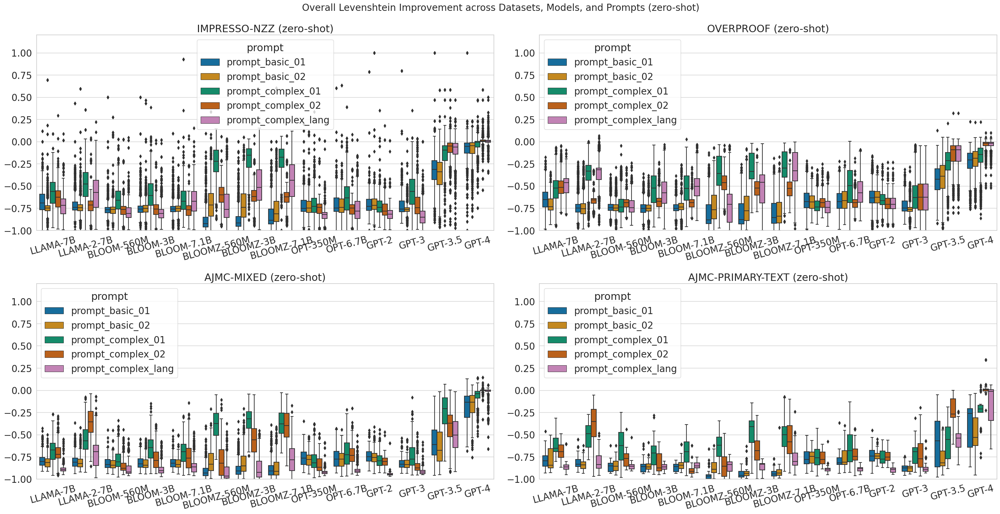

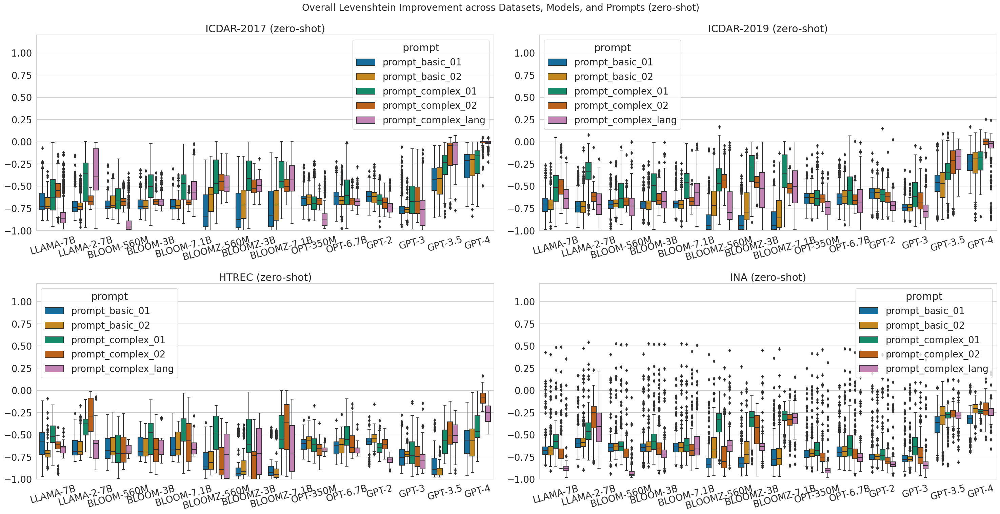

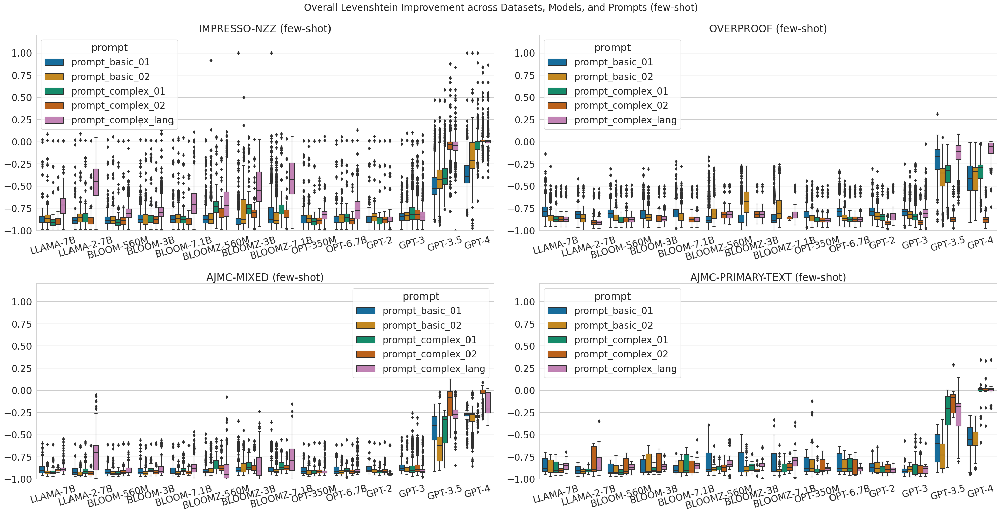

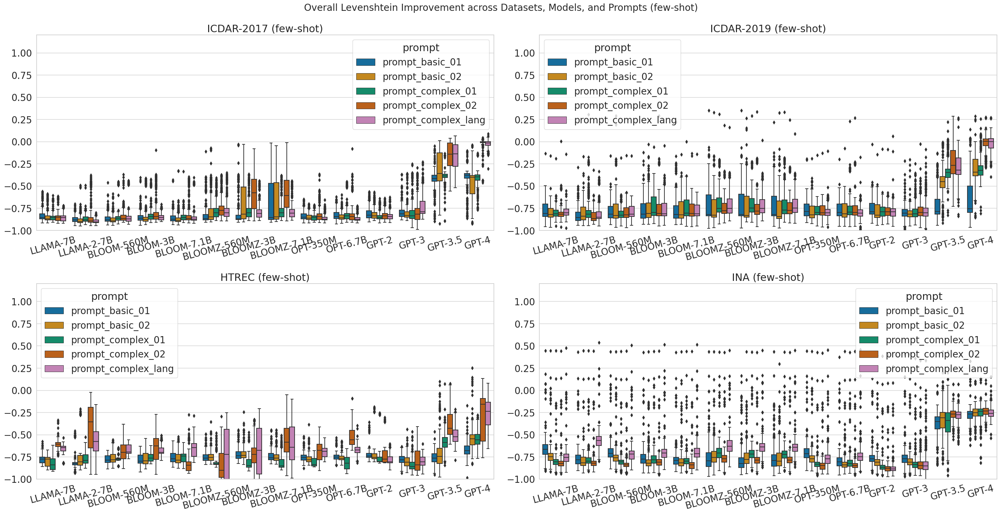

In [101]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import numpy as np
warnings.filterwarnings('ignore')

sns.set_palette('colorblind')
sns.set_context("notebook", font_scale=1.8)
sns.set_style("whitegrid")

# Define OCR noise level bins
bins = [0, 0.4, 0.6, 0.8, 0.99, 1.0]

# Assign OCR noise level labels
labels = ["0-40%", "40-60%", "60-80%", "80-99%", "99-100%"]

# Count the number of unique datasets
n_datasets = data.dataset_name.nunique()
dataset_names = ['impresso-nzz', 'overproof', 'ajmc-mixed', 
                 'ajmc-primary-text', 'icdar-2017', 'icdar-2019', 'htrec', 'ina']

prompt_names = ['prompt_basic_01', 'prompt_basic_02', 'prompt_complex_01', 
                'prompt_complex_02', 'prompt_complex_lang']


n_plots = len(dataset_names)
n_plots_per_figure = 4
n_figures = int(np.ceil(n_plots / n_plots_per_figure))

print(n_figures)

for type_of_experiment in ['zero-shot', 'few-shot']:
# for type_of_experiment in ['language-specific']:
    for error_rate in ['lev']:
        
        for fig_idx in range(n_figures):
            fig, axs = plt.subplots(2, 2, figsize=(30, 15))
            axs = axs.flatten()

            for i in range(n_plots_per_figure):
                idx = fig_idx * n_plots_per_figure + i
                if idx < n_plots:
                    dataset = dataset_names[idx]
                dataset_data = data[(data.dataset_name == dataset) & (data.type == type_of_experiment)]
                # Compute the mean WER across line, sentence, and region levels
                if 'icdar' not in dataset:
                    dataset_data[f'overall-levenshtein-improvement'] = dataset_data[[f'line-{error_rate}-improvement', 
                                                                      f'sentence-{error_rate}-improvement', 
                                                                      f'region-{error_rate}-improvement']].mean(axis=1)
                else:
                    dataset_data[f'overall-levenshtein-improvement'] = dataset_data[[f'sentence-{error_rate}-improvement', 
                                                                  f'region-{error_rate}-improvement']].mean(axis=1)

                try:
                    # Plot the distribution of improvements for each model
                    _ = sns.boxplot(x='model', y=f'overall-levenshtein-improvement', data=dataset_data, 
                                    ax=axs[i], order=MODELS, hue='prompt', hue_order=prompt_names)
                    axs[i].set_title(f'{dataset.upper()} ({type_of_experiment})')

                    axs[i].set_ylim([-1, 1.2])
                    axs[i].set_xticklabels(axs[i].get_xticklabels(), rotation=15)  # Rotate x-axis labels
                    axs[i].set_xlabel('')  # Remove x-axis label
                    axs[i].set_ylabel('')  # Remove y-axis label
                except Exception as ex:
                    print(f'Could not load {dataset} with {ex}')


            # Remove empty subplots
            for i in range(len(data.dataset_name.unique()), len(axs)):
                fig.delaxes(axs[i])

            plt.tight_layout()
            plt.suptitle(f'Overall Levenshtein Improvement across Datasets, Models, and Prompts ({type_of_experiment})', fontsize=20, y=1.02)
            plt.show()


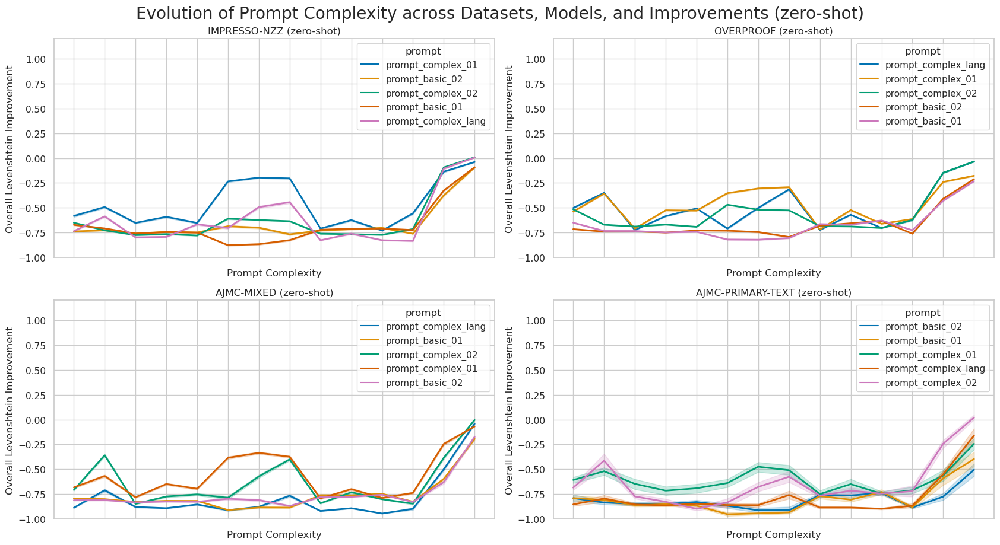

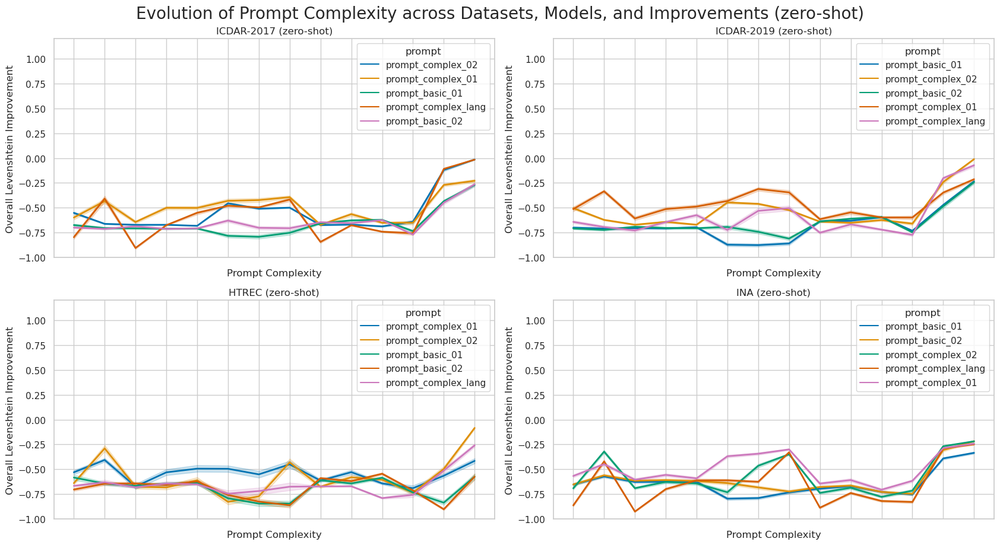

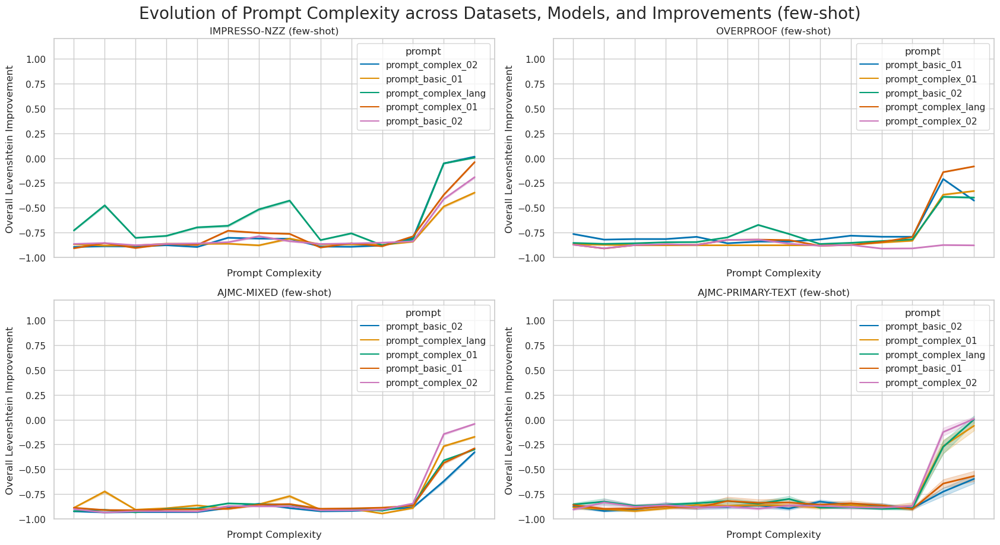

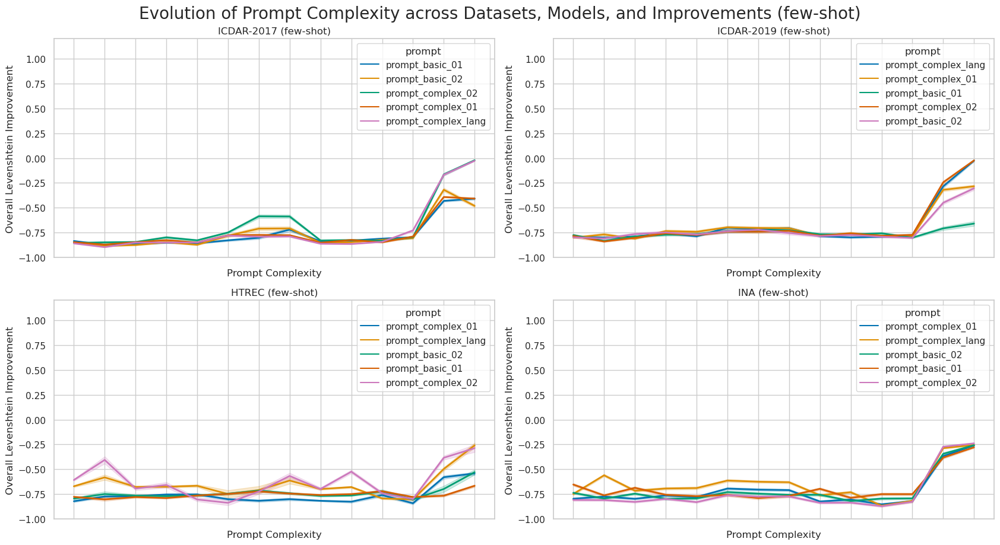

In [86]:
sns.set_palette('colorblind')
sns.set_context("notebook", font_scale=1.)
sns.set_style("whitegrid")

prompt_names = ['prompt_basic_01', 'prompt_basic_02', 'prompt_complex_01', 
                'prompt_complex_02', 'prompt_complex_lang']


for type_of_experiment in ['zero-shot', 'few-shot']:#
    for error_rate in ['lev']:
        for fig_idx in range(n_figures):
            fig, axs = plt.subplots(2, 2, figsize=(17, 9))
            axs = axs.flatten()

            for i in range(n_plots_per_figure):
                idx = fig_idx * n_plots_per_figure + i
                if idx < n_plots:
                    dataset = dataset_names[idx]
                    
                dataset_data = data[(data.dataset_name == dataset) & (data.type == type_of_experiment)]
                
                dataset_data['model'] = pd.Categorical(dataset_data['model'], categories=MODELS, ordered=True)
                
                if 'icdar' not in dataset:
                    dataset_data[f'overall-levenshtein-improvement'] = dataset_data[[f'line-{error_rate}-improvement', 
                                                                      f'sentence-{error_rate}-improvement', 
                                                                      f'region-{error_rate}-improvement']].mean(axis=1)
                else:
                    dataset_data[f'overall-levenshtein-improvement'] = dataset_data[[f'sentence-{error_rate}-improvement', 
                                                                  f'region-{error_rate}-improvement']].mean(axis=1)

                try:
                    # Plot the line plot of improvements for each model
                    _ = sns.lineplot(x='model', y=f'overall-levenshtein-improvement', 
                                     data=dataset_data.sort_values('model'), 
                                    ax=axs[i], hue='prompt', sort=False, linewidth=2)
                    axs[i].set_title(f'{dataset.upper()} ({type_of_experiment})')
                    axs[i].set_ylim([-1, 1.2])
                    axs[i].set_xticklabels(axs[i].get_xticklabels(), rotation=15)
                    axs[i].set_xlabel('Prompt Complexity')  
                    axs[i].set_ylabel('Overall Levenshtein Improvement')  
                except Exception as ex:
                    print(f'Could not load {dataset} with {ex}')

            # Remove empty subplots
            for i in range(len(data.dataset_name.unique()), len(axs)):
                fig.delaxes(axs[i])

            plt.tight_layout()
            plt.suptitle(f'Evolution of Prompt Complexity across Datasets, Models, and Improvements ({type_of_experiment})', fontsize=20, y=1.02)
            plt.show()


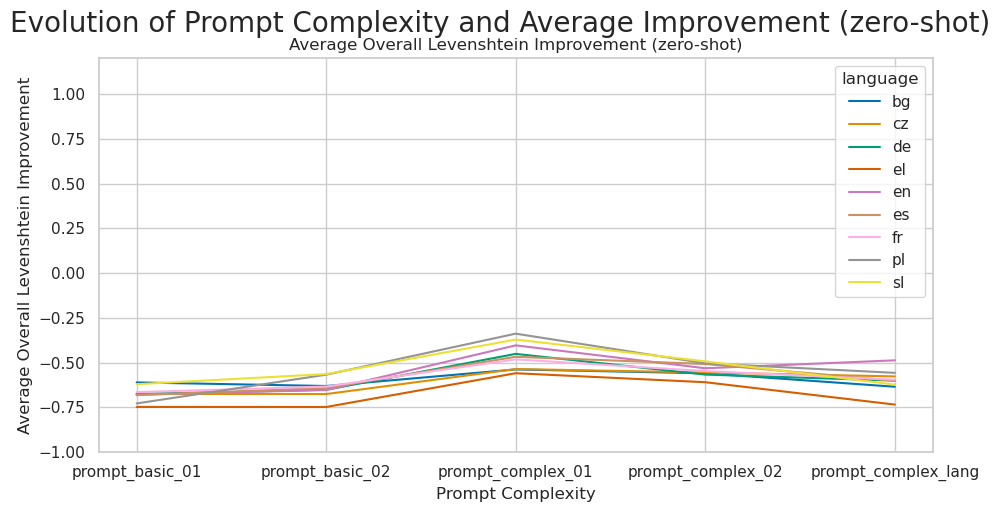

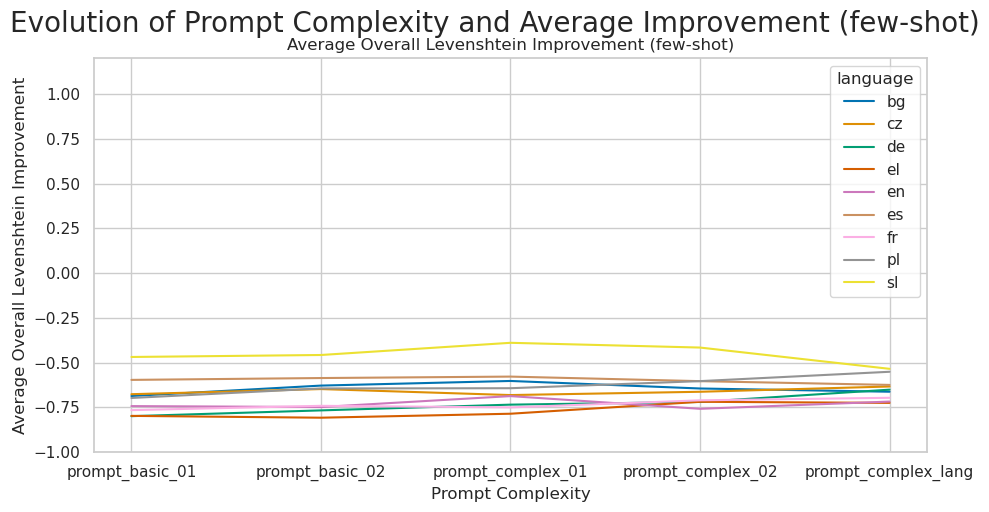

In [87]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import numpy as np
warnings.filterwarnings('ignore')

sns.set_palette('colorblind')
sns.set_context("notebook", font_scale=1)
sns.set_style("whitegrid")

for type_of_experiment in ['zero-shot', 'few-shot']:
    for error_rate in ['lev']:
        # Create a new DataFrame to store the average improvements for each language and prompt
        average_improvements = pd.DataFrame(columns=['prompt', 'language', 'overall-levenshtein-improvement'])

        for language in data.language.unique():  # Iterate over each unique language
            for dataset in dataset_names:
                dataset_data = data[(data.dataset_name == dataset) & (data.language == language) & (data.type == type_of_experiment)]  # Filter data for the current language
                if 'icdar' not in dataset:
                    dataset_data[f'overall-levenshtein-improvement'] = dataset_data[[f'line-{error_rate}-improvement', 
                                                                          f'sentence-{error_rate}-improvement', 
                                                                          f'region-{error_rate}-improvement']].mean(axis=1)
                else:
                    dataset_data[f'overall-levenshtein-improvement'] = dataset_data[[f'sentence-{error_rate}-improvement', 
                                                                      f'region-{error_rate}-improvement']].mean(axis=1)

                # Group the data by prompt and language, then calculate the mean Overall Levenshtein Improvement
                grouped_data = dataset_data.groupby(['prompt', 'language'])[f'overall-levenshtein-improvement'].mean().reset_index()

                # Add the grouped data to the average_improvements DataFrame
                average_improvements = pd.concat([average_improvements, grouped_data])

        # Group the data by prompt and language again, this time averaging the averages for each language and prompt
        average_improvements = average_improvements.groupby(['prompt', 'language'])[f'overall-levenshtein-improvement'].mean().reset_index()

        fig, ax = plt.subplots(figsize=(10, 5))  # Create the plot

        try:
            # Plot the line plot of average improvements for each prompt
            _ = sns.lineplot(x='prompt', y=f'overall-levenshtein-improvement', hue='language', data=average_improvements, 
                             ax=ax, legend='full')  # Add hue='language' to differentiate lines by language
        except Exception as ex:
            print(f'Could not load data with {ex}')

        ax.set_title(f'Average Overall Levenshtein Improvement ({type_of_experiment})')  # Modify title since it's no longer specific to one language
        ax.set_ylim([-1, 1.2])
        ax.set_xlabel('Prompt Complexity')  
        ax.set_ylabel('Average Overall Levenshtein Improvement')

        plt.tight_layout()
        plt.suptitle(f'Evolution of Prompt Complexity and Average Improvement ({type_of_experiment})', fontsize=20, y=1.02)
        plt.show()



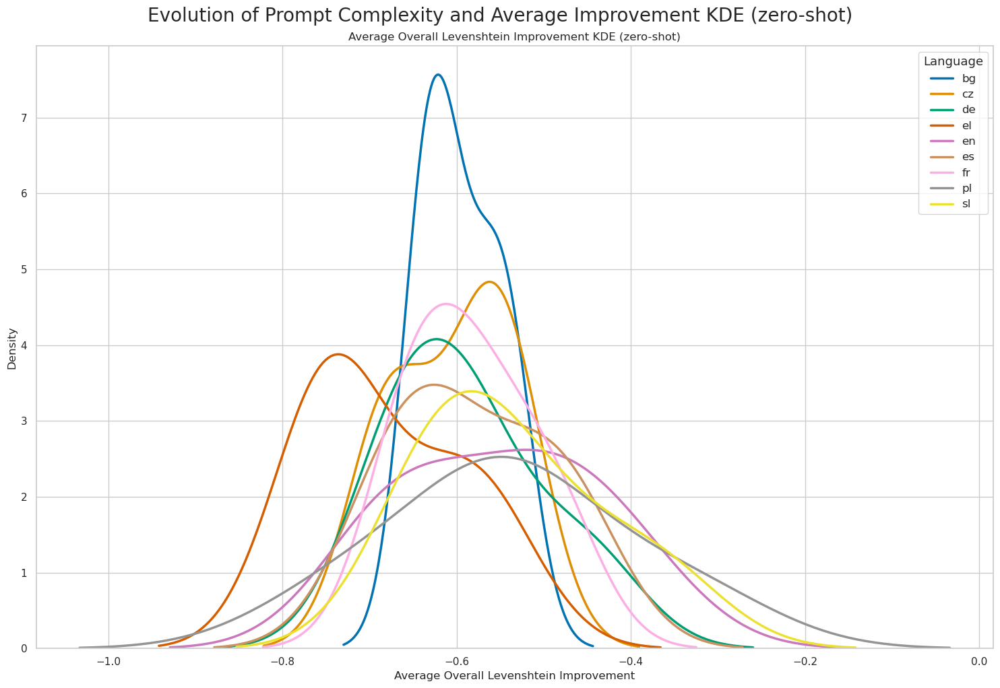

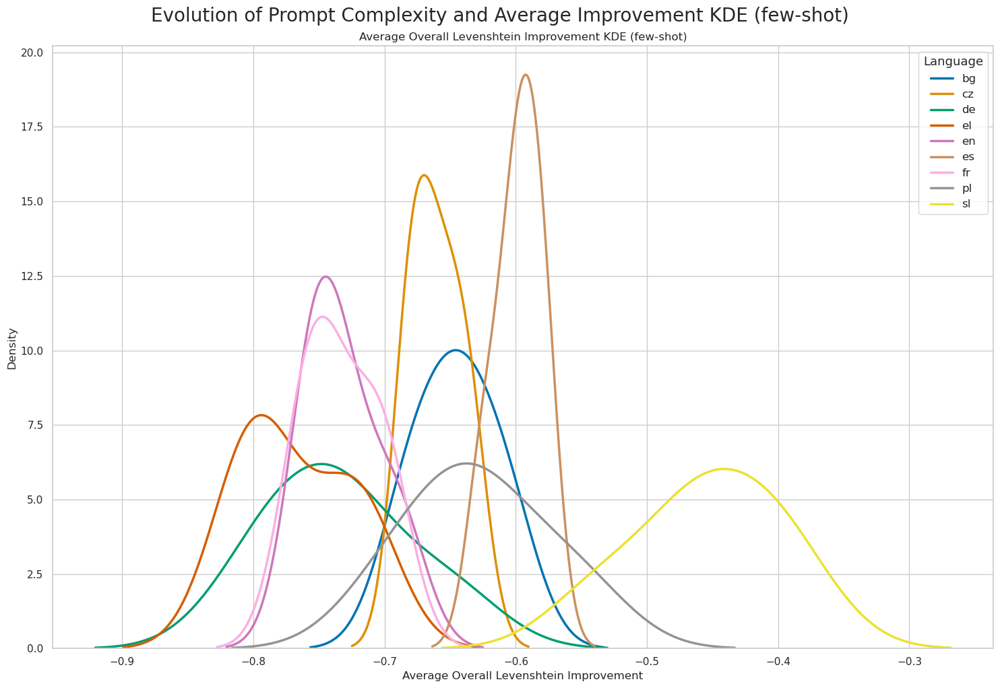

In [89]:
for type_of_experiment in ['zero-shot', 'few-shot']:
    for error_rate in ['lev']:
        # Create a new DataFrame to store the average improvements for each language and prompt
        average_improvements = pd.DataFrame(columns=['prompt', 'language', 'overall-levenshtein-improvement'])

        for language in data.language.unique():  # Iterate over each unique language
            for dataset in dataset_names:
                dataset_data = data[(data.dataset_name == dataset) & (data.language == language) & (data.type == type_of_experiment)]  # Filter data for the current language
                if 'icdar' not in dataset:
                    dataset_data['overall-levenshtein-improvement'] = dataset_data[[f'line-{error_rate}-improvement', 
                                                                          f'sentence-{error_rate}-improvement', 
                                                                          f'region-{error_rate}-improvement']].mean(axis=1)
                else:
                    dataset_data['overall-levenshtein-improvement'] = dataset_data[[f'sentence-{error_rate}-improvement', 
                                                                      f'region-{error_rate}-improvement']].mean(axis=1)

                # Group the data by prompt and language, then calculate the mean Overall Levenshtein Improvement
                grouped_data = dataset_data.groupby(['prompt', 'language'])['overall-levenshtein-improvement'].mean().reset_index()

                # Add the grouped data to the average_improvements DataFrame
                average_improvements = pd.concat([average_improvements, grouped_data])

        # Group the data by prompt and language again, this time averaging the averages for each language and prompt
        average_improvements = average_improvements.groupby(['prompt', 'language'])['overall-levenshtein-improvement'].mean().reset_index()

        fig, ax = plt.subplots(figsize=(15, 10))  # Create the plot

        try:
            # Plot the KDE plot of average improvements for each prompt
            for language in average_improvements.language.unique():
                _ = sns.kdeplot(average_improvements[average_improvements.language == language]['overall-levenshtein-improvement'], 
                                ax=ax, label=language, lw=2.5)  # Increase line width here
        except Exception as ex:
            print(f'Could not load data with {ex}')

        ax.set_title(f'Average Overall Levenshtein Improvement KDE ({type_of_experiment})')  # Modify title since it's no longer specific to one language
        ax.set_xlabel('Average Overall Levenshtein Improvement')
        ax.set_ylabel('Density')

        plt.tight_layout()
        plt.legend(title='Language', title_fontsize='13', fontsize='12')  # Increase legend fontsize here
        plt.suptitle(f'Evolution of Prompt Complexity and Average Improvement KDE ({type_of_experiment})', fontsize=20, y=1.02)
        plt.show()


In [ ]:
data.columns

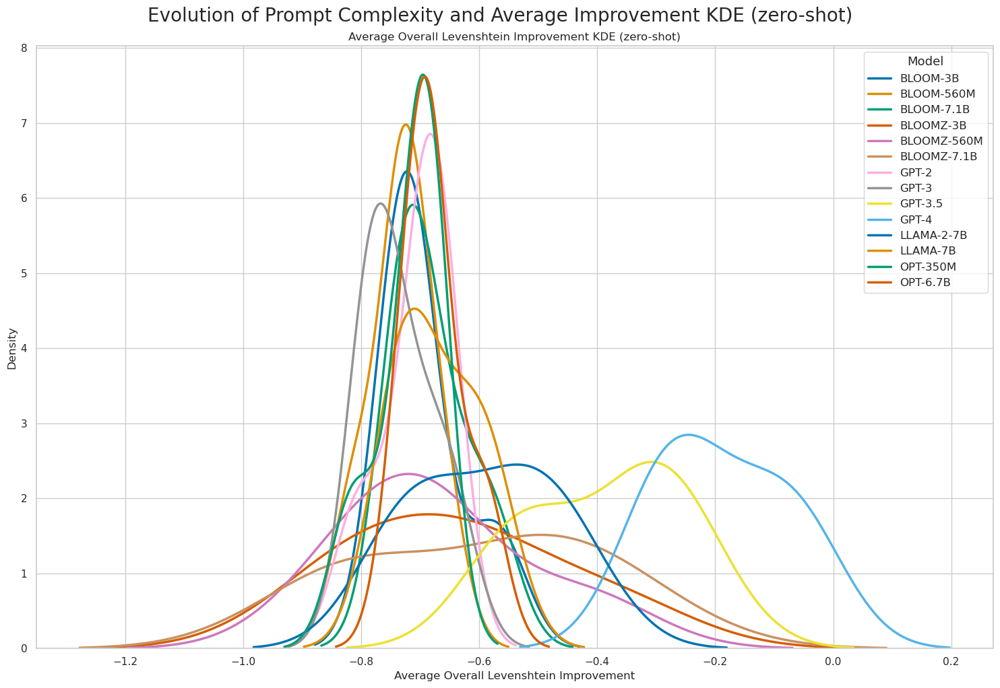

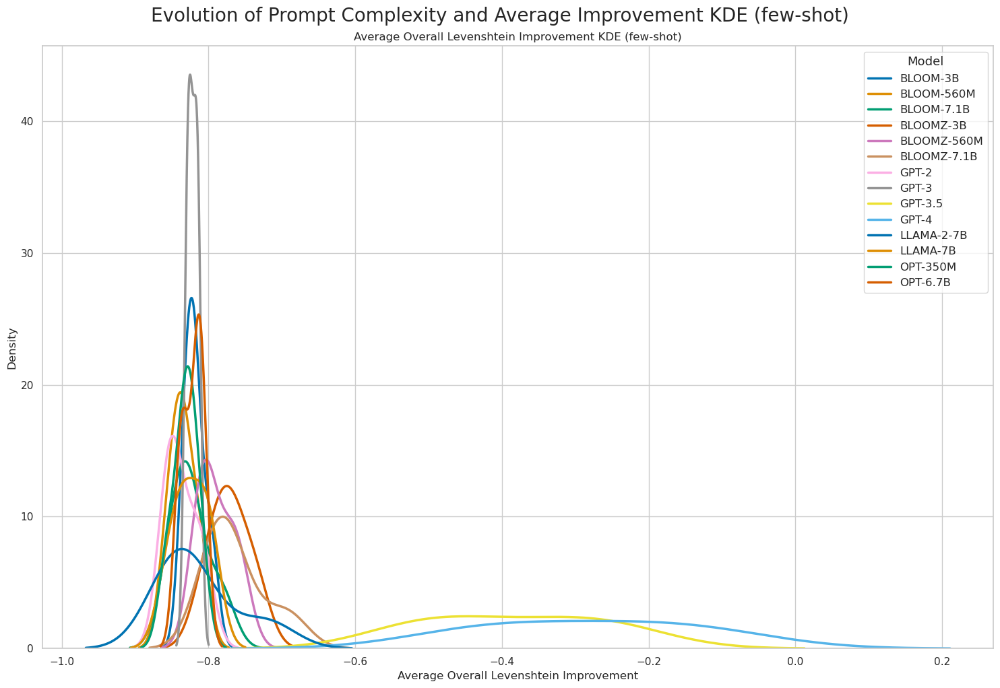

In [90]:
for type_of_experiment in ['zero-shot', 'few-shot']:
    for error_rate in ['lev']:
        # Create a new DataFrame to store the average improvements for each model and prompt
        average_improvements = pd.DataFrame(columns=['prompt', 'model', 'overall-levenshtein-improvement'])

        for model in data.model.unique():  # Iterate over each unique model
            for dataset in dataset_names:
                dataset_data = data[(data.dataset_name == dataset) & (data.model == model) & (data.type == type_of_experiment)]  # Filter data for the current model
                if 'icdar' not in dataset:
                    dataset_data[f'Overall Levenshtein Improvement'] = dataset_data[[f'line-{error_rate}-improvement', 
                                                                          f'sentence-{error_rate}-improvement', 
                                                                          f'region-{error_rate}-improvement']].mean(axis=1)
                else:
                    dataset_data[f'Overall Levenshtein Improvement'] = dataset_data[[f'sentence-{error_rate}-improvement', 
                                                                      f'region-{error_rate}-improvement']].mean(axis=1)

                # Group the data by prompt and model, then calculate the mean Overall Levenshtein Improvement
                grouped_data = dataset_data.groupby(['prompt', 'model'])['overall-levenshtein-improvement'].mean().reset_index()

                # Add the grouped data to the average_improvements DataFrame
                average_improvements = pd.concat([average_improvements, grouped_data])

        # Group the data by prompt and model again, this time averaging the averages for each model and prompt
        average_improvements = average_improvements.groupby(['prompt', 'model'])['overall-levenshtein-improvement'].mean().reset_index()

        fig, ax = plt.subplots(figsize=(15, 10))  # Create the plot

        try:
            # Plot the KDE plot of average improvements for each prompt
            for model in average_improvements.model.unique():
                _ = sns.kdeplot(average_improvements[average_improvements.model == model]['overall-levenshtein-improvement'], 
                                ax=ax, label=model, lw=2.5)  # Increase line width here
        except Exception as ex:
            print(f'Could not load data with {ex}')

        ax.set_title(f'Average Overall Levenshtein Improvement KDE ({type_of_experiment})')  # Modify title since it's no longer specific to one model
        ax.set_xlabel('Average Overall Levenshtein Improvement')
        ax.set_ylabel('Density')

        plt.tight_layout()
        plt.legend(title='Model', title_fontsize='13', fontsize='12')  # Increase legend fontsize here
        plt.suptitle(f'Evolution of Prompt Complexity and Average Improvement KDE ({type_of_experiment})', fontsize=20, y=1.02)
        plt.show()


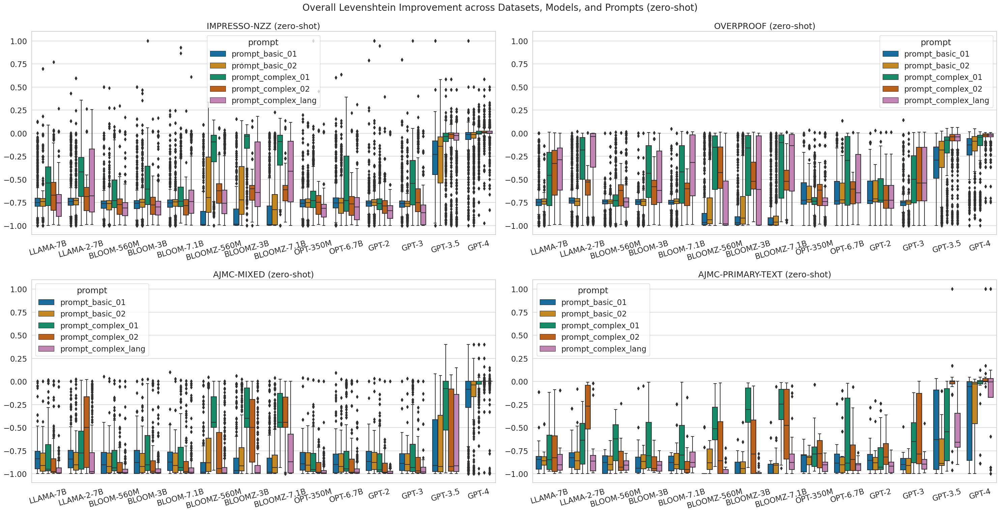

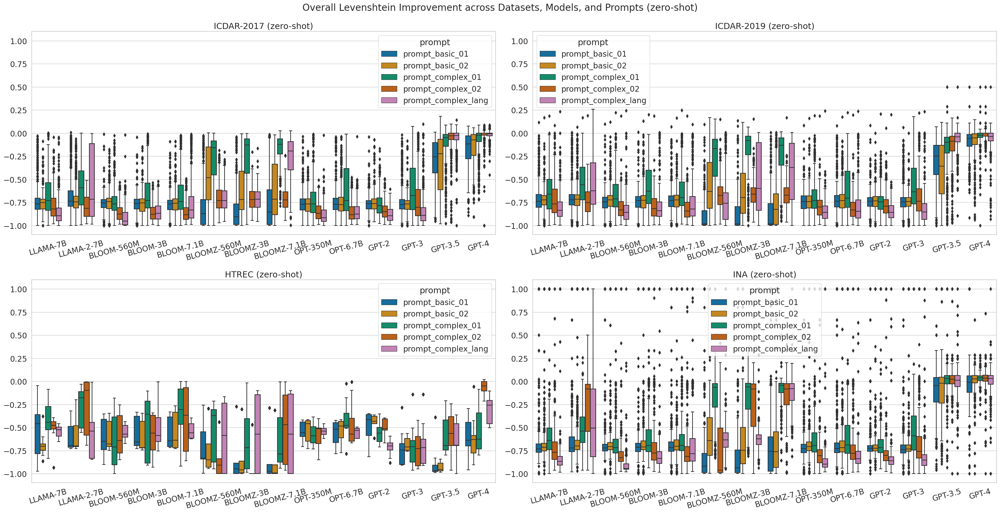

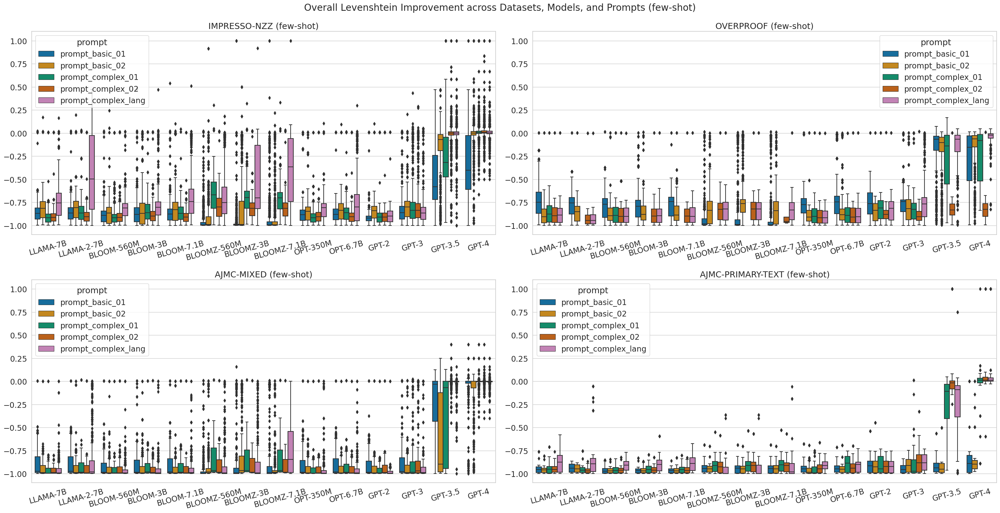

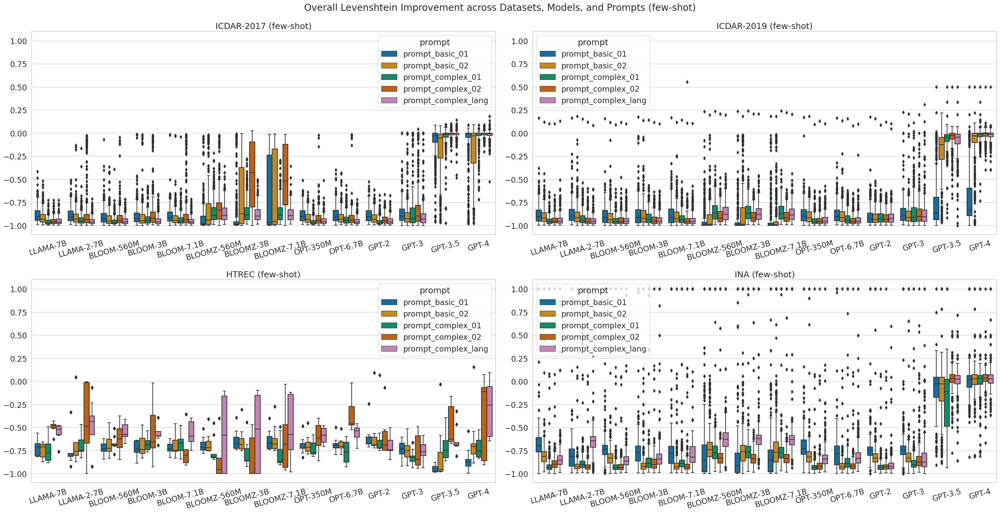

In [91]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import numpy as np
warnings.filterwarnings('ignore')

sns.set_palette('colorblind')
sns.set_context("notebook", font_scale=1.5)
sns.set_style("whitegrid")

# Define OCR noise level bins
bins = [0, 0.4, 0.6, 0.8, 0.99, 1.0]

# Assign OCR noise level labels
labels = ["0-40%", "40-60%", "60-80%", "80-99%", "99-100%"]

# Count the number of unique datasets
n_datasets = data.dataset_name.nunique()
dataset_names = ['impresso-nzz', 'overproof', 'ajmc-mixed', 
                 'ajmc-primary-text', 'icdar-2017', 'icdar-2019', 'htrec', 'ina']

prompt_names = ['prompt_basic_01', 'prompt_basic_02', 'prompt_complex_01', 
                'prompt_complex_02', 'prompt_complex_lang']


n_plots = len(dataset_names)
n_plots_per_figure = 4
n_figures = int(np.ceil(n_plots / n_plots_per_figure))

for type_of_experiment in ['zero-shot', 'few-shot']:
# for type_of_experiment in ['language-specific']:
    for error_rate in ['lev']:
        
        for fig_idx in range(n_figures):
            fig, axs = plt.subplots(2, 2, figsize=(30, 15))
            axs = axs.flatten()

            for i in range(n_plots_per_figure):
                idx = fig_idx * n_plots_per_figure + i
                if idx < n_plots:
                    dataset = dataset_names[idx]
                dataset_data = data[(data.dataset_name == dataset) & (data.type == type_of_experiment)]
                # Compute the mean WER across line, sentence, and region levels
                if 'icdar' not in dataset:
                    dataset_data['overall-levenshtein-improvement'] = dataset_data[[f'sentence-{error_rate}-improvement']].mean(axis=1)
                else:
                    dataset_data['overall-levenshtein-improvement'] = dataset_data[[f'sentence-{error_rate}-improvement']].mean(axis=1)

                try:
                    # Plot the distribution of improvements for each model
                    _ = sns.boxplot(x='model', y='overall-levenshtein-improvement', data=dataset_data, 
                                    ax=axs[i], order=MODELS, hue='prompt', hue_order=prompt_names)
                    axs[i].set_title(f'{dataset.upper()} ({type_of_experiment})')

                    axs[i].set_ylim([-1.1, 1.1])
                    axs[i].set_xticklabels(axs[i].get_xticklabels(), rotation=15)  # Rotate x-axis labels
                    axs[i].set_xlabel('')  # Remove x-axis label
                    axs[i].set_ylabel('')  # Remove y-axis label
                except Exception as ex:
                    print(f'Could not load {dataset} with {ex}')


            # Remove empty subplots
            for i in range(len(data.dataset_name.unique()), len(axs)):
                fig.delaxes(axs[i])

            plt.tight_layout()
            plt.suptitle(f'Overall Levenshtein Improvement across Datasets, Models, and Prompts ({type_of_experiment})', fontsize=20, y=1.02)
            plt.show()


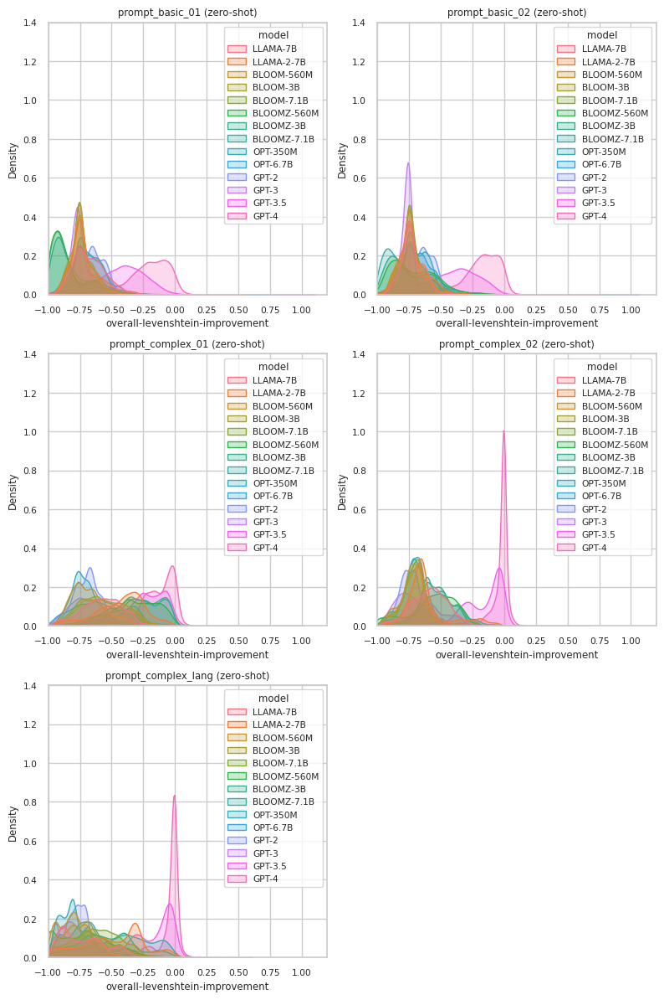

In [93]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_palette('colorblind')
sns.set_context("notebook", font_scale=.7)
sns.set_style("whitegrid")

for type_of_experiment in ['zero-shot']:
    for error_rate in ['lev']:
        fig, axs = plt.subplots(3, 2, figsize=(8, 12))  # Change here
        axs = axs.flatten()  # To make it easy to index

        for i, prompt in enumerate(prompt_names):
            prompt_data = data[(data.prompt == prompt) & (data.type == type_of_experiment)]
            
            if 'icdar' not in dataset:
                prompt_data['overall-levenshtein-improvement'] = prompt_data[[f'line-{error_rate}-improvement', 
                                                                  f'sentence-{error_rate}-improvement', 
                                                                  f'region-{error_rate}-improvement']].mean(axis=1)
            else:
                prompt_data['overall-levenshtein-improvement'] = prompt_data[[f'sentence-{error_rate}-improvement', 
                                                              f'region-{error_rate}-improvement']].mean(axis=1)

            try:
                if len(prompt_data) > 0:
                    sns.kdeplot(data=prompt_data, x='overall-levenshtein-improvement', hue='model', 
                                fill=True, ax=axs[i], hue_order=MODELS)
                    axs[i].set_title(f'{prompt} ({type_of_experiment})')
                    axs[i].set_xlim([-1, 1.2])
                    axs[i].set_ylim([0, 1.4])
            except Exception as ex:
                print(f'Could not plot {prompt} with {ex}')

        # Remove empty subplot
        fig.delaxes(axs[-1])  # Change here

        plt.tight_layout()
        plt.show()
        
# A kernel density estimate (KDE) plot is a method for visualizing the distribution of observations in a dataset, 
# analogous to a histogram. KDE represents the data using a continuous probability density curve in one or more 
# dimensions.

# Relative to a histogram, KDE can produce a plot that is less cluttered and more interpretable, especially when 
# drawing multiple distributions. But it has the potential to introduce distortions if the underlying distribution 
# is bounded or not smooth. Like a histogram, the quality of the representation also depends on the selection of 
# good smoothing parameters.


In [ ]:
data.columns

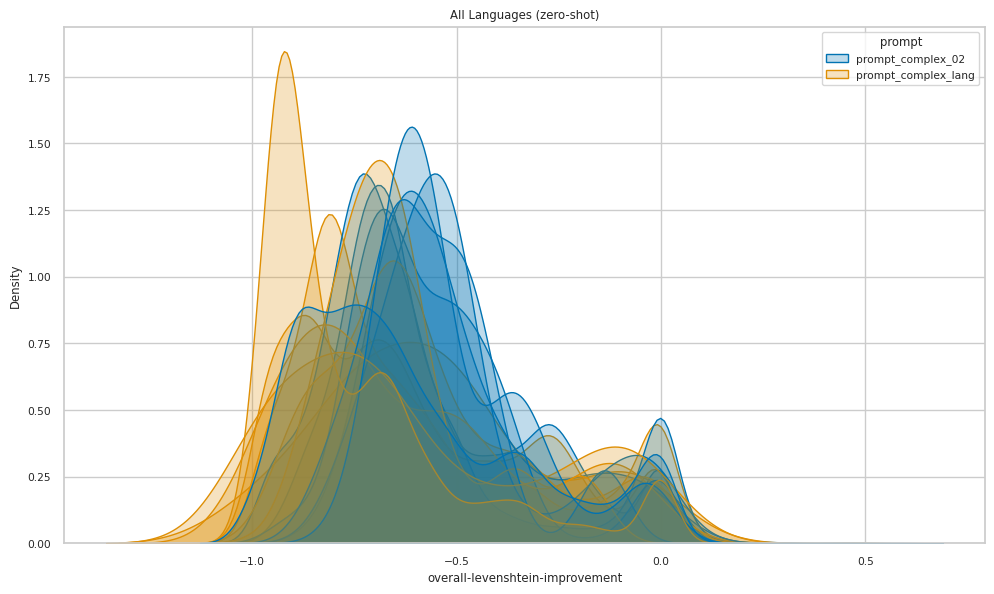

In [94]:
prompts_to_compare = ['prompt_complex_02', 'prompt_complex_lang']
languages = [lang for lang in data['language'].unique() if lang != 'en']  # Exclude 'en' language

for type_of_experiment in ['zero-shot']:
    for error_rate in ['lev']:
        plt.figure(figsize=(10, 6))  # Adjust as necessary

        for language in languages:
            language_data = data[(data.language == language) & 
                                 (data.type == type_of_experiment) & 
                                 (data.prompt.isin(prompts_to_compare))]

            if 'icdar' not in dataset:
                language_data['overall-levenshtein-improvement'] = language_data[[f'line-{error_rate}-improvement', 
                                                                  f'sentence-{error_rate}-improvement', 
                                                                  f'region-{error_rate}-improvement']].mean(axis=1)
            else:
                language_data['overall-levenshtein-improvement'] = language_data[[f'sentence-{error_rate}-improvement', 
                                                              f'region-{error_rate}-improvement']].mean(axis=1)

            try:
                if len(language_data) > 0:
                    sns.kdeplot(data=language_data, x='overall-levenshtein-improvement', hue='prompt', 
                                fill=True, hue_order=prompts_to_compare)
            except Exception as ex:
                print(f'Could not plot {language} with {ex}')

        plt.title(f'All Languages ({type_of_experiment})')
        plt.tight_layout()
        plt.show()


In [ ]:
data.columns

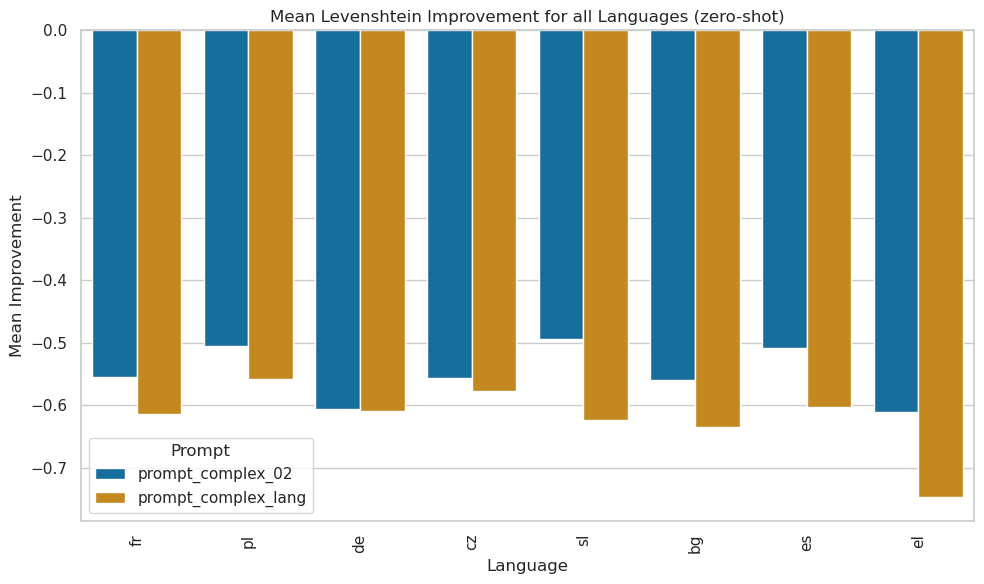

In [95]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_palette('colorblind')
sns.set_context("notebook", font_scale=1.)


prompts_to_compare = ['prompt_complex_02', 'prompt_complex_lang']
languages = [lang for lang in data['language'].unique() if lang != 'en']  # Exclude 'en' language

bar_data = []

for type_of_experiment in ['zero-shot']:
    for error_rate in ['lev']:
        for language in languages:
            for prompt in prompts_to_compare:
                sub_data = data[(data.language == language) & 
                                 (data.type == type_of_experiment) & 
                                 (data.prompt == prompt)]
                if 'icdar' not in dataset:
                    sub_data['overall-levenshtein-improvement'] = sub_data[[f'line-{error_rate}-improvement', 
                                                                          f'sentence-{error_rate}-improvement', 
                                                                          f'region-{error_rate}-improvement']].mean(axis=1)
                else:
                    sub_data['overall-levenshtein-improvement'] = sub_data[[f'sentence-{error_rate}-improvement', 
                                                                      f'region-{error_rate}-improvement']].mean(axis=1)
                
                mean_improvement = np.mean(sub_data['overall-levenshtein-improvement'])
                bar_data.append({'Language': language, 'Prompt': prompt, 'Mean Improvement': mean_improvement})

bar_data = pd.DataFrame(bar_data)

plt.figure(figsize=(10, 6))
sns.barplot(x='Language', y='Mean Improvement', hue='Prompt', data=bar_data, hue_order=prompts_to_compare)
plt.title(f'Mean Levenshtein Improvement for all Languages ({type_of_experiment})')
plt.xticks(rotation=90)  # Rotate x-axis labels for better visibility
plt.tight_layout()
plt.show()


In [ ]:
data.columns

In [ ]:
data.dataset_name.unique()

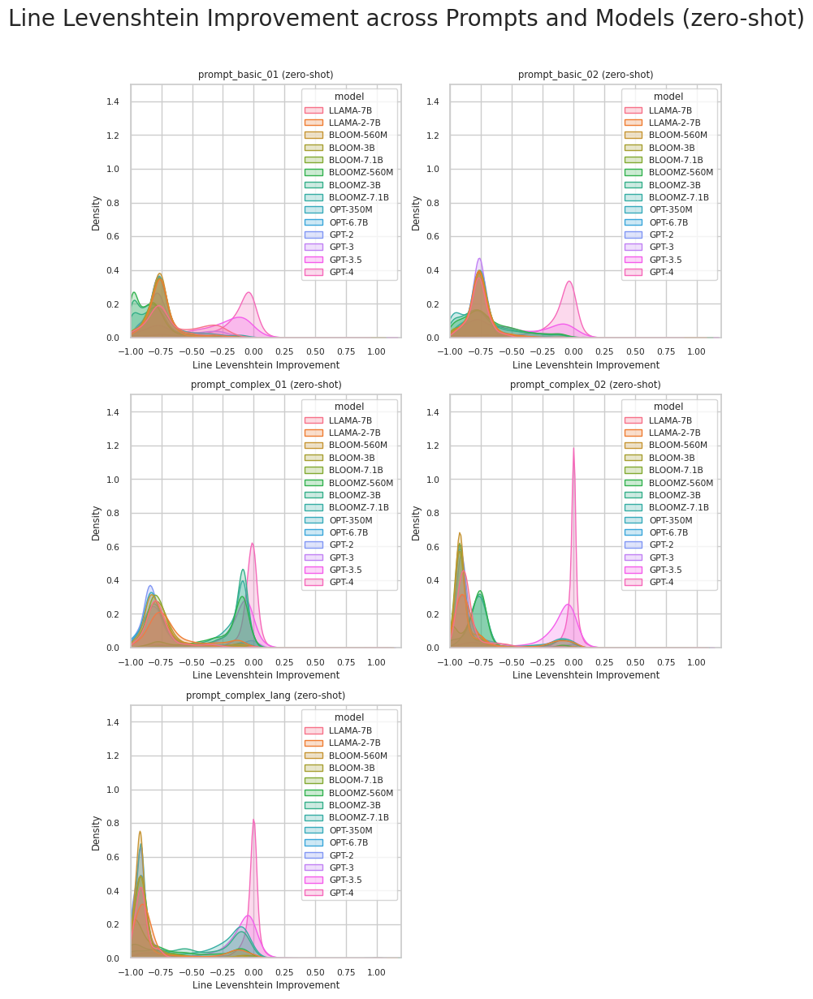

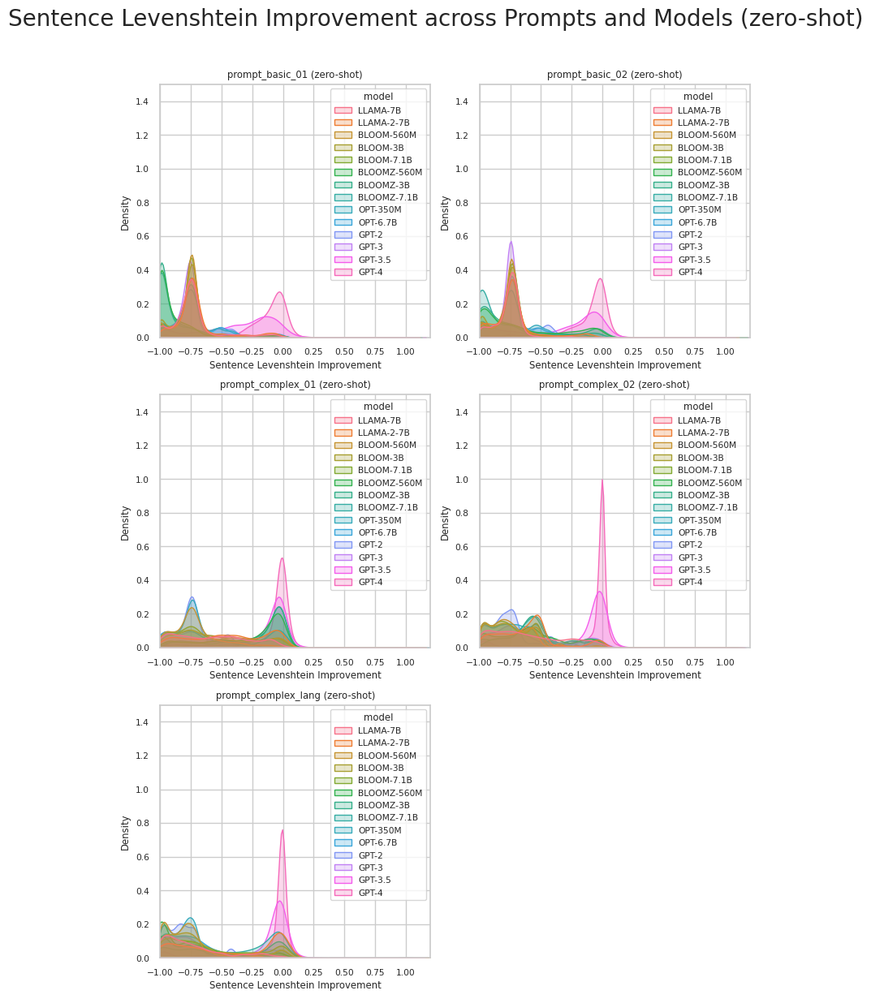

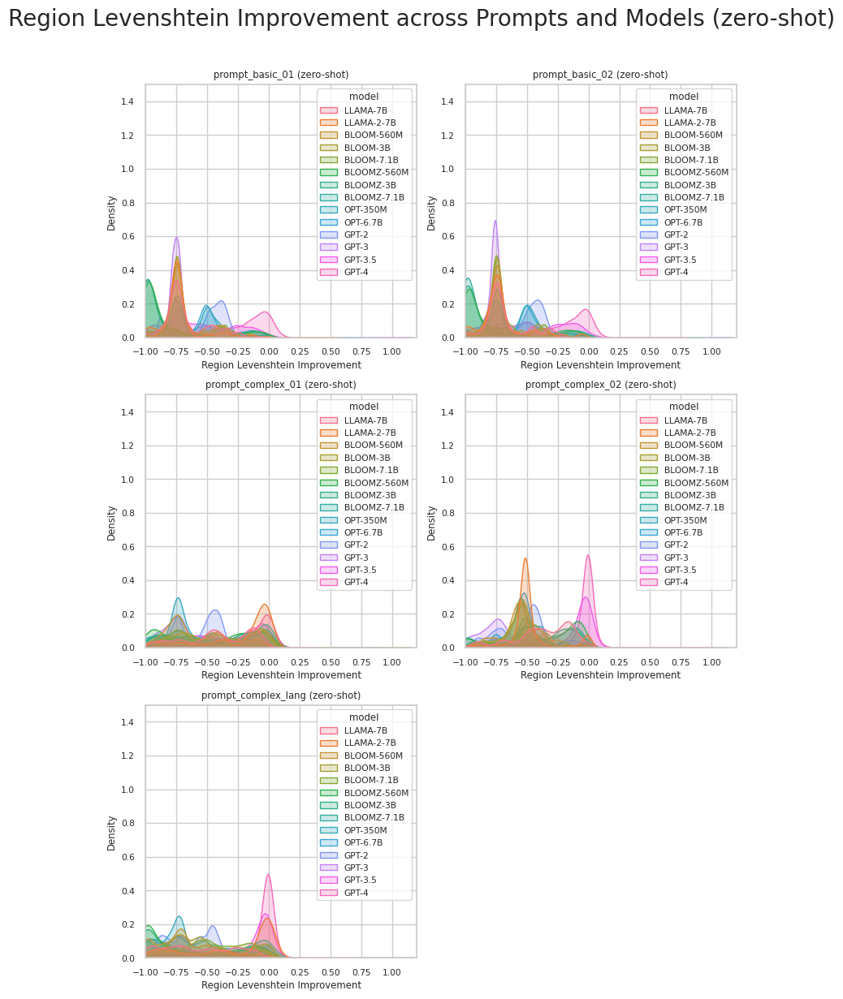

In [96]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_palette('colorblind')
sns.set_context("notebook", font_scale=.7)

segmentations = ['line', 'sentence', 'region']

for type_of_experiment in ['zero-shot']:
    for error_rate in ['lev']:
        for segmentation in segmentations:
            fig, axs = plt.subplots(3, 2, figsize=(8, 12))  # Change here
            axs = axs.flatten()  # To make it easy to index

            for i, prompt in enumerate(prompt_names):
                prompt_data = data[(data.prompt == prompt) & (data.type == type_of_experiment)]
                if segmentation == 'line':
                    prompt_data = prompt_data[~prompt_data.dataset_name.isin(['icdar-2017', 'icdar-2019'])]
                prompt_data[f'{segmentation.capitalize()} Levenshtein Improvement'] = prompt_data[f'{segmentation}-{error_rate}-improvement']

                try:
                    if len(prompt_data) > 0:
                        sns.kdeplot(data=prompt_data, x=f'{segmentation.capitalize()} Levenshtein Improvement', 
                                    hue='model', fill=True, ax=axs[i], hue_order=MODELS)
                        axs[i].set_title(f'{prompt} ({type_of_experiment})')
                        axs[i].set_xlim([-1, 1.2])
                        axs[i].set_ylim([0, 1.5])
                except Exception as ex:
                    print(f'Could not plot {prompt} with {ex}')

            # Remove empty subplot
            fig.delaxes(axs[-1])  # Change here

            plt.suptitle(f'{segmentation.capitalize()} Levenshtein Improvement across Prompts and Models ({type_of_experiment})', fontsize=20, y=1.02)
            plt.tight_layout()
            plt.show()


In [ ]:
data.columns

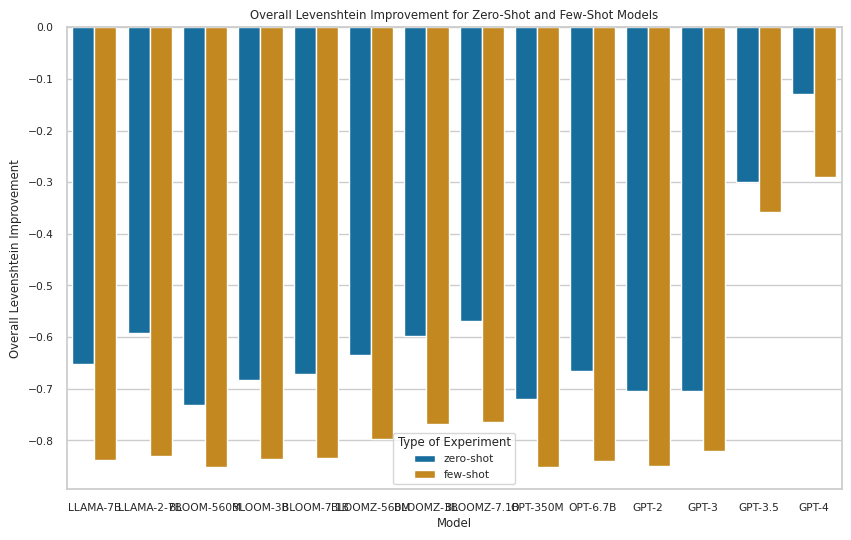

In [97]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

results_df = []  # Define results as a list


for type_of_experiment in ['zero-shot', 'few-shot']:
    for model in MODELS:
        model_data = data[(data.model == model) & (data.type == type_of_experiment)]
        
        # Compute the mean Levenshtein Improvement across line, sentence, and region levels
        if 'icdar' not in dataset:
            model_data['overall-levenshtein-improvement'] = model_data[[f'line-lev-improvement', 
                                                                        f'sentence-lev-improvement', 
                                                                        f'region-lev-improvement']].mean(axis=1)
        else:
            model_data['overall-levenshtein-improvement'] = model_data[[f'sentence-lev-improvement', 
                                                                        f'region-lev-improvement']].mean(axis=1)

        # Append the results
#         print(model_data['Improvement Band'].unique())
        results_df.append({'Model': model,
                        'Type of Experiment': type_of_experiment,
                        'Overall Levenshtein Improvement': np.nanmean(model_data['overall-levenshtein-improvement'])})

# Convert the results list to a DataFrame for plotting
results_df = pd.DataFrame(results_df)

# Create the plot
plt.figure(figsize=(10,6))
sns.barplot(x='Model', y='Overall Levenshtein Improvement', hue='Type of Experiment', data=results_df, order=MODELS)
plt.title('Overall Levenshtein Improvement for Zero-Shot and Few-Shot Models')
plt.show()
